# This notebook contains the code to reproduce the main figures of the manuscript titled "_Blood RNA Signatures Predict Recent Tuberculosis Exposure in Mice, Macaques and Humans_"

Only Ingenuity Pathway Analysis for Figure 5E is excluded (commercial software)

It is recommended that jupyter extensions are used to allow easy display and review of the code:
    - https://github.com/ipython-contrib/jupyter_contrib_nbextensions
    
All code was run with access to a 128 GB RAM machine with 48 CPU cores. This amount of memory and CPU-cores is not necessary for all calculations, but may be necessary to some of the calls to the caret package (machine learning hyperparameter searches).
    
All code written during the development of this project is in "Time Since Infection RNA_Paper_Analysis.ipynb" and may be reviewed. However, it is not structured for easy, streamlined running of all code.

There are very small differences in p-values between Figures 2-4 (only 4A for Figure 4) herein compared to the original analysis reported in the paper, due the absence of setting a random seed before several random hyperparameter searches on training sets. The ultimate results are insensitive to these very small differences in random parameter settings.

In [3]:
path="."  # this is the TB repository folder

## The following code shows the software packages installed in the environment used to produce the analyses of the paper. In each section of the analysis, code is provided for installing needed R dependencies

### R environment (R 3.4.3)

In [44]:
ipacks = installed.packages()
ipacks

# To access a specific package's version info:
ipacks["pROC",]

,Package,LibPath,Version,Priority,Depends,Imports,LinkingTo,Suggests,Enhances,License,License_is_FOSS,License_restricts_use,OS_type,MD5sum,NeedsCompilation,Built
acepack,acepack,/master/rault/anaconda3/envs/TB/lib/R/library,1.4.1,NA,NA,NA,NA,testthat,NA,MIT + file LICENSE,NA,NA,NA,NA,yes,3.4.3
akima,akima,/master/rault/anaconda3/envs/TB/lib/R/library,0.6-2,NA,R (>= 2.0.0),sp,NA,NA,NA,ACM | file LICENSE,NA,yes,NA,NA,yes,3.4.3
annotate,annotate,/master/rault/anaconda3/envs/TB/lib/R/library,1.56.2,NA,"R (>= 2.10), AnnotationDbi (>= 1.27.5), XML","Biobase, DBI, xtable, graphics, utils, stats, methods, BiocGenerics (>= 0.13.8), RCurl",NA,"hgu95av2.db, genefilter, Biostrings (>= 2.25.10), IRanges, rae230a.db, rae230aprobe, tkWidgets, GO.db, org.Hs.eg.db, org.Mm.eg.db, hom.Hs.inp.db, humanCHRLOC, Rgraphviz, RUnit,",NA,Artistic-2.0,NA,NA,NA,NA,no,3.4.3
AnnotationDbi,AnnotationDbi,/master/rault/anaconda3/envs/TB/lib/R/library,1.40.0,NA,"R (>= 2.7.0), methods, utils, stats4, BiocGenerics (>= 0.23.1), Biobase (>= 1.17.0), IRanges","methods, utils, DBI, RSQLite, stats4, BiocGenerics, Biobase, S4Vectors (>= 0.9.25), IRanges",NA,"DBI (>= 0.2-4), RSQLite (>= 0.6-4), hgu95av2.db, GO.db, org.Sc.sgd.db, org.At.tair.db, KEGG.db, RUnit, TxDb.Hsapiens.UCSC.hg19.knownGene, hom.Hs.inp.db, org.Hs.eg.db, reactome.db, AnnotationForge, graph, EnsDb.Hsapiens.v75, BiocStyle, knitr",NA,Artistic-2.0,NA,NA,NA,NA,no,3.4.3
assertthat,assertthat,/master/rault/anaconda3/envs/TB/lib/R/library,0.2.0,NA,NA,tools,NA,testthat,NA,GPL-3,NA,NA,NA,NA,no,3.4.3
backports,backports,/master/rault/anaconda3/envs/TB/lib/R/library,1.1.2,NA,R (>= 3.0.0),utils,NA,NA,NA,GPL-2,NA,NA,NA,NA,yes,3.4.3
base,base,/master/rault/anaconda3/envs/TB/lib/R/library,3.4.3,base,NA,NA,NA,methods,NA,Part of R 3.4.3,NA,NA,NA,NA,NA,3.4.3
base64,base64,/master/rault/anaconda3/envs/TB/lib/R/library,2.0,NA,NA,openssl,NA,NA,NA,MIT + file LICENSE,NA,NA,NA,NA,no,3.4.3
base64enc,base64enc,/master/rault/anaconda3/envs/TB/lib/R/library,0.1-3,NA,R (>= 2.9.0),NA,NA,NA,png,GPL-2 | GPL-3,NA,NA,NA,NA,yes,3.4.3
BH,BH,/master/rault/anaconda3/envs/TB/lib/R/library,1.65.0-1,NA,NA,NA,NA,NA,NA,BSL-1.0,NA,NA,NA,NA,no,3.4.3


Package 
                                                                  "pROC" 
                                                                 LibPath 
                         "/master/rault/anaconda3/envs/TB/lib/R/library" 
                                                                 Version 
                                                                "1.12.0" 
                                                                Priority 
                                                                      NA 
                                                                 Depends 
                                                           "R (>= 2.14)" 
                                                                 Imports 
                      "plyr, utils, methods, Rcpp (>= 0.11.1), ggplot2," 
                                                               LinkingTo 
                                                                  "Rcpp" 
                                                                Suggests 
"microbenchmark, tcltk, MASS, logcondens, doParallel,\ntestthat, vdiffr" 
                                                                Enhances 
                                                                      NA 
                                                                 License 
                                                            "GPL (>= 3)" 
                                                         License_is_FOSS 
                                                                      NA 
                                                   License_restricts_use 
                                                                      NA 
                                                                 OS_type 
                                                                      NA 
                                                                  MD5sum 
                                                                      NA 
                                                        NeedsCompilation 
                                                                   "yes" 
                                                                   Built 
                                                                 "3.4.3"

In [45]:
print(ipacks)

                      Package                
acepack               "acepack"              
akima                 "akima"                
annotate              "annotate"             
AnnotationDbi         "AnnotationDbi"        
assertthat            "assertthat"           
backports             "backports"            
base                  "base"                 
base64                "base64"               
base64enc             "base64enc"            
BH                    "BH"                   
BiasedUrn             "BiasedUrn"            
bindr                 "bindr"                
bindrcpp              "bindrcpp"             
Biobase               "Biobase"              
BiocGenerics          "BiocGenerics"         
BiocInstaller         "BiocInstaller"        
BiocParallel          "BiocParallel"         
biomaRt               "biomaRt"              
bit                   "bit"                  
bit64                 "bit64"                
bitops                "bitops"    

### Conda environment (for both python and R packages)
 - Most of the python packages are not needed for this paper's analyses
 - The conda environment (including both python and R packages) is described in the env_list.txt and environment.yml files

## Figure 1 Mouse Analysis

- This code reproduces the analysis of Figure 1, showing that "Blood genome-wide RNA expression accurately discriminates early vs. late M.tb infection time periods in C57BL/6 mice"

    - For review, this code requires reviewer access for the accession number of this paper. To reproduce this analysis with these data, please download the SOFT file for the full family data from the accession page (Scope: Family; Format: SOFT; Amount: Full; GEO accession: GSE124688; click "GO") using the Reviewer access token.

    - Place this SOFT file in the data/GSE124688 folder and rename it "GSE124688_family.soft"

### Load Libraries

In [223]:
if (!require("preprocessCore")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("preprocessCore")
  library("preprocessCore")
}

source("https://bioconductor.org/biocLite.R")
if (!require("Biobase")) {
  biocLite("Biobase")
  library("Biobase")
}

if (!require("GEOquery")) {
  biocLite("GEOquery")
  library("GEOquery")
}

if (!require("ggplot2")) {
  install.packages("ggplot2")
  library("ggplot2")
}

if (!require("randomForest")) {
  install.packages("randomForest")
  library("randomForest")
}

if (!require("cowplot")) {
  install.packages("cowplot")
  library("cowplot")
}

if (!require("pROC")) {
    # pROC 1.12.0 is required, and may not be the default installation:
    packageUrl<- "https://cran.r-project.org/src/contrib/Archive/pROC/pROC_1.12.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("pROC")
}

Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install


### Load and preprocess the data

In [ ]:
# In case this variable was not defined above, please do so here.
path="."  # this is the TB repository folder

In [178]:
source("utils_submission.R")

mouse.path = paste(path, "/data/GSE124688", sep="")
soft.mouse.file.name = "GSE124688_family.soft"
mouse.soft = getGEO(filename=paste(mouse.path, soft.mouse.file.name, sep="/"))
gsmlist = GSMList(mouse.soft)

Reading file....
Parsing....
Found 27 entities...
GPL6887 (1 of 28 entities)
GSM3541213 (2 of 28 entities)
GSM3541214 (3 of 28 entities)
GSM3541215 (4 of 28 entities)
GSM3541216 (5 of 28 entities)
GSM3541217 (6 of 28 entities)
GSM3541218 (7 of 28 entities)
GSM3541219 (8 of 28 entities)
GSM3541220 (9 of 28 entities)
GSM3541221 (10 of 28 entities)
GSM3541222 (11 of 28 entities)
GSM3541223 (12 of 28 entities)
GSM3541224 (13 of 28 entities)
GSM3541225 (14 of 28 entities)
GSM3541226 (15 of 28 entities)
GSM3541227 (16 of 28 entities)
GSM3541228 (17 of 28 entities)
GSM3541229 (18 of 28 entities)
GSM3541230 (19 of 28 entities)
GSM3541231 (20 of 28 entities)
GSM3541232 (21 of 28 entities)
GSM3541233 (22 of 28 entities)
GSM3541234 (23 of 28 entities)
GSM3541235 (24 of 28 entities)
GSM3541236 (25 of 28 entities)
GSM3541237 (26 of 28 entities)
GSM3541238 (27 of 28 entities)


In [ ]:
# Make the data matrix from the VALUE columns from each GSM, a matrix of detection Pvalues and the pheno data

# Parse the expression matrix
mouse.exprs <- do.call('cbind',lapply(gsmlist,function(x) 
                                      {tab <- Table(x)
                                       return(tab$VALUE)
                                     }))
mouse.exprs <- data.frame(apply(mouse.exprs,2,function(x) {as.numeric(as.character(x))}))
rownames(mouse.exprs) = Table(gsmlist[[1]])$ID_REF

# Parse the Detection P value matrix
detectPval.matrix = do.call('cbind',lapply(gsmlist,function(x) 
                                      {tab <- Table(x)
                                       return(tab[, "Detection Pval"])
                                     }))
detectPval.matrix <- data.frame(apply(detectPval.matrix,2,function(x) {as.numeric(as.character(x))}))
rownames(detectPval.matrix) = Table(gsmlist[[1]])$ID_REF       

# Parse the pheno table
pheno = do.call('rbind', lapply(gsmlist, function(x)
    {chars = Meta(x)$characteristics_ch1
     newchars = chars
     newnames = chars
     i = 1
     for (char in chars) {
         new.name = strsplit(char, split=":")[[1]][1]
        new.data = as.character(sapply(char, function(x) {return(trimws(strsplit(x, split=":")[[1]][2]))}))
         newchars[i] = new.data
         newnames[i] = new.name
         i = i + 1
     }
     return(newchars)}
))

colnames(pheno) = c("strain", "infection.status", "time.point.days", "tissue", "gender")
pheno.data = data.frame(pheno)
pheno.data$time.point.days = as.numeric(as.character(pheno.data$time.point.days))

In [220]:
# Filter probes with a detection P value <= 0.01 in at least 10% of mice
det_pval_thresh = 0.01
PAL.10  = apply(detectPval.matrix <= det_pval_thresh, 1, mean) >= 0.10
mouse.exprs.fil = mouse.exprs[PAL.10,]

# Quantile normalize the data
mouse.exprs.qn = as.data.frame(normalize.quantiles(as.matrix(mouse.exprs.fil)))
colnames(mouse.exprs.qn) = colnames(mouse.exprs.fil)
rownames(mouse.exprs.qn) = rownames(mouse.exprs.fil)

# Set all values <10 to 10
mouse.exprs.qn[mouse.exprs.qn < 10] = 10

# Filter probes by two-fold change in expression from the median in at least 10% of samples (10% 2 fold above, or 10% 2 fold below)
med.exprs = mouse.exprs.qn / apply(mouse.exprs.qn, 1, median)
var.genes = (apply((med.exprs > 2.00) , 1, mean) > 0.10) | (apply((med.exprs < 0.50) , 1, mean) > 0.10)

mouse.exprs.qn = mouse.exprs.qn[var.genes,]

# Log2 transform data
mouse.exprs.log = log2(mouse.exprs.qn + 1)

In [224]:
dim(mouse.exprs.log)

[1] 1650   26

### Figure 1A (Principle Component Analysis of all mice)

In [225]:
PCA.mouse.all = prcomp(t(mouse.exprs.log), scale.=T)
gg.PCA.mouse.all = as.data.frame(PCA.mouse.all$x[,1:5])
gg.PCA.mouse.all$infection.status = pheno.data$infection.status

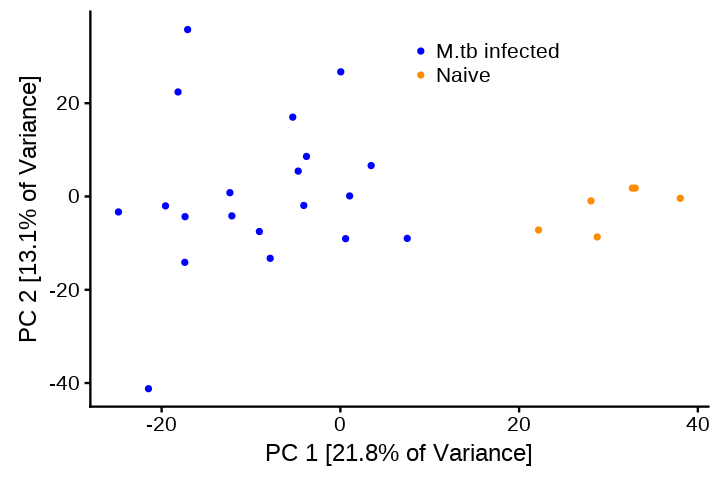

In [264]:
# Principle Component Analysis of Infected vs. Uninfected
std_dev = PCA.mouse.all$sdev
pr_var = std_dev^2
prop_varex = pr_var / sum(pr_var)

Infect.PCA.plot = ggplot(data=gg.PCA.mouse.all, aes(x=PC1, y= PC2)) +
            geom_point(aes(col=infection.status), size=1) + scale_color_manual(name="",
                                                              labels=c("M.tb infected", "Naive"),
                                                              values=c("Mtb"="blue", "Naive"="darkorange")) +
theme(legend.position=c(0.55,0.9))  + 
labs(x=paste("PC 1 [", format(prop_varex[1]*100, digits=3, nsmall=1), "% of Variance]", sep=""), 
     y=paste("PC 2 [", format(prop_varex[2]*100, digits=3, nsmall=1), "% of Variance]", sep="")) +
theme(legend.position=c(0.5,0.90))
Infect.PCA.plot

### Figure 1B (Principle Component Analysis of infected mice)

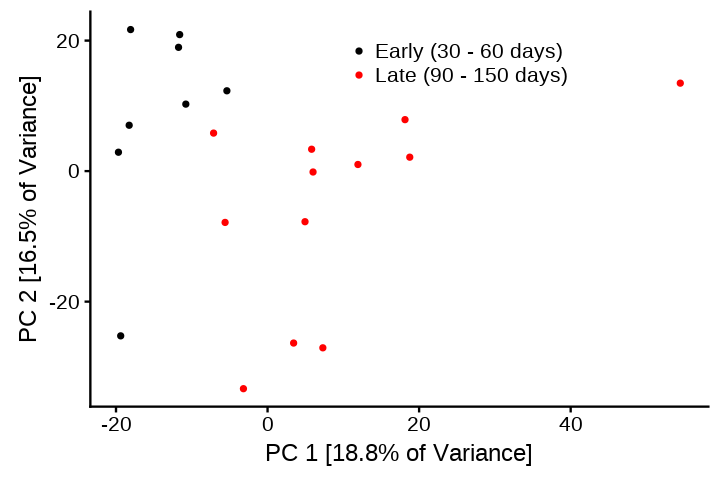

In [268]:
mouse.exprs.Mtb = mouse.exprs.log[,pheno.data$infection.status == "Mtb"]
PCA.mouse.Mtb = prcomp(t(mouse.exprs.Mtb), scale.=T)
gg.PCA.mouse.Mtb = as.data.frame(PCA.mouse.Mtb$x[,1:5])

std_dev = PCA.mouse.Mtb$sdev
pr_var = std_dev^2
prop_varex = pr_var / sum(pr_var)

stage = ifelse(pheno.data[pheno.data$infection.status=="Mtb",]$time.point.days <= 60,
               "early",
               "late")

gg.PCA.mouse.Mtb$stage = as.factor(stage)

Time.PCA.plot = ggplot(data=gg.PCA.mouse.Mtb, aes(x=PC1, y= PC2)) +
            geom_point(aes(col=stage), size=1) + scale_color_manual(name="",
                                                              labels=c("Early (30 - 60 days)", "Late (90 - 150 days)"),
                                                              values=c("early"="black", "late"="red")) +
                theme(legend.position=c(0.50,0.90), legend.text = element_text(size=12))  + 
                labs(x=paste("PC 1 [", format(prop_varex[1]*100, digits=3, nsmall=1), "% of Variance]", sep=""), 
                     y=paste("PC 2 [", format(prop_varex[2]*100, digits=3, nsmall=1), "% of Variance]", sep="")) +
            theme(legend.position=c(0.4,0.90))

Time.PCA.plot

### Figure 1C (Classification of early vs. late time periods post-infection)

In [250]:
set.seed(100)

mouse.table.class = as.data.frame(t(mouse.exprs.log[,pheno.data$infection.status == "Mtb"]))
mouse.table.class$stage = as.factor(stage)
mouse.rf.class = randomForest(stage~., data=mouse.table.class)

[1] "This is the AUC:"
Area under the curve: 0.9896
[1] "This is the AUC p-value:"
[1] 1.58768e-05
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.9607-1 (DeLong)


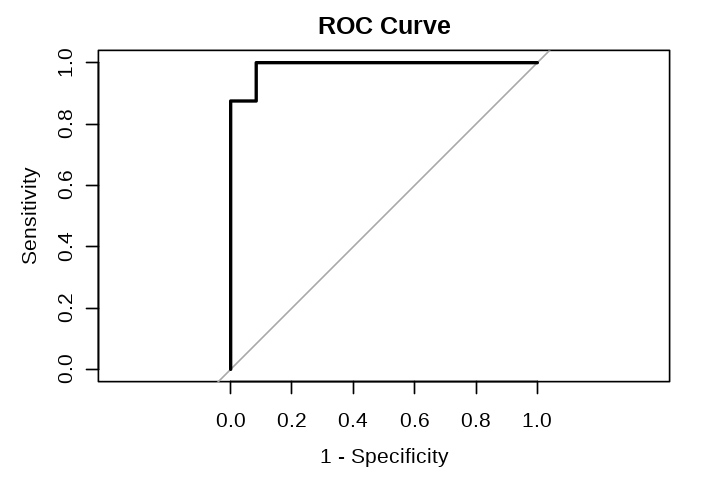

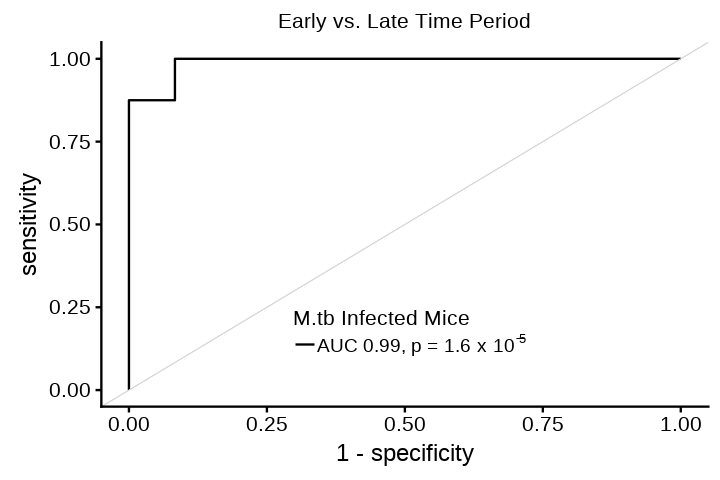

In [253]:
class.plot = my.roc(1 - mouse.rf.class$votes[,2], mouse.table.class$stage, "early")
gg.class.plot = ggroc(list(mouse=class.plot), legacy.axes=TRUE) +
                geom_abline(intercept = 0, slope = 1, color = "lightgrey", size = 0.25) + 
                ggtitle("Early vs. Late Time Period") + theme(plot.title = element_text(size=12, face="plain")) +
                scale_color_manual(name="M.tb Infected Mice",
                                  labels=expression("AUC 0.99, p ="~1.6~ "x" ~10^{-5} ~ " "),
                                  values=c("mouse"="black")) +
            theme(legend.position=c(0.30,0.20), legend.title = element_text(size=12), legend.text = element_text(size=11))  
gg.class.plot

### Figure 1D (Regression of time post-infection)

Warning message in randomForest.default(m, y, ...):
“The response has five or fewer unique values.  Are you sure you want to do regression?”`geom_smooth()` using method = 'loess'


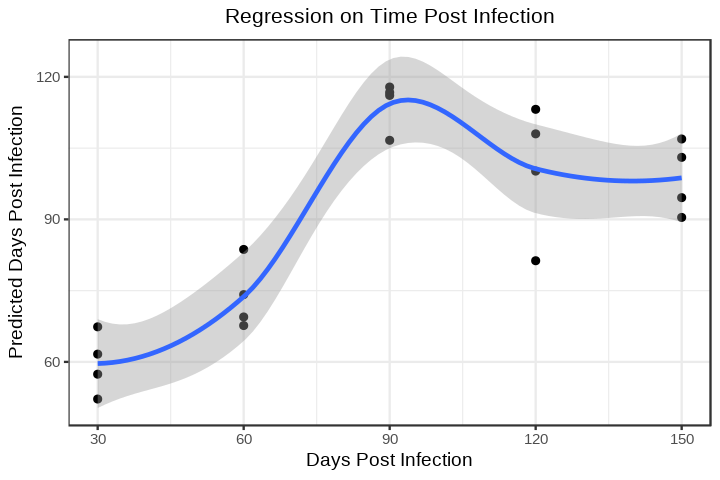

In [256]:
mouse.table.regress = as.data.frame(t(mouse.exprs.log[,pheno.data$infection.status == "Mtb"]))
mouse.table.regress$time.point.days = pheno.data[pheno.data$infection.status=="Mtb",]$time.point.days
set.seed(100)
C57.rf.regres = randomForest(time.point.days~., data=mouse.table.regress, importance=T)
predictions = data.frame(C57.predicted=C57.rf.regres$predicted, C57.time.point.days = mouse.table.regress$time.point.days)

set.seed(100)
regress.plot = ggplot(predictions, aes(C57.time.point.days, C57.predicted))+ 
                  geom_point() + 
                  geom_smooth() + theme_bw() + 
                  labs(x="Days Post Infection", y="Predicted Days Post Infection", size=14) + 
                  ggtitle("Regression on Time Post Infection") +
                  theme(plot.title = element_text(hjust = 0.5, size=12)) +
scale_x_continuous(breaks=c(30, 60, 90, 120, 150)) +
                scale_y_continuous(breaks=c(30, 60, 90, 120, 150))
regress.plot

## Figure 2 Macaque Analysis

- This code reproduces the analysis of Figure 2, showing that "Blood genome-wide RNA expression discriminates early vs. late M.tb infection time periods in cynomolgus macaques"

### Install and Load Required Libraries

In [2]:
source("https://bioconductor.org/biocLite.R")
if (!require("Biobase")) {
  biocLite("Biobase")
  library("Biobase")
}
if (!require("GEOquery")) {
  biocLite("GEOquery")
  library("GEOquery")
}

if (!require("sva")) {
  biocLite("sva")
  library("sva")
}

if (!require("ranger")) {
  install.packages("ranger")
  library("ranger")
}

if (!require("ggplot2")) {
  install.packages("ggplot2")
  library("ggplot2")
}

if (!require("glmnet")) {
  install.packages("glmnet")
  library("glmnet")
}

if (!require("gbm")) {
  install.packages("gbm")
  library("gbm")
}

if (!require("kernlab")) {
  install.packages("kernlab")
  library("kernlab")
}

if (!require("caret")) {
  install.packages("caret")
  library("caret")
}
if (!require("dplyr")) {
  install.packages("dplyr")
  library("dplyr")
}

if (!require("ggsignif")) {
  install.packages("ggsignif")
  library("ggsignif")
}

if (!require("doParallel")) {
  install.packages("doParallel")
  library("doParallel")
}

if (!require("cowplot")) {
  install.packages("cowplot")
  library("cowplot")
}

if (!require("ggpubr")) {
  install.packages("ggpubr")
  library("ggpubr")
}

if (!require("pROC")) {
    # pROC 1.12.0 is required, and may not be the default installation:
    packageUrl<- "https://cran.r-project.org/src/contrib/Archive/pROC/pROC_1.12.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("pROC")
}

Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install
Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, cbind, colMeans, colnames,
    colSums, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, lengths, Map, mapply, match,
    mget, order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,

### Load the data

In [4]:
source("utils_submission.R")

Loading required package: verification
Loading required package: boot

Attaching package: ‘boot’

The following object is masked from ‘package:lattice’:

    melanoma

The following object is masked from ‘package:survival’:

    aml

Loading required package: CircStats
Loading required package: MASS

Attaching package: ‘MASS’

The following object is masked from ‘package:dplyr’:

    select

The following object is masked from ‘package:genefilter’:

    area


Attaching package: ‘CircStats’

The following object is masked from ‘package:kernlab’:

    rvm

Loading required package: dtw
Loading required package: proxy

Attaching package: ‘proxy’

The following object is masked from ‘package:spam’:

    as.matrix

The following object is masked from ‘package:Matrix’:

    as.matrix

The following objects are masked from ‘package:stats’:

    as.dist, dist

The following object is masked from ‘package:base’:

    as.matrix

Loaded dtw v1.18-1. See ?dtw for help, citation("dtw") for use in 

In [5]:
monkey.path = paste(path, "/data/GSE84152", sep="")

In [6]:
monkey.gset = getGEO(filename=paste(monkey.path, "GSE84152_series_matrix.txt.gz", sep="/"), 
             destdir=monkey.path)

Parsed with column specification:
cols(
  .default = col_double(),
  ID_REF = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL10558 found here:
./data/GSE84152/GPL10558.soft 


In [7]:
monkey.gset

ExpressionSet (storageMode: lockedEnvironment)
assayData: 47323 features, 470 samples 
  element names: exprs 
protocolData: none
phenoData
  sampleNames: GSM2227793 GSM2227794 ... GSM2228262 (470 total)
  varLabels: title geo_accession ... wbc:ch1 (95 total)
  varMetadata: labelDescription
featureData
  featureNames: ILMN_1343291 ILMN_1343295 ... ILMN_3311190 (47323
    total)
  fvarLabels: ID Species ... GB_ACC (30 total)
  fvarMetadata: Column Description labelDescription
experimentData: use 'experimentData(object)'
Annotation: GPL10558 

In [8]:
raw.expres = read.table(file = paste(monkey.path, "GSE84152_non-normalized.txt", sep="/"), header=T , sep="\t")

#### Process the phenotype table, filter probes expressed in at least 5% of samples (Detection Pvalue < 0.01)

In [9]:
pheno = filter.monkey.pheno(pData(monkey.gset))

              title ChIP hyb.chamber  dataset synchroset monkeyid time.point
GSM2227793  M16_150    1           1 Training         No      M16        150
GSM2227794    M17_3    1           1 Training         No      M17          3
GSM2227795  M8_Pre2    1           1 Training         No       M8          1
GSM2227796   M19_56    1           1 Training         No      M19         56
GSM2227797   M19_90    1           1 Training         No      M19         90
GSM2227798     M1_7    1           1 Training         No       M1          7
GSM2227799   M18_20    1           1 Training         No      M18         20
GSM2227800   M15_90    1           1 Training         No      M15         90
GSM2227801    M1_42    1           1 Training         No       M1         42
GSM2227802  M13_180    1           1 Training        Yes      M13        180
GSM2227803   M17_10    1           1 Training         No      M17         10
GSM2227804   M18_10    1           1 Training         No      M18         10

In [10]:
PAL.5 = get.monkey.expressed.genes(raw.expres)

[1] "Genes expressed in at least 5 % of samples: 15083"


In [11]:
expres = process.monkey.exprs(exprs(monkey.gset), PAL.5)

### Batch correct expression data by hybridization chamber and dataset as in Gideon et al. 2016

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data

Found12batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



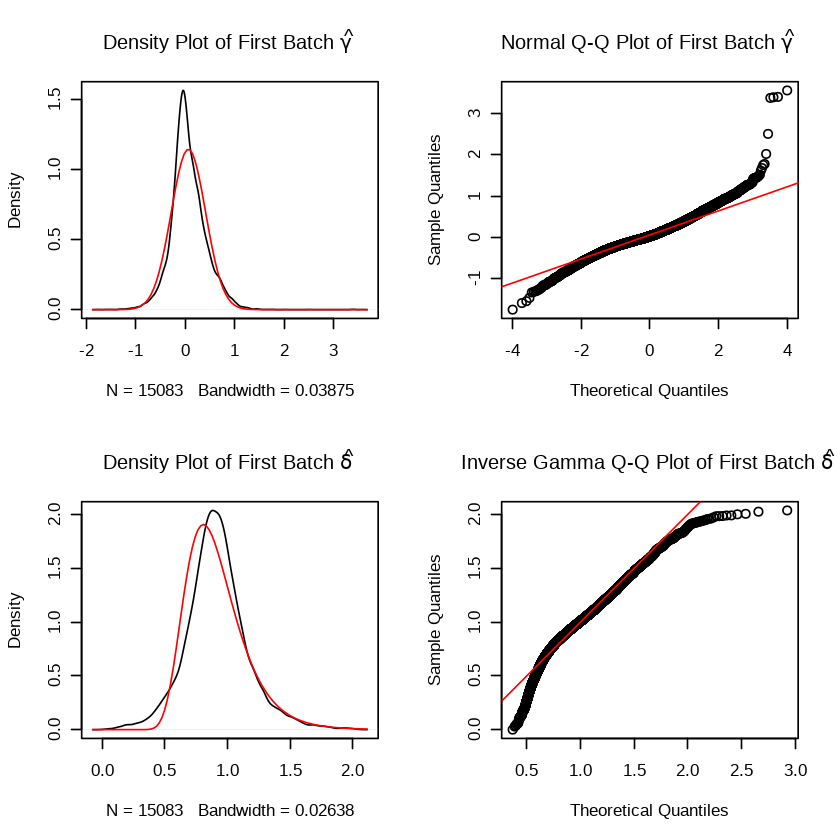

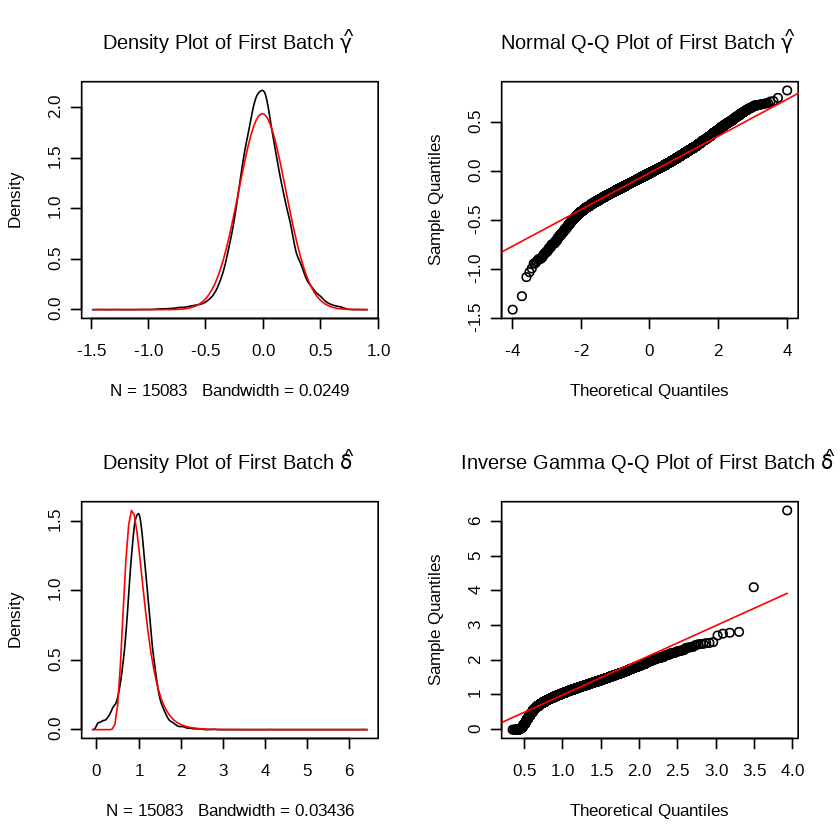

In [12]:
modcombat<-model.matrix(~1, data=pheno)
combat_dataset= ComBat(dat=expres, batch=pheno$dataset, mod=modcombat, par.prior=TRUE, prior.plots=TRUE)
expres = ComBat(dat=combat_dataset, batch=pheno$hyb.chamber, mod=modcombat, par.prior=TRUE, prior.plots=TRUE)
  


### Statistically Filter the genes by 60% most variable genes

In [13]:
cut = 0.6

filter = function(x) {IQR(x) / median(x)}
genes.range = apply(expres, 1, filter)
criteria = quantile(genes.range, c(1-cut))

genes.f = rownames(expres)[genes.range > criteria]
expres = expres[genes.f,]

### Focus on time points 20 - 180 days, and store a copy of the pheno table

In [14]:
expres = expres[, pheno$time.point > 10]
pheno = pheno[pheno$time.point > 10,]

In [15]:
pheno$time.period = as.factor(ifelse(pheno$time.point >= 90,
                                             "late",
                                             "early"))

In [16]:
write.table(pheno, file = paste(monkey.path, "PhenoData_processed.txt", sep="/"),sep="\t")

In [17]:
pheno = read.table(file = paste(monkey.path, "PhenoData_processed.txt", sep="/"),sep="\t")

In [18]:
pheno

,title,ChIP,hyb.chamber,dataset,synchroset,monkeyid,time.point,infection.time,clinical.status,description,description.1,time.point.comb,time.period
GSM2227793,M16_150,1,1,Training,No,M16,150,M5,Active,M16_150,6303256020_A.AVG_Signal,150,late
GSM2227796,M19_56,1,1,Training,No,M19,56,D56,Active,M19_56,6303256020_D.AVG_Signal,56,early
GSM2227797,M19_90,1,1,Training,No,M19,90,M3,Active,M19_90,6303256020_E.AVG_Signal,90,late
GSM2227799,M18_20,1,1,Training,No,M18,20,D20,Active,M18_20,6303256020_G.AVG_Signal,20,early
GSM2227800,M15_90,1,1,Training,No,M15,90,M3,Latent,M15_90,6303256020_H.AVG_Signal,90,late
GSM2227801,M1_42,1,1,Training,No,M1,42,D42,Active,M1_42,6303256020_I.AVG_Signal,42,early
GSM2227802,M13_180,1,1,Training,Yes,M13,180,M6,Latent,M13_180,6303256020_J.AVG_Signal,180,late
GSM2227805,M6_120,2,1,Training,No,M6,120,M4,Active,M6_120,6303256032_A.AVG_Signal,120,late
GSM2227806,M14_90,2,1,Training,No,M14,90,M3,Latent,M14_90,6303256032_B.AVG_Signal,90,late
GSM2227807,M15_20,2,1,Training,No,M15,20,D20,Latent,M15_20,6303256032_C.AVG_Signal,20,early


### Divide the data into a training and test set (70-30 split), with preserved ratio of monkeys with latent or active tuberculosis.

- This split was performed in python, which is located Macaque_analysis_train_test_set_split.ipynb

In [19]:
test.latent.monkeys = c('M13', 'M27', 'M34', 'M15', 'M35', 'M36')
test.active.monkeys = c('M1', 'M16', 'M32', 'M18', 'M23')

In [20]:
test.rows = rownames(pheno[pheno$monkeyid %in% union(test.latent.monkeys, test.active.monkeys),])
train.rows = setdiff(rownames(pheno), test.rows)

if (dim(expres)[1] > dim(expres)[2])
    expres = t(expres)

pheno.train = droplevels(pheno[train.rows,])
pheno.test = droplevels(pheno[test.rows,])
expres.train = expres[train.rows,]
expres.test = expres[test.rows,]

### Create grouped k-folds according to monkey within the training set. With random seed set to 100, this gives 9-folds

In [21]:
set.seed(100)
folds = groupKFold(pheno.train$monkeyid, k=10)
for (fold in lapply(folds, function(x) {pheno.train$monkeyid[x]}))
    print(length((as.character(fold))))

lapply(folds, function(x, y) table(y[x]), y = pheno.train$monkeyid)

[1] 202
[1] 194
[1] 186
[1] 174
[1] 187
[1] 179
[1] 186
[1] 178
[1] 194


$Fold1

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   8   8   0   8   7   8   8   8   8   8   8   8   8   8   8   8   7   8   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   8   8 

$Fold2

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   8   8   8   8   7   8   8   8   0   8   8   8   8   8   8   8   7   8   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   0   8 

$Fold3

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   0   8   8   8   7   8   8   8   8   8   8   0   8   8   8   0   7   8   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   8   8 

$Fold4

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  0   8   8   8   8   7   8   0   8   8   8   8   8   0   8   8   8   0   0   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   8   8 

$Fold5

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 

### Reproduce Supplementary Figure S2 (this takes quite a bit of time)

In [ ]:
seed=7

# Now we are going to loop over different models

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("gbm", "svmRadial", "svmPoly", "ranger", "glmnet")

models = list()


#folds
control <- trainControl(method="cv", index=folds, search="random", allowParallel=TRUE, savePredictions='final',
                       classProbs=TRUE, summaryFunction=twoClassSummary)

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(expres.train, pheno.train$time.period,  method=alg, tuneLength=50, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

In [ ]:
results = resamples(models)
bwplot(results)

### Reproduce Figure 2A,B, using glmnet. Do a larger hyperparameter search to find the optimally performing model on the training set.

In [76]:
set.seed(100)

n = 10000
lambda.grid = c(10 ^ runif(n, min = log10(1e-5), max = log10(1e2)))
alpha.grid = runif(length(lambda.grid), min = 0.00, 1.0)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))

In [77]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c( "glmnet")

models = list()

control <- trainControl(method="cv", index=folds, allowParallel=TRUE, savePredictions='final',
                       classProbs=TRUE, summaryFunction=twoClassSummary)

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(expres.train, pheno.train$time.period,  method=alg, trControl=control, tuneGrid=train.grid,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"
Time difference of 2.033721 hours


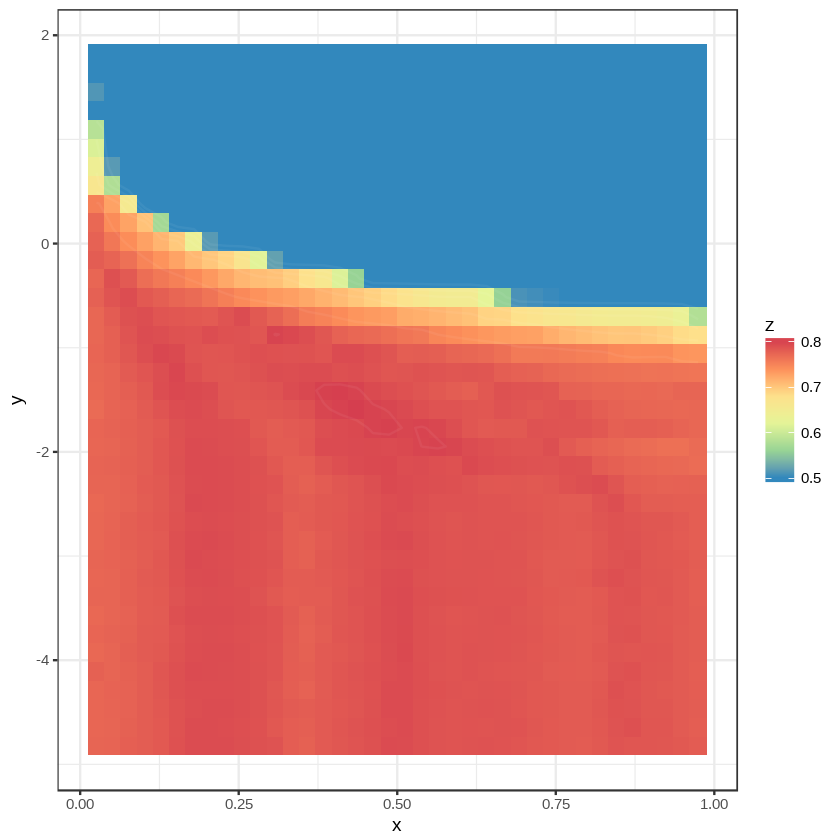

In [81]:
glmres = models$glmnet$results
graph.hyper(glmres$alpha, log10(glmres$lambda), glmres$ROC)

#### Figure 2A

[1] "This is the AUC:"
Area under the curve: 0.7835
[1] "This is the AUC p-value:"
[1] 6.39348e-13
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.7222-0.8448 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.808
[1] "This is the AUC p-value:"
[1] 2.039996e-07
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.7122-0.9037 (DeLong)


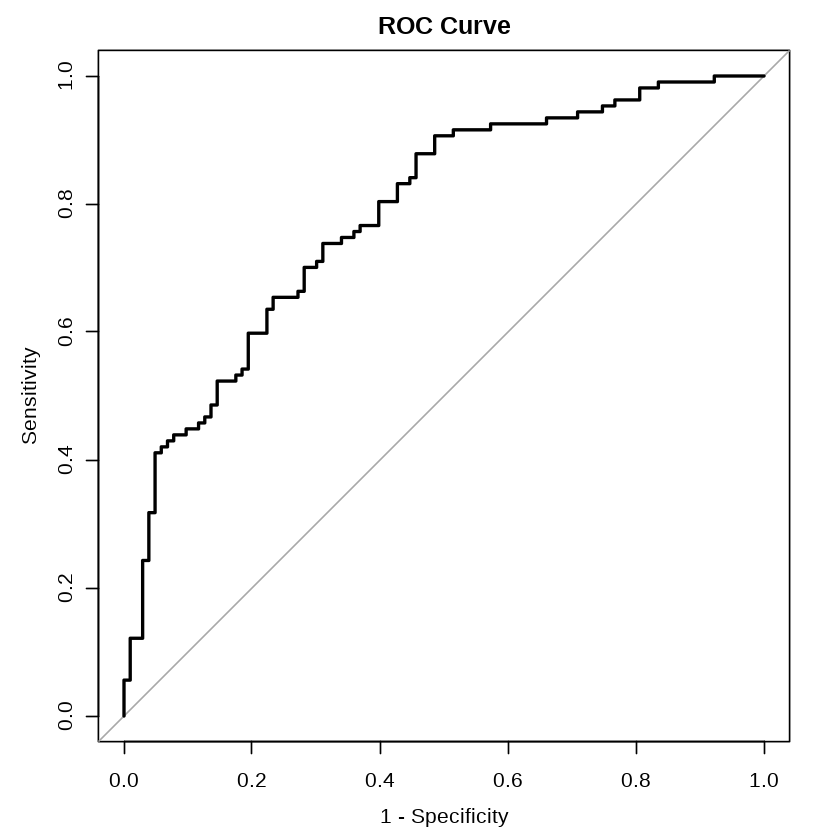

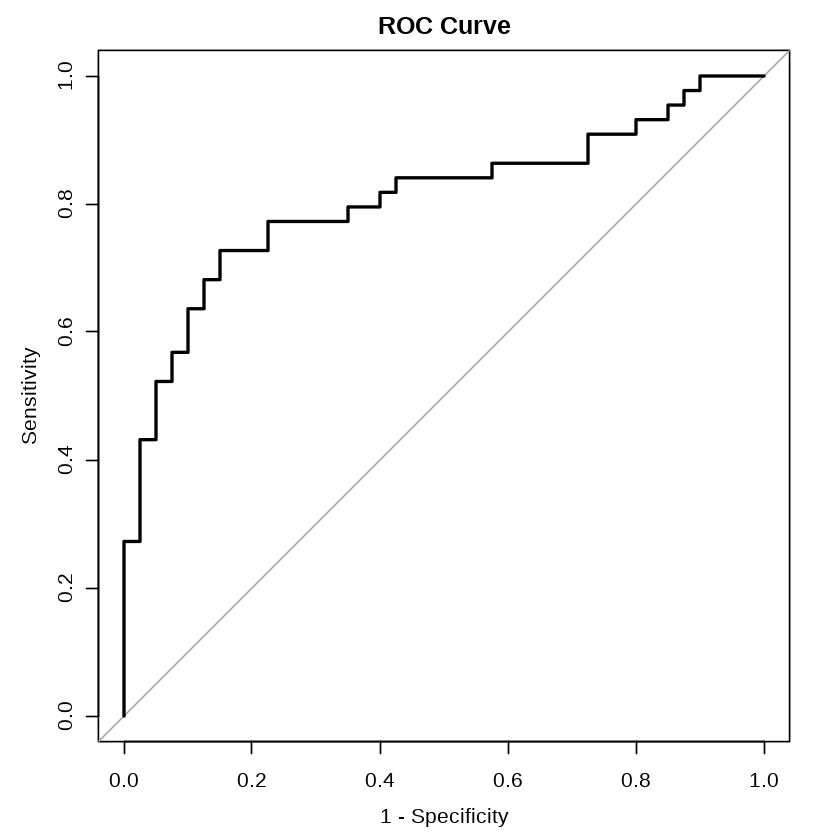

In [83]:
models.monkey.ROC = models
model.monkey.ROC = models.monkey.ROC$glmnet

glmnet.monkey.val.ROC = my.roc(model.monkey.ROC$pred$early, model.monkey.ROC$pred$obs, "early")

pred.monkey.test = predict(model.monkey.ROC, newdata = expres.test, type="prob")
glmnet.monkey.ROC = my.roc(pred.monkey.test$early,
                          pheno.test$time.period,
                          "early")

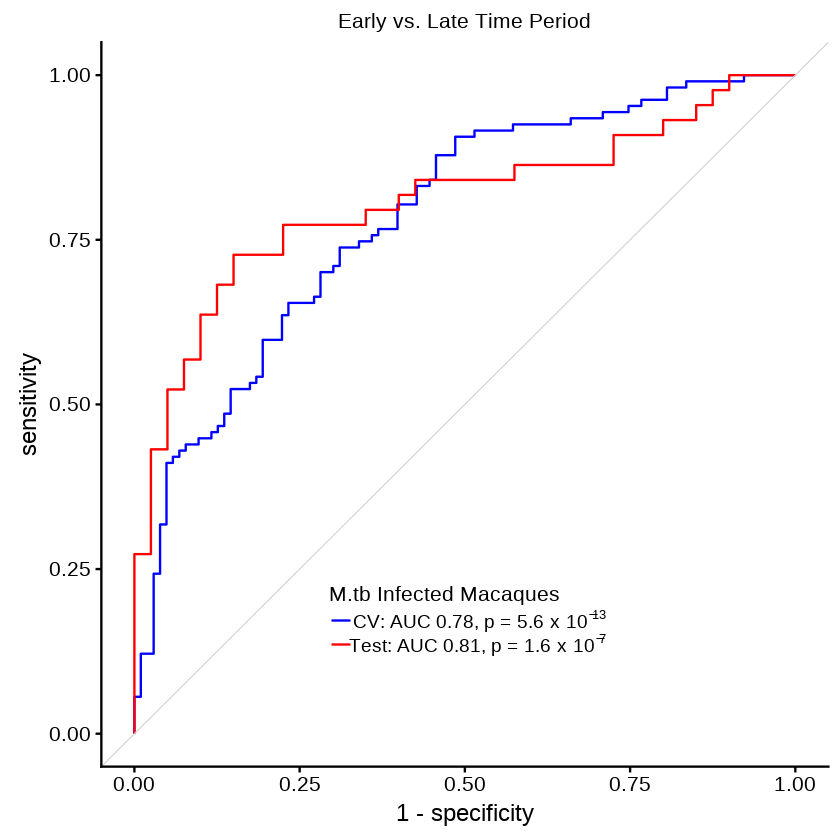

In [84]:
monkey.class.plot = ggroc(list(CV=glmnet.monkey.val.ROC, test=glmnet.monkey.ROC), legacy.axes=TRUE) +
                geom_abline(intercept = 0, slope = 1, color = "lightgrey", size = 0.25) + 
                ggtitle("Early vs. Late Time Period") + theme(plot.title = element_text(size=12, face="plain")) +
                scale_color_manual(name="M.tb Infected Macaques",
                                  labels=c("CV" =expression("CV: AUC 0.78, p ="~5.6~ "x" ~10^{-13} ~ " "),
                                           "test"=expression("Test: AUC 0.81, p ="~1.6~ "x" ~10^{-7} ~ " ")),
                                  values=c("CV"="blue", "test"="red")) +
            theme(legend.position=c(0.30,0.20), legend.title = element_text(size=12), legend.text = element_text(size=11)) 
monkey.class.plot

#### Figure 2B

In [88]:
monkey.val.preds = models.monkey.ROC$glmnet$pred
pred.monkey.test  = predict(models.monkey.ROC$glmnet, newdata=expres.test)

# Calculate ratio of active to latent in all actual and predicted early and late time periods, in both validation and test set

a.l.early.val = sum(dplyr::filter(pheno.train, time.period=="early")$clinical.status == "Active") / length(dplyr::filter(pheno.train, time.period=="early")$clinical.status)
a.l.late.val = sum(dplyr::filter(pheno.train, time.period=="late")$clinical.status == "Active") / length(dplyr::filter(pheno.train, time.period=="late")$clinical.status)

a.l.p.early.val = sum(pheno.train[monkey.val.preds$pred == "early",]$clinical.status=="Active") / length(pheno.train[monkey.val.preds$pred == "early",]$clinical.status)
a.l.p.late.val = sum(pheno.train[monkey.val.preds$pred == "late",]$clinical.status=="Active") / length(pheno.train[monkey.val.preds$pred == "late",]$clinical.status)


# Calculate ratio of active to latent in all actual and predicted early and late time periods, in both validation and test set
a.l.early.test = sum(dplyr::filter(pheno.test, time.period=="early")$clinical.status == "Active") / length(dplyr::filter(pheno.test, time.period=="early")$clinical.status)
a.l.late.test = sum(dplyr::filter(pheno.test, time.period=="late")$clinical.status == "Active") / length(dplyr::filter(pheno.test, time.period=="late")$clinical.status)

a.l.p.early.test = sum(pheno.test[pred.monkey.test  == "early",]$clinical.status=="Active") / length(pheno.test[pred.monkey.test  == "early",]$clinical.status)
a.l.p.late.test = sum(pheno.test[pred.monkey.test  == "late",]$clinical.status=="Active") / length(pheno.test[pred.monkey.test  == "late",]$clinical.status)


t.period = c("Early", "Predicted Early", "Early", "Predicted Early")
partition = as.factor(c("Cross-Validation", "Cross-Validation", "Test", "Test"))
active_prop = c(a.l.early.val, a.l.p.early.val, a.l.early.test, a.l.p.early.test)
partition = factor(partition, levels(partition)[c(which(levels(partition) == "Cross-Validation"),
                                                  which(levels(partition) == "Test"))])

disease.confound = data.frame(t.period=as.factor(t.period), partition=partition, active_prop=active_prop)


n.act.early.val = sum(dplyr::filter(pheno.train, time.period=="early")$clinical.status == "Active")
n.tot.early.val = length(dplyr::filter(pheno.train, time.period=="early")$clinical.status)

n.act.p.early.val = sum(pheno.train[monkey.val.preds$pred == "early",]$clinical.status=="Active")
n.tot.p.early.val = length(pheno.train[monkey.val.preds$pred == "early",]$clinical.status)


fisher.test(matrix(c(n.act.early.val, 
                     n.tot.early.val - n.act.early.val,
                     n.act.p.early.val,
                     n.tot.p.early.val - n.act.p.early.val), ncol=2))


n.act.early.test = sum(dplyr::filter(pheno.test, time.period=="early")$clinical.status == "Active")
n.tot.early.test = length(dplyr::filter(pheno.test, time.period=="early")$clinical.status)

n.act.p.early.test = sum(pheno.test[pred.monkey.test  == "early",]$clinical.status=="Active")
n.tot.p.early.test = length(pheno.test[pred.monkey.test  == "early",]$clinical.status)


fisher.test(matrix(c(n.act.early.test, 
                     n.tot.early.test - n.act.early.test,
                     n.act.p.early.test,
                     n.tot.p.early.test - n.act.p.early.test), ncol=2))


	Fisher's Exact Test for Count Data

data:  
p-value = 0.8893
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 0.5304016 1.7128232
sample estimates:
odds ratio 
 0.9533132 



	Fisher's Exact Test for Count Data

data:  
p-value = 1
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 0.4008563 2.3838605
sample estimates:
odds ratio 
 0.9784834 


In [92]:
a.l.plot = ggplot(disease.confound, aes(x=t.period, y=active_prop)) + geom_bar(stat="identity") + facet_grid(~partition) +
    labs(
        y="Proportion of Samples from\nMacaques with Active TB") +
ggtitle("Risk of TB", subtitle="Stratified by Predicted Time Period") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                              plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) +
ylim(0, 1.0) +
geom_signif(comparisons=list(c("Early", "Predicted Early")),
                               y_position=c(0.75),
              annotations = c("1.0"), vjust=-0.5, 
             tip_length=0) + theme(panel.background = element_rect(fill = "white", colour = "white", size = 4)) +
                scale_x_discrete(labels=c("Early" = "Early", "Predicted Early"="Predicted\nEarly")) +
theme(axis.title.x=element_blank())

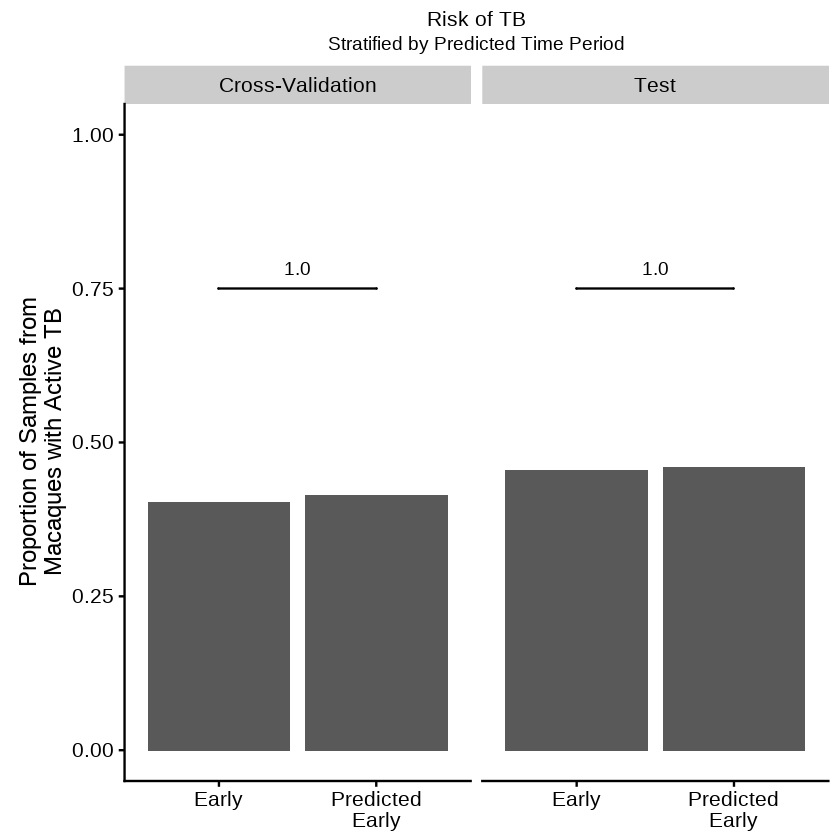

In [93]:
a.l.plot

### Reproduce Figure 2C-F, using glmnet for regression. Do a hyperparameter search to find the optimally performing model on the training set.

In [22]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e0), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))


In [23]:
seed=7

library(doParallel)

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")


models = list()


#folds
control <- trainControl(method="cv", index=folds, savePredictions = 'final', allowParallel=TRUE)

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(expres.train, pheno.train$time.point, tuneGrid = train.grid, method=alg, trControl=control) # 
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 12.18823 mins


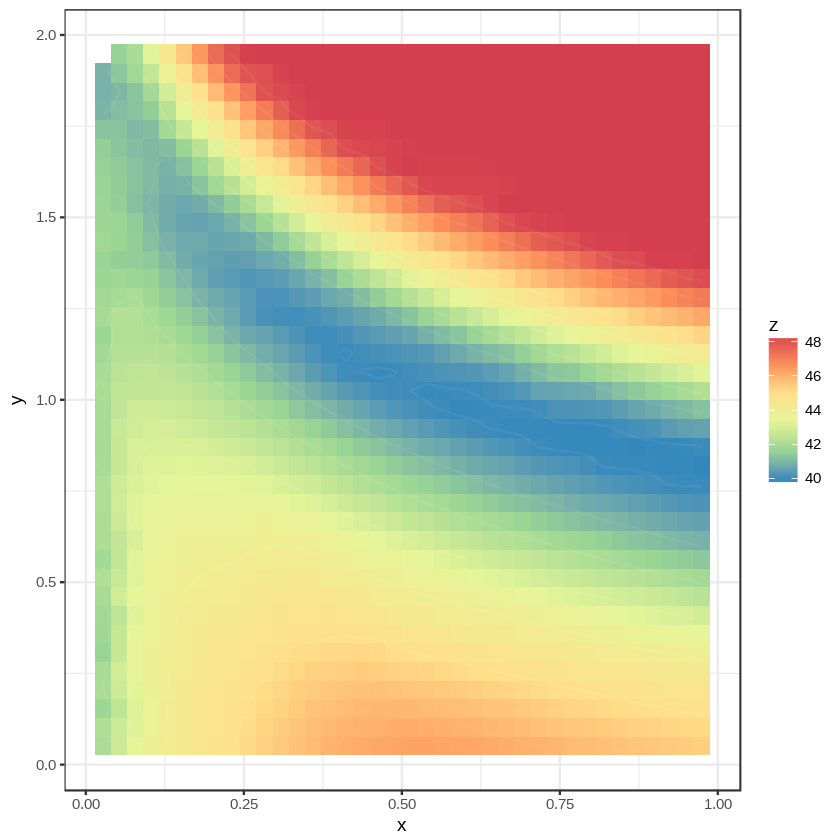

In [24]:
glmres = models$glmnet$results
graph.hyper(glmres$alpha, log10(glmres$lambda), glmres$MAE)


In [25]:
regress.model = models

In [26]:
val.regress.model = regress.model
val.pred = val.regress.model$glmnet$pred
all.metrics(val.pred$obs, val.pred$pred)

regress.model.glm = regress.model$glmnet
pred.regress.test = predict(regress.model.glm, newdata = expres.test)
time.point.obs = pheno.test$time.point

all.metrics(time.point.obs, pred.regress.test)

[1] "Root Mean Squared Error (RMSE)"
[1] 47.84271
[1] "Mean Absolute Error"
[1] 39.78075
[1] "Median Absolute Error"
[1] 37.53412
[1] "Pearson Correlation Coefficient"
[1] 0.4843737
[1] "Pearson Correlation Signifcance Test"

	Pearson's product-moment correlation

data:  truth and pred
t = 7.985, df = 208, p-value = 9.42e-14
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3734757 0.5816217
sample estimates:
      cor 
0.4843737 

[1] "Spearman Correlation Signifcance Test"


Warning message in cor.test.default(truth, pred, method = "spearman"):
“Cannot compute exact p-value with ties”


	Spearman's rank correlation rho

data:  truth and pred
S = 731840, p-value = 2.495e-16
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.5258443 

[1] "R squared"
[1] 0.2346179
[1] "Root Mean Squared Error (RMSE)"
[1] 45.66639
[1] "Mean Absolute Error"
[1] 38.74965
[1] "Median Absolute Error"
[1] 34.90636
[1] "Pearson Correlation Coefficient"
[1] 0.5365446
[1] "Pearson Correlation Signifcance Test"

	Pearson's product-moment correlation

data:  truth and pred
t = 5.7575, df = 82, p-value = 1.435e-07
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3640241 0.6734689
sample estimates:
      cor 
0.5365446 

[1] "Spearman Correlation Signifcance Test"


Warning message in cor.test.default(truth, pred, method = "spearman"):
“Cannot compute exact p-value with ties”


	Spearman's rank correlation rho

data:  truth and pred
S = 39575, p-value = 1.711e-09
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.5993248 

[1] "R squared"
[1] 0.2878801


#### Perform regression only on samples at 90 day time point or less

In [27]:
expres.train.90 = expres.train[pheno.train$time.point <= 90,]
pheno.train.90 = pheno.train[pheno.train$time.point <= 90,]

In [28]:
set.seed(100)
pheno.train.90 = dplyr::filter(pheno.train, time.point<=90)
folds.90 = groupKFold(pheno.train.90$monkeyid, k=10)
for (fold in lapply(folds.90, function(x) {pheno.train.90$monkeyid[x]}))
    print(length((as.character(fold))))

lapply(folds.90, function(x, y) table(y[x]), y = pheno.train.90$monkeyid)

[1] 129
[1] 124
[1] 119
[1] 110
[1] 119
[1] 114
[1] 119
[1] 114
[1] 124


$Fold1

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   5   5   0   5   5   5   5   5   5   5   5   5   5   5   5   5   4   5   5 
M38  M4  M5  M6  M7  M8  M9 
  5   5   5   5   5   5   5 

$Fold2

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   5   5   5   5   5   5   5   5   0   5   5   5   5   5   5   5   4   5   5 
M38  M4  M5  M6  M7  M8  M9 
  5   5   5   5   5   0   5 

$Fold3

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   0   5   5   5   5   5   5   5   5   5   5   0   5   5   5   0   4   5   5 
M38  M4  M5  M6  M7  M8  M9 
  5   5   5   5   5   5   5 

$Fold4

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  0   5   5   5   5   5   5   0   5   5   5   5   5   0   5   5   5   0   0   5 
M38  M4  M5  M6  M7  M8  M9 
  5   5   5   5   5   5   5 

$Fold5

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 

In [29]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-12), max = log10(1e4)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))


In [30]:
seed=7

library(doParallel)

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()

control <- trainControl(method="cv", index=folds.90, savePredictions = 'final', allowParallel=TRUE)

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(expres.train.90, pheno.train.90$time.point, tuneGrid = train.grid, method=alg, trControl=control) # 
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 7.42638 mins


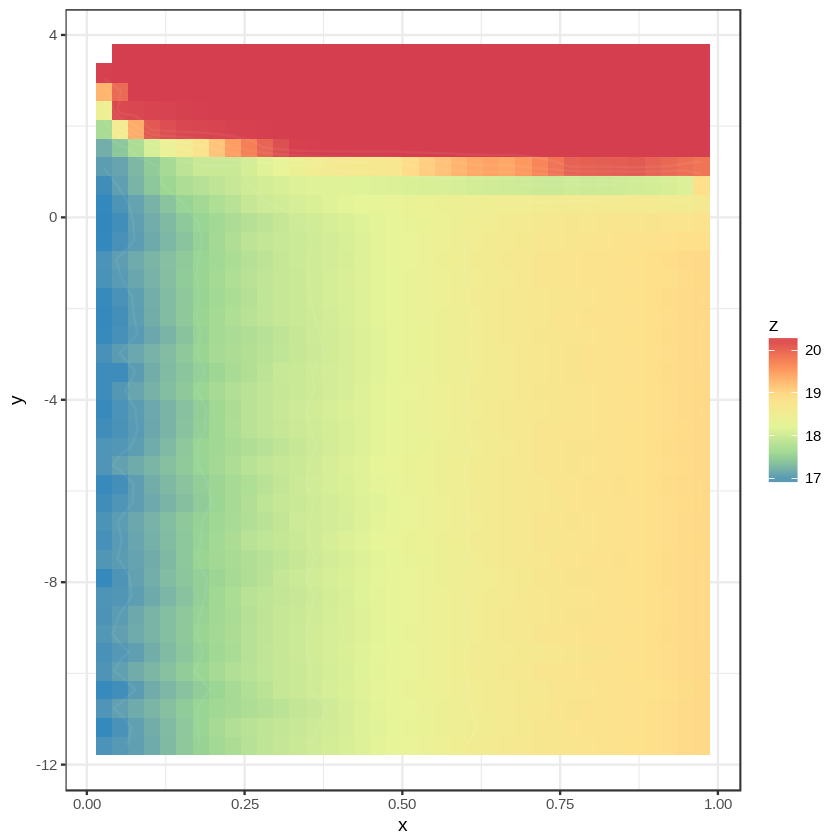

In [31]:
glmres = models$glmnet$results
graph.hyper(glmres$alpha, log10(glmres$lambda), glmres$MAE)


In [32]:
regress.model.90 = models
val.pred.90 = regress.model.90$glmnet$pred
all.metrics(val.pred.90$obs, val.pred.90$pred)

regress.model.90.glm = regress.model.90$glmnet
pred.regress.test.90 = predict(regress.model.90.glm, newdata = expres.test[pheno.test$time.point <= 90,])
time.point.90 = dplyr::filter(pheno.test, time.point <= 90)$time.point
all.metrics(time.point.90, pred.regress.test.90)

[1] "Root Mean Squared Error (RMSE)"
[1] 20.93642
[1] "Mean Absolute Error"
[1] 16.82706
[1] "Median Absolute Error"
[1] 15.81807
[1] "Pearson Correlation Coefficient"
[1] 0.5149904
[1] "Pearson Correlation Signifcance Test"

	Pearson's product-moment correlation

data:  truth and pred
t = 6.9025, df = 132, p-value = 1.937e-10
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3784548 0.6295924
sample estimates:
      cor 
0.5149904 

[1] "Spearman Correlation Signifcance Test"


Warning message in cor.test.default(truth, pred, method = "spearman"):
“Cannot compute exact p-value with ties”


	Spearman's rank correlation rho

data:  truth and pred
S = 188940, p-value = 5.1e-11
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.5288156 

[1] "R squared"
[1] 0.2652151
[1] "Root Mean Squared Error (RMSE)"
[1] 22.10746
[1] "Mean Absolute Error"
[1] 16.9703
[1] "Median Absolute Error"
[1] 14.23728
[1] "Pearson Correlation Coefficient"
[1] 0.4550192
[1] "Pearson Correlation Signifcance Test"

	Pearson's product-moment correlation

data:  truth and pred
t = 3.72, df = 53, p-value = 0.0004825
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.2157686 0.6427291
sample estimates:
      cor 
0.4550192 

[1] "Spearman Correlation Signifcance Test"


Warning message in cor.test.default(truth, pred, method = "spearman"):
“Cannot compute exact p-value with ties”


	Spearman's rank correlation rho

data:  truth and pred
S = 14542, p-value = 0.0002446
alternative hypothesis: true rho is not equal to 0
sample estimates:
      rho 
0.4754011 

[1] "R squared"
[1] 0.2070425


#### Plot Figures 4C-F

In [33]:
test.model = data.frame(obs=pheno.test$time.point, pred=pred.regress.test)

test.model.90 = data.frame(obs=time.point.90, pred=pred.regress.test.90)

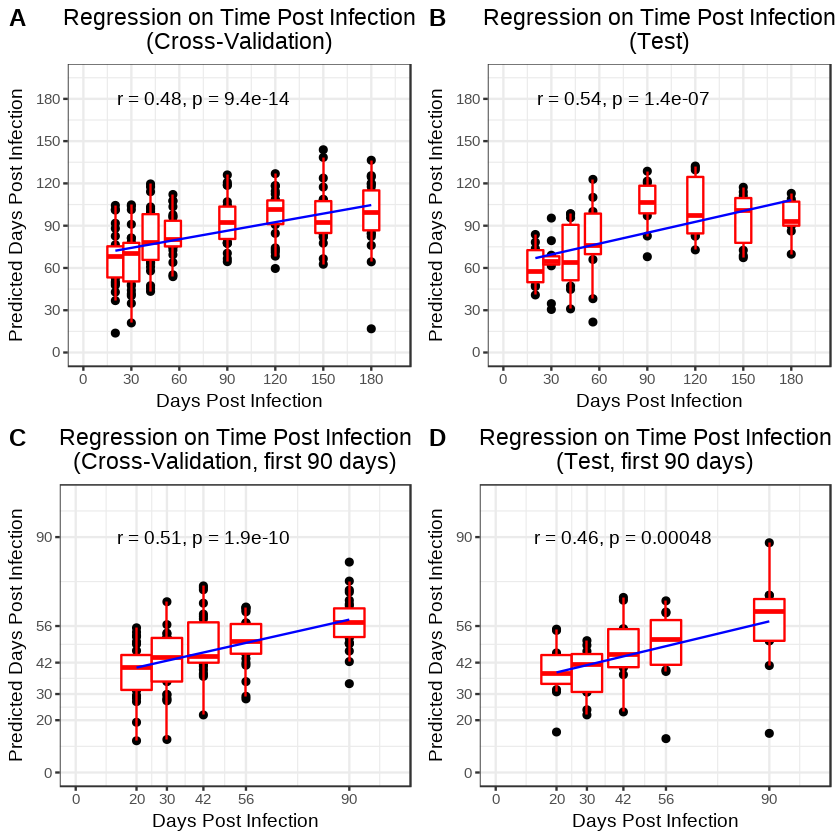

In [44]:
glm.graph.val = generate.regres.graph(val.pred, "Regression on Time Post Infection\n(Cross-Validation)")
glm.graph.test = generate.regres.graph(test.model, "Regression on Time Post Infection\n(Test)")

glm.graph.val.90 = generate.regres.graph(val.pred.90, "Regression on Time Post Infection\n(Cross-Validation, first 90 days)", break.90=T)
glm.graph.test.90 = generate.regres.graph(test.model.90, "Regression on Time Post Infection\n(Test, first 90 days)", break.90=T)


allregressions= plot_grid(glm.graph.val,
                          glm.graph.test,
                          glm.graph.val.90,
                          glm.graph.test.90,
                          labels = toupper(c(letters[1:4], align="h")))

allregressions


## Figure 3 Human Analysis (Grand Challenges 6-74 cohort and Small Adolescent Infection Acquisition study)

- This code reproduces the analysis of Figure 3, showing that "Blood genome-wide gene expression predicts time since active TB exposure in humans"

### Load and Install Required Libraries

In [45]:
if (!require("preprocessCore")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("preprocessCore")
  library("preprocessCore")
}

source("https://bioconductor.org/biocLite.R")
if (!require("Biobase")) {
  biocLite("Biobase")
  library("Biobase")
}
if (!require("GEOquery")) {
  biocLite("GEOquery")
  library("GEOquery")
}

if (!require("ggplot2")) {
  install.packages("ggplot2")
  library("ggplot2")
}

if (!require("glmnet")) {
  install.packages("glmnet")
  library("glmnet")
}

if (!require("caret")) {
  install.packages("caret")
  library("caret")
}
if (!require("dplyr")) {
  install.packages("dplyr")
  library("dplyr")
}

if (!require("ggsignif")) {
  install.packages("ggsignif")
  library("ggsignif")
}

if (!require("doParallel")) {
  install.packages("doParallel")
  library("doParallel")
}

if (!require("cowplot")) {
  install.packages("cowplot")
  library("cowplot")
}

if (!require("e1071")) {
  install.packages("e1071")
  library("e1071")
}

if (!require("pROC")) {
    # pROC 1.12.0 is required, and may not be the default installation:
    packageUrl<- "https://cran.r-project.org/src/contrib/Archive/pROC/pROC_1.12.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("pROC")
}

if (!require("illuminaio")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("illuminaio")
  library("illuminaio")
}

if (!require("limma")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("limma")
  library("limma")
}


Loading required package: preprocessCore
Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install
Loading required package: e1071
Loading required package: illuminaio
Loading required package: limma

Attaching package: ‘limma’

The following object is masked from ‘package:BiocGenerics’:

    plotMA



### Reproduce Analysis for Figure 3A

#### Load data and filter probes by detection p values by processing the .idat files

In [215]:
source("utils_submission.R")

ado.path =  paste(path, "/data/GSE116014", sep="")

ado.eset = getGEO(filename=paste(ado.path, "GSE116014_series_matrix.txt.gz", sep="/"), 
             destdir=ado.path)

Parsed with column specification:
cols(
  .default = col_double(),
  ID_REF = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL10558 found here:
data/GSE116014_adolescent//GPL10558.soft 


In [214]:
idatfiles <- dir(ado.path, pattern="idat", full.names=T)
bgxfile <- dir(ado.path, pattern="B.txt.gz", full.names=T)
x <- read.idat(idatfiles, bgxfile[1])
x$other$Detection <- detectionPValues(x)
dim(x$other$Detection)

Reading manifest file /master/rault/TB/data/GSE116014/GPL10558_HumanHT-12_V4_0_R1_15002873_B.txt.gz ... Done
	 /master/rault/TB/data/GSE116014/GSM3207067_8381645078_B_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207068_8381645078_C_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207069_8381645078_D_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207070_8381645078_E_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207071_8381645078_F_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207072_8381645078_G_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207073_8381645078_H_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207074_8381645078_I_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207075_8381645078_J_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207076_8381645078_K_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207077_8381645078_L_Grn.idat ... Done
	 /master/rault/TB/data/GSE116014/GSM3207078_8381645088

[1] 48118    82

In [217]:
row.names(x$other$Detection) = x$genes$Probe_Id
df = x$other$Detection
probe = as.character(row.names(df))
df = data.frame(df, probe=probe)
df = df[!duplicated(df$probe),]
df = df[match(featureNames(ado.eset), df$probe),]
row.names(df) = df$probe
df$probe=NULL
print(identical(featureNames(ado.eset), row.names(df)))

Warning message in data.row.names(row.names, rowsi, i):
“some row.names duplicated: 47233,47236,47238,47240,47242,47243,47246,47247,47251,47253,47255 --> row.names NOT used”

[1] TRUE


In [218]:
write.csv(df, paste(ado.path, "GSE116014_DetectionPValues.csv", sep="/"))

In [222]:
dPvalues = read.csv(paste(ado.path, "GSE116014_DetectionPValues.csv", sep="/"), header=T, row.names=1)

#### Prepare data for training a model to predict time since first known QFT conversion (0 vs 6 months)

In [224]:
det_pval_thresh = 0.01

# Choose genes expressed in 10% of samples
percent_samples= 0.10

PAL.10 = row.names(dPvalues)[apply(dPvalues <= det_pval_thresh, 1, mean) >= percent_samples]

ado.eset.PAL.10 = ado.eset[featureNames(ado.eset) %in% PAL.10,]

ado.exprs = exprs(ado.eset.PAL.10)
ado.pheno = pData(ado.eset.PAL.10)

colnames(ado.pheno) = gsub(" ",".", gsub(":ch1|\\(|\\)","",colnames(ado.pheno)))

ado.pheno = ado.pheno[,c('draw.day',
                         'latent.tb.status.at.blood.draw',
                         'patientid',
                         'relative.time.from.conversion.days',
                         'time.of.conversion.days',
                         'tissue')]
num.f = c  ('draw.day',
                         'relative.time.from.conversion.days',
                         'time.of.conversion.days')
            
for (f in num.f) {
    ado.pheno[,f] = as.numeric(ado.pheno[,f])
}

ado.exprs.qn = normalize.quantiles(ado.exprs)
row.names(ado.exprs.qn) = row.names(ado.exprs)
colnames(ado.exprs.qn) = colnames(ado.exprs)

ado.exprs.qn[ado.exprs.qn < 10] = 10
ado.exprs.log = log2(ado.exprs.qn)

cut = 0.6

filter.QR = function(x) {IQR(x) / median(x)}
genes.range = apply(ado.exprs.log, 1, filter.QR)
criteria = quantile(genes.range, c(1-cut))

genes.f = rownames(ado.exprs.log)[genes.range > criteria]
ado.exprs.var = ado.exprs.log[genes.f,]

ado.pheno.qft = ado.pheno[ado.pheno$relative.time.from.conversion.days %in% c(0,180),]

ntrain =  0.7 * length(unique(ado.pheno.qft$patientid))

ntest = 0.3 * length(unique(ado.pheno.qft$patientid))

set.seed(100)
train.patients = sample(unique(as.character(ado.pheno.qft$patientid)), ntrain)
test.patients = setdiff(unique(as.character(ado.pheno.qft$patientid)), train.patients)
print("Number of common patients between training and test set (should be 0)")
length(intersect(train.patients, test.patients))

ado.pheno.train = droplevels(ado.pheno.qft[ado.pheno.qft$patientid %in% train.patients,])
ado.pheno.test = droplevels(ado.pheno.qft[ado.pheno.qft$patientid %in% test.patients,])

ado.exprs.qft = ado.exprs.var[, colnames(ado.exprs.var) %in% row.names(ado.pheno.qft)]

ado.exprs.train = t(ado.exprs.qft[,ado.pheno.qft$patientid %in% train.patients])
ado.exprs.test = t(ado.exprs.qft[,ado.pheno.qft$patientid %in% test.patients])

set.seed(100)
folds.ado = groupKFold(ado.pheno.train$patientid, k=11)
for (fold in lapply(folds.ado, function(x) {ado.pheno.train$patientid[x]}))
    print(length((as.character(fold))))

lapply(folds.ado, function(x, y) table(y[x]), y = ado.pheno.train$patientid)
       
time.since.QFT.conversion = as.factor(ifelse(ado.pheno.train$relative.time.from.conversion.days == "0", "early", "late"))
test.time.since.QFT.conversion = as.factor(ifelse(ado.pheno.test$relative.time.from.conversion.days == "0", "early", "late"))

[1] "Number of common patients between training and test set (should be 0)"


[1] 0

[1] 37
[1] 35
[1] 35
[1] 33
[1] 33
[1] 34
[1] 34
[1] 34
[1] 32
[1] 35


$Fold01

ID#: 04/0017 ID#: 04/0090 ID#: 04/0106 ID#: 04/0352 ID#: 04/0402 ID#: 04/0446 
           2            1            1            1            1            1 
ID#: 04/0702 ID#: 04/0758 ID#: 04/0785 ID#: 04/0807 ID#: 04/0953 ID#: 04/0974 
           2            1            1            2            2            1 
ID#: 04/1032 ID#: 04/1139 ID#: 04/1154 ID#: 04/1157 ID#: 04/1187 ID#: 04/1354 
           1            2            2            2            1            1 
ID#: 07/0088 ID#: 07/0222 ID#: 07/0487 ID#: 07/0547 ID#: 07/0551 ID#: 07/0675 
           1            1            1            1            1            2 
ID#: 07/0788 ID#: 07/0845 ID#: 07/0901 
           2            2            1 

$Fold02

ID#: 04/0017 ID#: 04/0090 ID#: 04/0106 ID#: 04/0344 ID#: 04/0352 ID#: 04/0402 
           2            1            1            1            1            1 
ID#: 04/0446 ID#: 04/0702 ID#: 04/0758 ID#: 04/0807 ID#: 04/0953 ID#: 04/0974 
           1            2       

#### Train the model

In [225]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-5), max = log10(1e2)))
alpha.grid = runif(length(lambda.grid), min = 0.00, 1.0)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))

In [226]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()

control <- trainControl(method="cv", index=folds.ado, savePredictions='final', allowParallel=TRUE, 
                       classProbs=TRUE, summaryFunction=twoClassSummary)

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(ado.exprs.train,
                  as.factor(time.since.QFT.conversion),  
                  method=alg, trControl=control,  tuneGrid=train.grid,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)                     

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 4.250001 mins


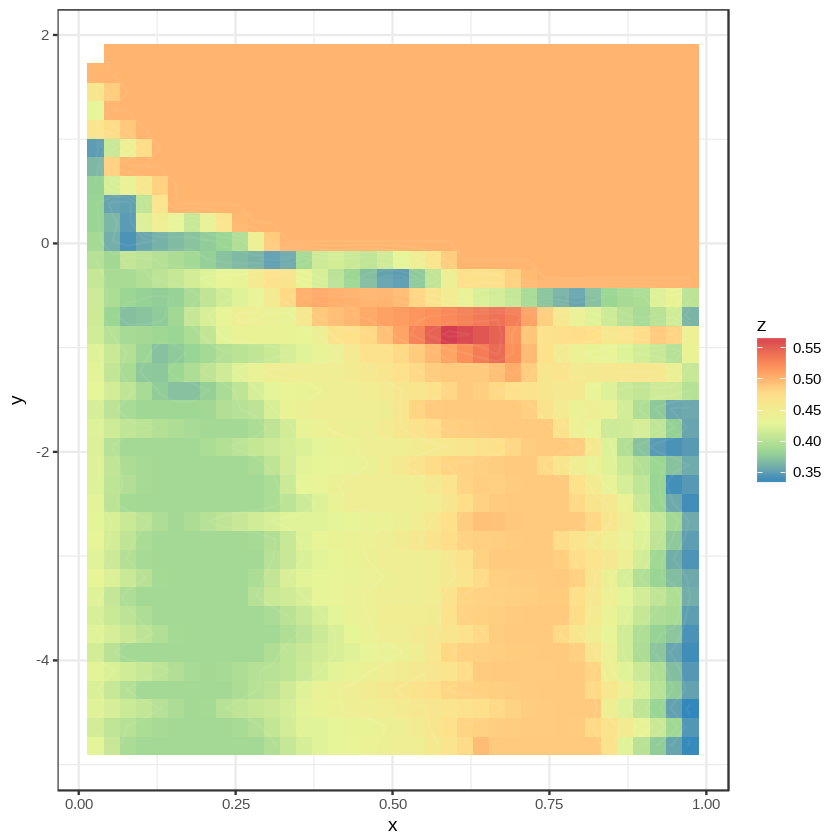

In [232]:
glmres = models$glmnet$results
graph.hyper(x=glmres$alpha, y=log10(glmres$lambda), z=glmres$ROC)

In [228]:
human.QFT.model = models$glmnet 

#### Figure 3A

[1] "This is the AUC:"
Area under the curve: 0.6387
[1] "This is the AUC p-value:"
[1] 0.9282259
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4577-0.8196 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.5444
[1] "This is the AUC p-value:"
[1] 0.6401524
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.2654-0.8234 (DeLong)


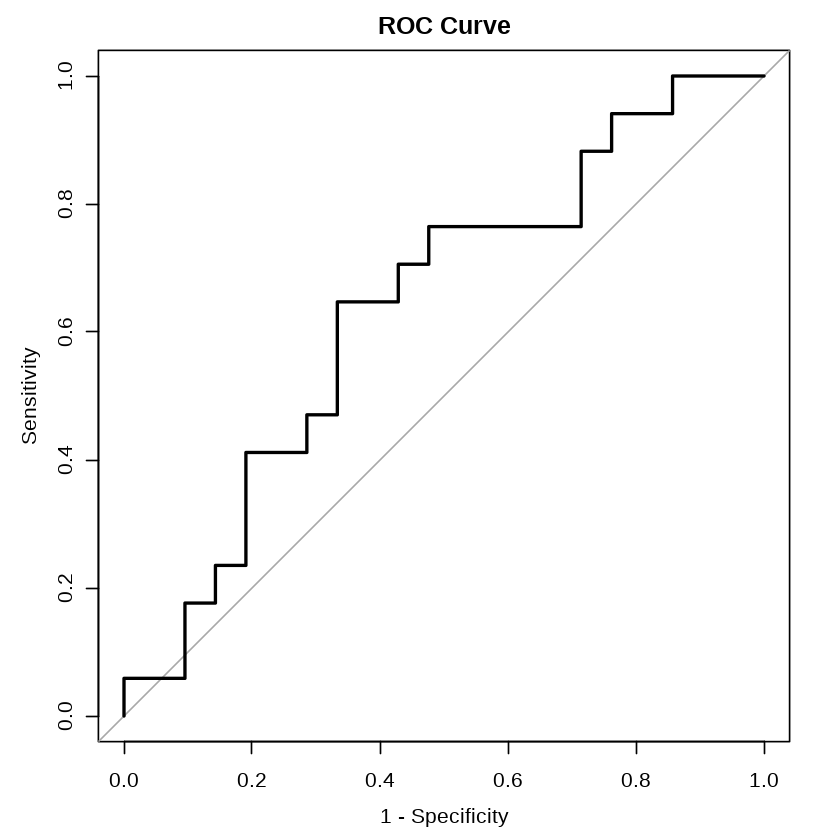

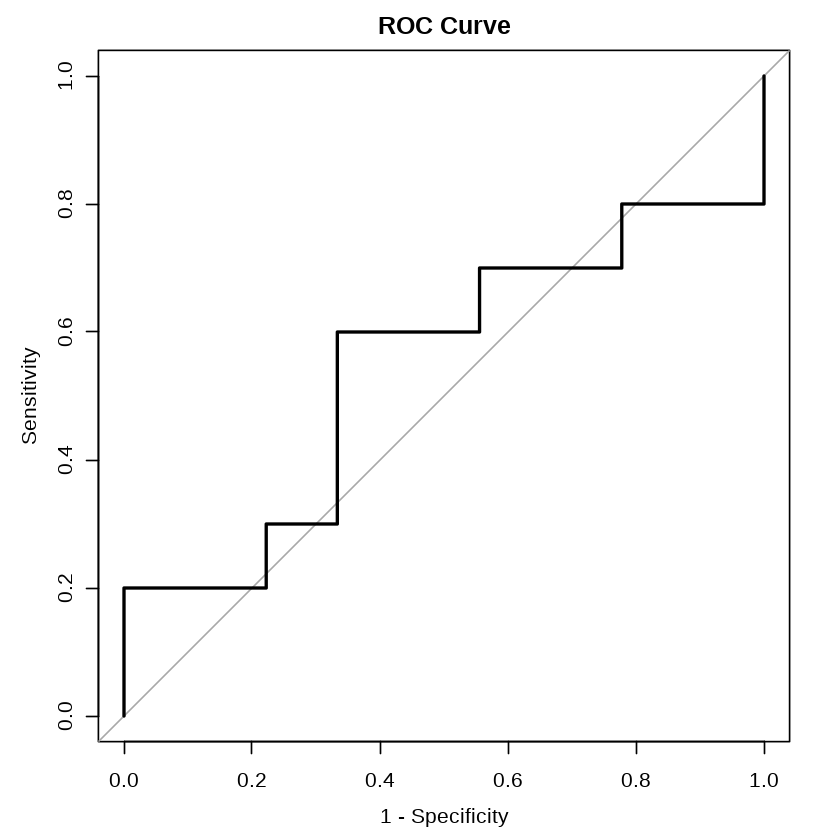

In [229]:
glmnet.human.QFT.val.ROC = my.roc(human.QFT.model$pred$early, human.QFT.model$pred$obs, "early")
       
pred.human.QFT.test = predict(human.QFT.model, newdata = ado.exprs.test, type="prob")

glmnet.human.QFT.test.ROC = my.roc(pred.human.QFT.test$early,
                          test.time.since.QFT.conversion,
                          "early")

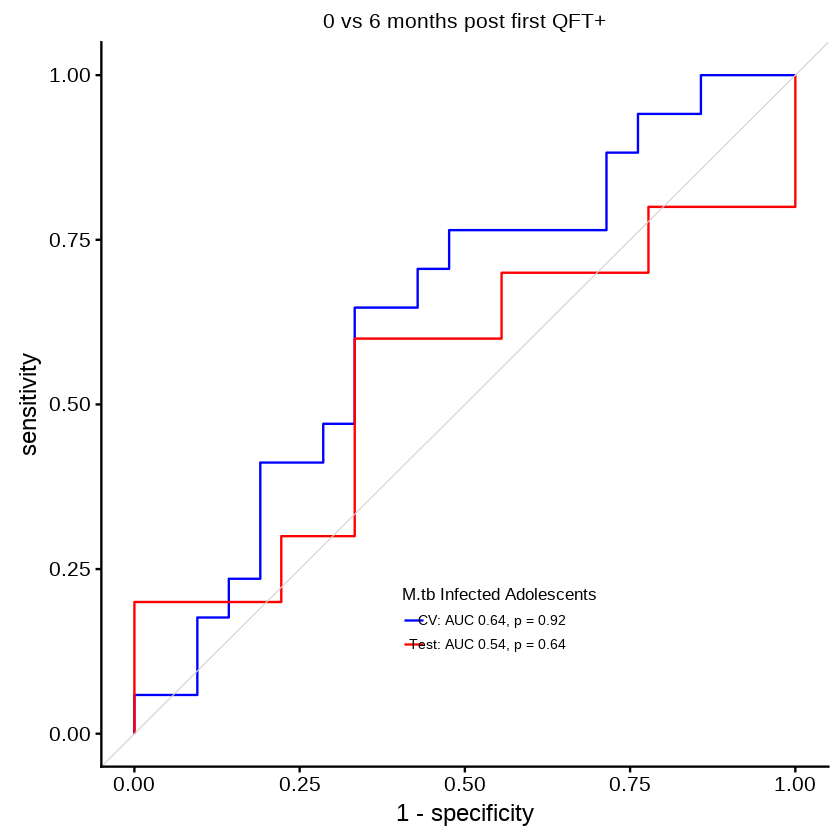

In [230]:
human.QFT.plot = ggroc(list(CV=glmnet.human.QFT.val.ROC, 
                                           test=glmnet.human.QFT.test.ROC), 
                                      legacy.axes=TRUE) +
                geom_abline(intercept = 0, slope = 1, color = "lightgrey", size = 0.25) + 
                ggtitle("0 vs 6 months post first QFT+") + theme(plot.title = element_text(size=12, face="plain")) +
                scale_color_manual(name="M.tb Infected Adolescents",
                                  labels=c("CV" =expression("CV: AUC 0.64, p = 0.92"),
                                           "test"=expression("Test: AUC 0.54, p = 0.64")),
                                  values=c("CV"="blue", "test"="red")) +
            theme(legend.position=c(0.40,0.20), legend.title = element_text(size=10), legend.text = element_text(size=8)) 
human.QFT.plot

### Load and preprocess data and prepare for machine learning for Figures 3B-D

In [46]:
source("utils_submission.R")

Sul.path = paste(path, "/data/GSE94438", sep="")

human.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

human.pheno = filter.human.pheno(pData(human.pheno.set))

human.exprs.set = read.csv(file=paste(Sul.path, "GSE94438_rawCounts_GeneNames_AllSamples.csv", sep="/"), header=T, row.names = 1)
human.exprs = filter.human.exprs(human.exprs.set, human.pheno)

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(human.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(human.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(human.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

In [47]:
# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(human.exprs <= 5, 1, mean) <= 0.5

human.exprs.fil = human.exprs[exprs.j.keep,]

human.exprs.qn = as.data.frame(normalize.quantiles(as.matrix(human.exprs.fil)))
colnames(human.exprs.qn) = colnames(human.exprs.fil)
rownames(human.exprs.qn) = rownames(human.exprs.fil)
human.exprs.log = log2(human.exprs.qn + 1)

human.pheno.6mo = human.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new human.pheno

AHRI.subj = unique(dplyr::filter(human.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
human.pheno.6mo$dataset[human.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"

# Filter pheno and splice expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

human.pheno.6mo = droplevels(dplyr::filter(human.pheno.6mo, site %in% c("AHRI", "MRC"), time.from.exposure.months %in% c(0, 6)))
human.pheno.6mo$status = ifelse(human.pheno.6mo$group == "Control", "control", "progressor")

human.exprs.log.6mo = human.exprs.log[, colnames(human.exprs.log) %in% human.pheno.6mo$code]

dim(human.pheno.6mo)
dim(human.exprs.log.6mo)
head(human.pheno.6mo)
head(human.exprs.log.6mo)

human.pheno.6mo.train = droplevels(dplyr::filter(human.pheno.6mo, dataset == "Training"))
human.pheno.6mo.test = droplevels(dplyr::filter(human.pheno.6mo, dataset != "Training"))

human.exprs.train = t(human.exprs.log.6mo[,as.character(human.pheno.6mo.train$code)])
human.exprs.test = t(human.exprs.log.6mo[, as.character(human.pheno.6mo.test$code)])

set.seed(100)
folds.6mo = groupKFold(human.pheno.6mo.train$subjectid, k=10)
for (fold in lapply(folds.6mo, function(x) {human.pheno.6mo.train$subjectid[x]}))
    print(length((as.character(fold))))

lapply(folds.6mo, function(x, y) table(y[x]), y = human.pheno.6mo.train$subjectid)


[1] 183  10

[1] 14842   183

age,code,gender,group,site,subjectid,time.from.exposure.months,time.to.tb.months,dataset,status
21,231,F,case (TB),AHRI,KHHC151,6,14,Training,progressor
20,235,F,case (TB),AHRI,ARHHC63,6,15,Test,progressor
26,248,M,case (TB),MRC,07/G300,0,10,Training,progressor
37,267,M,Control,MRC,07/G354,0,NA,Training,control
52,270,M,Control,MRC,07/G419,0,NA,Training,control
16,272,M,case (TB),MRC,08/G245,6,21,Training,progressor


,231,235,248,267,270,272,277,280,285,287,⋯,1039,1040,1042,1061,1062,1084,1103,1164,1196,1198
ENSG00000000003,3.826839,5.279328,2.217418,3.662508,3.885174,2.970809,4.176669,3.862171,5.404434,5.123012,⋯,3.180125,3.511572,3.050806,4.116613,4.390661,3.430704,3.462273,3.820456,3.981523,4.013839
ENSG00000000419,10.121752,10.581316,9.294640,9.041296,9.401630,8.575936,9.333196,8.252973,8.657032,9.411003,⋯,9.264556,8.536755,8.565981,9.309794,9.017231,9.191936,8.375149,9.565224,8.902844,8.801773
ENSG00000000457,9.459834,8.883254,9.519146,9.757906,9.430516,9.547550,9.566795,9.662788,9.785935,9.889297,⋯,9.833115,9.669295,9.875289,9.878426,9.429308,9.901105,9.736088,9.484452,9.909653,9.569499
ENSG00000000460,6.416530,6.349474,6.880727,6.929954,6.691453,7.306078,6.617279,6.199483,6.889960,6.757782,⋯,6.474170,6.603600,5.668603,5.783255,6.526940,6.760125,6.606920,6.516270,6.182759,7.985547
ENSG00000000938,15.108717,14.928224,15.240641,14.853718,14.983593,15.225416,14.213299,15.136584,15.240641,14.811619,⋯,14.876220,15.194902,15.136584,14.916084,15.413775,15.588929,15.288608,15.280180,15.304140,14.842417
ENSG00000000971,6.363433,3.774454,5.468685,8.320455,7.171517,4.327480,6.725656,4.918202,6.291429,5.876739,⋯,4.470137,4.897124,6.403551,3.435532,6.407795,6.964143,6.228401,5.672357,5.804559,3.141842


[1] 112
[1] 107
[1] 98
[1] 99
[1] 101
[1] 103
[1] 102
[1] 103
[1] 105
[1] 105


$Fold01

  07/G189   07/G274   07/G277   07/G300   07/G351   07/G354   07/G368   07/G370 
        1         1         1         0         1         1         1         1 
  07/G419   08/G136   08/G141   08/G160   08/G245   08/G260   08/G324   08/G333 
        1         1         1         1         1         2         2         1 
  08/G343   08/G367   08/G400   08/G407   08/G415   08/G423   08/G424   08/G433 
        1         2         1         1         1         1         1         2 
  08/G493   08/G494   08/G541   08/G587   08/G596   08/G606   08/G613   08/G643 
        1         1         1         1         1         1         1         1 
  08/G652   08/G654   08/G695   08/G701   08/G703   08/G714   08/G715   08/G726 
        2         1         1         1         2         1         1         1 
  08/G782   08/G788   08/G797   08/G800   08/G810   08/G814   08/G893   09/G120 
        1         1         2         1         1         1         1         1 
  09/G133   09/G135

### Filter genes that differ between 0 and 6 month time points with Wilcoxon test

In [48]:
start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

print("Made the clusters")

myFunc <- caretSBF
myFunc$summary <- twoClassSummary
myFunc$score <- function(x, y) {
  out <- wilcox.test(x ~ y)$p.value
  out
}

filtercontrol.lm = sbfControl(functions = myFunc, method = "cv",  index=folds.6mo,  allowParallel=TRUE) 
set.seed(10)
wilcoxWithFilter.lm = sbf(human.exprs.train, as.factor(human.pheno.6mo.train$time.from.exposure.months), sbfControl = filtercontrol.lm)
print("Did the feature selection")
stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "Made the clusters"
[1] "Did the feature selection"
Time difference of 11.18471 mins


In [49]:
optvars = wilcoxWithFilter.lm$optVariables

In [50]:
length(optvars)

[1] 2524

### Perform hyperparameter search on training set to discriminate 0 and 6 month time points post exposure

In [51]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-6), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))


In [52]:
time.period.from.exposure = as.factor(ifelse(human.pheno.6mo.train$time.from.exposure.months == "0", "early", "late"))
test.time.period.from.exposure = as.factor(ifelse(human.pheno.6mo.test$time.from.exposure.months == "0", "early", "late"))

In [53]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(human.exprs.train[, colnames(human.exprs.train) %in% c(optvars)],
                  time.period.from.exposure,
                  method=alg, tuneGrid = train.grid, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 1.975652 mins


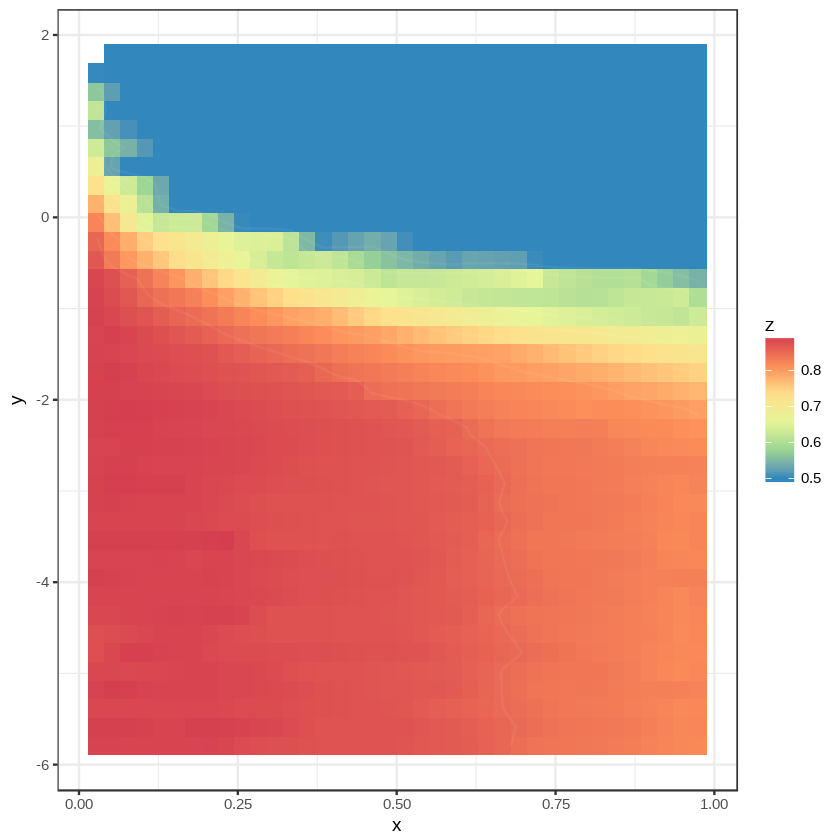

In [54]:
glmres = models$glmnet$results
graph.hyper(glmres$alpha, log10(glmres$lambda), glmres$ROC)

### Figure 3C

[1] "This is the AUC:"
Area under the curve: 0.8986
[1] "This is the AUC p-value:"
[1] 1.822595e-13
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.8418-0.9554 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6879
[1] "This is the AUC p-value:"
[1] 0.003761691
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.561-0.8148 (DeLong)


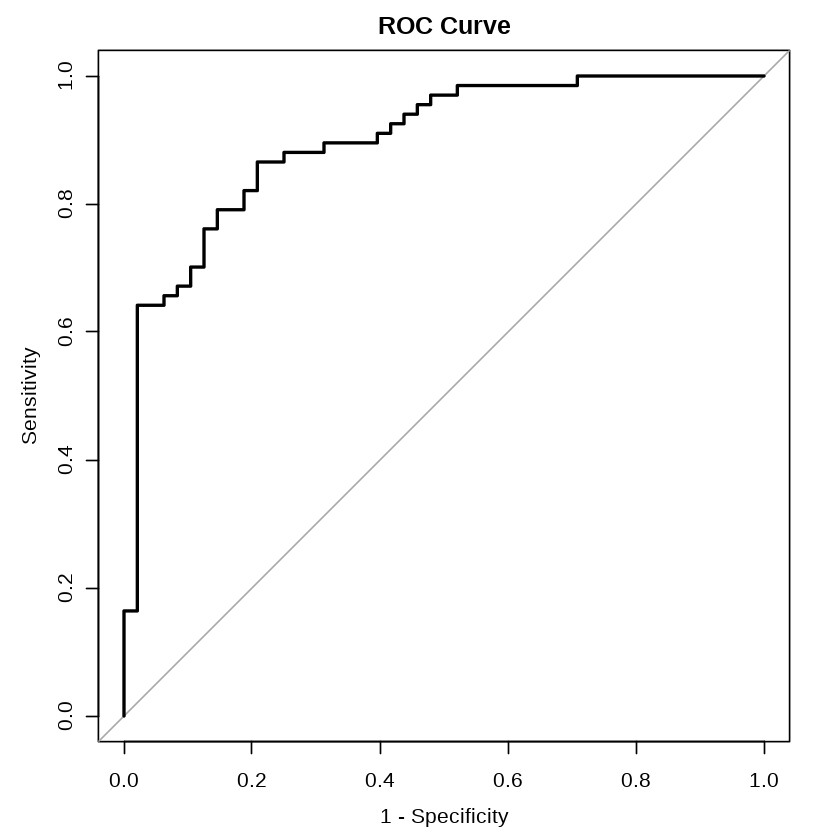

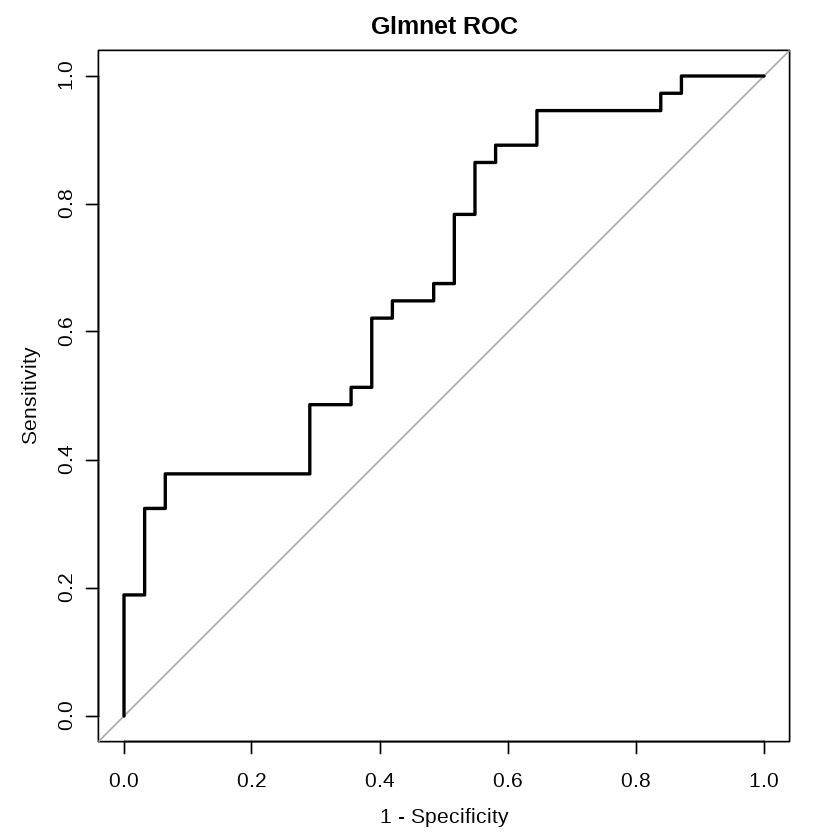

In [55]:
human.exposure.model = models$glmnet

glmnet.human.exposure.val.ROC = my.roc(human.exposure.model$pred$early, human.exposure.model$pred$obs, "early")

pred.human.exposure.test.prob = predict(human.exposure.model, newdata = human.exprs.test[, colnames(human.exprs.test) %in% c(optvars)], type="prob")

glmnet.human.exposure.test.ROC <- my.roc(pred.human.exposure.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

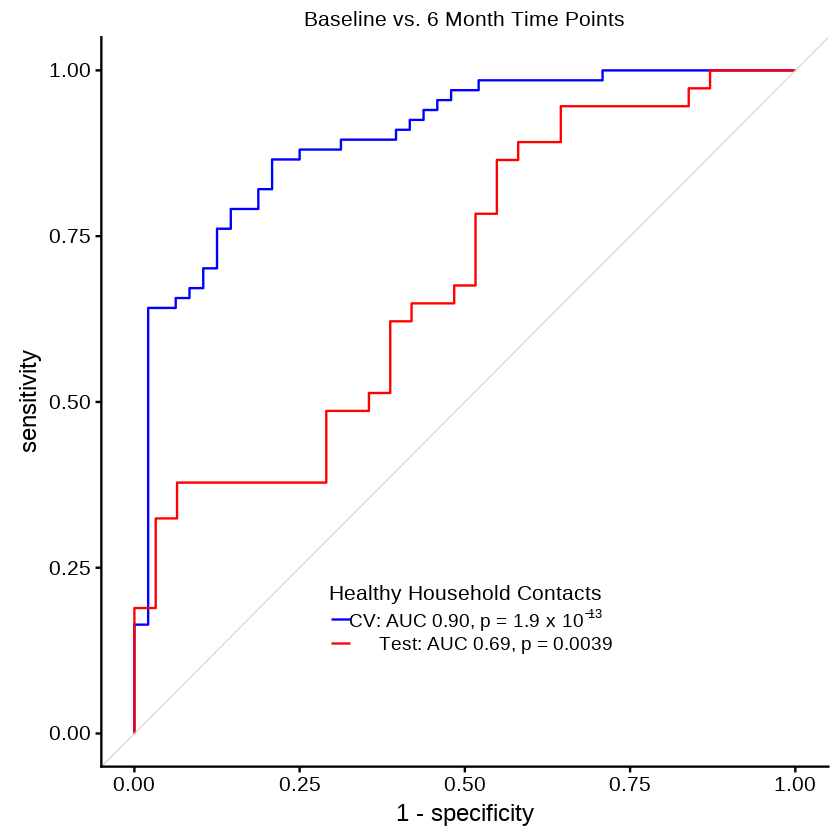

In [56]:
human.exposure.plot = ggroc(list(CV=glmnet.human.exposure.val.ROC, 
                                           test=glmnet.human.exposure.test.ROC), 
                                      legacy.axes=TRUE) +
                geom_abline(intercept = 0, slope = 1, color = "lightgrey", size = 0.25) + 
                ggtitle("Baseline vs. 6 Month Time Points") + theme(plot.title = element_text(size=12, face="plain")) +
                scale_color_manual(name="Healthy Household Contacts",
                                  labels=c("CV" =expression("CV: AUC 0.90, p ="~1.9~ "x" ~10^{-13} ~ " "),
                                           "test"=expression("Test: AUC 0.69, p = 0.0039")),
                                  values=c("CV"="blue", "test"="red")) +
            theme(legend.position=c(0.30,0.20), legend.title = element_text(size=12), legend.text = element_text(size=11)) 
human.exposure.plot

### Reproduce Figure 3B, showing that published signatures of risk of TB do not predict time since exposure

#### Load the data (must load previous human data beforehand) and train the models

In [57]:
Sul.genes = c("GAS6", "SEPT4", "CD1C", "BLK")
Sul.genes.sel = c("C1QC", "TRAV27", "ANRKD22", "OSBPL10")

ACS.genes = c("ANKRD22",
 "APOL1",
 "BATF2",
 "ETV7",
 "FCGR1A",
 "FCGR1B",
 "GBP1",
 "GBP2",
 "GBP4",
 "GBP5",
 "SCARF1",
 "SEPT4",
 "SERPING1",
 "STAT1",
 "TAP1",
 "TRAFD1"
)

ACS.transcripts = row.names(human.exprs.set)[match(unique(ACS.genes), human.exprs.set$symbol)]
Sul.transcripts = row.names(human.exprs.set)[match(unique(Sul.genes), human.exprs.set$symbol)]
Sul.transcripts.sel = row.names(human.exprs.set)[match(unique(Sul.genes.sel), human.exprs.set$symbol)]

human.exprs.train.ACS = human.exprs.train[, colnames(human.exprs.train) %in% ACS.transcripts]
human.exprs.train.Sul = human.exprs.train[, colnames(human.exprs.train) %in% Sul.transcripts]
human.exprs.train.Sul.sel = human.exprs.train[, colnames(human.exprs.train) %in% Sul.transcripts.sel]

human.exprs.test.ACS = human.exprs.test[, colnames(human.exprs.test) %in% ACS.transcripts]
human.exprs.test.Sul = human.exprs.test[, colnames(human.exprs.test) %in% Sul.transcripts]
human.exprs.test.Sul.sel = human.exprs.test[, colnames(human.exprs.test) %in% Sul.transcripts.sel]

human.exprs.train.TB.genes = human.exprs.train[, colnames(human.exprs.train) %in% c(ACS.transcripts,
                                                                                    Sul.transcripts,
                                                                                    Sul.transcripts.sel)]
human.exprs.test.TB.genes = human.exprs.test[, colnames(human.exprs.test) %in% c(ACS.transcripts,
                                                                                    Sul.transcripts,
                                                                                    Sul.transcripts.sel)]

time.period.from.exposure = as.factor(ifelse(human.pheno.6mo.train$time.from.exposure.months == "0", "early", "late"))
test.time.period.from.exposure = as.factor(ifelse(human.pheno.6mo.test$time.from.exposure.months == "0", "early", "late"))

In [58]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()

control <- trainControl(method="cv", index=folds.6mo, search="random", savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(human.exprs.train.ACS, 
                  as.factor(time.period.from.exposure), 
                  method=alg, tuneLength=30, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 37.82896 secs


In [59]:
ACS.human.exposure.model = models$glmnet

In [60]:
seed=7


start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()

control <- trainControl(method="cv", index=folds.6mo, search="random", savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(human.exprs.train.Sul, 
                  as.factor(time.period.from.exposure), 
                  method=alg, tuneLength=30, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 41.31243 secs


In [61]:
RISK4.human.exposure.model =models$glmnet

In [62]:
seed=7


start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, search="random", savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(human.exprs.train.Sul.sel, 
                  as.factor(time.period.from.exposure), 
                  method=alg, tuneLength=30, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 39.97914 secs


In [63]:
Sul.sel.human.exposure.model = models$glmnet

In [64]:
seed=7


start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, search="random", savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(human.exprs.train.TB.genes, 
                  as.factor(time.period.from.exposure), 
                  method=alg, tuneLength=30, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 41.07911 secs


In [65]:
TB.genes.human.exposure.model = models$glmnet

#### Figure 3B

[1] "This is the AUC:"
Area under the curve: 0.5815
[1] "This is the AUC p-value:"
[1] 0.1269821
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4387-0.7243 (DeLong)


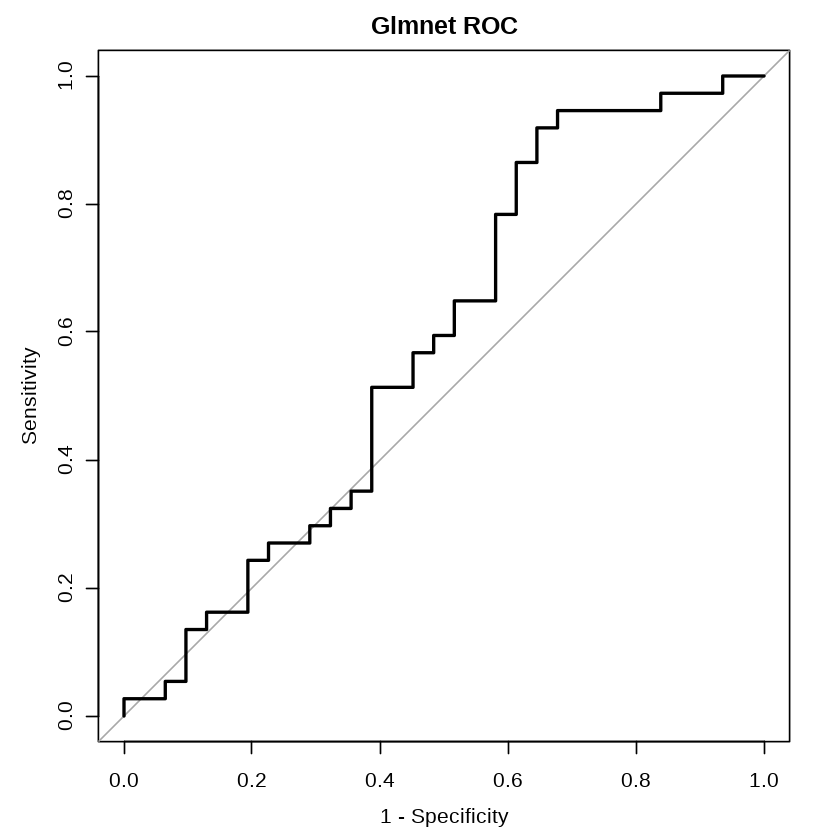

In [66]:
pred.human.test.ACS.exposure = predict(ACS.human.exposure.model, newdata = human.exprs.test.ACS, type="prob")

glmnet.human.test.ACS.exposure.ROC <- my.roc(pred.human.test.ACS.exposure$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.5527
[1] "This is the AUC p-value:"
[1] 0.7724687
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4103-0.6952 (DeLong)


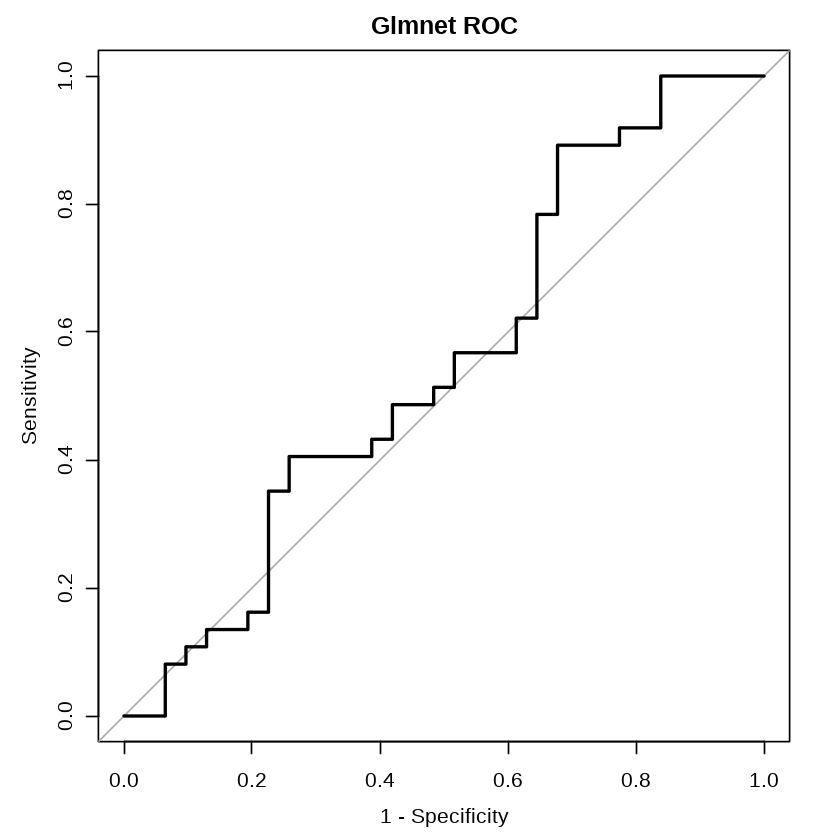

In [67]:
pred.human.test.RISK4.exposure = predict(RISK4.human.exposure.model, newdata = human.exprs.test.Sul , type="prob")

glmnet.human.test.RISK4.exposure.ROC <- my.roc(pred.human.test.RISK4.exposure$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.5514
[1] "This is the AUC p-value:"


Warning message in wilcox.test.default(pred[obs == 1], pred[obs == 0], alternative = "great"):
“cannot compute exact p-value with ties”

[1] 0.2356543
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4123-0.6905 (DeLong)


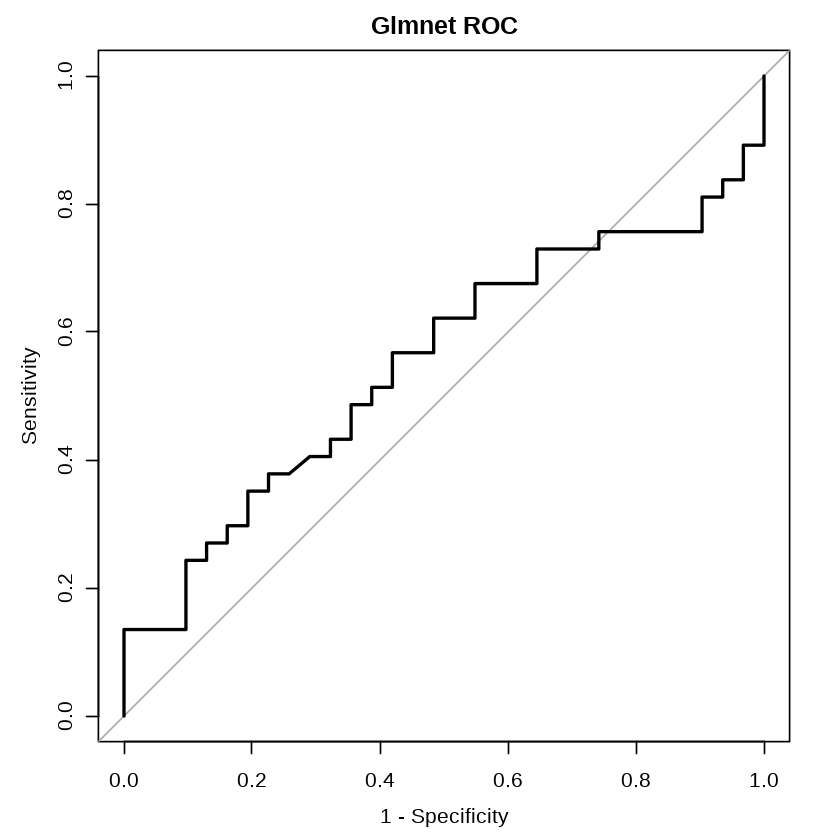

In [68]:
pred.human.test.Sul.sel.exposure = predict(Sul.sel.human.exposure.model, newdata = human.exprs.test.Sul.sel , type="prob")

glmnet.human.test.Sul.sel.exposure.ROC <- my.roc(pred.human.test.Sul.sel.exposure$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.5623
[1] "This is the AUC p-value:"
[1] 0.1921917
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4197-0.7049 (DeLong)


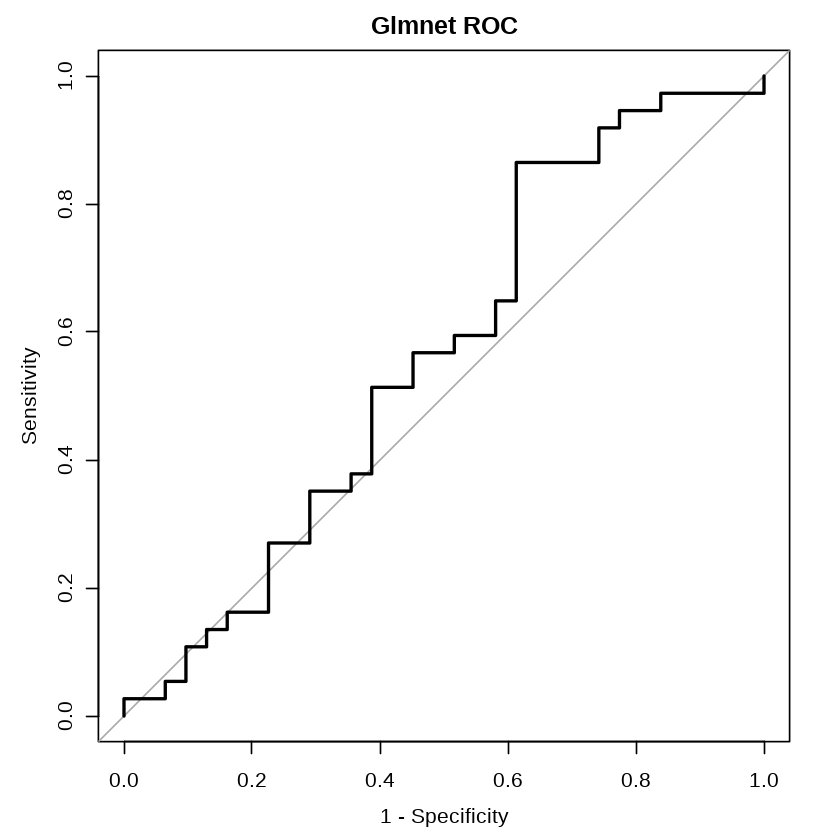

In [69]:
pred.human.test.TB.genes.exposure = predict(TB.genes.human.exposure.model, newdata = human.exprs.test.TB.genes , type="prob")

glmnet.human.test.TB.genes.exposure.ROC <- my.roc(pred.human.test.TB.genes.exposure$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

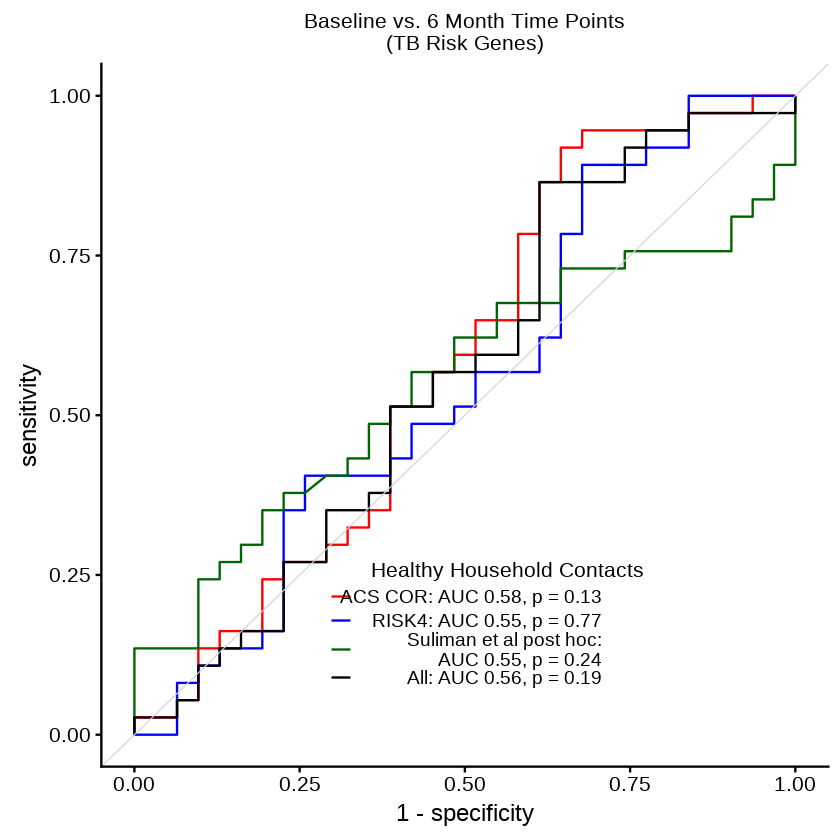

In [70]:
human.riskgenes.exposure.plot = ggroc(list(ACS=glmnet.human.test.ACS.exposure.ROC, 
                                           RISK4=glmnet.human.test.RISK4.exposure.ROC,
                                            Sel=glmnet.human.test.Sul.sel.exposure.ROC,
                                          TB=glmnet.human.test.TB.genes.exposure.ROC), 
                                      legacy.axes=TRUE) +
                geom_abline(intercept = 0, slope = 1, color = "lightgrey", size = 0.25) + 
                ggtitle("Baseline vs. 6 Month Time Points\n(TB Risk Genes)") + theme(plot.title = element_text(size=12, face="plain")) +
                scale_color_manual(name="       Healthy Household Contacts", 
                                  labels=c("ACS" =expression("ACS COR: AUC 0.58, p = 0.13"),
                                           "RISK4"=expression("RISK4: AUC 0.55, p = 0.77"),
                                           "Sel"=expression("Suliman et al post hoc:\nAUC 0.55, p = 0.24"),
                                          "TB"=expression("All: AUC 0.56, p = 0.19")),
                                  values=c("ACS"="red", "RISK4"="blue", "Sel"="darkgreen", "TB"="black")) +
            theme(legend.position=c(0.30,0.20), legend.title = element_text(size=12), legend.text = element_text(size=11))  
human.riskgenes.exposure.plot

### Reproduce Figure 3D, showing that the genes in our signature of time since exposure cannot predict risk of TB in the GC6-74 cohort.

#### Select the genes in our signature and train a model with these genes to predict risk of TB progression.

In [158]:
human.exposure.glmnet = human.exposure.model$finalModel

coefs.human.6mo = coef(human.exposure.glmnet , s=models$glmnet$bestTune$lambda)

nonzero.coefs.r = data.frame(name = coefs.human.6mo@Dimnames[[1]][coefs.human.6mo@i + 1], coefficient = coefs.human.6mo@x)
sort.coeffs.r = nonzero.coefs.r[order(-abs(nonzero.coefs.r$coefficient)), ]#, sort(abs(nonzero.coefs$coefficient), T)

genes.coefs.r = sort.coeffs.r$name[2:length(sort.coeffs.r$name)]

In [159]:
length(genes.coefs.r)

[1] 254

In [161]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-6), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))


In [162]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(human.exprs.train[,colnames(human.exprs.train) %in% as.character(genes.coefs.r)], 
                  as.factor(human.pheno.6mo.train$status), 
                  method=alg, tuneGrid = train.grid, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 57.74353 secs


In [163]:
human.TB.from.exposure.model = models$glmnet
exposure.genes = genes.coefs.r

#### Figure 3D

Confusion Matrix and Statistics

            Reference
Prediction   control progressor
  control         83         32
  progressor       0          0
                                          
               Accuracy : 0.7217          
                 95% CI : (0.6305, 0.8013)
    No Information Rate : 0.7217          
    P-Value [Acc > NIR] : 0.5475          
                                          
                  Kappa : 0               
 Mcnemar's Test P-Value : 4.251e-08       
                                          
            Sensitivity : 0.0000          
            Specificity : 1.0000          
         Pos Pred Value :    NaN          
         Neg Pred Value : 0.7217          
             Prevalence : 0.2783          
         Detection Rate : 0.0000          
   Detection Prevalence : 0.0000          
      Balanced Accuracy : 0.5000          
                                          
       'Positive' Class : progressor      
                                

Confusion Matrix and Statistics

            Reference
Prediction   control progressor
  control         52         16
  progressor       0          0
                                          
               Accuracy : 0.7647          
                 95% CI : (0.6462, 0.8591)
    No Information Rate : 0.7647          
    P-Value [Acc > NIR] : 0.5665583       
                                          
                  Kappa : 0               
 Mcnemar's Test P-Value : 0.0001768       
                                          
            Sensitivity : 0.0000          
            Specificity : 1.0000          
         Pos Pred Value :    NaN          
         Neg Pred Value : 0.7647          
             Prevalence : 0.2353          
         Detection Rate : 0.0000          
   Detection Prevalence : 0.0000          
      Balanced Accuracy : 0.5000          
                                          
       'Positive' Class : progressor      
                                

[1] "This is the AUC:"
Area under the curve: 0.5693
[1] "This is the AUC p-value:"
[1] 0.8752258
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4409-0.6977 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6322
[1] "This is the AUC p-value:"
[1] 0.05669511
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4645-0.7999 (DeLong)


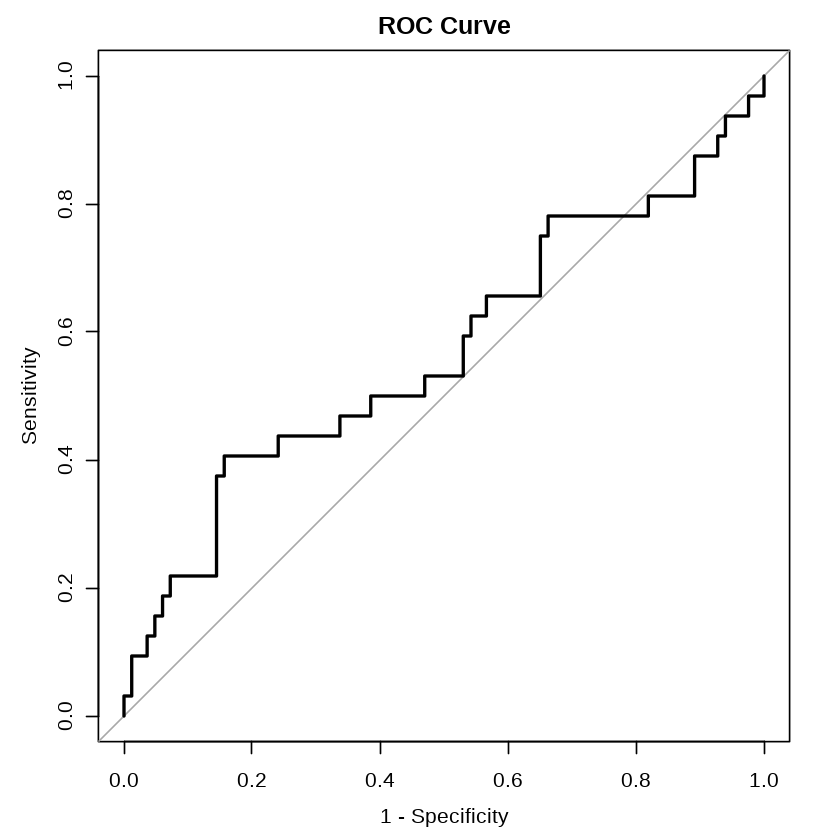

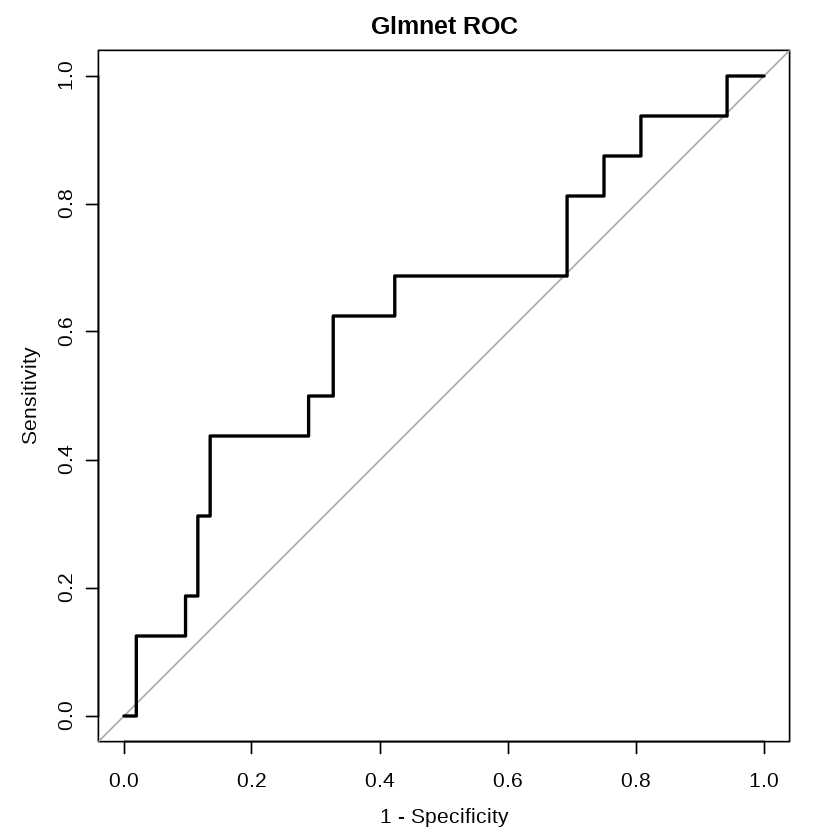

In [166]:
pred.human.TB.from.exposure.test = predict(human.TB.from.exposure.model, newdata = human.exprs.test[,colnames(human.exprs.test) %in% as.character(exposure.genes)])


confusionMatrix(human.TB.from.exposure.model$pred$pred, human.TB.from.exposure.model$pred$obs, positive= "progressor")
confusionMatrix(pred.human.TB.from.exposure.test, as.factor(human.pheno.6mo.test$status), positive = "progressor")

glmnet.human.TB.from.exposure.val.ROC = my.roc(human.TB.from.exposure.model$pred$progressor, human.TB.from.exposure.model$pred$obs, "progressor")

pred.human.TB.from.exposure.test.prob = predict(human.TB.from.exposure.model, newdata = human.exprs.test[,colnames(human.exprs.test) %in% as.character(exposure.genes)], type="prob")

glmnet.human.TB.from.exposure.test.ROC <- my.roc(pred.human.TB.from.exposure.test.prob$progressor,
                        as.factor(human.pheno.6mo.test$status),
                     "progressor", title="Glmnet ROC")

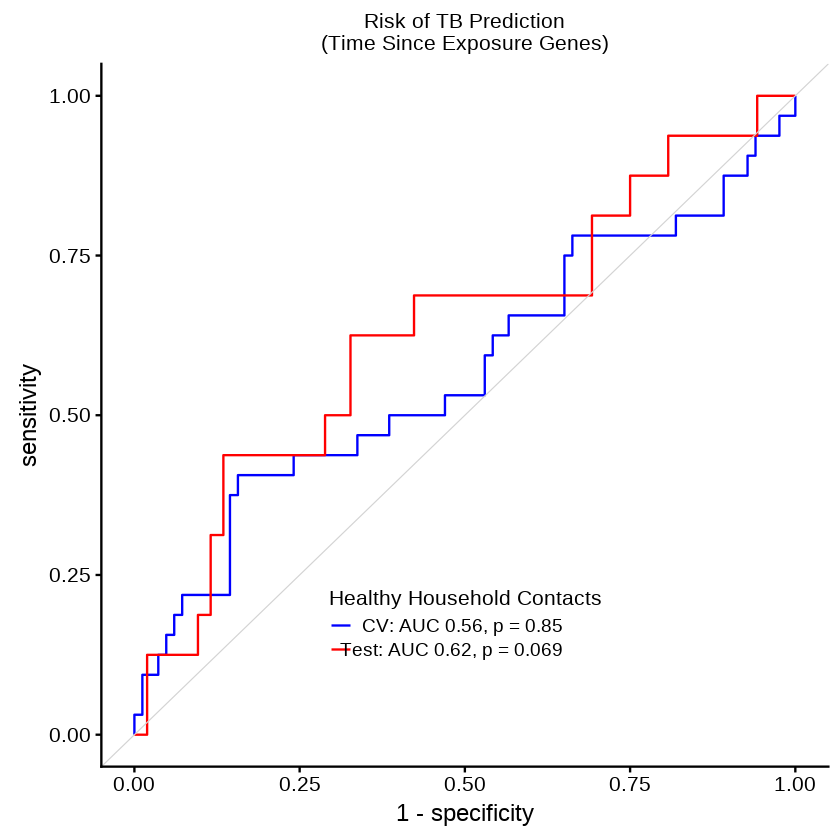

In [165]:
human.TB.from.exposure.plot = ggroc(list(CV=glmnet.human.TB.from.exposure.val.ROC , 
                                           test=glmnet.human.TB.from.exposure.test.ROC ), 
                                      legacy.axes=TRUE) +
                geom_abline(intercept = 0, slope = 1, color = "lightgrey", size = 0.25) + 
                ggtitle("Risk of TB Prediction\n(Time Since Exposure Genes)") + theme(plot.title = element_text(size=12, face="plain")) +
                scale_color_manual(name="Healthy Household Contacts",
                                  labels=c("CV" =expression("CV: AUC 0.56, p = 0.85"),
                                           "test"=expression("Test: AUC 0.62, p = 0.069")),
                                  values=c("CV"="blue", "test"="red")) +
            theme(legend.position=c(0.30,0.20), legend.title = element_text(size=12), legend.text = element_text(size=11)) 
human.TB.from.exposure.plot

## Figure 4 Human Analysis (Grand Challenges 6-74 cohort, Singhania et al UK, South Africa and Leicester cohort studies, Adolescent Cohort Study)

- This code reproduces the analysis of Figure 4, showing that "Application of gene expression signature of time since active TB exposure to the Leicester cohort confirms its identification of recent exposure in humans"

### Load and Install Required Libraries

In [1]:
if (!require("preprocessCore")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("preprocessCore")
  library("preprocessCore")
}

source("https://bioconductor.org/biocLite.R")
if (!require("Biobase")) {
  biocLite("Biobase")
  library("Biobase")
}
if (!require("GEOquery")) {
  biocLite("GEOquery")
  library("GEOquery")
}

if (!require("ggplot2")) {
  install.packages("ggplot2")
  library("ggplot2")
}

if (!require("glmnet")) {
  install.packages("glmnet")
  library("glmnet")
}

if (!require("caret")) {
  install.packages("caret")
  library("caret")
}
if (!require("dplyr")) {
  install.packages("dplyr")
  library("dplyr")
}

if (!require("ggsignif")) {
  install.packages("ggsignif")
  library("ggsignif")
}

if (!require("doParallel")) {
  install.packages("doParallel")
  library("doParallel")
}

if (!require("cowplot")) {
  install.packages("cowplot")
  library("cowplot")
}

if (!require("e1071")) {
  install.packages("e1071")
  library("e1071")
}

if (!require("pROC")) {
    # pROC 1.12.0 is required, and may not be the default installation:
    packageUrl<- "https://cran.r-project.org/src/contrib/Archive/pROC/pROC_1.12.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("pROC")
}

if (!require("MetaIntegrator")) {
    
  # First install several dependencies required by MetaIntegrator 2.0.0
    if (!require("multtest")) {
      biocLite("multtest")
      library("multtest")
    }

    if (!require("GEOmetadb")) {
      biocLite("GEOmetadb")
      library("GEOmetadb")
    }
    
    if (!require("biomaRt")) {
      biocLite("biomaRt")
      library("biomaRt")
    }
    
    install.packages(c("ggpubr", "ROCR", "pracma", "COCONUT" , "Metrics", "manhattanly", "snplist", "DT", "pheatmap", "HGNChelper"))
    
    # Now install MetaIntegrator. Version 2.0.0 is required to use ImmunoStates
    packageUrl = "https://cran.r-project.org/src/contrib/MetaIntegrator_2.0.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("MetaIntegrator")
}

if (!require("stringr")) {
  install.packages("stringr")
  library("stringr")
}

Loading required package: preprocessCore
Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install
Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, cbind, colMeans, colnames,
    colSums, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, lengths, Map, mapply, match,
    mget, order, paste, pmax, 

### Reviewer 1, Comment 1, Attempt to validate human signature in Adolescent M.tb acquisition study and other TB microarray datasets

- Not possible to test this, since Microarray and RNA-seq are not comparable for this purpose. I tried 3 pre-specified normalization procedures and got wildly and uninterpretable results from all of them. Almost all samples were predicted as late, which is contrary to the biology discovered through all of the RNA-seq datasets

#### Load the data

In [414]:
source("utils_submission.R")

In [5]:
Sul.path = paste(path, "/data/GSE94438", sep="")

Sul.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

Sul.pheno = filter.human.pheno(pData(Sul.pheno.set))

# Common names for progressor
Sul.pheno$group = ifelse(Sul.pheno$group == "Control", "control", "progressor")

Sul.exprs = read.table(paste(Sul.path, "gene_count_GSE94438.tsv", sep="/"), header=T, row.names=1)
Sul.exprs = filter.HUMAN.exprs(Sul.exprs, Sul.pheno) 

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

In [415]:
micro.path = paste(path, "/data/Illumina_microarray_GSE_validation", sep="")
micro.exprs = read.csv(paste(micro.path, "Illumina_microarray_validation_exprs.csv", sep="/"), header=T, row.names=1)
micro.pheno = read.csv(paste(micro.path, "Illumina_microarray_validation_pheno.csv", sep="/"), header=T, row.names=1)

In [10]:
dim(micro.exprs)
dim(micro.pheno)

[1] 15821  1726

[1] 1726    2

In [223]:
ado.path =  paste(path, "/data/GSE116014", sep="")
ado.exprs = read.csv(paste(ado.path, "GSE116014_gene_exprs.csv", sep="/"), header=T, row.names=1)
ado.pheno = read.csv(paste(ado.path, "GSE116014_pheno.csv", sep="/"), header=T, row.names=1)

In [224]:
colnames(ado.pheno) = gsub("\\.\\.", "\\.", gsub("days\\.","days", gsub("\\.ch1","",colnames(ado.pheno))))


ado.pheno = ado.pheno[,c('draw.day',
                         'latent.tb.status.at.blood.draw',
                         'patientid',
                         'relative.time.from.conversion.days',
                         'time.of.conversion.days',
                         'tissue')]
num.f = c  ('draw.day',
                         'relative.time.from.conversion.days',
                         'time.of.conversion.days')
            
for (f in num.f) {
    ado.pheno[,f] = as.numeric(ado.pheno[,f])
}


In [225]:
summary(ado.pheno)

    draw.day     latent.tb.status.at.blood.draw        patientid 
 Min.   :180.0   Mode :logical                  ID#: 04/1154: 4  
 1st Qu.:180.0   FALSE:24                       ID#: 07/0675: 4  
 Median :360.0   TRUE :58                       ID#: 04/0017: 3  
 Mean   :403.9                                  ID#: 04/0041: 3  
 3rd Qu.:540.0                                  ID#: 04/0693: 3  
 Max.   :720.0                                  ID#: 04/0702: 3  
                                                (Other)     :62  
 relative.time.from.conversion.days time.of.conversion.days   tissue  
 Min.   :-360.000                   Min.   :180.0           blood:82  
 1st Qu.:-180.000                   1st Qu.:180.0                     
 Median :   0.000                   Median :450.0                     
 Mean   :   2.195                   Mean   :401.7                     
 3rd Qu.: 180.000                   3rd Qu.:540.0                     
 Max.   : 360.000                   Max.   :54

In [226]:
head(ado.exprs)

,GSM3207067,GSM3207068,GSM3207069,GSM3207070,GSM3207071,GSM3207072,GSM3207073,GSM3207074,GSM3207075,GSM3207076,⋯,GSM3207139,GSM3207140,GSM3207141,GSM3207142,GSM3207143,GSM3207144,GSM3207145,GSM3207146,GSM3207147,GSM3207148
EEF1A1,12.062813,12.363392,12.143102,12.203640,11.594336,12.073794,12.884433,12.518012,12.581850,12.104336,⋯,12.365669,11.623439,12.320754,12.239115,12.180012,12.141844,11.958245,12.244181,12.030262,11.472615
GAPDH,10.640293,10.893443,10.670316,10.531235,11.236940,10.247784,11.417515,10.981786,10.999149,10.776904,⋯,10.879416,9.891088,10.034716,11.085251,10.595153,10.799271,10.544258,10.847854,10.479719,9.955560
SLC35E2,6.823122,6.645543,6.479044,6.739670,6.600189,6.471781,6.817936,6.792997,6.746233,6.761210,⋯,6.561135,6.621153,6.619460,6.715844,6.734424,6.673964,6.548222,6.791676,6.669483,6.586496
DUSP22,7.888233,8.121801,8.025611,7.955341,7.925626,7.919920,8.292499,8.111821,8.307648,8.179546,⋯,8.022611,7.711783,7.978579,8.170439,8.048968,7.826655,7.960078,8.106408,7.854389,7.586938
RPS28,11.500381,11.960579,10.918053,11.662291,11.051928,11.167774,12.434829,12.034115,11.798133,11.420668,⋯,12.400737,11.889068,13.190942,11.789620,11.769986,11.766503,12.372343,12.582961,12.332914,11.801557
IPO13,6.905578,6.974370,6.825335,7.112130,6.882417,6.957010,7.127518,7.004687,7.305513,6.893010,⋯,7.018215,6.737404,6.940401,6.860053,6.906866,7.045469,6.881627,7.093787,6.878672,6.794823


In [15]:
match.genes = intersect(intersect(rownames(ado.exprs), rownames(Sul.exprs)), rownames(micro.exprs))
length(match.genes)

[1] 15614

In [16]:
Sul.exprs.ado = Sul.exprs[rownames(Sul.exprs) %in% match.genes,]
ado.exprs.S = ado.exprs[rownames(ado.exprs) %in% match.genes,]
micro.exprs.m = micro.exprs[rownames(micro.exprs) %in% match.genes,]

In [17]:
Sul.exprs.ado = Sul.exprs.ado[match( rownames(ado.exprs.S), rownames(Sul.exprs.ado) ),]
micro.exprs.m = micro.exprs.m[match( rownames(ado.exprs.S), rownames(micro.exprs.m) ),]

In [18]:
dim(Sul.exprs.ado)
dim(ado.exprs.S)
dim(micro.exprs.m)

[1] 15614   415

[1] 15614    82

[1] 15614  1726

In [92]:
head(rownames(Sul.exprs.ado))

[1] "EEF1A1"  "GAPDH"   "SLC35E2" "DUSP22"  "RPS28"   "IPO13"

[1] "EEF1A1"  "GAPDH"   "SLC35E2" "DUSP22"  "RPS28"   "IPO13"

In [19]:
identical(rownames(Sul.exprs.ado), rownames(ado.exprs.S))
identical(rownames(micro.exprs.m), rownames(ado.exprs.S))

[1] TRUE

[1] TRUE

In [93]:
head(Sul.exprs.ado)

,GSM2475580,GSM2475669,GSM2475553,GSM2475481,GSM2475555,GSM2475694,GSM2475692,GSM2475688,GSM2475636,GSM2475656,⋯,GSM2475741,GSM2475742,GSM2475743,GSM2475744,GSM2475745,GSM2475746,GSM2475747,GSM2475748,GSM2475749,GSM2475750
EEF1A1,164706,220248,260126,212746,251475,315830,216577,311195,330837,375945,⋯,300571,500311,345169,208335,223995,446102,312684,500287,247656,249950
GAPDH,97458,91473,132410,66038,39075,77930,72105,60563,114063,62772,⋯,58807,83545,61468,59036,85202,67202,50042,48020,74092,100978
SLC35E2,171,195,146,298,204,378,583,452,590,465,⋯,149,196,287,314,240,425,400,529,303,127
DUSP22,2529,2760,4122,3356,2526,3520,3552,4645,5550,5007,⋯,3496,4119,4593,3488,4225,4896,3269,4803,5576,3506
RPS28,27624,26308,32984,23829,21189,38111,22518,18526,26668,19488,⋯,27854,46941,24706,16193,18158,40931,22322,26854,20248,42890
IPO13,1929,1624,1752,1266,1006,1811,1861,1876,2523,1573,⋯,1414,1638,1253,1016,1560,1234,1159,1083,1437,1800


In [20]:
ado.exprs.S.exp = 2 ^ ado.exprs.S
micro.exprs.exp = 2 ^ micro.exprs.m

In [21]:
head(micro.exprs.exp)

,GSM484368,GSM484369,GSM484370,GSM484371,GSM484372,GSM484373,GSM484374,GSM484375,GSM484376,GSM484377,⋯,GSM1051020,GSM1051021,GSM1051022,GSM1051029,GSM1051030,GSM1051031,GSM1051032,GSM1051033,GSM1051036,GSM1051037
EEF1A1,19989.99912,17852.81290,14326.93500,15674.11352,17304.94520,19364.3576,20139.74148,20449.65075,15914.66768,19455.67413,⋯,3094.988,2929.3605,3724.7349,5170.2732,3962.1866,6024.6436,3237.1578,2835.6657,2355.5605,4590.6792
GAPDH,729.76199,853.36732,770.82520,821.02487,706.91547,829.6652,717.23770,722.42097,597.54138,608.98873,⋯,712.209,895.1770,798.8725,896.3217,1004.3938,1283.3745,836.8697,682.2868,530.1427,880.4977
SLC35E2,71.72835,68.68446,75.04791,79.03395,64.81797,66.0584,65.73643,61.98636,60.47047,64.98378,⋯,35.500,33.0000,36.9000,33.9000,30.5000,33.3000,36.6000,30.6000,27.2000,28.8000
DUSP22,239.28086,222.53511,230.93916,225.96349,223.60760,276.8884,201.37917,191.33403,223.84396,225.21127,⋯,179.989,172.5432,176.6590,196.9656,214.0114,260.0294,136.0722,134.4933,121.0381,191.2590
RPS28,2908.49092,2078.07092,2758.04592,3077.97592,2921.66692,2714.4409,3347.33492,3680.26992,2571.84792,3566.81192,⋯,2918.100,992.2000,2075.5000,2936.2000,1329.1000,2321.4000,1336.8000,854.2000,897.4000,1959.5000
IPO13,97.19885,94.95678,97.40005,88.82530,95.37832,110.2854,96.31090,93.91022,95.88347,92.78857,⋯,64.000,69.2000,82.5000,47.0000,46.7000,74.2000,43.9000,43.7000,32.1000,43.9000


In [106]:
head(ado.exprs.S.exp)

,GSM3207067,GSM3207068,GSM3207069,GSM3207070,GSM3207071,GSM3207072,GSM3207073,GSM3207074,GSM3207075,GSM3207076,⋯,GSM3207139,GSM3207140,GSM3207141,GSM3207142,GSM3207143,GSM3207144,GSM3207145,GSM3207146,GSM3207147,GSM3207148
EEF1A1,4278.2741,5269.2860,4523.11933,4716.9538,3092.02448,4310.96143,7561.3773,5865.3914,6130.7582,4403.1970,⋯,5277.60814,3155.03230,5115.83441,4834.3783,4640.3323,4519.1760,3979.15148,4851.3848,4182.8243,2841.8511
GAPDH,1596.0527,1902.1859,1629.61511,1479.8501,2413.54768,1215.87944,2735.3594,2022.3066,2046.7919,1754.5729,⋯,1883.78206,949.54204,1048.93960,2172.6664,1546.8882,1781.9867,1493.26882,1843.0179,1427.9394,992.9380
SLC35E2,113.2307,100.1170,89.20444,106.8668,97.01856,88.75653,112.8245,110.8909,107.3541,108.4744,⋯,94.42751,98.43865,98.32322,105.1164,106.4790,102.1088,93.58611,110.7894,101.7922,96.1021
DUSP22,236.9163,278.5516,260.58520,248.1969,243.13711,242.17724,313.5385,276.6314,316.8482,289.9271,⋯,260.04381,209.64189,252.22709,288.1027,264.8382,227.0167,249.01315,275.5953,231.4231,192.2630
RPS28,2897.0745,3985.5947,1934.91248,3241.1523,2123.05859,2300.56763,5536.7695,4194.0117,3561.1626,2741.3455,⋯,5407.46533,3792.85474,9351.24121,3540.2124,3492.3574,3483.9382,5302.08057,6135.4819,5159.1382,3569.6250
IPO13,119.8909,125.7462,113.40458,138.3454,117.98151,124.24210,139.8289,128.4165,158.1898,118.8510,⋯,129.62633,106.69912,122.81992,116.1667,119.9979,132.0984,117.91695,136.5975,117.6756,111.0313


In [94]:
head(ado.exprs.S)

,GSM3207067,GSM3207068,GSM3207069,GSM3207070,GSM3207071,GSM3207072,GSM3207073,GSM3207074,GSM3207075,GSM3207076,⋯,GSM3207139,GSM3207140,GSM3207141,GSM3207142,GSM3207143,GSM3207144,GSM3207145,GSM3207146,GSM3207147,GSM3207148
EEF1A1,12.062813,12.363392,12.143102,12.203640,11.594336,12.073794,12.884433,12.518012,12.581850,12.104336,⋯,12.365669,11.623439,12.320754,12.239115,12.180012,12.141844,11.958245,12.244181,12.030262,11.472615
GAPDH,10.640293,10.893443,10.670316,10.531235,11.236940,10.247784,11.417515,10.981786,10.999149,10.776904,⋯,10.879416,9.891088,10.034716,11.085251,10.595153,10.799271,10.544258,10.847854,10.479719,9.955560
SLC35E2,6.823122,6.645543,6.479044,6.739670,6.600189,6.471781,6.817936,6.792997,6.746233,6.761210,⋯,6.561135,6.621153,6.619460,6.715844,6.734424,6.673964,6.548222,6.791676,6.669483,6.586496
DUSP22,7.888233,8.121801,8.025611,7.955341,7.925626,7.919920,8.292499,8.111821,8.307648,8.179546,⋯,8.022611,7.711783,7.978579,8.170439,8.048968,7.826655,7.960078,8.106408,7.854389,7.586938
RPS28,11.500381,11.960579,10.918053,11.662291,11.051928,11.167774,12.434829,12.034115,11.798133,11.420668,⋯,12.400737,11.889068,13.190942,11.789620,11.769986,11.766503,12.372343,12.582961,12.332914,11.801557
IPO13,6.905578,6.974370,6.825335,7.112130,6.882417,6.957010,7.127518,7.004687,7.305513,6.893010,⋯,7.018215,6.737404,6.940401,6.860053,6.906866,7.045469,6.881627,7.093787,6.878672,6.794823


#### 1st pre-specified attempt, quantile normalize GC6-74 and Adolescent data together

- With just this one microarray dataset, couldn't be sure the results were due to actual biology or the microarray technical differences resulting in random prediction

- Other thoughts, given I don't feel I can trust GC6-74 and Adolescent data
        - I could use the microarray data as the reference data
- I think the best thing would be to find a TB dataset that was performed with the same microarray platform. Maybe Berry et al was (and this I can match up the correlation between microarray results and the RNA-seq results). Do the joint analysis with all of these data, then see if what I observed before with RNA-seq and Berry is repeated. This can rule out 
- GSE22098 Berry et al uses 3.0 vs 4.0 Illumina HumanHT-12. So I think that may be about as similar as I can get.
- Okay, I am going to add on GSE42834, in the paper previous to this that collected the LTBI controls, a great description is given of their exposur status (only 5 of over 40 are aware of any prolonged contact to a case of active TB). GSE42834 uses version 4.0. 

- ACTUALLY, GSE37250 will be easier than GSE42834 and has more information (has HIV+ pateints). GSE42834 actually doesn't have any LTBI. I can use all from the Duffy paper eventually, but let me just start with these ones.

GSE19491 is the actual berry et al, and I already downloaded it
I've also downloaded data for GSE42834, but it may habe been processed differently. Yes, I downloaded all of them separately, I just need to put them altogether. My work on trying to use a ton of datasets may here pay off!

I will go ahead and combine all these, and I can compare quantile altogether, or reference population either the microarray or the RNA-seq dataset. I think this will be able to robustly answer the question of whether what I am seeing is due to random prediction based on technical microarray platform, or if it is probably due to some measure of truth. Again, for all active TB, latent TB and other disease in GSE22098 and GSE42834, my pre-specified hypothesis is that all will be baseline prediction (no 6 months predictions). 

From a blog-post on comparing RNA-seq and Microarray: I found this article https://peerj.com/articles/1621/ quite interesting. They get good results with quantile normalization [targeted, that means that they adapt a target dataset (RNA-seq) to a reference dataset (microarray)] and TMD methods. For checking the code they use just go to the Supplementary info.

R packages: preprocessCore package TDM package

In [107]:
all.exprs = cbind(Sul.exprs.ado , ado.exprs.S.exp )

# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

Sul.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Sul.pheno)]
ado.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(ado.pheno)]


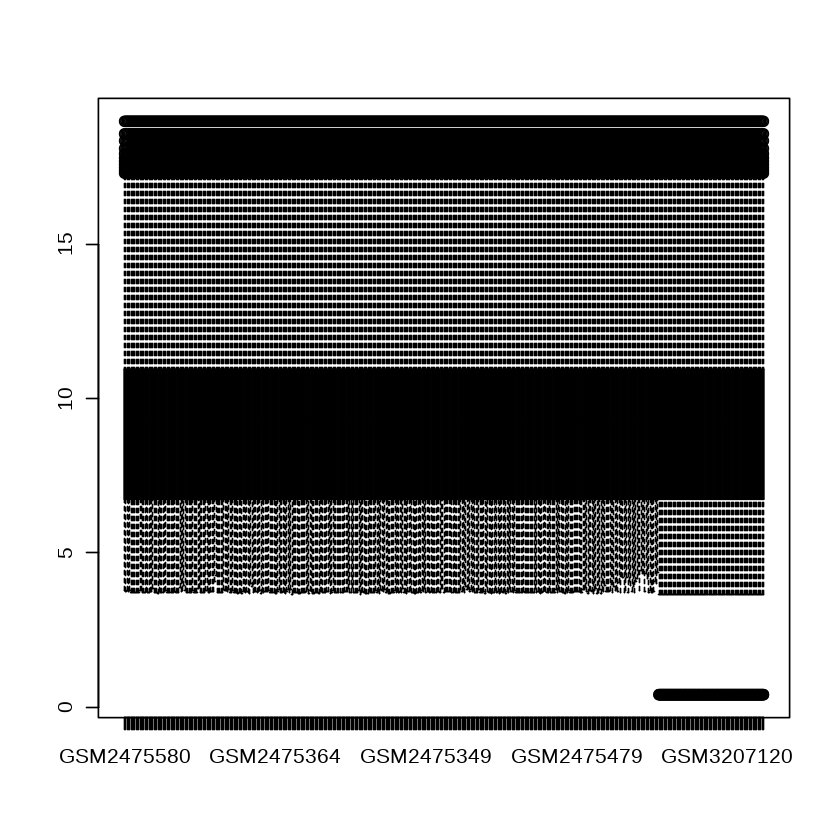

In [108]:
boxplot(exprs.log)

#### 1st pre-specified attempt with many microarray data, quantile normalize GC6-74, Adolescent data and general TB microarray data together

- With the joint normalization, all samples predicted the same label ("late") so the joint normalization here breaks the ability of the model to handle microarray data. It doesn't answer yet whether the 1st results were biological.
- The 1st quantile normalization with only Adolescent data had Suliman et al RNA-seq data dominating the mean calculation. Therefore, I will now test using one data type as a reference distribution, starting with RNA-seq, then microarray.
- After I try these options, I think I will give up and state that try these options didn't allow me to technically compare them. Need an independent RNA-seq dataset for full blind, pre-specified interpretation testing.

In [ ]:
all.exprs = cbind(Sul.exprs.ado , ado.exprs.S.exp, micro.exprs.exp )

# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

Sul.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Sul.pheno)]
ado.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(ado.pheno)]
micro.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(micro.pheno)]


In [ ]:
boxplot(exprs.log)

#### 2nd pre-specified attempt with many microarray data, Use GC6-74 as reference distribution for quantile normalizing all data

In [58]:
all.exprs = cbind(Sul.exprs.ado , ado.exprs.S.exp, micro.exprs.exp )

# Filter out genes whose counts are <= 5 in 50% of samples or more
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

target = normalize.quantiles.determine.target(as.matrix(Sul.exprs.ado))

exprs.qn = as.data.frame(normalize.quantiles.use.target(as.matrix(exprs.fil), target))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

Sul.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Sul.pheno)]
ado.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(ado.pheno)]
micro.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(micro.pheno)]


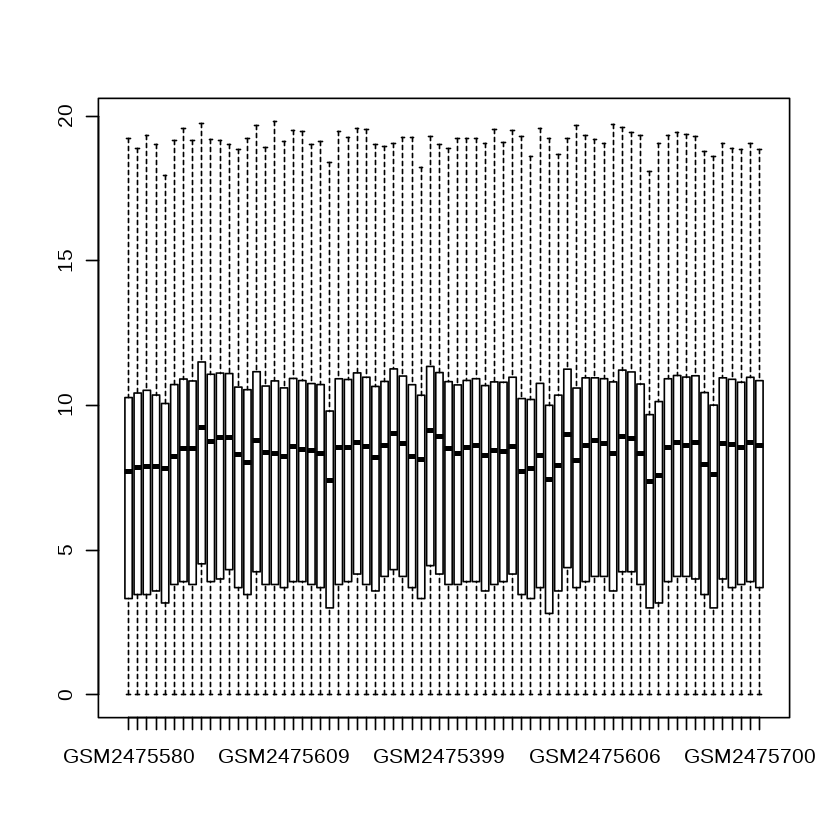

In [91]:
boxplot(log2(Sul.exprs.ado[1:70]+1))

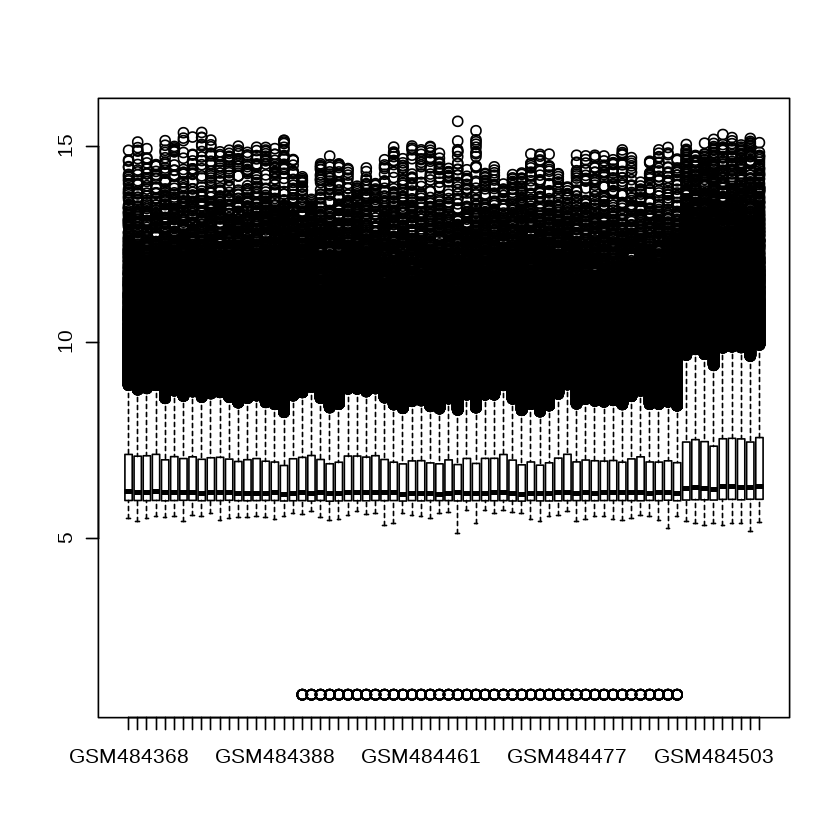

In [88]:
boxplot(micro.exprs[1:70])

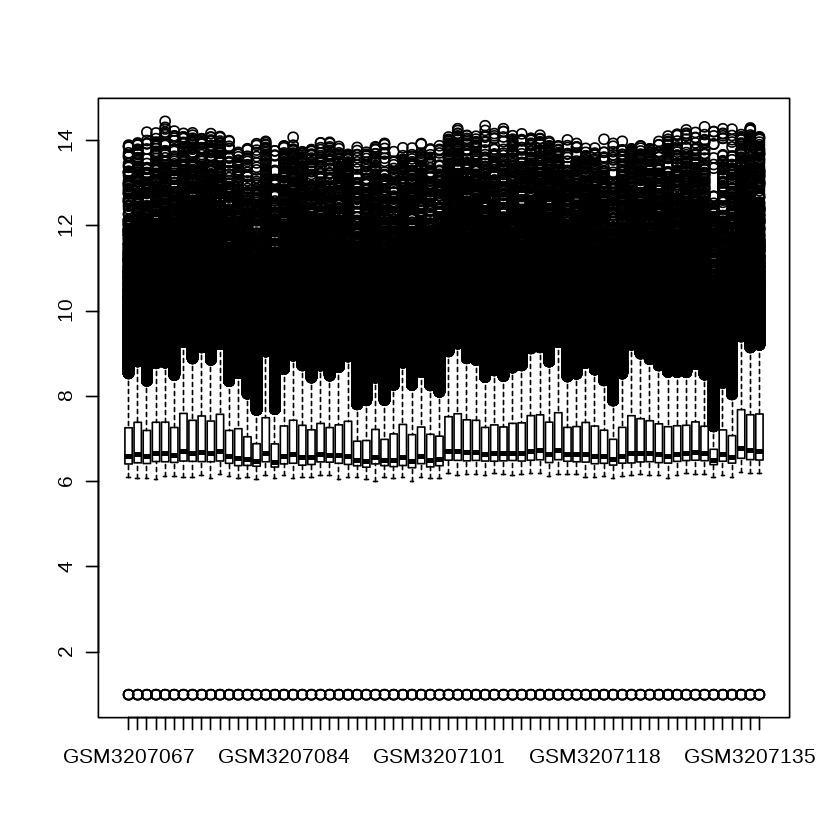

In [87]:
boxplot(ado.exprs.S[1:70])

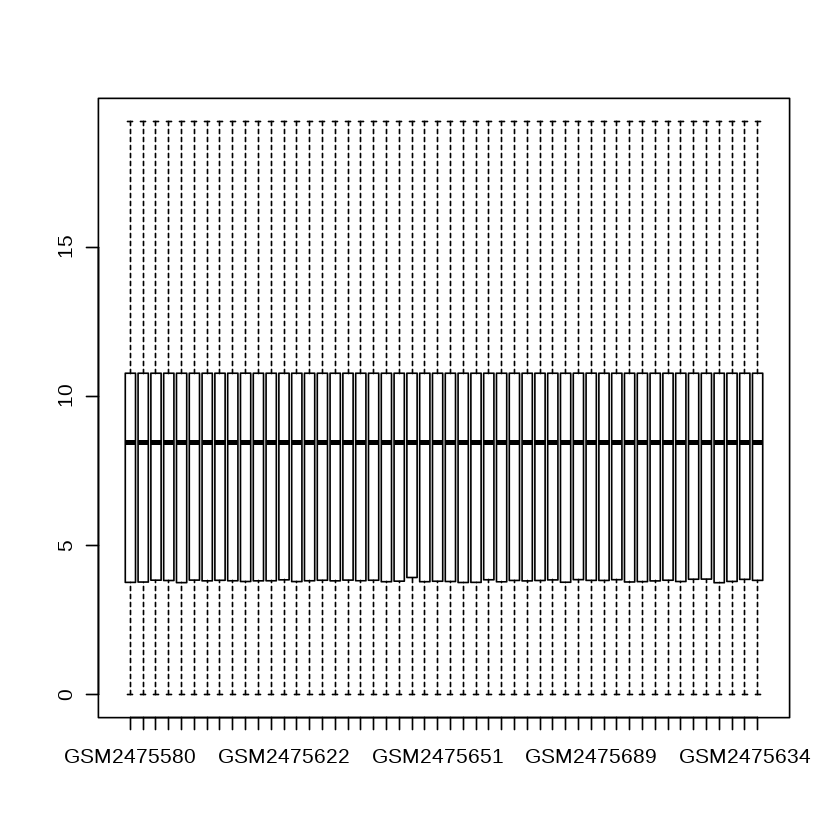

In [63]:
boxplot(exprs.log[1:50])

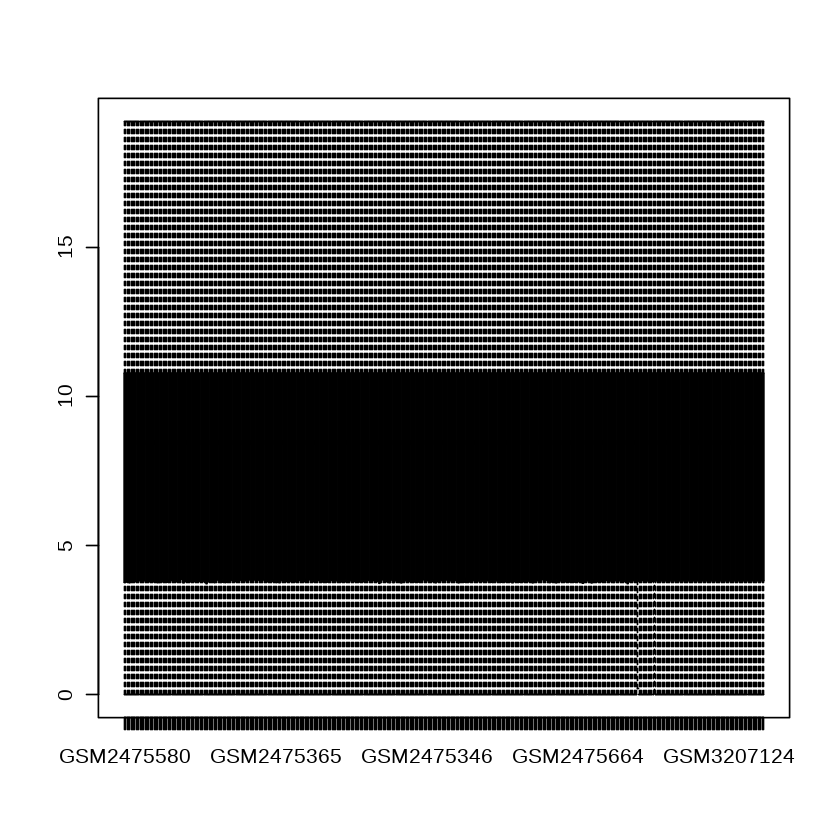

In [68]:
boxplot(exprs.log[1:500])

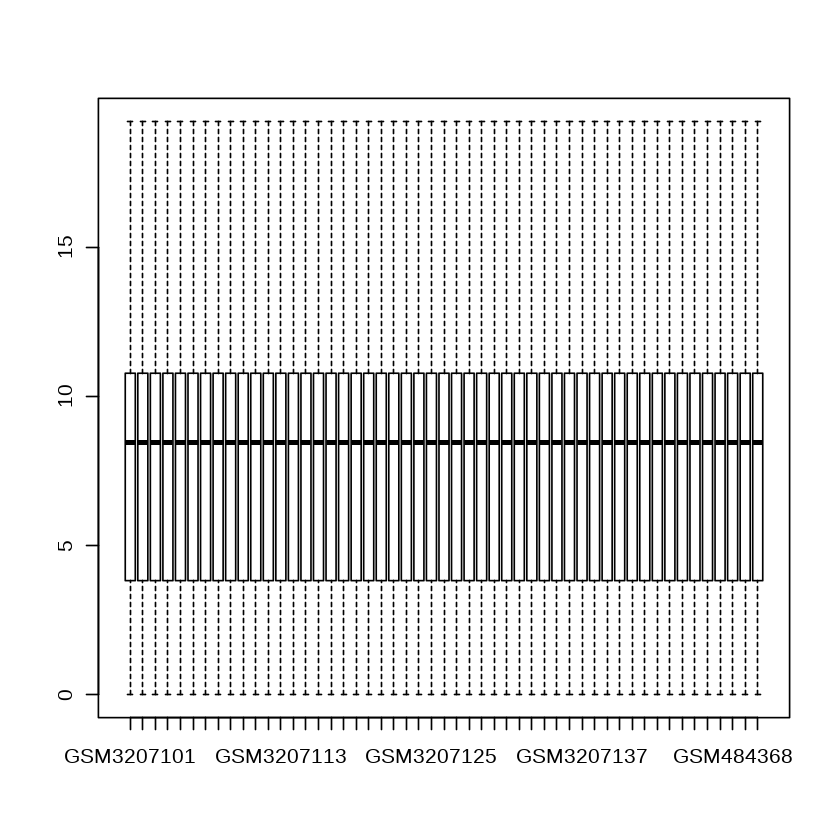

In [64]:
boxplot(exprs.log[450:500])

In [66]:
dim(exprs.log)

[1] 15614  2223

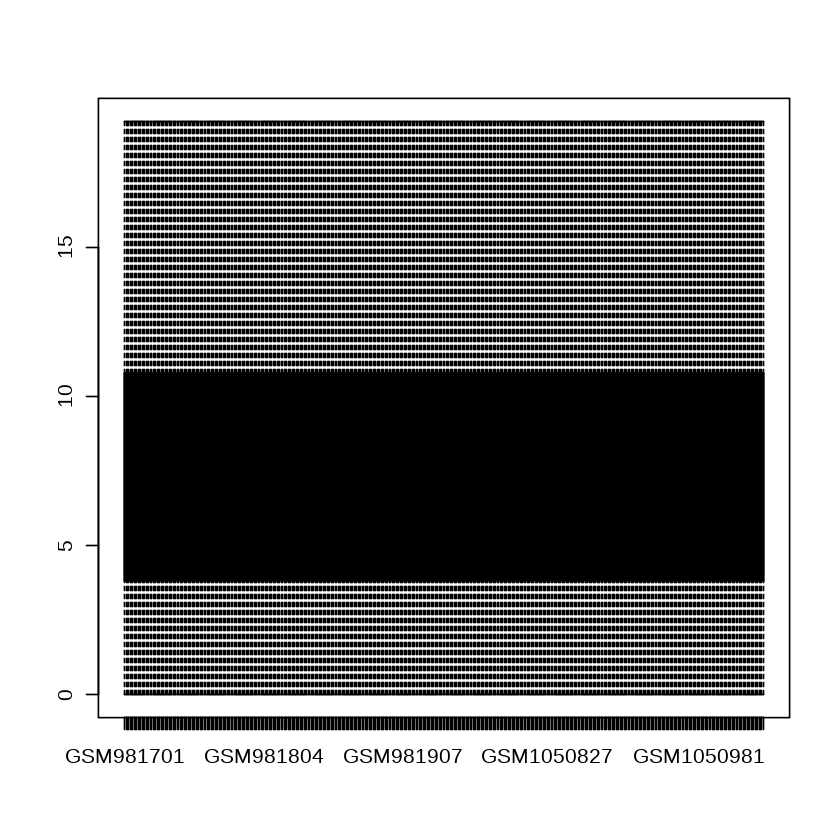

In [67]:
boxplot(exprs.log[1750:2223])

In [62]:
micro.exprs.log[1,]

,GSM484368,GSM484369,GSM484370,GSM484371,GSM484372,GSM484373,GSM484374,GSM484375,GSM484376,GSM484377,⋯,GSM1051020,GSM1051021,GSM1051022,GSM1051029,GSM1051030,GSM1051031,GSM1051032,GSM1051033,GSM1051036,GSM1051037
EEF1A1,18.17054,17.7205,17.2826,17.62606,17.36536,17.53673,17.82281,17.7205,17.44695,17.53673,⋯,15.79608,15.66595,15.79608,15.51308,15.32947,15.52309,15.56557,15.38108,15.44461,15.57664


In [61]:
ado.exprs.log[1,]

,GSM3207067,GSM3207068,GSM3207069,GSM3207070,GSM3207071,GSM3207072,GSM3207073,GSM3207074,GSM3207075,GSM3207076,⋯,GSM3207139,GSM3207140,GSM3207141,GSM3207142,GSM3207143,GSM3207144,GSM3207145,GSM3207146,GSM3207147,GSM3207148
EEF1A1,15.98198,15.89874,16.05099,15.63132,15.08031,15.98198,16.03329,15.82615,15.88209,15.55389,⋯,15.86746,15.79608,15.77015,15.89874,15.84025,15.96437,15.70194,15.65488,15.75598,16.05099


In [59]:
Sul.exprs.log[1,]

,GSM2475580,GSM2475669,GSM2475553,GSM2475481,GSM2475555,GSM2475694,GSM2475692,GSM2475688,GSM2475636,GSM2475656,⋯,GSM2475741,GSM2475742,GSM2475743,GSM2475744,GSM2475745,GSM2475746,GSM2475747,GSM2475748,GSM2475749,GSM2475750
EEF1A1,17.62606,17.62606,17.62606,17.7205,19.2282,18.59177,17.82281,18.33967,18.33967,18.33967,⋯,17.92862,19.2282,18.81952,17.82281,17.7205,18.81952,18.81952,19.2282,17.92862,17.62606


In [50]:
Sul.exprs.ado[1,]

,GSM2475580,GSM2475669,GSM2475553,GSM2475481,GSM2475555,GSM2475694,GSM2475692,GSM2475688,GSM2475636,GSM2475656,⋯,GSM2475741,GSM2475742,GSM2475743,GSM2475744,GSM2475745,GSM2475746,GSM2475747,GSM2475748,GSM2475749,GSM2475750
EEF1A1,164706,220248,260126,212746,251475,315830,216577,311195,330837,375945,⋯,300571,500311,345169,208335,223995,446102,312684,500287,247656,249950


In [ ]:
targ = normalize.quantiles.determine.target(
    data.matrix(ref_df),
    target.length=nrow(ref_df))

# Quantile normalize the data, against the reference distribution,
# using replacement - not averaging.
qn = data.matrix(normalize.quantiles.use.target(
                   data.matrix(target_df),targ,copy=F))

#### 3rd pre-specified attempt with many microarray data, Use microarray data as reference distribution for quantile normalizing all data

In [92]:
all.exprs = cbind(ado.exprs.S.exp, micro.exprs.exp )

# Filter out genes whose counts are <= 10 in 50% of samples or more
exprs.j.keep = apply(all.exprs <= 10, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

Sul.fil = Sul.exprs.ado[exprs.j.keep,]




#target = normalize.quantiles.determine.target(as.matrix(Sul.qn))

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))#as.data.frame(normalize.quantiles.use.target(as.matrix(exprs.fil), target))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

target = normalize.quantiles.determine.target(as.matrix(exprs.qn))
Sul.qn = as.data.frame(normalize.quantiles.use.target(as.matrix(Sul.fil), target))
colnames(Sul.qn) = colnames(Sul.fil)
rownames(Sul.qn) = rownames(Sul.fil)
Sul.log = log2(Sul.qn + 1)

Sul.exprs.log = Sul.log #exprs.log[, colnames(exprs.log) %in% row.names(Sul.pheno)]
ado.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(ado.pheno)]
micro.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(micro.pheno)]


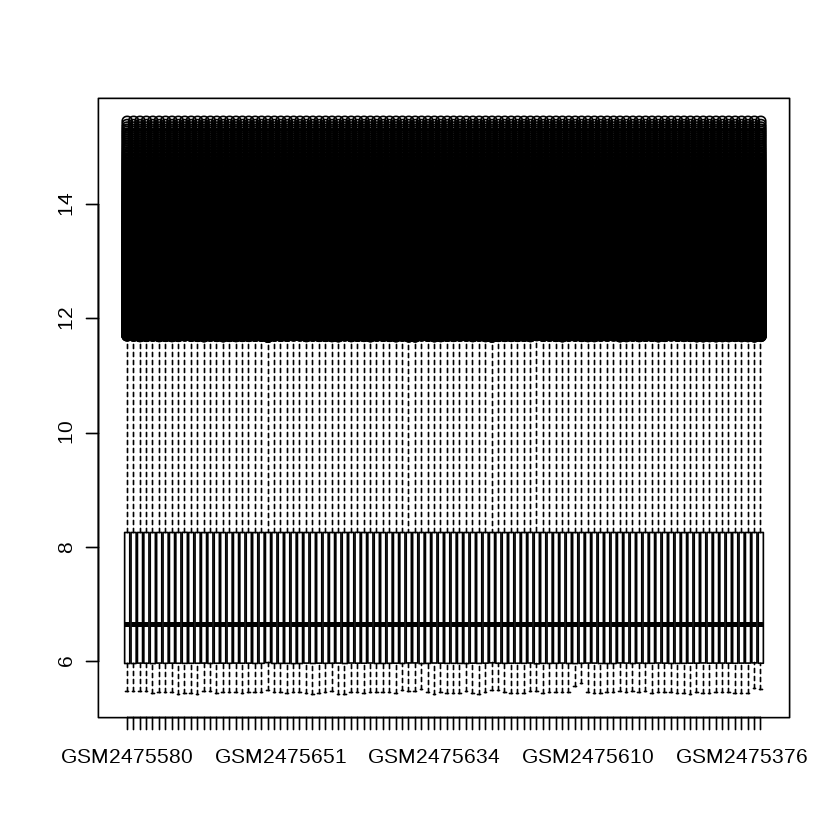

In [93]:
boxplot(Sul.exprs.log[1:100])

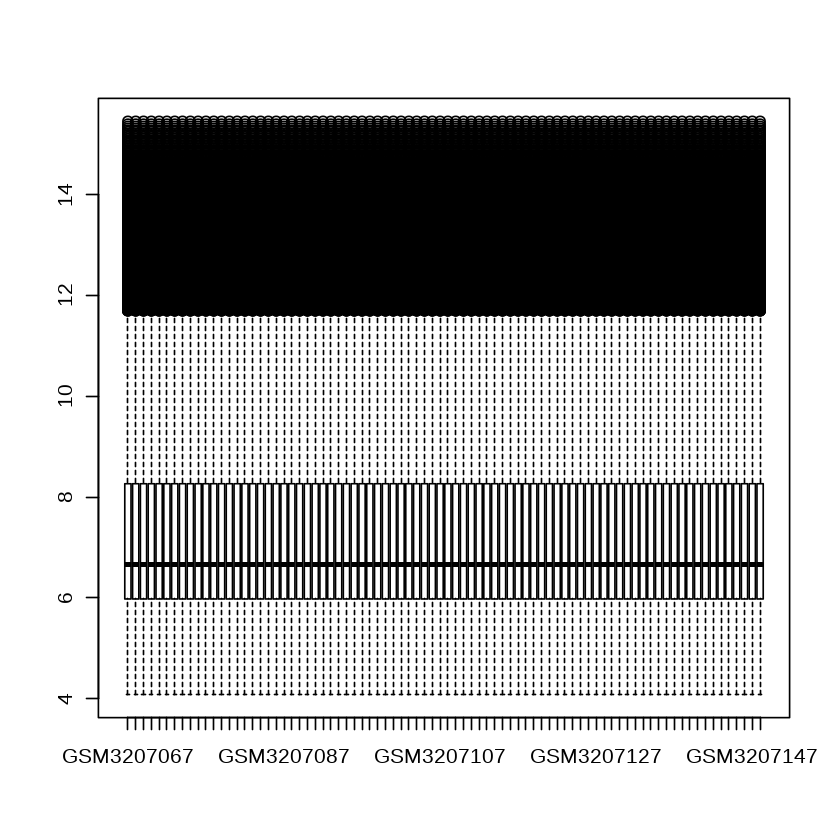

In [95]:
boxplot(ado.exprs.log)

#### Probable Final attempt, Use the 6 gene signature, just quantile normalize the microarray dataset within itself

In [227]:
ado.all.exprs = 2 ^ ado.exprs

# Filter out genes whose counts are <= 10 in 50% of samples or more
exprs.j.keep.ado = apply(ado.all.exprs <= 10, 1, mean) <= 0.5

ado.exprs.fil = ado.all.exprs[exprs.j.keep.ado,]





#target = normalize.quantiles.determine.target(as.matrix(Sul.qn))

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(ado.exprs.fil)))#as.data.frame(normalize.quantiles.use.target(as.matrix(ado.exprs.fil), target))
colnames(exprs.qn) = colnames(ado.exprs.fil)
rownames(exprs.qn) = rownames(ado.exprs.fil)
ado.exprs.log = log2(exprs.qn + 1)


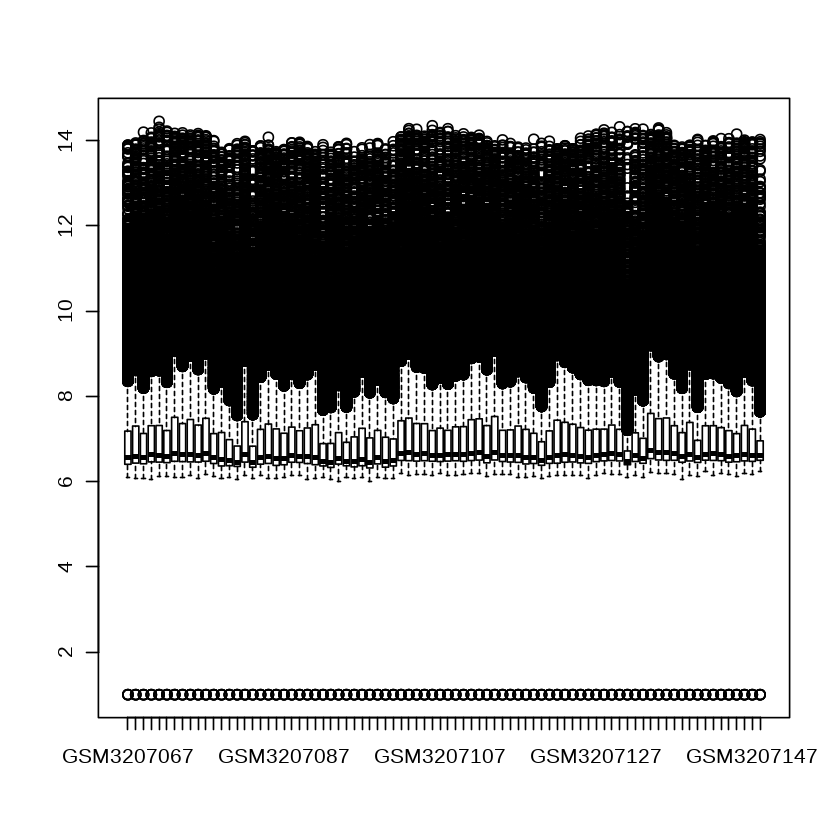

In [228]:
boxplot(ado.exprs)

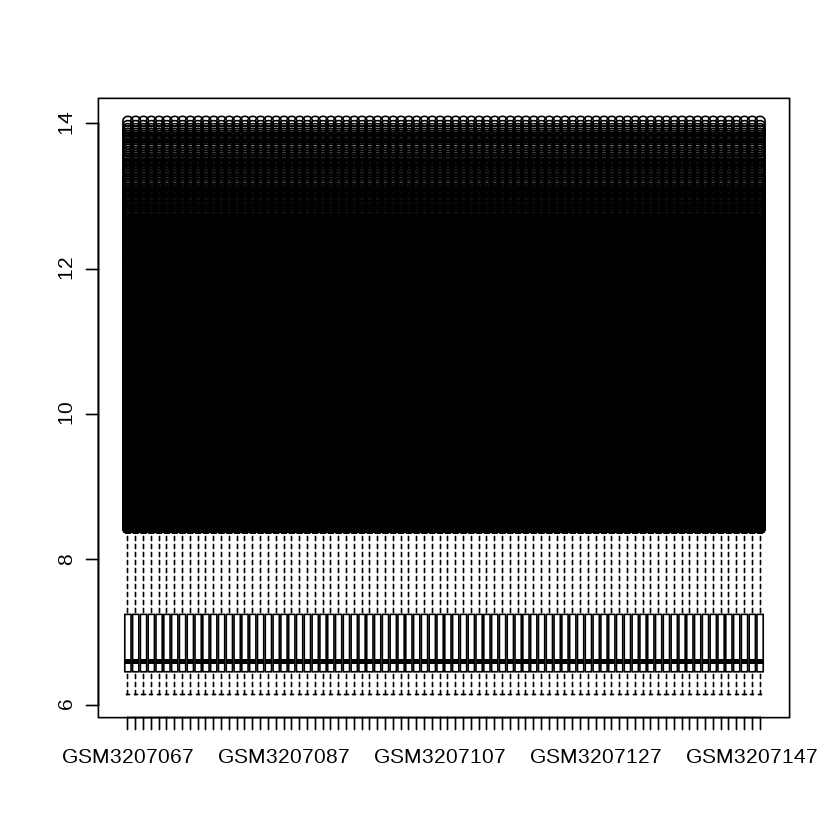

In [229]:
boxplot(ado.exprs.log)

#### Train the model to predict 0 vs 6 mo in Sul dataset

In [96]:
Sul.pheno.6mo = Sul.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new Sul.pheno

AHRI.subj = unique(dplyr::filter(Sul.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
Sul.pheno.6mo$dataset[Sul.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"


# dplyr::filter pheno and expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

Sul.pheno.6mo = droplevels(Sul.pheno.6mo[Sul.pheno.6mo$site %in% c("AHRI", "MRC") & Sul.pheno.6mo$time.from.exposure.months %in% c(0, 6),])

Sul.exprs.log.6mo = Sul.exprs.log[, colnames(Sul.exprs.log) %in% row.names(Sul.pheno.6mo)]

Sul.pheno.6mo.train = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset == "Training",])
Sul.pheno.6mo.test = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset != "Training",])

Sul.exprs.train = t(Sul.exprs.log.6mo[,row.names(Sul.pheno.6mo.train)])
Sul.exprs.test = t(Sul.exprs.log.6mo[, row.names(Sul.pheno.6mo.test)])

set.seed(100)
folds.6mo = groupKFold(Sul.pheno.6mo.train$subjectid, k=10)
for (fold in lapply(folds.6mo, function(x) {Sul.pheno.6mo.train$subjectid[x]}))
    print(length((as.character(fold))))

lapply(folds.6mo, function(x, y) table(y[x]), y = Sul.pheno.6mo.train$subjectid)

time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.train$time.from.exposure.months == "0", "early", "late"))
test.time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.test$time.from.exposure.months == "0", "early", "late"))

[1] 112
[1] 107
[1] 98
[1] 99
[1] 101
[1] 103
[1] 102
[1] 103
[1] 105
[1] 105


$Fold01

  07/G189   07/G274   07/G277   07/G300   07/G351   07/G354   07/G368   07/G370 
        1         1         1         0         1         1         1         1 
  07/G419   08/G136   08/G141   08/G160   08/G245   08/G260   08/G324   08/G333 
        1         1         1         1         1         2         2         1 
  08/G343   08/G367   08/G400   08/G407   08/G415   08/G423   08/G424   08/G433 
        1         2         1         1         1         1         1         2 
  08/G493   08/G494   08/G541   08/G587   08/G596   08/G606   08/G613   08/G643 
        1         1         1         1         1         1         1         1 
  08/G652   08/G654   08/G695   08/G701   08/G703   08/G714   08/G715   08/G726 
        2         1         1         1         2         1         1         1 
  08/G782   08/G788   08/G797   08/G800   08/G810   08/G814   08/G893   09/G120 
        1         1         2         1         1         1         1         1 
  09/G133   09/G135

In [97]:
start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

print("Made the clusters")

myFunc <- caretSBF
myFunc$summary <- twoClassSummary
myFunc$score <- function(x, y) {
  out <- wilcox.test(x ~ y)$p.value # Will have warnings due to ties; ignore for now.
  out
}

filtercontrol.lm = sbfControl(functions = myFunc, method = "cv",  index=folds.6mo,  allowParallel=TRUE) 
set.seed(10)
wilcoxWithFilter.lm = sbf(Sul.exprs.train, as.factor(Sul.pheno.6mo.train$time.from.exposure.months), sbfControl = filtercontrol.lm)

print("Did the feature selection")
stopCluster(cluster)
registerDoSEQ()


end_time <- Sys.time()
print(end_time - start_time)

[1] "Made the clusters"
[1] "Did the feature selection"
Time difference of 12.89105 mins


In [98]:
opt.Sul.ado.vars = wilcoxWithFilter.lm$optVariables

In [99]:
length(opt.Sul.ado.vars)

[1] 2326

In [100]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-6), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))

In [101]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(Sul.exprs.train[, colnames(Sul.exprs.train) %in% c(opt.Sul.ado.vars)],
                  time.period.from.exposure,
                  method=alg, tuneGrid = train.grid, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}



stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 2.078654 mins


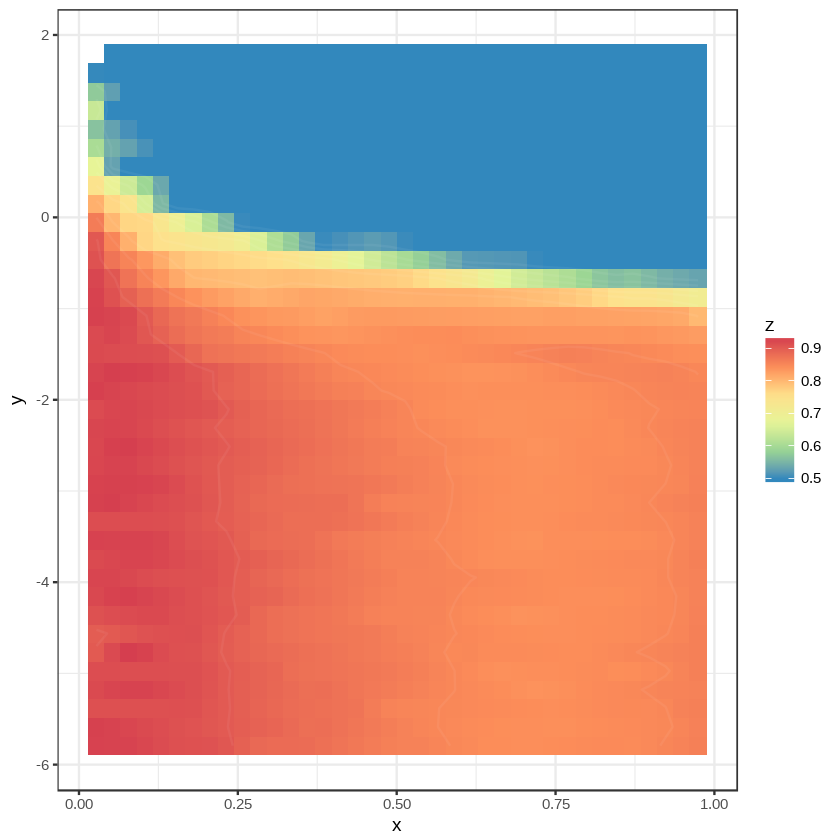

In [102]:
glmres = models$glmnet$results
graph.hyper (x=glmres$alpha, y=log10(glmres$lambda), z=glmres$ROC)

#### Test on all microarray data using microarray as the reference distribution

In [103]:
micro.exprs.test = t(micro.exprs.log)
dim(micro.exprs.test)

[1]  1726 15614

In [104]:
human.expose.Sul.micro.model = models$glmnet

pred.micro.test = predict(human.expose.Sul.micro.model, newdata = micro.exprs.test[,colnames(micro.exprs.test) %in% c(opt.Sul.ado.vars)])

In [105]:
table(pred.micro.test, micro.pheno$status)
table(pred.micro.test, micro.pheno$hiv.status) # Would need to do this within subgroups of status

               
pred.micro.test control LTBI lung_cancer other_disease pneumonia PSLE
          early       1    0           0            32         3    0
          late      222  304          16           376        21   82
               
pred.micro.test sarcoidosis SLE Staph Still Strep  TB
          early           1   0     0     0     0  26
          late           56  28    40    31    12 475

               
pred.micro.test negative positive
          early       34       29
          late      1257      406

In [106]:
ado.exprs.test = t(ado.exprs.log)

In [107]:
dim(ado.exprs.test)

[1]    82 15614

In [108]:
pred.ado.test = predict(human.expose.Sul.micro.model, newdata = ado.exprs.test[,colnames(ado.exprs.test) %in% c(opt.Sul.ado.vars)])

In [109]:
table(pred.ado.test)

pred.ado.test
early  late 
    0    82 

In [110]:
summary(ado.pheno)

    draw.day     latent.tb.status.at.blood.draw        patientid 
 Min.   :180.0   Mode :logical                  ID#: 04/1154: 4  
 1st Qu.:180.0   FALSE:24                       ID#: 07/0675: 4  
 Median :360.0   TRUE :58                       ID#: 04/0017: 3  
 Mean   :403.9                                  ID#: 04/0041: 3  
 3rd Qu.:540.0                                  ID#: 04/0693: 3  
 Max.   :720.0                                  ID#: 04/0702: 3  
                                                (Other)     :62  
 relative.time.from.conversion.days time.of.conversion.days   tissue  
 Min.   :-360.000                   Min.   :180.0           blood:82  
 1st Qu.:-180.000                   1st Qu.:180.0                     
 Median :   0.000                   Median :450.0                     
 Mean   :   2.195                   Mean   :401.7                     
 3rd Qu.: 180.000                   3rd Qu.:540.0                     
 Max.   : 360.000                   Max.   :54

In [111]:
table(pred.ado.test, ado.pheno$relative.time.from.conversion.days)

             
pred.ado.test -360 -180  0 180 360
        early    0    0  0   0   0
        late     7   17 27  30   1

[1] "This is the AUC:"
Area under the curve: 0.9101
[1] "This is the AUC p-value:"
[1] 3.773959e-14
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.8554-0.9648 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6425
[1] "This is the AUC p-value:"
[1] 0.02211482
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5049-0.7802 (DeLong)


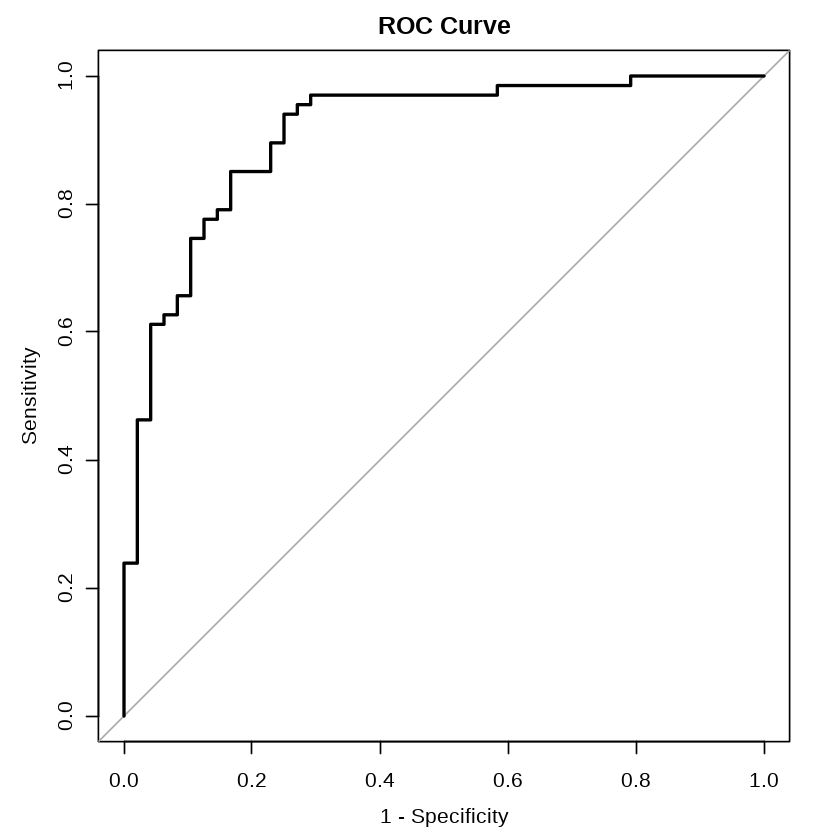

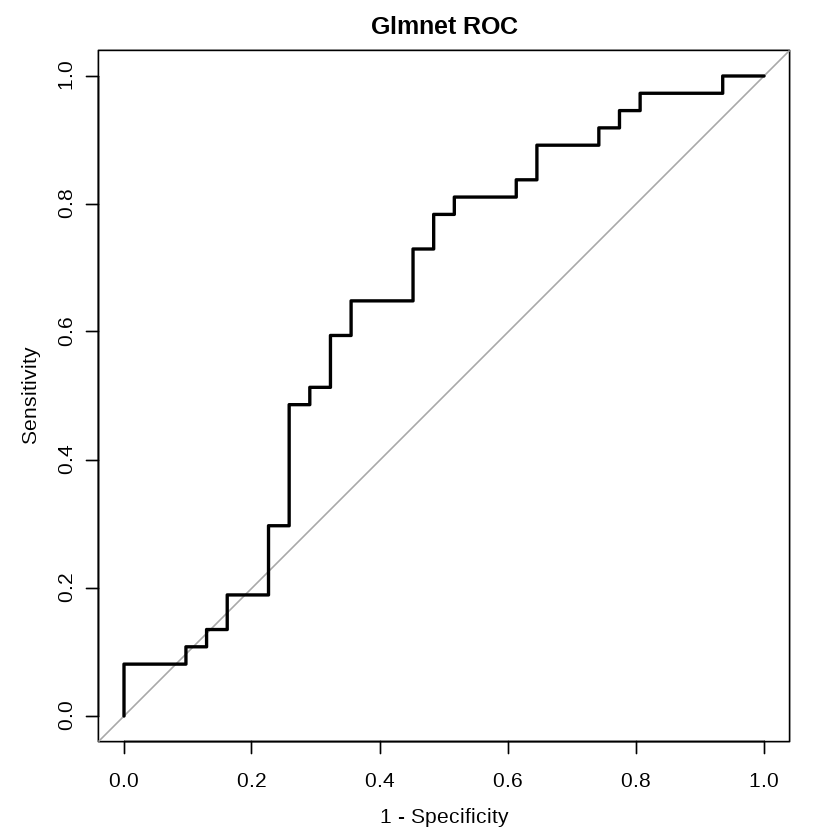

In [112]:
glmnet.Sul.val.ROC = my.roc(human.expose.Sul.micro.model$pred$early, human.expose.Sul.micro.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.micro.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.ado.vars)], type="prob")

glmnet.Sul.test.ROC <- my.roc(pred.Sul.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

#### Test on all microarray data using RNA-seq Suliman et al as the reference distribution

In [76]:
micro.exprs.test = t(micro.exprs.log)
dim(micro.exprs.test)

[1]  1726 15614

In [77]:
human.expose.Sul.micro.model = models$glmnet

pred.micro.test = predict(human.expose.Sul.micro.model, newdata = micro.exprs.test[,colnames(micro.exprs.test) %in% c(opt.Sul.ado.vars)])

In [78]:
table(pred.micro.test, micro.pheno$status)
table(pred.micro.test, micro.pheno$hiv.status) # Would need to do this within subgroups of status

               
pred.micro.test control LTBI lung_cancer other_disease pneumonia PSLE
          early      18    6           4            62        14    9
          late      205  298          12           346        10   73
               
pred.micro.test sarcoidosis SLE Staph Still Strep  TB
          early          11   0     1     3     3  63
          late           46  28    39    28     9 438

               
pred.micro.test negative positive
          early      139       55
          late      1152      380

In [79]:
ado.exprs.test = t(ado.exprs.log)

In [80]:
dim(ado.exprs.test)

[1]    82 15614

In [81]:
pred.ado.test = predict(human.expose.Sul.micro.model, newdata = ado.exprs.test[,colnames(ado.exprs.test) %in% c(opt.Sul.ado.vars)])

In [82]:
table(pred.ado.test)

pred.ado.test
early  late 
    7    75 

In [83]:
summary(ado.pheno)

    draw.day     latent.tb.status.at.blood.draw        patientid 
 Min.   :180.0   Mode :logical                  ID#: 04/1154: 4  
 1st Qu.:180.0   FALSE:24                       ID#: 07/0675: 4  
 Median :360.0   TRUE :58                       ID#: 04/0017: 3  
 Mean   :403.9                                  ID#: 04/0041: 3  
 3rd Qu.:540.0                                  ID#: 04/0693: 3  
 Max.   :720.0                                  ID#: 04/0702: 3  
                                                (Other)     :62  
 relative.time.from.conversion.days time.of.conversion.days   tissue  
 Min.   :-360.000                   Min.   :180.0           blood:82  
 1st Qu.:-180.000                   1st Qu.:180.0                     
 Median :   0.000                   Median :450.0                     
 Mean   :   2.195                   Mean   :401.7                     
 3rd Qu.: 180.000                   3rd Qu.:540.0                     
 Max.   : 360.000                   Max.   :54

In [84]:
table(pred.ado.test, ado.pheno$relative.time.from.conversion.days)

             
pred.ado.test -360 -180  0 180 360
        early    1    1  3   2   0
        late     6   16 24  28   1

[1] "This is the AUC:"
Area under the curve: 0.9568
[1] "This is the AUC p-value:"
[1] 4.08652e-17
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.9258-0.9878 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6338
[1] "This is the AUC p-value:"
[1] 0.0296225
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4964-0.7713 (DeLong)


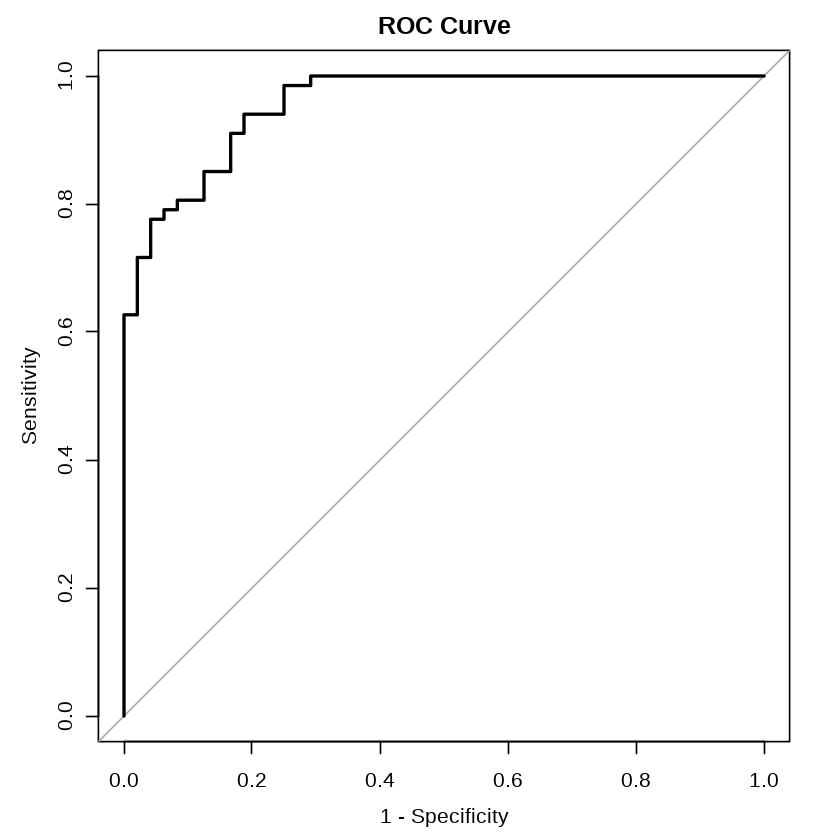

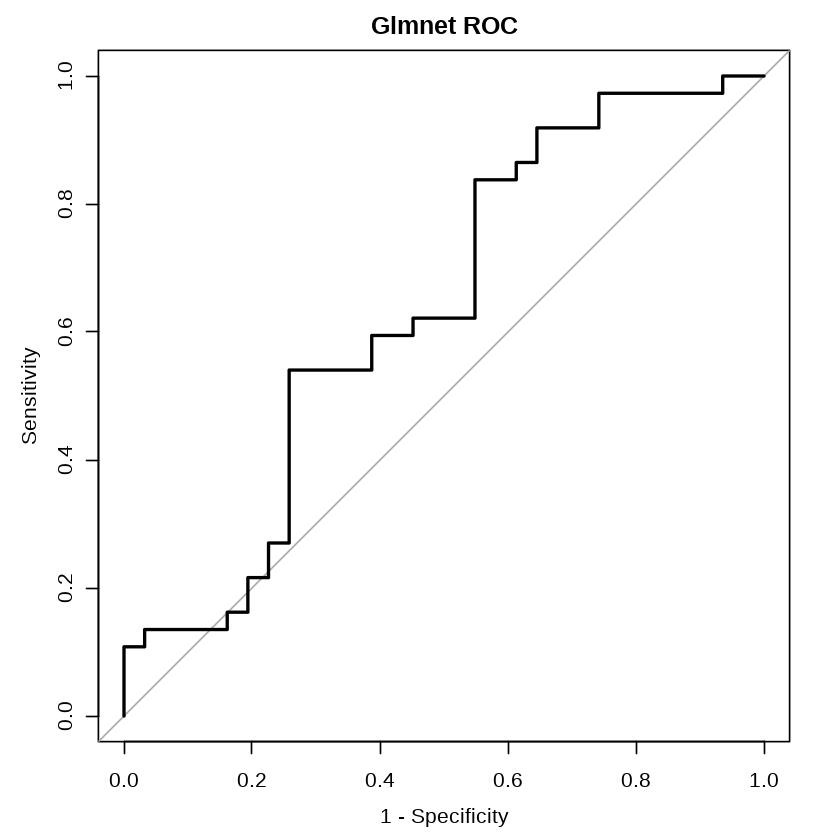

In [85]:
glmnet.Sul.val.ROC = my.roc(human.expose.Sul.micro.model$pred$early, human.expose.Sul.micro.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.micro.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.ado.vars)], type="prob")

glmnet.Sul.test.ROC <- my.roc(pred.Sul.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

#### Test all joint normalization on adolescents who acquired M.tb infection, and in full microarray dataset of TB, LTBI, control and other diseases

##### Prediction and ROC curve

In [30]:
micro.exprs.test = t(micro.exprs.log)
dim(micro.exprs.test)

[1]  1726 15614

In [31]:
human.expose.Sul.micro.model = models$glmnet

pred.micro.test = predict(human.expose.Sul.micro.model, newdata = micro.exprs.test[,colnames(micro.exprs.test) %in% c(opt.Sul.ado.vars)])

In [32]:
table(pred.micro.test, micro.pheno$status)
table(pred.micro.test, micro.pheno$hiv.status) # Would need to do this within subgroups of status

               
pred.micro.test control LTBI lung_cancer other_disease pneumonia PSLE
          early       0    0           0             1         0    0
          late      223  304          16           407        24   82
               
pred.micro.test sarcoidosis SLE Staph Still Strep  TB
          early           0   0     0     0     0   1
          late           57  28    40    31    12 500

               
pred.micro.test negative positive
          early        1        1
          late      1290      434

In [35]:
ado.exprs.test = t(ado.exprs.log)

In [36]:
dim(ado.exprs.test)

[1]    82 15614

In [37]:
pred.ado.test = predict(human.expose.Sul.micro.model, newdata = ado.exprs.test[,colnames(ado.exprs.test) %in% c(opt.Sul.ado.vars)])

In [38]:
table(pred.ado.test)

pred.ado.test
early  late 
    0    82 

In [39]:
summary(ado.pheno)

    draw.day     latent.tb.status.at.blood.draw        patientid 
 Min.   :180.0   Mode :logical                  ID#: 04/1154: 4  
 1st Qu.:180.0   FALSE:24                       ID#: 07/0675: 4  
 Median :360.0   TRUE :58                       ID#: 04/0017: 3  
 Mean   :403.9                                  ID#: 04/0041: 3  
 3rd Qu.:540.0                                  ID#: 04/0693: 3  
 Max.   :720.0                                  ID#: 04/0702: 3  
                                                (Other)     :62  
 relative.time.from.conversion.days time.of.conversion.days   tissue  
 Min.   :-360.000                   Min.   :180.0           blood:82  
 1st Qu.:-180.000                   1st Qu.:180.0                     
 Median :   0.000                   Median :450.0                     
 Mean   :   2.195                   Mean   :401.7                     
 3rd Qu.: 180.000                   3rd Qu.:540.0                     
 Max.   : 360.000                   Max.   :54

In [40]:
table(pred.ado.test, ado.pheno$relative.time.from.conversion.days)

             
pred.ado.test -360 -180  0 180 360
        early    0    0  0   0   0
        late     7   17 27  30   1

[1] "This is the AUC:"
Area under the curve: 0.9154
[1] "This is the AUC p-value:"
[1] 1.804134e-14
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.8634-0.9675 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6469
[1] "This is the AUC p-value:"
[1] 0.01900057
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5106-0.7832 (DeLong)


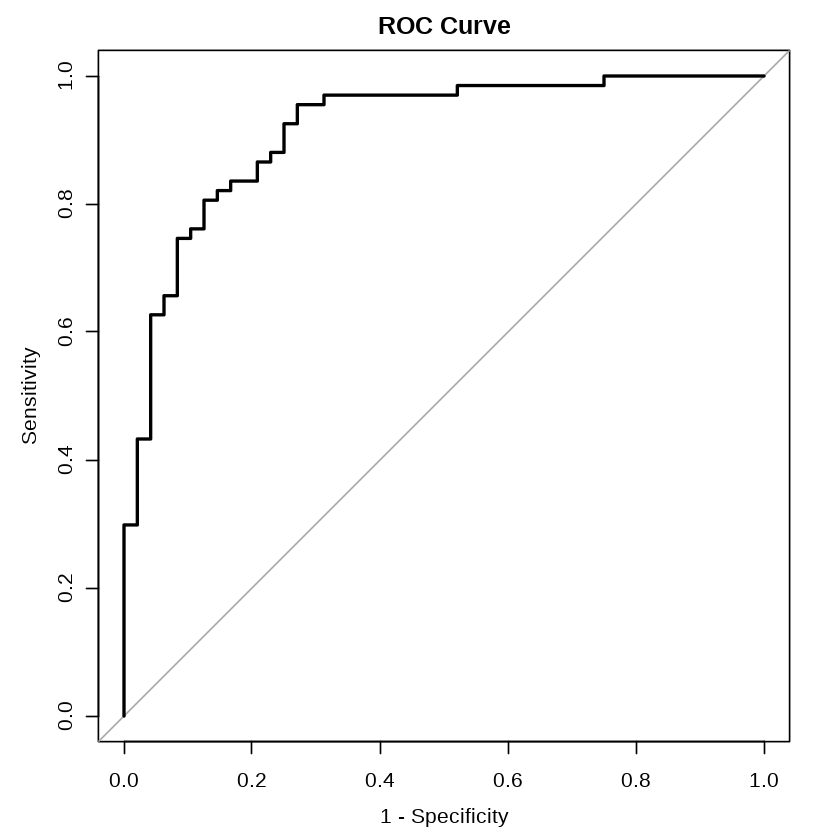

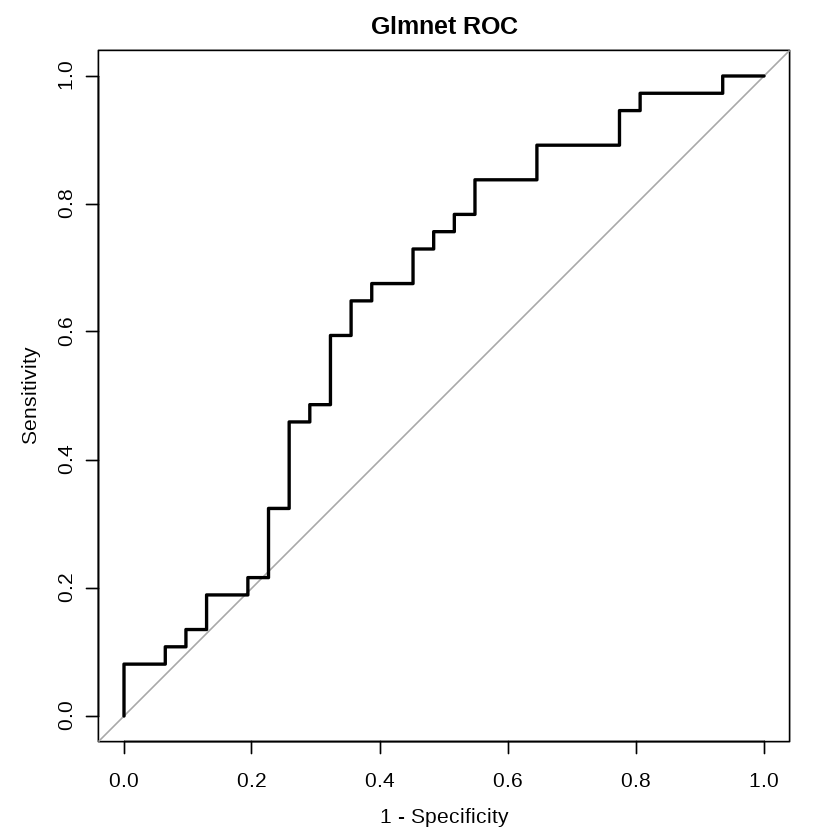

In [41]:
glmnet.Sul.val.ROC = my.roc(human.expose.Sul.micro.model$pred$early, human.expose.Sul.micro.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.micro.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.ado.vars)], type="prob")

glmnet.Sul.test.ROC <- my.roc(pred.Sul.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

#### Test on adolescents, for 1st attempt when only the adolescent microarray dataset was used

- Looks promising, but confusing in that there are 6-month predictions prior to the conversion event. If these are real, then this could be reflective of these blood events also happening prior to conversion, and not just after, as it appears in the other datasets
- I think I definitely need to have one model with all of the combined datasets together, to make sure that when I quantile normalize, it is not introducing artifacts

- I DEFINITELY SHOULD OBSERVE THE PATHS OVER TIME AND CALCULATE MY PRE-SPECIFIED MEASURE, ONE 6-month post-exposure prediction is indicative of recent infection and is my sensitivity measure.

- DEFINITELY HAVE TO SAY THAT THIS IS A CAVEAT, MICROARRAY DATA, could be a confounder, skewing the model, but it is not systematic across all genes (Pnot all 6 mo or all baseline, but it could be an essentially random prediction), the longitudinal graph should help in this interpretation.

- I am cautiously optimistic. The least I will be able to say is that we can't compare performance in this dataset, since we have to parameterize with the RNA-seq data. 

- The test-AUC holds up, as always, with this quantile normalization.

##### Prediction and ROC curve

In [117]:
ado.exprs.test = t(ado.exprs.log)

In [118]:
dim(ado.exprs.test)

[1]    82 13447

In [119]:
human.expose.Sul.ado.model = models$glmnet

pred.ado.test = predict(human.expose.Sul.ado.model, newdata = ado.exprs.test[,colnames(ado.exprs.test) %in% c(opt.Sul.ado.vars)])

In [121]:
table(pred.ado.test)

pred.ado.test
early  late 
   53    29 

In [122]:
summary(ado.pheno)

    draw.day     latent.tb.status.at.blood.draw        patientid 
 Min.   :180.0   Mode :logical                  ID#: 04/1154: 4  
 1st Qu.:180.0   FALSE:24                       ID#: 07/0675: 4  
 Median :360.0   TRUE :58                       ID#: 04/0017: 3  
 Mean   :403.9                                  ID#: 04/0041: 3  
 3rd Qu.:540.0                                  ID#: 04/0693: 3  
 Max.   :720.0                                  ID#: 04/0702: 3  
                                                (Other)     :62  
 relative.time.from.conversion.days time.of.conversion.days   tissue  
 Min.   :-360.000                   Min.   :180.0           blood:82  
 1st Qu.:-180.000                   1st Qu.:180.0                     
 Median :   0.000                   Median :450.0                     
 Mean   :   2.195                   Mean   :401.7                     
 3rd Qu.: 180.000                   3rd Qu.:540.0                     
 Max.   : 360.000                   Max.   :54

In [123]:
table(pred.ado.test, ado.pheno$relative.time.from.conversion.days)

             
pred.ado.test -360 -180  0 180 360
        early    5   10 18  19   1
        late     2    7  9  11   0

In [124]:
2 / (5+2)
7 / (7+10)
9 / (9 + 18)
11 / (11+19)

[1] 0.2857143

[1] 0.4117647

[1] 0.3333333

[1] 0.3666667

[1] "This is the AUC:"
Area under the curve: 0.9005
[1] "This is the AUC p-value:"
[1] 1.416009e-13
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.844-0.957 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6713
[1] "This is the AUC p-value:"
[1] 0.007558715
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5428-0.7999 (DeLong)


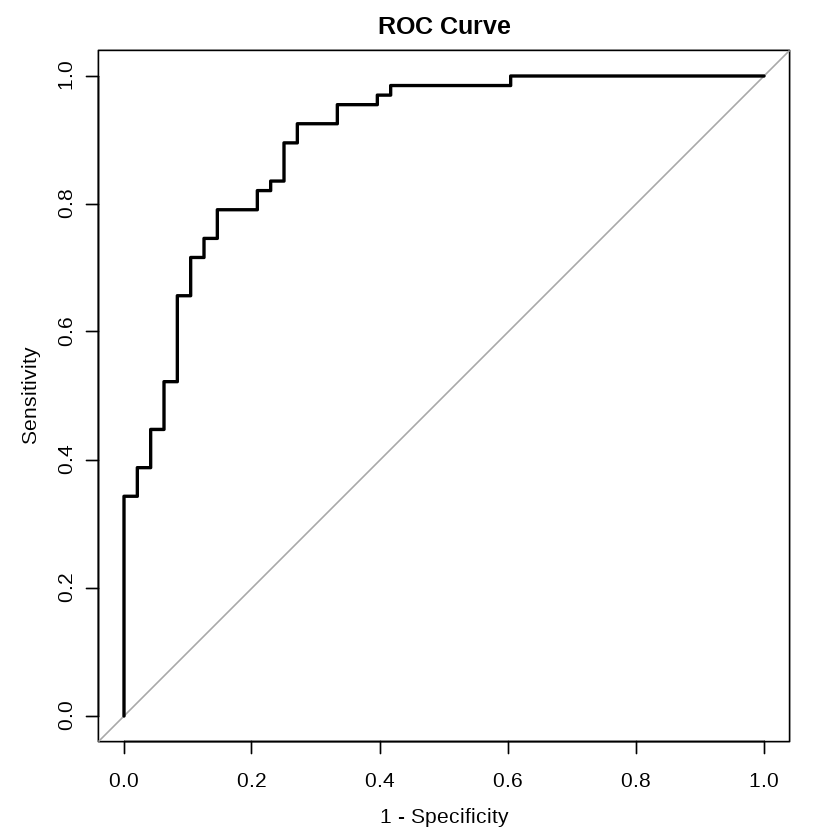

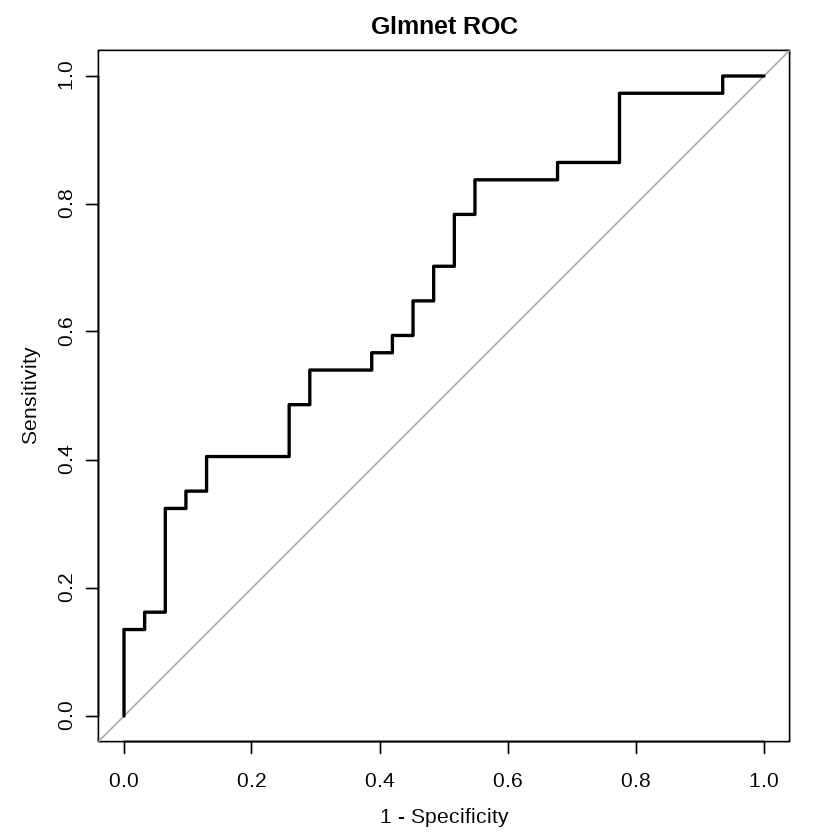

In [125]:
glmnet.Sul.val.ROC = my.roc(human.expose.Sul.ado.model$pred$early, human.expose.Sul.ado.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.ado.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.ado.vars)], type="prob")

glmnet.Sul.test.ROC <- my.roc(pred.Sul.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

##### Make longitudinal graphs

- It's pretty much impossible to make conclusions from the graphs. It's like the South African case, the density of sampling for each person is way too low (virtually all have but one or two samples, and it is inconsistent which those are)

- I have to stick with my pre-specified term of how many people get picked up by at least one 6-month post-exposure prediction.

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path:

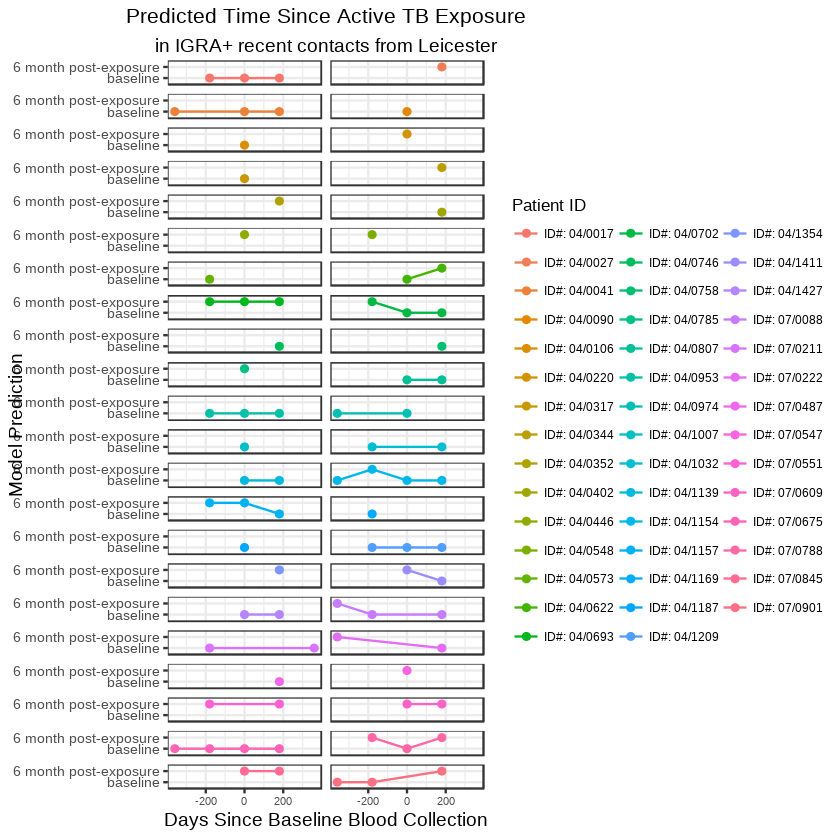

In [127]:
ado.pheno$time.pred = pred.ado.test
ado.pheno$time.pred.renamed = factor(ifelse(ado.pheno$time.pred == "early", 
                                                               "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure")) 

pred.time.plot.pos = ggplot(ado.pheno, aes(relative.time.from.conversion.days, time.pred.renamed, col=patientid)) +
geom_point() +
    geom_line(aes(relative.time.from.conversion.days, time.pred.renamed, group=patientid)) +
    theme_bw() +
labs(x="Days Since Baseline Blood Collection", y="Model Prediction") + labs(color='Patient ID') + facet_wrap(~patientid, ncol=2) + theme(
  strip.text.x = element_blank(), strip.text.y = element_blank(), strip.background = element_blank()
  
) + ggtitle("Predicted Time Since Active TB Exposure", subtitle="in IGRA+ recent contacts from Leicester") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                          plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) +    # +

theme(axis.text.y = element_text(size=8),
      axis.text.x = element_text(size=6),
     legend.title = element_text(size=10),
     legend.text = element_text(size=7))

pred.time.plot.pos

##### How many people are identified with this present cut-off?

- 52.4% sensitivity (43 out of 82 sub

- NO, this is wrong. Counting up the number of subjects, it is the same number for those with a positive and those without. Also, the relative time since conversion distributions are the same. Therefore, I think the predictions are random chance and quantile normalization does not enable comparison between RNA-seq and microarray for 

In [128]:
ado.pheno.pos = dplyr::filter(ado.pheno , patientid %in% dplyr::filter(ado.pheno , time.pred == "late")$patientid)
ado.pheno.neg = dplyr::filter(ado.pheno , !(patientid %in% dplyr::filter(ado.pheno , time.pred == "late")$patientid))

In [ ]:
dim(ado.pheno.pos)

In [133]:
length(unique(ado.pheno.pos$patientid))

[1] 22

In [136]:
table(ado.pheno.pos$relative.time.from.conversion.days)


-360 -180    0  180 
   4    9   13   17 

In [137]:
table(ado.pheno.neg$relative.time.from.conversion.days)


-360 -180    0  180  360 
   3    8   14   13    1 

In [134]:
length(unique(ado.pheno.neg$patientid))

[1] 22

In [130]:
dim(ado.pheno.neg)

[1] 39  8

In [131]:
43 / (43 + 39
     )

[1] 0.5243902

In [ ]:
Garra.pheno.contact.ctrl.pos = dplyr::filter(Garra.pheno.contact.ctrl, patient_id %in% dplyr::filter(Garra.pheno.contact.ctrl, time.pred == "late")$patient_id)

#### Test whether 6-gene signature is different between the pre and post-conversion time points

- Okay, The 6-gene signature does identify the conversion time point with modest accuracy, about the same as baseline vs 6 months post exposure in the GC6-74 study. I think I can believe these results. I'll have to figure out as I go, maybe even as I write, how to explain that I tried in other datasets, but the conclusions aren't trustable in the others.

- My paper is reborn! I have 6 genes that do as you would expect. I think I may need to go down in impact factor, or maybe not.

- I think I could just show the boxplots of median read count in the O'Garra patient groups and then show the correlation between score and the median read count, to explain that that dataset is probably not suitable to prove or disprove our claims. Yes, explain how these are heterogeneous studies with large batch effects that cannot be mitigated, because it completely confounds the comparisons of patient groups that we would like to make.

- THIS WAS A VERY PRODUCTIVE DAY, WHEREIN I LEARNED MUCH MORE DEFINITELY THAT SOME OF MY CONCLUSIONS WERE WRONG DUE TO TECHNICAL CONFOUNDERS. SCIENCE IS HARD!

- __I think comparing the genes between mice, monkeys and humans is key now. This will help shore up the study and provide a bit of biological validation and insight.__
- __Even using this reduced signature would be interesting if it showed differences in monkey too (and perhaps mice, if those homologues are represented)__

In [230]:
ado.exprs.test = t(ado.exprs.log)

In [231]:
posGenes = c("RP11-552F3.12", "PYURF" ,        "TRIM7"  ,       "TUBGCP4"  )
negGenes = c("ZNF608", "BEAN1")

ado.exprs.scores = calculateScore(ado.exprs.test, posGenes, negGenes)

In [280]:
length(unique(ado.pheno$patientid))

[1] 44

In [232]:
ado.pheno$scores = ado.exprs.scores

In [233]:
summary(ado.pheno)

    draw.day     latent.tb.status.at.blood.draw        patientid 
 Min.   :180.0   Mode :logical                  ID#: 04/1154: 4  
 1st Qu.:180.0   FALSE:24                       ID#: 07/0675: 4  
 Median :360.0   TRUE :58                       ID#: 04/0017: 3  
 Mean   :403.9                                  ID#: 04/0041: 3  
 3rd Qu.:540.0                                  ID#: 04/0693: 3  
 Max.   :720.0                                  ID#: 04/0702: 3  
                                                (Other)     :62  
 relative.time.from.conversion.days time.of.conversion.days   tissue  
 Min.   :-360.000                   Min.   :180.0           blood:82  
 1st Qu.:-180.000                   1st Qu.:180.0                     
 Median :   0.000                   Median :450.0                     
 Mean   :   2.195                   Mean   :401.7                     
 3rd Qu.: 180.000                   3rd Qu.:540.0                     
 Max.   : 360.000                   Max.   :54

In [235]:
library(ggpubr)

Loading required package: magrittr

Attaching package: ‘ggpubr’

The following object is masked from ‘package:cowplot’:

    get_legend



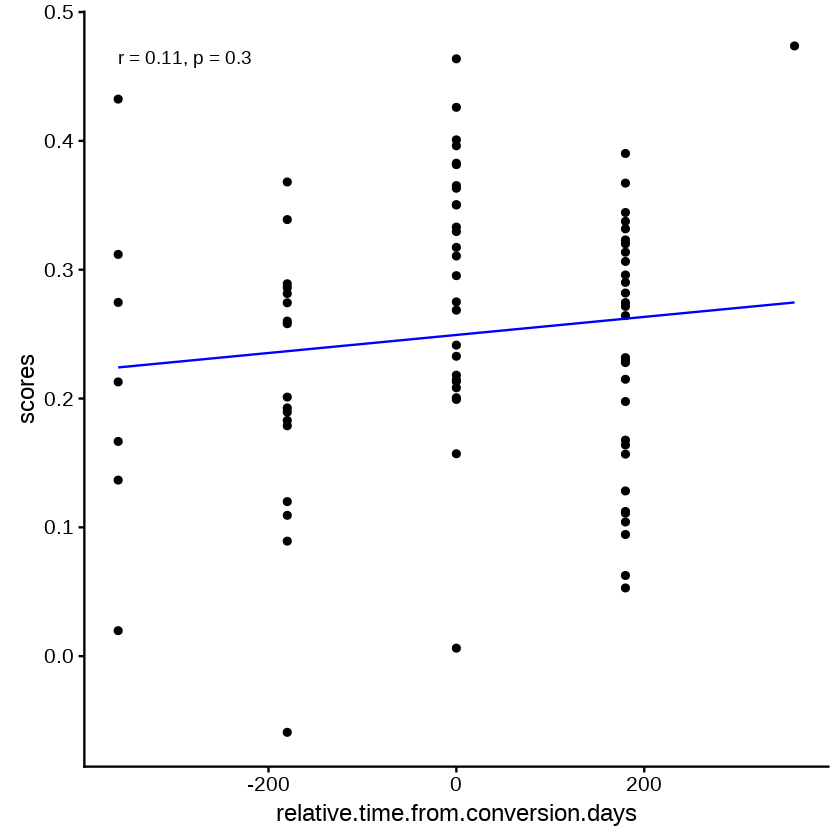

In [236]:
ggplot(ado.pheno, aes(x=relative.time.from.conversion.days, y=scores))  + geom_point() +
geom_smooth(method = "lm", col= "blue", se = FALSE, size=0.5) + 
        stat_cor(method = "pearson") 

##### Show the various AUC curves to discriminate among these time points

In [ ]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=relative.time.from.conversion.days ), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

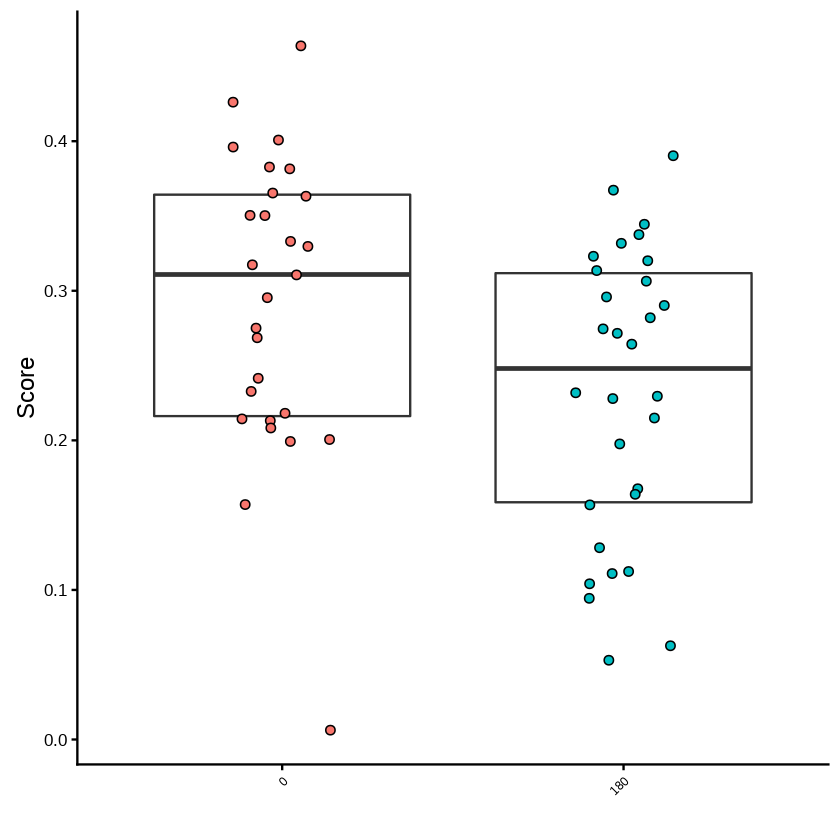

In [242]:
ado.pheno.bar = dplyr::filter(ado.pheno, relative.time.from.conversion.days %in% c(0,180))
ado.pheno.bar$relative.time.from.conversion.days = as.factor(ado.pheno.bar$relative.time.from.conversion.days)
all.samples.bar = ggplot(ado.pheno.bar, aes(x=relative.time.from.conversion.days , y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

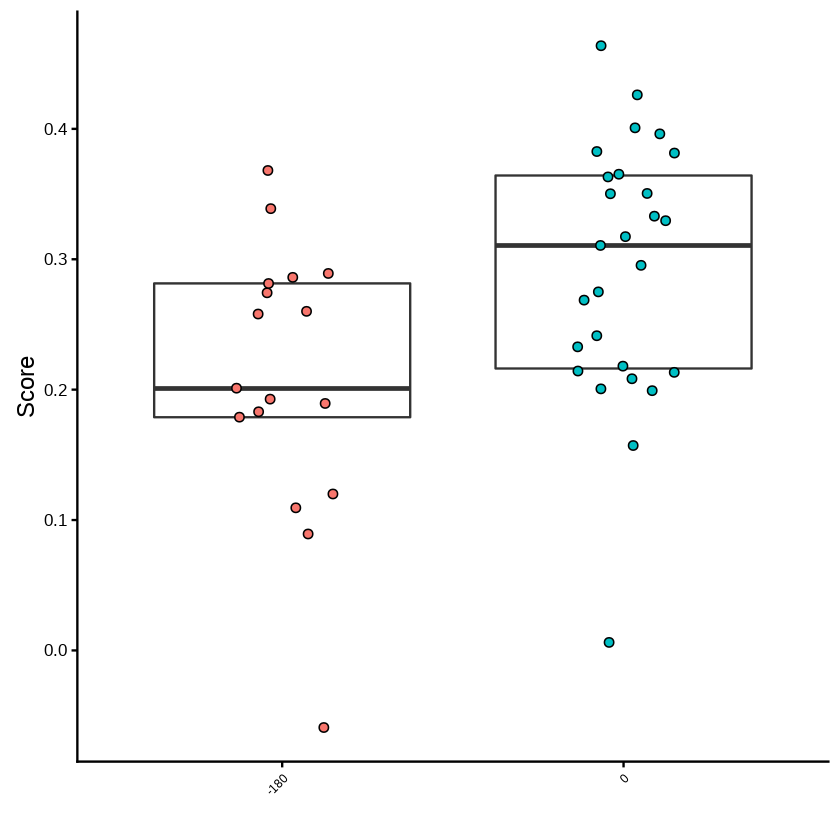

In [243]:
ado.pheno.bar = dplyr::filter(ado.pheno, relative.time.from.conversion.days %in% c(-180,0))
ado.pheno.bar$relative.time.from.conversion.days = as.factor(ado.pheno.bar$relative.time.from.conversion.days)
all.samples.bar = ggplot(ado.pheno.bar, aes(x=relative.time.from.conversion.days , y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

[1] "This is the AUC:"
Area under the curve: 0.7386
[1] "This is the AUC p-value:"
[1] 0.003801061
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5873-0.8899 (DeLong)


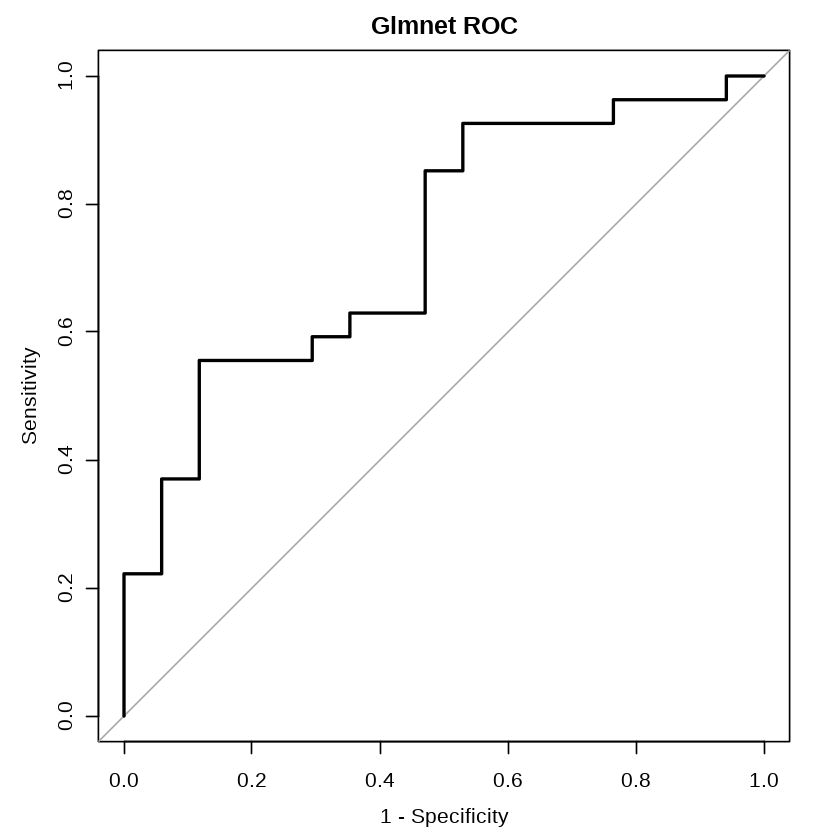

In [244]:
glmnet.Sul.train.ROC.score <- my.roc(ado.pheno.bar$scores,
                        ado.pheno.bar$relative.time.from.conversion.days,
                     "0", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.7222
[1] "This is the AUC p-value:"
[1] 0.003014451
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5794-0.8651 (DeLong)


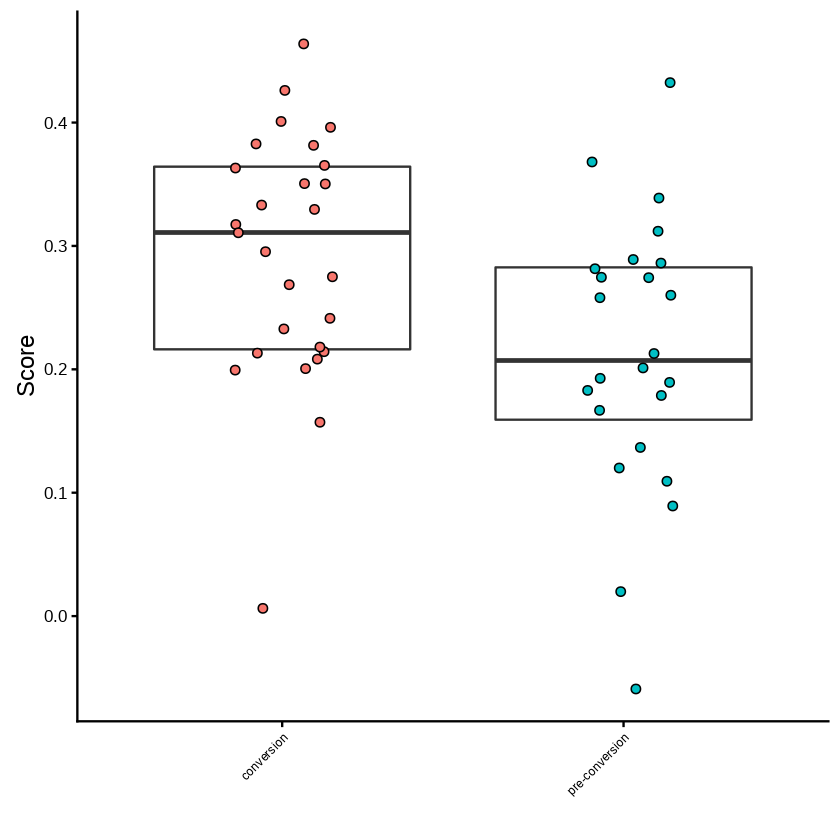

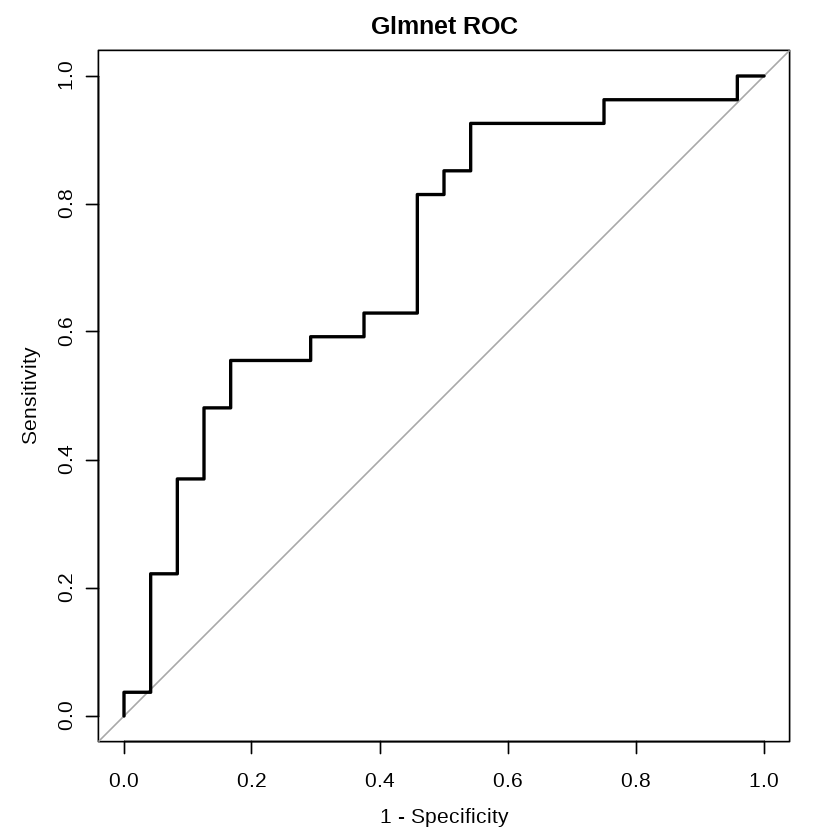

In [248]:
ado.pheno.bar = dplyr::filter(ado.pheno, relative.time.from.conversion.days %in% c(-360, -180,0))
ado.pheno.bar$relative.time.from.conversion.days = as.factor(ifelse(ado.pheno.bar$relative.time.from.conversion.days==0, "conversion", "pre-conversion"))
all.samples.bar = ggplot(ado.pheno.bar, aes(x=relative.time.from.conversion.days , y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

ado.val.pre.infect <- my.roc(ado.pheno.bar$scores,
                        ado.pheno.bar$relative.time.from.conversion.days,
                     "conversion", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.6822
[1] "This is the AUC p-value:"
[1] 0.003859619
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5586-0.8057 (DeLong)


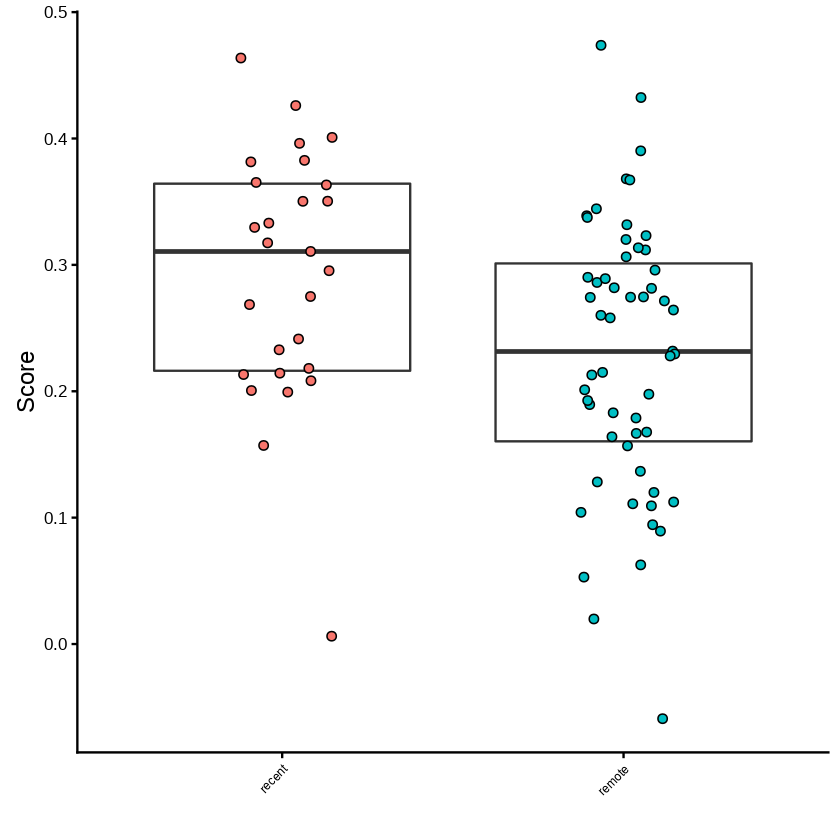

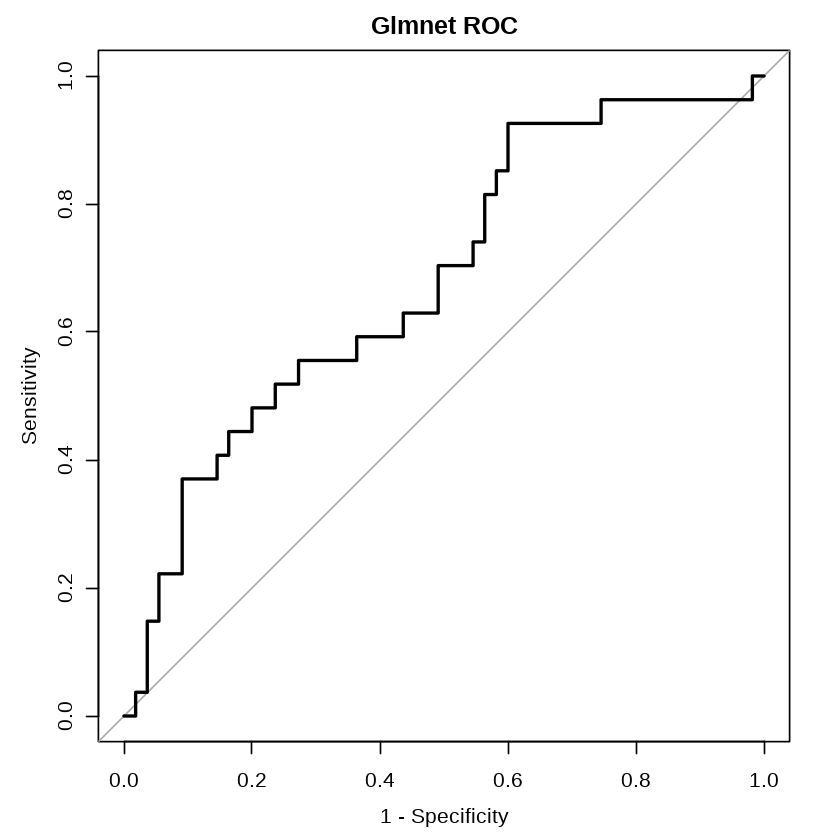

In [249]:
ado.pheno.bar = dplyr::filter(ado.pheno, relative.time.from.conversion.days %in% c(-360, -180,0, 180, 360))
ado.pheno.bar$relative.time.from.conversion.days = as.factor(ifelse(ado.pheno.bar$relative.time.from.conversion.days==0, "recent", "remote"))
all.samples.bar = ggplot(ado.pheno.bar, aes(x=relative.time.from.conversion.days , y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

ado.val.vs.all<- my.roc(ado.pheno.bar$scores,
                        ado.pheno.bar$relative.time.from.conversion.days,
                     "recent", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.6511
[1] "This is the AUC p-value:"
[1] 0.02449173
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5075-0.7948 (DeLong)


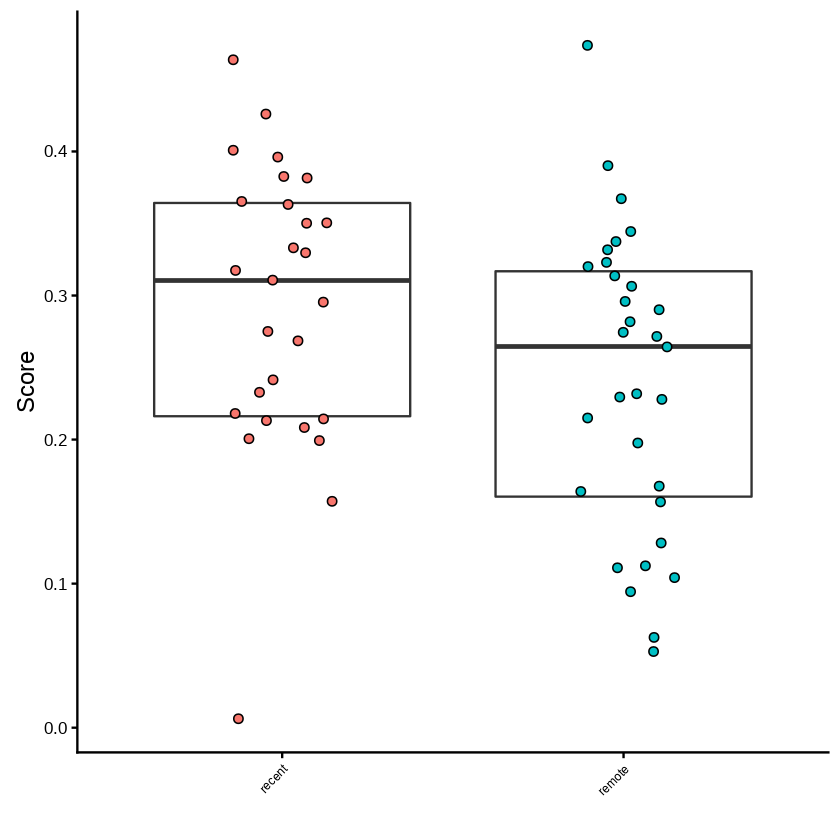

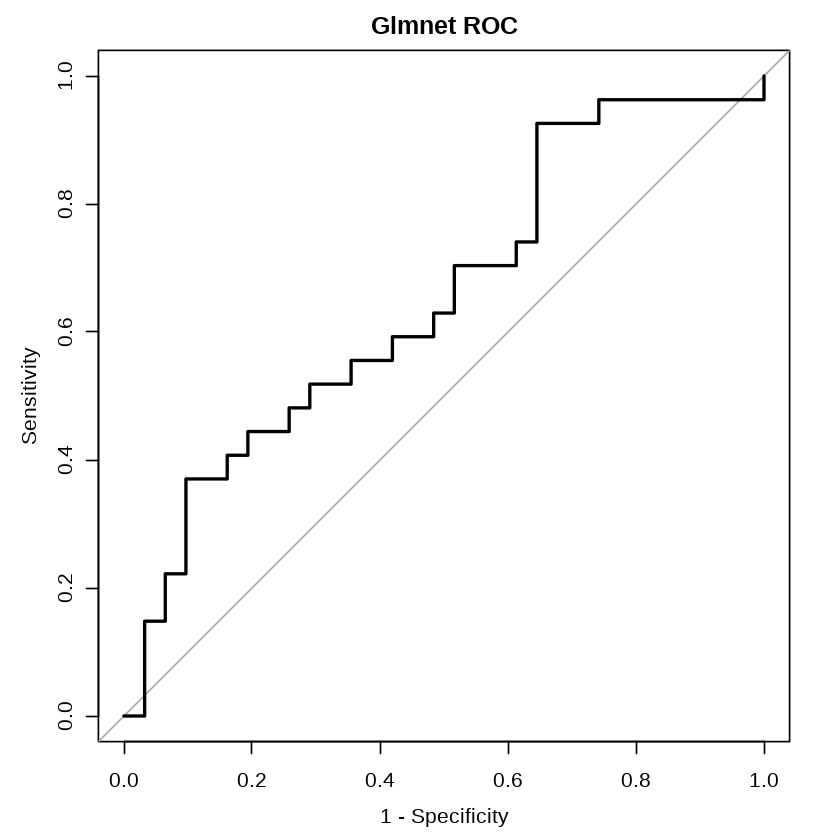

In [247]:
ado.pheno.bar = dplyr::filter(ado.pheno, relative.time.from.conversion.days %in% c(0, 180, 360))
ado.pheno.bar$relative.time.from.conversion.days = as.factor(ifelse(ado.pheno.bar$relative.time.from.conversion.days==0, "recent", "remote"))
all.samples.bar = ggplot(ado.pheno.bar, aes(x=relative.time.from.conversion.days , y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

glmnet.Sul.train.ROC.score <- my.roc(ado.pheno.bar$scores,
                        ado.pheno.bar$relative.time.from.conversion.days,
                     "recent", title="Glmnet ROC")

##### Make a final figure including pre-infection vs 0 months and 0 months vs. all time points

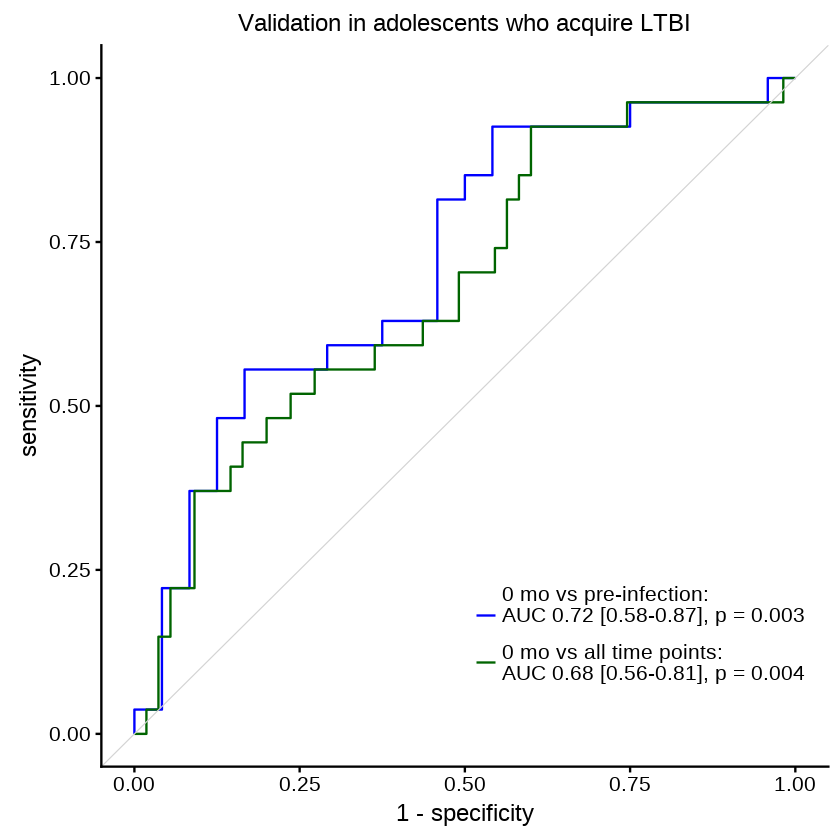

In [281]:
ado.validation.plot = ggroc(list(pre.infect=ado.val.pre.infect, 
                                           vs.all=ado.val.vs.all), 
                                      legacy.axes=TRUE) +
                geom_abline(intercept = 0, slope = 1, color = "lightgrey", size = 0.25) + 
                ggtitle("Validation in adolescents who acquire LTBI") + theme(plot.title = element_text(size=14, face="plain")) +
                scale_color_manual(name="",
                                  labels=c("pre.infect" ="0 mo vs pre-infection:\nAUC 0.72 [0.58-0.87], p = 0.003\n",
                                           "vs.all"="0 mo vs all time points:\nAUC 0.68 [0.56-0.81], p = 0.004"),
                                  values=c("pre.infect"="blue", "vs.all"="darkgreen")) +
            theme(legend.position=c(0.50,0.20), legend.title = element_text(size=12), legend.text = element_text(size=12))#,
               #  legend.spacing.y=unit(21.0, 'cm')) 
#guides(fill=guide_legend(keyheight=1.2, default.unit="inch"))
ado.validation.plot

In [ ]:
[1] "This is the AUC:"
Area under the curve: 0.7222
[1] "This is the AUC p-value:"
[1] 0.003014451
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5794-0.8651 (DeLong)

[1] "This is the AUC:"
Area under the curve: 0.6822
[1] "This is the AUC p-value:"
[1] 0.003859619
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5586-0.8057 (DeLong)

##### Other graphs

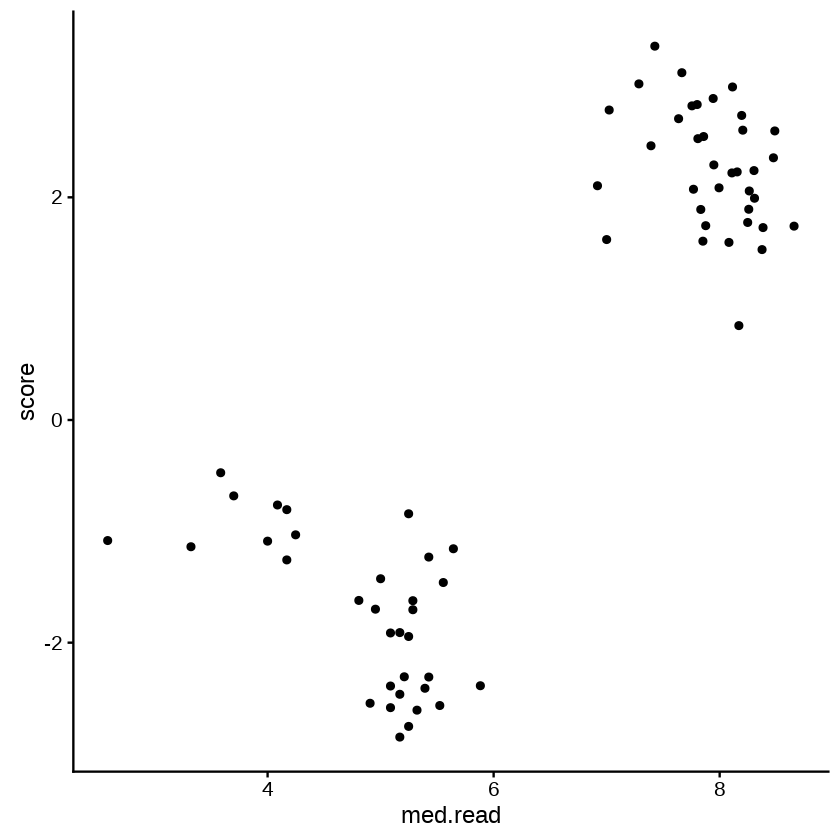

In [374]:
ggplot(scatter.contact.ltbi, aes(x=med.read, y=score)) + geom_point()

In [ ]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=time), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(score.plot, aes(x=time, y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

In [433]:
ado.exprs.scores

GSM3207067   GSM3207068   GSM3207069   GSM3207070   GSM3207071   GSM3207072 
 0.382670256  0.432414585  0.258078729  0.264340679  0.317358248  0.260098482 
  GSM3207073   GSM3207074   GSM3207075   GSM3207076   GSM3207077   GSM3207078 
 0.214945780  0.167711461  0.320120880  0.271537453  0.199301497  0.268600578 
  GSM3207079   GSM3207080   GSM3207081   GSM3207082   GSM3207083   GSM3207084 
 0.400823200  0.104146973  0.473698494  0.163959907  0.062635794  0.331727292 
  GSM3207085   GSM3207086   GSM3207087   GSM3207088   GSM3207089   GSM3207090 
 0.329638567  0.426053680  0.156824101  0.311873231  0.310636584  0.274302574 
  GSM3207091   GSM3207092   GSM3207093   GSM3207094   GSM3207095   GSM3207096 
 0.094452156  0.295374186 -0.059117757  0.350450947  0.189468228  0.192705449 
  GSM3207097   GSM3207098   GSM3207099   GSM3207100   GSM3207101   GSM3207102 
 0.290121922  0.313576759  0.390228208  0.396175741  0.019781645  0.212890131 
  GSM3207103   GSM3207104   GSM3207105   GSM3207106   GSM3207107   GSM3207108 
 0.214322097  0.275017749  0.281492147  0.306394491  0.231751270  0.112333778 
  GSM3207109   GSM3207110   GSM3207111   GSM3207112   GSM3207113   GSM3207114 
 0.368104962  0.463713057  0.274472334  0.338903855  0.111023345  0.363225029 
  GSM3207115   GSM3207116   GSM3207117   GSM3207118   GSM3207119   GSM3207120 
 0.200616351  0.281893815  0.333088879  0.197661884  0.052949720  0.213205566 
  GSM3207121   GSM3207122   GSM3207123   GSM3207124   GSM3207125   GSM3207126 
 0.323104543  0.089306051  0.286093604  0.136670467  0.157137484  0.208333000 
  GSM3207127   GSM3207128   GSM3207129   GSM3207130   GSM3207131   GSM3207132 
 0.241427983  0.344425132  0.365280390  0.274611146  0.128250689  0.367222387 
  GSM3207133   GSM3207134   GSM3207135   GSM3207136   GSM3207137   GSM3207138 
 0.119977623  0.178842069  0.232796076  0.166692665  0.229533189  0.218112242 
  GSM3207139   GSM3207140   GSM3207141   GSM3207142   GSM3207143   GSM3207144 
 0.201109862  0.289085400  0.109327746  0.227915858  0.182985056  0.381520755 
  GSM3207145   GSM3207146   GSM3207147   GSM3207148 
 0.006219455  0.337544844  0.295902449  0.350257812

In [425]:
"ZNF608" %in% colnames(ado.exprs.test)

[1] TRUE

In [426]:
"BEAN1" %in% colnames(ado.exprs.test)

[1] FALSE

In [427]:
c("RP11-552F3.12", "PYURF" ,        "TRIM7"  ,       "TUBGCP4"  ) %in% colnames(ado.exprs.test)

[1] FALSE FALSE  TRUE  TRUE

In [424]:
head(colnames(ado.exprs.test))

[1] "EEF1A1"  "GAPDH"   "SLC35E2" "DUSP22"  "RPS28"   "IPO13"

### Reviewer 1, Comment X, Why not show sensitivity and specificity for the validation?

- My formulated (After seeing blind predictions) evaluation is how well does the model allow discrimination of LTBI+ contacts in Leicester from all other groups. Use the best positive predictive value cut-off and graph proportion with a recent exposure test.

#### Thoughts and Interim Conclusions

- This fundamentally cannot be done since we do not know when people were precisely infected for any dataset. Currently the predictor can only be evaluated based on its expected properties, as were observed, or in implementation studies to see if it is useful.
- However, we can use the interpretive mode I discovered through my blind predictions, that the 6-month time point prediction indicates recent exposure.
- We can frame in longitudinal studies any 6-month post-exposure prediction as indicative of recent infection
- We can do an a priori (though ultimately it was influenced by the results) extreme assumption that controls, LTBI and active TB would all not have a recent exposure, as measured by my RNA test (seems likely), and that all recent contacts who are LTBI+ were infected from their exposure (certainly not true).
- Take the probability prediction, determine whether closer to 1 is 6-month or baseline
- Among all longitudinal subjects, choose one value, the one closer to the 6-month prediction.
- Using each subject once (and excluding all the baseline samples only from the Leicester cohort), show a ROC curve given the strong assumption of everyone in a given cohort being either recently infected or remotely infected.
- Also show a ROC curve considering only longitudinal cohorts (ACS, assumed remote, Leicester control, assumed remote, and Leicester LTBI+, assume recent) as a sensitivity analysis (because longitudinal sampling will increase false positive rate in people).

- DO EXCLUDE THE LEICESTER BASELINE ONLY SAMPLES. ONLY DO THE LONGITUDINAL SAMPLES

- Not possible to test this, since Microarray and RNA-seq are not comparable for this purpose. I tried 3 pre-specified normalization procedures and got wildly and uninterpretable results from all of them. Almost all samples were predicted as late, which is contrary to the biology discovered through all of the RNA-seq datasets

### I will have to do a joint quantile normalization across ALL datasets for this comparison (not too hard), so that a common threshold can be set for the ROC curve. If I do put this analysis into the paper, then I should definitely include the joint quantile normalization results for everything. And I probably should explain that these genes aren't all the same as the genes for only the Suliman et al data (and maybe share how much they do or do not overlap, the final model genes)

### There are some puzzling results here, My primary a-priori comparison with just the current figures' results was correct, significant AUC of LTBI+ recent contact vs all. But LTBI+ vs. LTBI- recent contact didn't give significant discrimination(not many samples), and adolescent LTBI was discrminated from adult LTBI just as well as LTBI+ recent contact was discriminated. A small amount of discrimination observed between adolescent LTBI progressor and adolescent LTBI non-progressor. Are some of the discriminations from batch effects from different studies, and what discriminations are real?

### It is clear that I should repeat my previous graphs using this joint model with normalization across all samples. Else the different groups are not comparable.

### The graph results with the joint normalization is very disconcerting. It seems that my joint quantile normalization on the raw reads is not very good. The results crumble with this, and it makes me wonder whether the results are truly robust. One idea i just had is to use MetaIntegrator to combine these data, using their model and thresholding to derive a discriminative score. I do trust their method to produce scores that are discriminative across datasets. This would be going towards reducing the signature to a few genes. Then you coudl just do quantile normalization within datasets, and we wouldn't have to fit a model across a ton of different datasets. 

# I do believe that the quantile normalization per each 1 dataset could work with the MetaIntegrator model. Then I wouldn't be trying to combine different datasets, which is problematic. I think everything could stand up the the present in how I apply models with the individual mice, monkey and GC-674 dataset and the M.tb adolescent acquisition cohort. It's the cross-dataset prediction where the problem lies. Overlapping genes across the different species will also be very helpful.

# Singhania et al do a combined analysis fo RNA-seq and microarray data, but I don't yet understand/know to what degree they truly combined these datasets.


# I think trying to reduce the signature is one way to get to a hopefully satisfactory answer.
# Another potential option is that it's just randomly choosing a different cut-off point for the individual model, that calibration becomes different with the joint normalization. I would do well to try to understand how the 1st model was calibrated, where along sensitivity/specificity it fell. If I graph things as before, I should almost certainly choose a sensitivity/specificity trade-off before doing the graphs. It needs to be a defined thresshold.

# Ineed a break from this, it is hurting my head.



#### Load the data

In [4]:
source("utils_submission.R")

Sul.path = paste(path, "/data/GSE94438", sep="")
ACS.path = paste(path, "/data/GSE79362", sep="")

Sul.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

Sul.pheno = filter.human.pheno(pData(Sul.pheno.set))

ACS.pheno.set = getGEO(filename=paste(ACS.path, "GSE79362_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

ACS.pheno = filter.ACS.pheno(pData(ACS.pheno.set))

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.ACS.pheno(pData(ACS.pheno.set)):
“NAs introduced by coercion”

[1] "about to return new data frame"


In [55]:
summary(pData(ACS.pheno.set))

                                           title     geo_accession     
 Non-progressor (01_0934D020uL01_0934_L1.LB1) :  1   Length:355        
 Non-progressor (01_0940D030uL01_0940_L6.LB10):  1   Class :character  
 Non-progressor (030697PAXGENEDAY0_L2.LB11)   :  1   Mode  :character  
 Non-progressor (030711PAXGENEDAY0_L4.LB23)   :  1                     
 Non-progressor (030714PAXGENEDAY0_L3.LB21)   :  1                     
 Non-progressor (04_0699D025uL04_0699_L3.LB6) :  1                     
 (Other)                                      :349                     
                   status       submission_date    last_update_date  type    
 Public on Jan 06 2017:  1   Jan 06 2017:  1    Jan 09 2017:  1     SRA:355  
 Public on Mar 22 2016:354   Mar 17 2016:354    Sep 16 2016:354              
                                                                             
                                                                             
                                  

In [5]:
Garra.path = paste(path, "/data/GSE107995", sep="")
Garra.pheno.set = getGEO(filename=paste(Garra.path, "GSE107995_series_matrix.txt.gz", sep="/"),
             destdir=Garra.path)

Garra.pheno = filter.Garra.pheno(pData(Garra.pheno.set))

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL20301 found here:
./data/GSE107995/GPL20301.soft 
Warning message in filter.Garra.pheno(pData(Garra.pheno.set)):
“NAs introduced by coercion”

                   title    
 Berry_London_Sample1 :  1  
 Berry_London_Sample10:  1  
 Berry_London_Sample11:  1  
 Berry_London_Sample12:  1  
 Berry_London_Sample13:  1  
 Berry_London_Sample14:  1  
 (Other)              :408  
                                     source_name_ch1 age_at_baseline_visit
 Longitudnal_Leicester_Control_Non_progressor:69     Min.   :16.00        
 Longitudnal_Leicester_LTBI_Non_progressor   :69     1st Qu.:30.00        
 Leicester_Active_TB                         :53     Median :39.00        
 Leicester_Control                           :50     Mean   :39.21        
 Leicester_LTBI                              :49     3rd Qu.:46.00        
 Berry_SouthAfrica_Validation_set_LTBI       :31     Max.   :84.00        
 (Other)                                     :93     NA's   :101          
       birth_place                    ethnicity    gender   
 Foreign_Born:263   South_Asia_ISC         :198   F   :111  
 UK_Born     : 50   British_Indian         : 2

In [6]:
# Common names for progressor
Sul.pheno$group = ifelse(Sul.pheno$group == "Control", "control", "progressor")
ACS.pheno$group = ifelse(ACS.pheno$group == "control (non-progressor)", "control", "progressor")

ACS.exprs = read.table(paste(ACS.path, "gene_count_GSE79362.tsv", sep="/"), header=T, row.names=1)
ACS.exprs = filter.HUMAN.exprs(ACS.exprs, ACS.pheno)
Sul.exprs = read.table(paste(Sul.path, "gene_count_GSE94438.tsv", sep="/"), header=T, row.names=1)
Sul.exprs = filter.HUMAN.exprs(Sul.exprs, Sul.pheno)
Garra.exprs = read.table(paste(Garra.path, "Singhania_et_al_expression_ARCHS4.csv", sep="/"), header=T, row.names=1, sep=",")

all.exprs = cbind(ACS.exprs, Garra.exprs, Sul.exprs)
dim(all.exprs)

[1] "Identical column and rownames between exprs and pheno tables?"
[1] TRUE
[1] "Identical column and rownames between exprs and pheno tables?"
[1] TRUE


[1] 35238  1184

In [7]:
# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

Sul.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Sul.pheno)]
ACS.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(ACS.pheno)]

Garra.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Garra.pheno)]




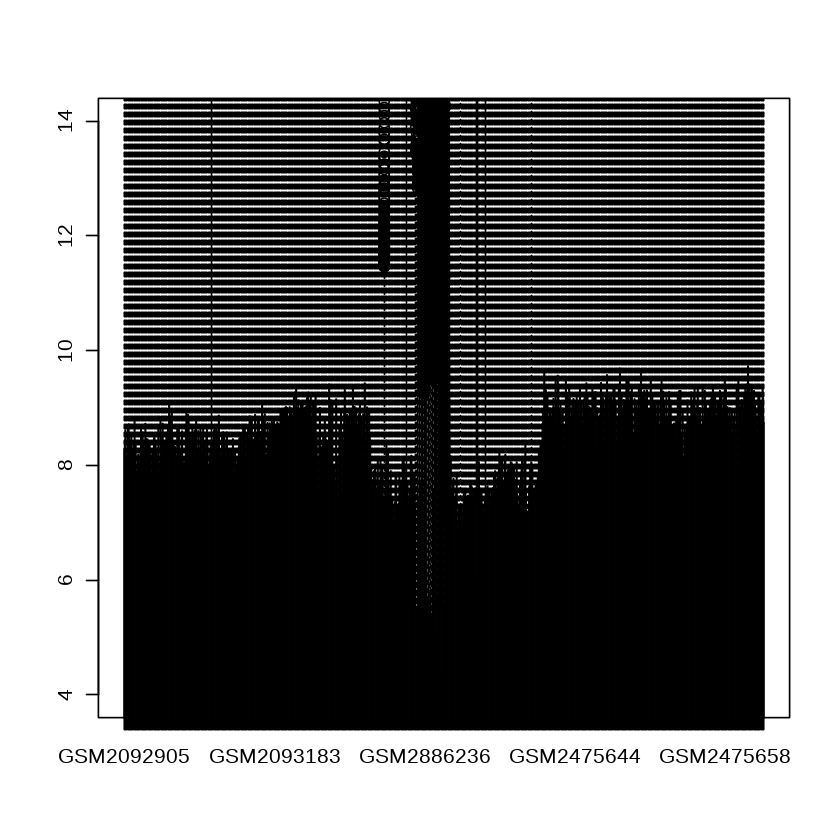

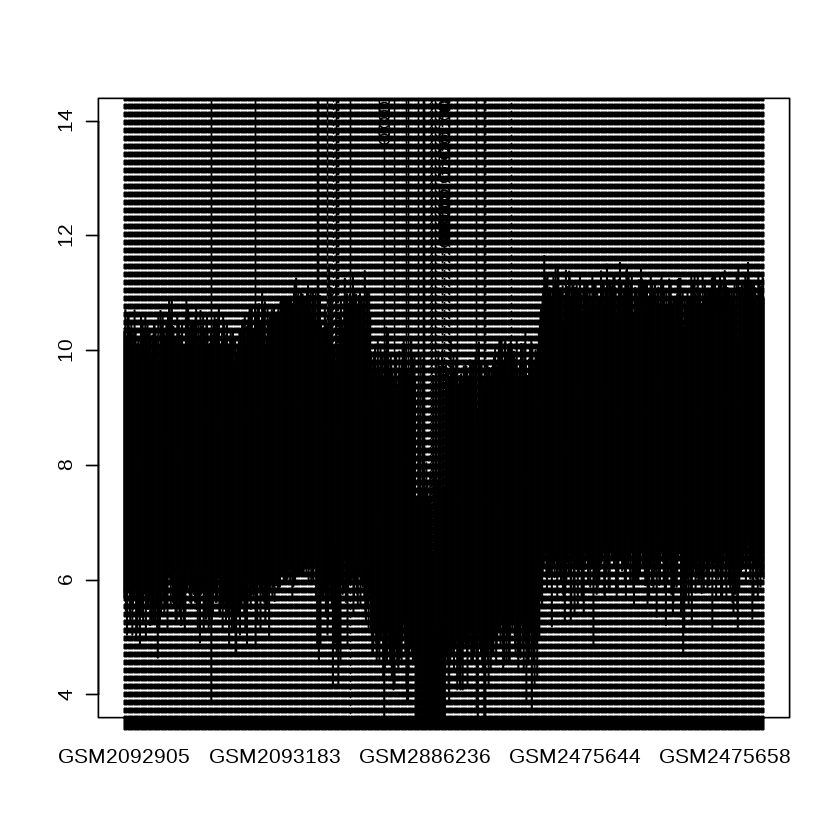

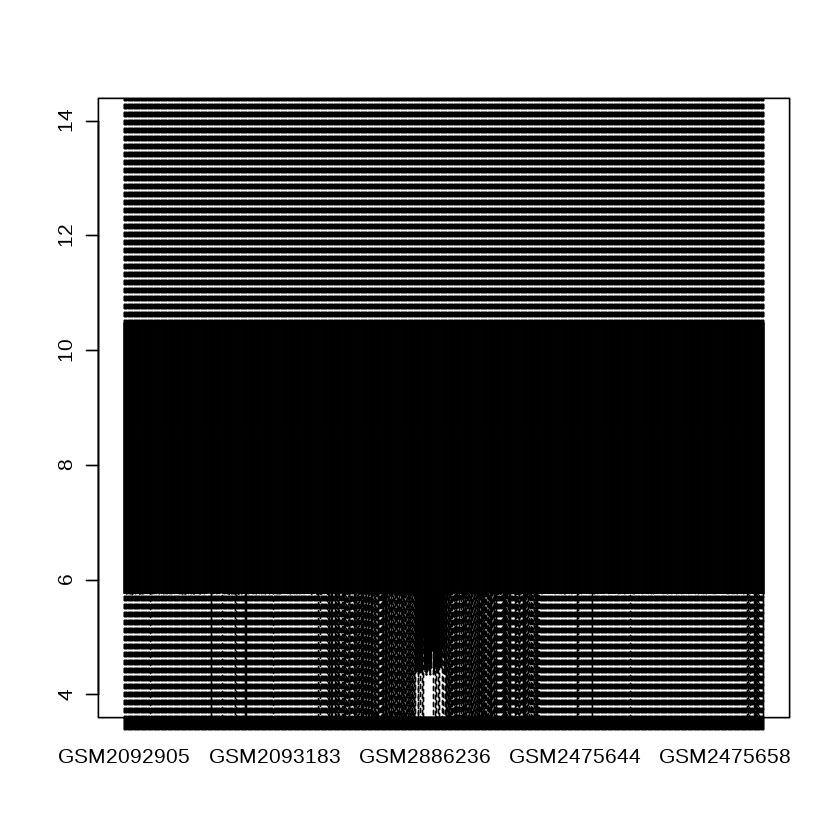

In [8]:
boxplot(log2(all.exprs+ 1), ylim=c(4,14))
boxplot(log2(exprs.fil+ 1), ylim=c(4,14))
boxplot(log2(exprs.qn+ 1), ylim=c(4,14))

#### Repeat process of Figure 3C to build a model from GC6-74 data to then predict time since TB exposure in ACS cohort

In [9]:
Sul.pheno.6mo = Sul.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new Sul.pheno

AHRI.subj = unique(dplyr::filter(Sul.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
Sul.pheno.6mo$dataset[Sul.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"


# dplyr::filter pheno and expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

Sul.pheno.6mo = droplevels(Sul.pheno.6mo[Sul.pheno.6mo$site %in% c("AHRI", "MRC") & Sul.pheno.6mo$time.from.exposure.months %in% c(0, 6),])

Sul.exprs.log.6mo = Sul.exprs.log[, colnames(Sul.exprs.log) %in% row.names(Sul.pheno.6mo)]

Sul.pheno.6mo.train = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset == "Training",])
Sul.pheno.6mo.test = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset != "Training",])

Sul.exprs.train = t(Sul.exprs.log.6mo[,row.names(Sul.pheno.6mo.train)])
Sul.exprs.test = t(Sul.exprs.log.6mo[, row.names(Sul.pheno.6mo.test)])

set.seed(100)
folds.6mo = groupKFold(Sul.pheno.6mo.train$subjectid, k=10)
for (fold in lapply(folds.6mo, function(x) {Sul.pheno.6mo.train$subjectid[x]}))
    print(length((as.character(fold))))

lapply(folds.6mo, function(x, y) table(y[x]), y = Sul.pheno.6mo.train$subjectid)

time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.train$time.from.exposure.months == "0", "early", "late"))
test.time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.test$time.from.exposure.months == "0", "early", "late"))

[1] 112
[1] 107
[1] 98
[1] 99
[1] 101
[1] 103
[1] 102
[1] 103
[1] 105
[1] 105


$Fold01

  07/G189   07/G274   07/G277   07/G300   07/G351   07/G354   07/G368   07/G370 
        1         1         1         0         1         1         1         1 
  07/G419   08/G136   08/G141   08/G160   08/G245   08/G260   08/G324   08/G333 
        1         1         1         1         1         2         2         1 
  08/G343   08/G367   08/G400   08/G407   08/G415   08/G423   08/G424   08/G433 
        1         2         1         1         1         1         1         2 
  08/G493   08/G494   08/G541   08/G587   08/G596   08/G606   08/G613   08/G643 
        1         1         1         1         1         1         1         1 
  08/G652   08/G654   08/G695   08/G701   08/G703   08/G714   08/G715   08/G726 
        2         1         1         1         2         1         1         1 
  08/G782   08/G788   08/G797   08/G800   08/G810   08/G814   08/G893   09/G120 
        1         1         2         1         1         1         1         1 
  09/G133   09/G135

In [10]:
start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

print("Made the clusters")

myFunc <- caretSBF
myFunc$summary <- twoClassSummary
myFunc$score <- function(x, y) {
  out <- wilcox.test(x ~ y)$p.value # Will have warnings due to ties; ignore for now.
  out
}

filtercontrol.lm = sbfControl(functions = myFunc, method = "cv",  index=folds.6mo,  allowParallel=TRUE) 
set.seed(10)
wilcoxWithFilter.lm = sbf(Sul.exprs.train, as.factor(Sul.pheno.6mo.train$time.from.exposure.months), sbfControl = filtercontrol.lm)

print("Did the feature selection")
stopCluster(cluster)
registerDoSEQ()


end_time <- Sys.time()
print(end_time - start_time)

[1] "Made the clusters"
[1] "Did the feature selection"
Time difference of 12.16573 mins


In [11]:
opt.Sul.all.vars = wilcoxWithFilter.lm$optVariables

In [16]:
length(opt.Sul.all.vars)

[1] 2612

In [12]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-6), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))

In [13]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(Sul.exprs.train[, colnames(Sul.exprs.train) %in% c(opt.Sul.all.vars)],
                  time.period.from.exposure,
                  method=alg, tuneGrid = train.grid, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}



stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 2.238686 mins


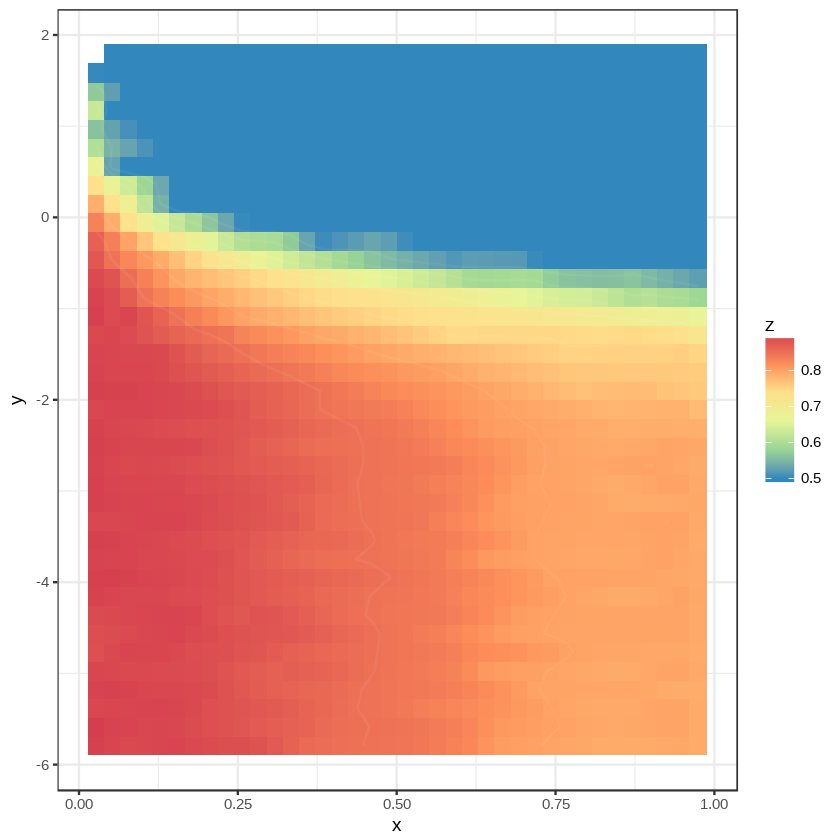

In [14]:
glmres = models$glmnet$results
graph.hyper (x=glmres$alpha, y=log10(glmres$lambda), z=glmres$ROC)

In [15]:
human.expose.Sul.all.model = models$glmnet

[1] "This is the AUC:"
Area under the curve: 0.893
[1] "This is the AUC p-value:"
[1] 3.860085e-13
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.833-0.953 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6966
[1] "This is the AUC p-value:"
[1] 0.002542028
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5725-0.8207 (DeLong)


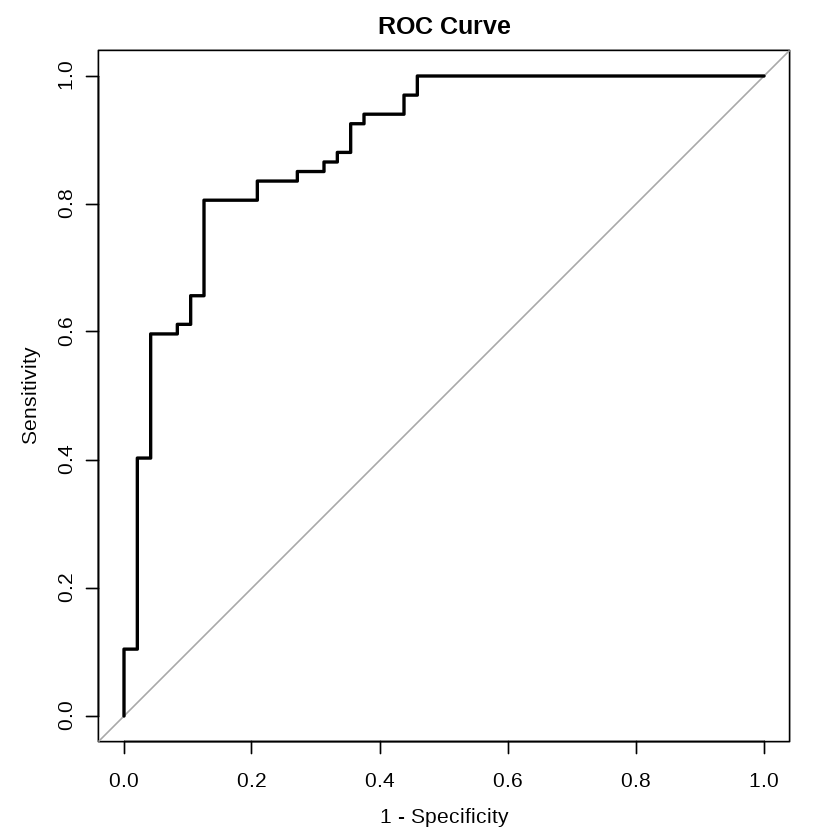

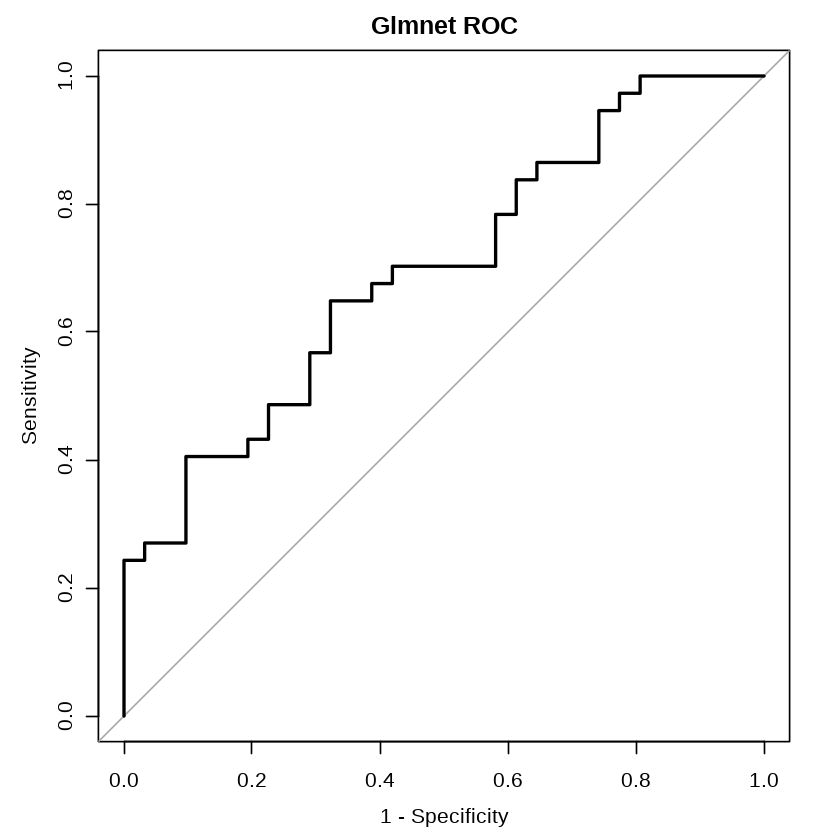

In [17]:
glmnet.Sul.val.ROC = my.roc(human.expose.Sul.all.model$pred$early, human.expose.Sul.all.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.all.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.all.vars)], type="prob")

glmnet.Sul.test.ROC <- my.roc(pred.Sul.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

#### Select the cohorts to do prediction in. Determine the distribution of the prediction score.

Okay, since late is the prediction of recent infection, the sample to choose for a longitudinal sample is the sample with the highest late probability.

How I do this, first take the whole pheno table and add the variable for recent or remote based off their characteristics
Then make the prediction table with the max of late, taking the max of each subject, make this a dataframe. 
Then of original pheno take only the subject and the recent/remote variable, do a unique. Reorder the dataframe according to the predictions
Then make the AUC curve

##### Functions

In the ACS cohort, the title seems to have the subject ID. 

one subjscript or PAXGENE presence, means pax gene,if not paxgene, so I could process them accoringly

In [378]:
get_paren = function(strs) {
    res = c()
    for (j in strs) {
    k <- str_extract_all(j, "\\([^()]+\\)")[[1]]
# Remove parenthesis
    k <- substring(k, 2, nchar(k)-1)
        res = c(res, k)
        }
    return(res)
}

extract_id = function(strs) {
    res = c()
    for (s in strs) {
        if (grepl("PAX",s)) {
            k = str_match(s, "(\\d{4})PAX")[[2]]
        } else if (str_count(s, "_") >= 3){
            k = str_match(s, "\\d{2}_(\\d{4})D")[[2]]
        } else {
            k = NA
        }
        res = c(res, k)
    }
    return(res)
}

##### Continued code

In [78]:
ACS.pheno$time.infection = "remote"
ACS.pheno$patient_id = as.factor(extract_id(ACS.pheno$title))
ACS.pheno.fil = ACS.pheno[!is.na(ACS.pheno$patient_id),]
ACS.exprs.fil = t(ACS.exprs.log[,colnames(ACS.exprs.log) %in% rownames(ACS.pheno.fil)])

# Need to filter Garra dataset of baseline samples from all non-longitudinal contacts
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

Garra.pheno.fil = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI")),])
Garra.exprs.fil = t(Garra.exprs.log[,colnames(Garra.exprs.log) %in% rownames(Garra.pheno.fil)])
Garra.pheno.fil$time.infection = ifelse(Garra.pheno.fil$source_name_ch1 %in% c("Berry_London_Test_set_Active_TB",
 "Berry_London_Test_set_LTBI",
 "Berry_London_Test_set_Control",
 "Berry_SouthAfrica_Validation_set_LTBI",
 "Berry_SouthAfrica_Validation_set_Active_TB",
 "Longitudnal_Leicester_Control_Non_progressor",
 "Leicester_Active_TB",
 "Longitudnal_Leicester_LTBI_Progressor"), "remote","recent")

In [ ]:
#ACS.exprs.test.all = t(ACS.exprs.log)

In [82]:
pred.ACS.test.prob = predict(human.expose.Sul.all.model, newdata = ACS.exprs.fil[, colnames(ACS.exprs.fil) %in% c(opt.Sul.all.vars)], type="prob")
pred.Garra.test.prob = predict(human.expose.Sul.all.model, newdata = Garra.exprs.fil[, colnames(Garra.exprs.fil) %in% c(opt.Sul.all.vars)], type="prob")

In [91]:
ACS.test.subj.max = tapply(pred.ACS.test.prob$late, ACS.pheno.fil$patient_id , max)
length(ACS.test.subj.max)
Garra.test.subj.max = tapply(pred.Garra.test.prob$late, Garra.pheno.fil$patient_id , max)
length(Garra.test.subj.max)

[1] 105

[1] 194

In [92]:
names(ACS.test.subj.max)

[1] "0056" "0060" "0074" "0127" "0129" "0135" "0140" "0143" "0152" "0157"
 [11] "0177" "0180" "0200" "0208" "0218" "0226" "0229" "0231" "0236" "0238"
 [21] "0257" "0259" "0278" "0282" "0290" "0293" "0308" "0350" "0355" "0360"
 [31] "0361" "0369" "0377" "0386" "0390" "0391" "0392" "0397" "0398" "0406"
 [41] "0414" "0424" "0425" "0428" "0438" "0440" "0460" "0462" "0467" "0489"
 [51] "0507" "0511" "0520" "0524" "0532" "0578" "0587" "0624" "0625" "0628"
 [61] "0630" "0644" "0663" "0673" "0692" "0695" "0697" "0699" "0711" "0712"
 [71] "0714" "0718" "0721" "0745" "0757" "0779" "0789" "0796" "0811" "0818"
 [81] "0843" "0859" "0886" "0910" "0934" "0940" "0979" "0993" "1003" "1020"
 [91] "1056" "1058" "1067" "1104" "1112" "1115" "1119" "1120" "1125" "1132"
[101] "1135" "1140" "1147" "1153" "1158"

In [97]:
Garra.pheno.max = Garra.pheno.fil[!duplicated(Garra.pheno.fil[,c('patient_id')]),]#Garra.pheno.fil[Garra.pheno.fil$patient_id %in% names(Garra.test.subj.max),]
Garra.test.subj.tab =data.frame(patient_id=names(Garra.test.subj.max), pred=Garra.test.subj.max)
Garra.pred.tab = merge(Garra.pheno.max, Garra.test.subj.tab, by.y="patient_id")

In [99]:
ACS.pheno.max = ACS.pheno.fil[!duplicated(ACS.pheno.fil[,c('patient_id')]),]#ACS.pheno.fil[ACS.pheno.fil$patient_id %in% names(ACS.test.subj.max),]
ACS.test.subj.tab =data.frame(patient_id=names(ACS.test.subj.max), pred=ACS.test.subj.max)
ACS.pred.tab = merge(ACS.pheno.max, ACS.test.subj.tab, by.y="patient_id")

###### Full ROC curve with only LTBI+ recent contacts as recently exposed

[1] "This is the AUC:"
Area under the curve: 0.7871
[1] "This is the AUC p-value:"
[1] 5.614781e-05
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.6871-0.8871 (DeLong)


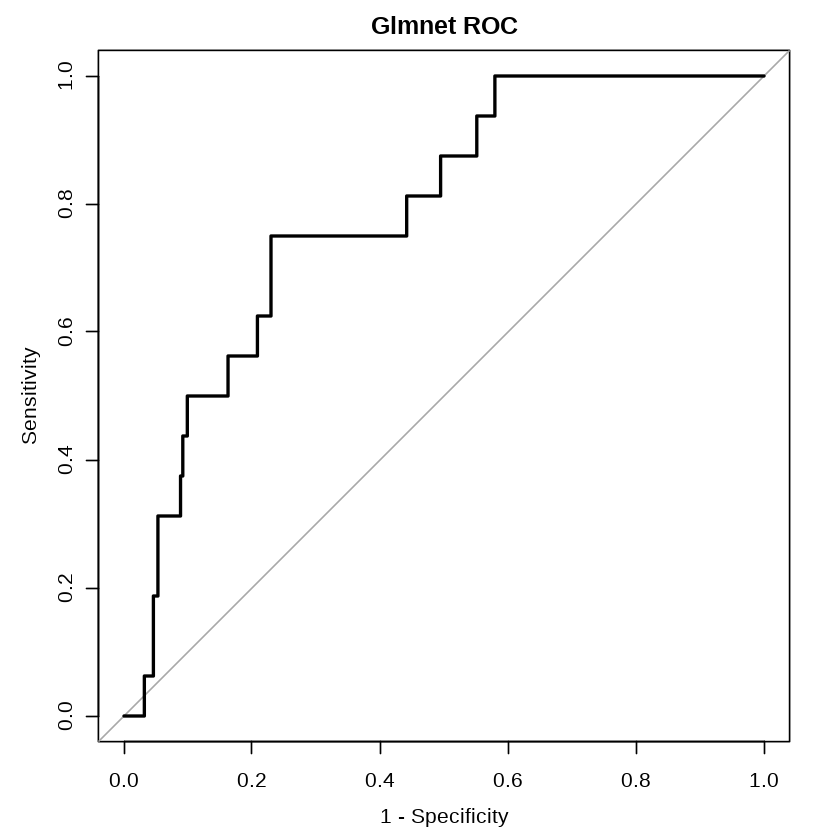

In [115]:
All.pred.tab = rbind(Garra.pred.tab[,c("time.infection","pred")], ACS.pred.tab[,c("time.infection","pred")])

all.test.ROC <- my.roc(All.pred.tab$pred,
                        All.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

###### Several other comparisons of how the recent exposure signature allows discrimination between different groups

[1] "This is the AUC:"
Area under the curve: 0.55
[1] "This is the AUC p-value:"
[1] 0.3269613
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.3307-0.7693 (DeLong)


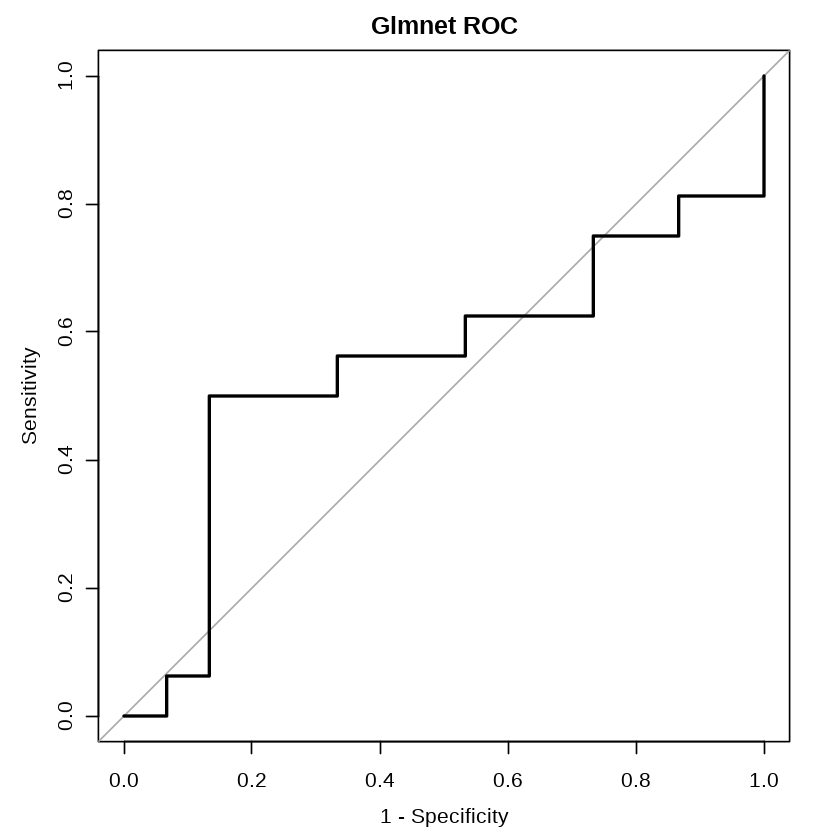

In [114]:
long.pred.tab = dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_Control_Non_progressor","Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)#rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_Control_Non_progressor",
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred), ACS.pred.tab[,c("time.infection","pred")])

long.test.ROC <- my.roc(long.pred.tab$pred,
                        long.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.5815
[1] "This is the AUC p-value:"
[1] 0.148138
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4133-0.7498 (DeLong)


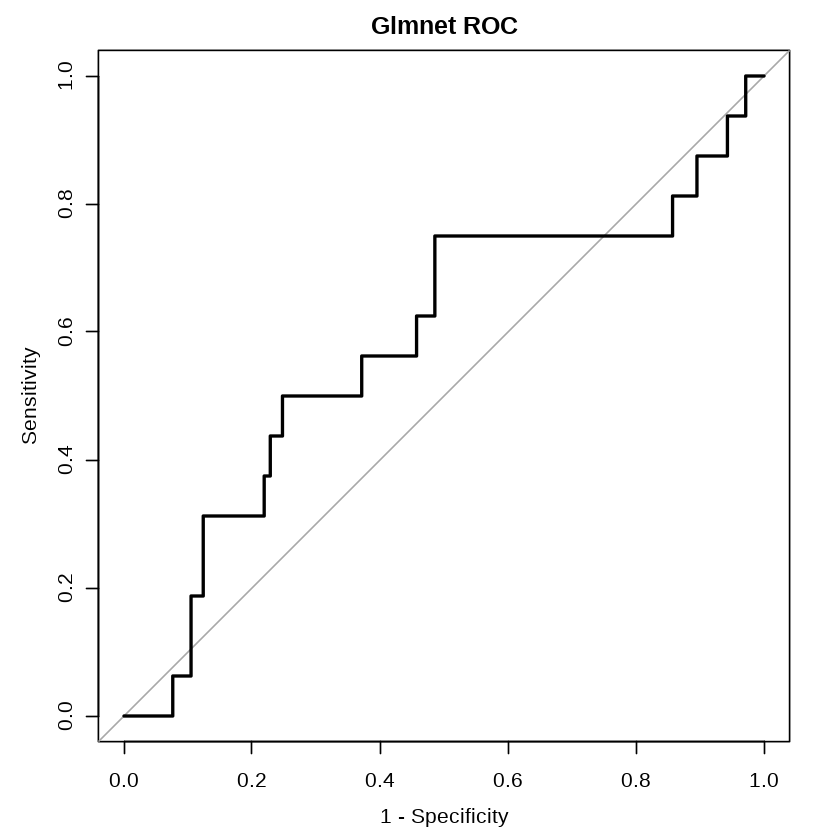

In [117]:
long.pred.tab = rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred),ACS.pred.tab[,c("time.infection","pred")])
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)#rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_Control_Non_progressor",
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred), ACS.pred.tab[,c("time.infection","pred")])

long.test.ROC <- my.roc(long.pred.tab$pred,
                        long.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

In [120]:
rep(0,20)

[1] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

[1] "This is the AUC:"
Area under the curve: 0.9509
[1] "This is the AUC p-value:"
[1] 2.145782e-20
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.9155-0.9863 (DeLong)


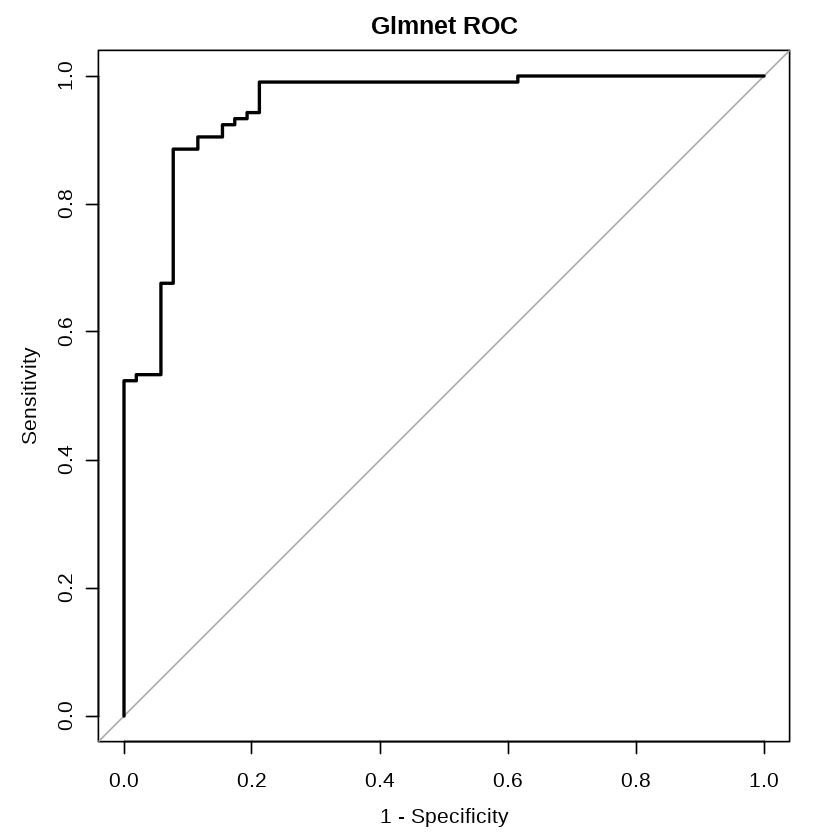

In [129]:
long.pred.tab = rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Berry_London_Test_set_LTBI",
 "Berry_SouthAfrica_Validation_set_LTBI")), time.infection, pred),ACS.pred.tab[,c("time.infection","pred")])

#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)#rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_Control_Non_progressor",
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred), ACS.pred.tab[,c("time.infection","pred")])

long.test.ROC <- my.roc(long.pred.tab$pred,
                        c(rep("remote",dim(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Berry_London_Test_set_LTBI",
 "Berry_SouthAfrica_Validation_set_LTBI")))[1]),
                          rep("recent", dim( ACS.pred.tab)[1])),
                     "recent", title="Glmnet ROC")

In [133]:
summary(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_LTBI_Non_progressor")))
summary(ACS.pred.tab)
table(ACS.pred.tab$group)

       patient_id                                                 title   
 Patient_035: 1   Leicester_non_progressor_longitudnal_only_Sample107: 1  
 Patient_040: 1   Leicester_non_progressor_longitudnal_only_Sample112: 1  
 Patient_045: 1   Leicester_non_progressor_longitudnal_only_Sample115: 1  
 Patient_049: 1   Leicester_non_progressor_longitudnal_only_Sample120: 1  
 Patient_096: 1   Leicester_non_progressor_longitudnal_only_Sample125: 1  
 Patient_132: 1   Leicester_non_progressor_longitudnal_only_Sample129: 1  
 (Other)    :10   (Other)                                            :10  
                                   source_name_ch1 age_at_baseline_visit
 Longitudnal_Leicester_LTBI_Non_progressor :16     Min.   :21.00        
 Berry_London_Test_set_Active_TB           : 0     1st Qu.:29.75        
 Berry_London_Test_set_Control             : 0     Median :38.00        
 Berry_London_Test_set_LTBI                : 0     Mean   :38.12        
 Berry_SouthAfrica_Validation_set_A

   patient_id                                           title   
 0056   : 1   Non-progressor (01_0934D020uL01_0934_L1.LB1) : 1  
 0060   : 1   Non-progressor (01_0940D030uL01_0940_L6.LB10): 1  
 0074   : 1   Non-progressor (030697PAXGENEDAY0_L2.LB11)   : 1  
 0127   : 1   Non-progressor (030711PAXGENEDAY0_L4.LB23)   : 1  
 0129   : 1   Non-progressor (030714PAXGENEDAY0_L3.LB21)   : 1  
 0135   : 1   Non-progressor (04_0699D025uL04_0699_L3.LB6) : 1  
 (Other):99   (Other)                                      :99  
      age             bin        gender      ethnicity 
 Min.   :12.00   17     :19   female:72   black   : 7  
 1st Qu.:14.00   6      : 9   male  :33   coloured:98  
 Median :16.00   13     : 6                            
 Mean   :15.42   16     : 6                            
 3rd Qu.:17.00   21     : 6                            
 Max.   :18.00   25     : 6                            
                 (Other):53                            
 previous.diagnosis.of.tb    gro


   control progressor 
        74         31 

[1] "This is the AUC:"
Area under the curve: 0.6303
[1] "This is the AUC p-value:"
[1] 0.01799959
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5139-0.7468 (DeLong)


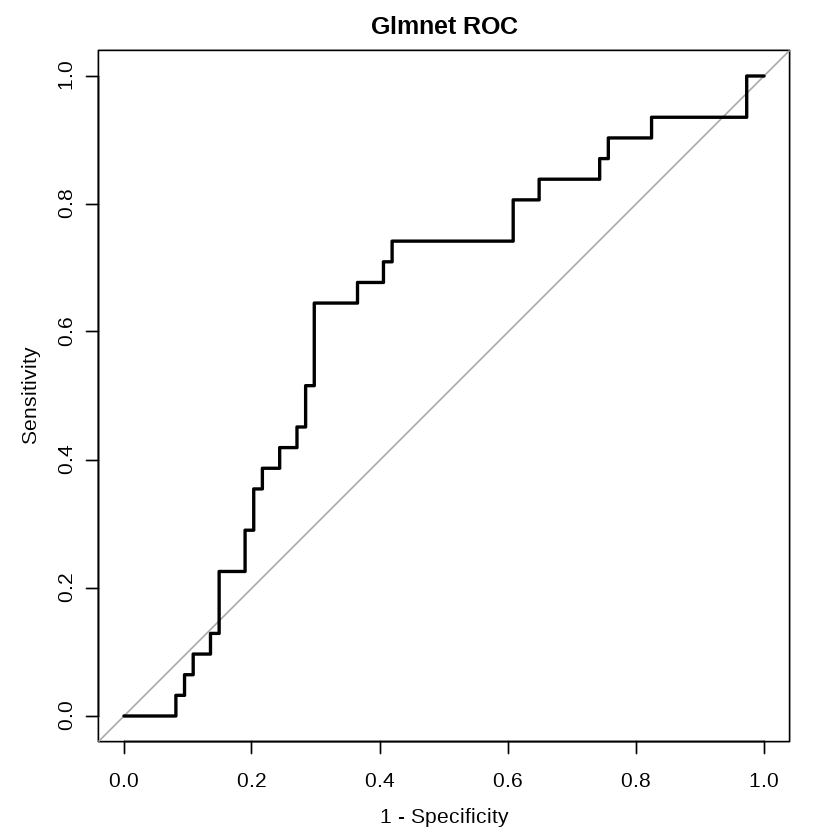

In [134]:
long.pred.tab = ACS.pred.tab

#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)#rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_Control_Non_progressor",
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred), ACS.pred.tab[,c("time.infection","pred")])

long.test.ROC <- my.roc(long.pred.tab$pred,
                        ifelse(long.pred.tab$group=="progressor","recent","remote"),
                     "recent", title="Glmnet ROC")

In [ ]:
long.pred.tab = dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Berry_London_Test_set_LTBI",
 "Berry_SouthAfrica_Validation_set_LTBI", "Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)#rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_Control_Non_progressor",
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred), ACS.pred.tab[,c("time.infection","pred")])

long.test.ROC <- my.roc(long.pred.tab$pred,
                        long.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.9615
[1] "This is the AUC p-value:"
[1] 1.473182e-08
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.9188-1 (DeLong)


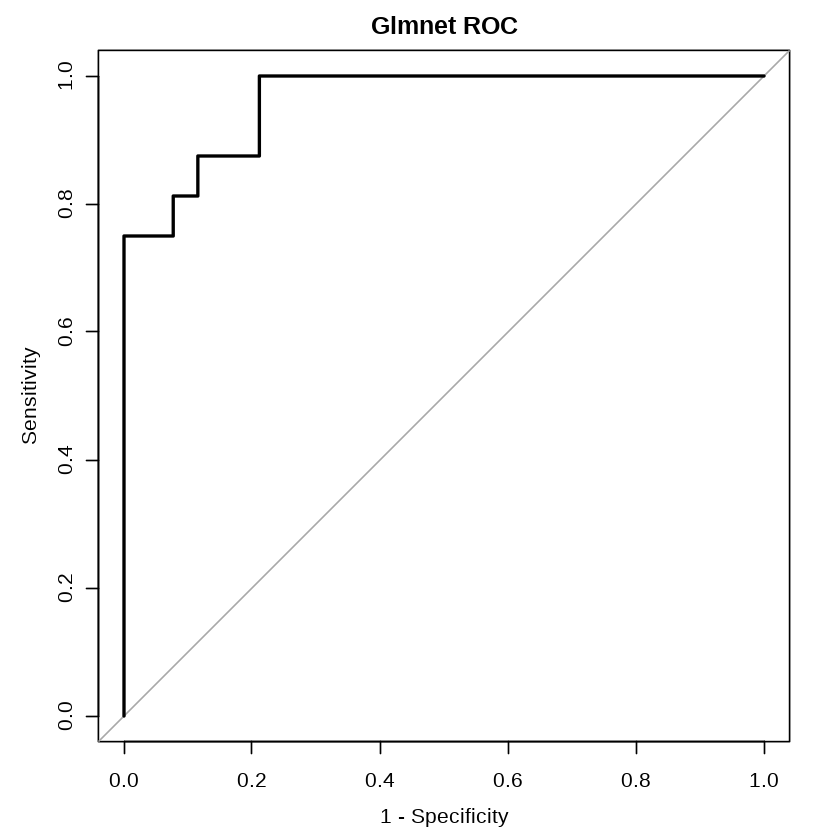

In [116]:
long.pred.tab = dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Berry_London_Test_set_LTBI",
 "Berry_SouthAfrica_Validation_set_LTBI", "Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred)#rbind(dplyr::select(dplyr::filter(Garra.pred.tab, source_name_ch1 %in%  c("Longitudnal_Leicester_Control_Non_progressor",
#"Longitudnal_Leicester_LTBI_Non_progressor")), time.infection, pred), ACS.pred.tab[,c("time.infection","pred")])

long.test.ROC <- my.roc(long.pred.tab$pred,
                        long.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

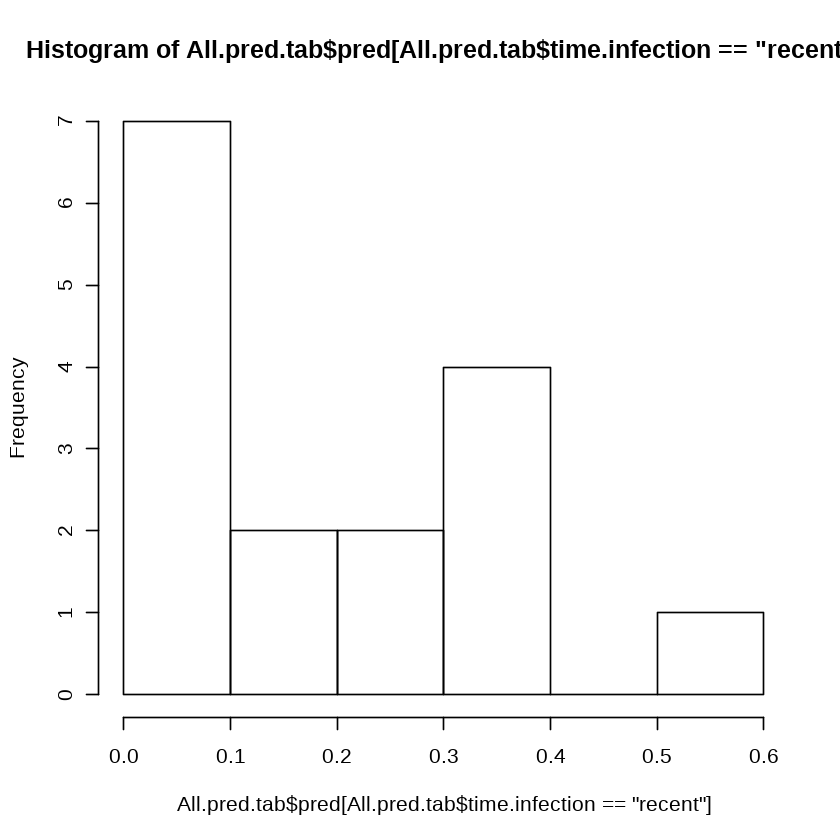

In [106]:
hist(All.pred.tab$pred[All.pred.tab$time.infection=="recent"])

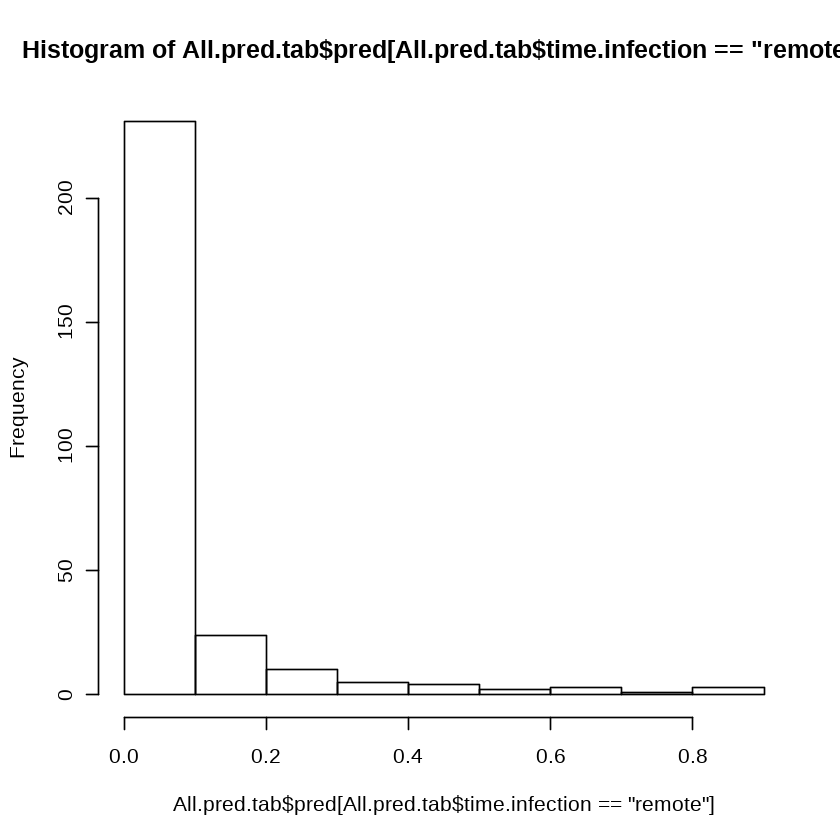

In [105]:
hist(All.pred.tab$pred[All.pred.tab$time.infection=="remote"])

#### Create a boxplot graph of the actual score for all groups

- It seems clear to me now that what I had before was not correct. I need to have scores that are broadly comparable across all groups, not selective thresholds between groups. There are differences in the distributions between adolescents/recent contacts and the adult control, LTBI, active TB and progressor groups.

- The longitudinal LTBI and the adolescents have the most extreme values, say above 0.2.

- At the end of the day, it is probably going to be hard for me to make any definite conclusions about these data. They are not blinded, that's for sure. I know how I could evaluate them, but the evaluation is riddled with inconsistencies

- I should repeat this graph but doing the predictions separately, as before. This will give me an idea of how things had previously been different or not.

- I also have to keep in mind proportions and the number of individuals

- again, maybe quantile normalization acrosss all the datasets is inappropriate, and better things can be accomplished with a smaller gene signature, with within dataset quantile normalization

- at the end fo the day, I may have to take out the attempt to validate and publish in really low impact. Or explain how with current datasets, we can't validate well since we don't have internal controls.

##### First boxplot takes no account of the patient id's, just the total like in my current figure

In [163]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

ACS.pheno.bar = ACS.pheno
Garra.pheno.bar = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
ACS.exprs.bar = t(ACS.exprs.log[,colnames(ACS.exprs.log) %in% rownames(ACS.pheno.bar)])
Garra.exprs.bar = t(Garra.exprs.log[,colnames(Garra.exprs.log) %in% rownames(Garra.pheno.bar)])
pred.ACS.test.prob = predict(human.expose.Sul.all.model, newdata = ACS.exprs.bar[, colnames(ACS.exprs.bar) %in% c(opt.Sul.all.vars)], type="prob")
pred.Garra.test.prob = predict(human.expose.Sul.all.model, newdata = Garra.exprs.bar[, colnames(Garra.exprs.bar) %in% c(opt.Sul.all.vars)], type="prob")
ACS.pheno.bar$disease = ACS.pheno.bar$group
Garra.pheno.bar$disease = Garra.pheno.bar$source_name_ch1

All.pheno.bar = data.frame(disease=c(as.character(Garra.pheno.bar$disease), as.character(ACS.pheno.bar$disease)))
All.pheno.bar$late.pred = c(pred.Garra.test.prob$late,pred.ACS.test.prob$late)

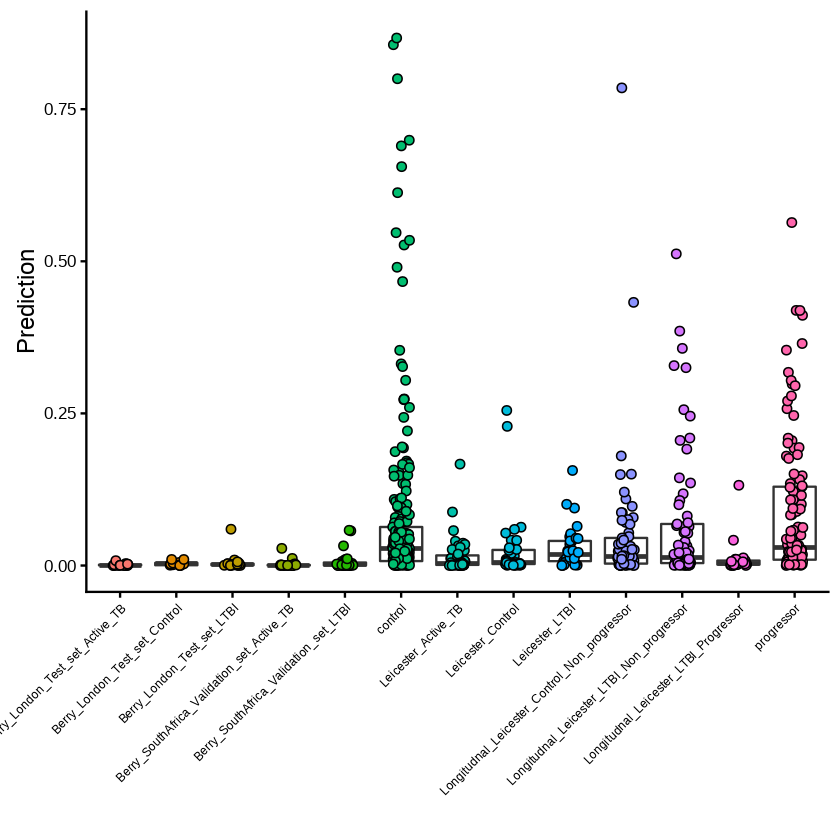

In [167]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(All.pheno.bar, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

##### Second boxplot only - key thoughts here for modifying my results text and presentation

- I think this graph clearly begins to show that we could evaluate a time since infection signature by how well during longitudinal sampling it allows discrimination of progressors vs. controls, and recent contacts with LTBI vs. recent contact controls.

- I can also describe discrimination of adolescents and recent contacts sampled longitudinally from all other groups.

- Interesting that LTBI nonprogressors recent contacts and adolescent progressors are indistinguishable in these distributions.

- So my contribution could be in proposing a framework of how to evaluate such signatures, more than the present signature itself. I can't rule out batch effects that I cannot control for across studies, 

- I have to say that this is all post-hoc on interpretation, and that future studies are really needed to validate. I'm just contributing how you could evaluate such a signature.

- Really the two key comparisons should be LTBI non progressor and adolescent progressor vs. control non progressor and adolescent control. This controls for longitudinal sampling. And then these two groups vs. all groups could be helpful. Any test could be evaluated with longitudinal sampling. Obviously, the best test will need less frequent sampling.

- If not a main figure, a graph like this DEFINITELY needs to be in the supplementary figure.

- I definitely see a thressholding effect on the previous results. Too high a threshold and the adolescent controls have the highest, albeit small, percent positives. BUT I CAN CHOOSE A THRESHOLD THAT GETS HALF OF THE LTBI RECENT CONTACTS, LESS THAN HALF OF THE ADOLESCENT PROGRESSORS, A FEW OF THE CONTROL PROGRESSORS, AND A FEW OF THE ADOLESCENT CONTROLS. SO YES, THERE IS A THRESSHOLD THAT COMPLETELY REPLICATES MY PREVIOUS RESULTS AND ACTUALLY GIVES FURTHER SUPPORT TO THIS ASSOCIATING WITH DISEASE RISK TO A SMALL DEGREE. 

- THIS WAS THE CORRECT GRAPH TO MAKE FOR ME. EVERYTHING I SAID BEFORE IS HOLDING UP, I just need to be less definitive in my claims.

- I still should observe the prediction scores for doing things separately, to see how things fared. BUT I IMAGINE IT WILL BE VERY SIMILAR.

- THEN THERE IS STILL INDPEENENT BENEFIT TO GOING TO FEWER GENES, But I don't think it will really help in the interpretation, calibration, etc.

In [187]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

ACS.pheno.subj = ACS.pheno
Garra.pheno.subj = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
ACS.pheno.subj$patient_id = as.factor(extract_id(ACS.pheno$title))
ACS.pheno.subj = ACS.pheno.subj[!is.na(ACS.pheno.subj$patient_id),]
ACS.exprs.subj = t(ACS.exprs.log[,colnames(ACS.exprs.log) %in% rownames(ACS.pheno.subj)])
Garra.exprs.subj = t(Garra.exprs.log[,colnames(Garra.exprs.log) %in% rownames(Garra.pheno.subj)])
pred.ACS.test.prob = predict(human.expose.Sul.all.model, newdata = ACS.exprs.subj[, colnames(ACS.exprs.subj) %in% c(opt.Sul.all.vars)], type="prob")
pred.Garra.test.prob = predict(human.expose.Sul.all.model, newdata = Garra.exprs.subj[, colnames(Garra.exprs.subj) %in% c(opt.Sul.all.vars)], type="prob")
ACS.pheno.subj$disease = ACS.pheno.subj$group
Garra.pheno.subj$disease = Garra.pheno.subj$source_name_ch1

All.pheno.subj = data.frame(disease=c(as.character(Garra.pheno.subj$disease), as.character(ACS.pheno.subj$disease)),
                           patient_id = c(as.character(Garra.pheno.subj$patient_id), as.character(ACS.pheno.subj$patient_id)))
late.pred = c(pred.Garra.test.prob$late,pred.ACS.test.prob$late)
All.test.subj.max = tapply(late.pred, All.pheno.subj$patient_id, max)

All.pheno.subj.max = All.pheno.subj[!duplicated(All.pheno.subj[,c('patient_id')]),]#All.pheno.subj[All.pheno.subj$patient_id %in% names(ACS.test.subj.max),]
All.test.subj.tab =data.frame(patient_id=names(All.test.subj.max), late.pred=All.test.subj.max)
ACS.pred.tab = merge(All.pheno.subj.max, All.test.subj.tab, by.y="patient_id")

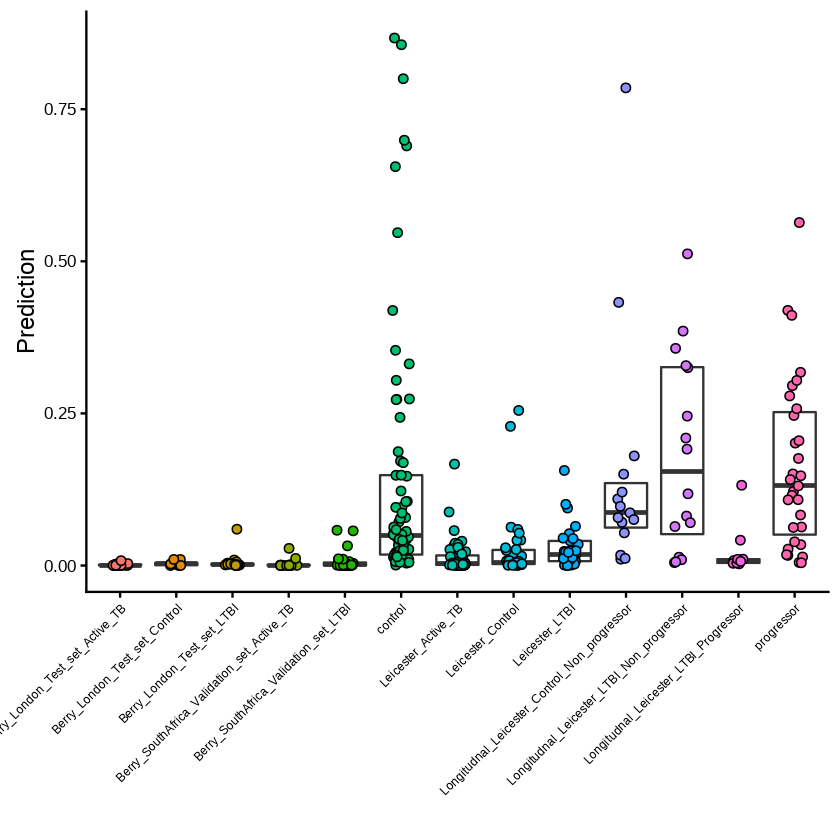

In [189]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(ACS.pred.tab, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

#### Repeat the graphs of Figures 4A-F using the model and co-normalization here

##### Use GC6-74 0 vs 6 months post-exposure model to predict time since exposure in the Singhania et al cohorts and ACS cohort

In [137]:
pred.ACS.expose = predict(human.expose.Sul.all.model, newdata = t(ACS.exprs.log)[, rownames(ACS.exprs.log) %in% c(opt.Sul.all.vars)])
       
# Proportion of progressor samples with a late time point prediction
prop.ACS.prog.late = sum(pred.ACS.expose == "late" & ACS.pheno$group == "progressor") / sum(ACS.pheno$group == "progressor")
prop.ACS.prog.late     

# Proportion of control samples with a late time point prediction
prop.ACS.ctrl.late = sum(pred.ACS.expose == "late" & ACS.pheno$group == "control") / sum(ACS.pheno$group == "control")
prop.ACS.ctrl.late

[1] 0.009090909

[1] 0.04081633

In [138]:
pred.Garra.expose = predict(human.expose.Sul.all.model, newdata = t(Garra.exprs.log)[, rownames(Garra.exprs.log) %in% c(opt.Sul.all.vars)])
Garra.pheno$time.pred = pred.Garra.expose

table(Garra.pheno$time.pred, Garra.pheno$source_name_ch1)

Garra.pheno.contact = Garra.pheno[Garra.pheno$source_name_ch1 %in% c("Longitudnal_Leicester_Control_Non_progressor", 
                                                                     "Longitudnal_Leicester_LTBI_Non_progressor"),]
Garra.pheno.contact.ctrl = Garra.pheno[Garra.pheno$source_name_ch1 == "Longitudnal_Leicester_Control_Non_progressor",]
Garra.pheno.contact.ltbi = Garra.pheno[Garra.pheno$source_name_ch1 == "Longitudnal_Leicester_LTBI_Non_progressor",]

Garra.pheno.contact.ltbi.pos = dplyr::filter(Garra.pheno.contact.ltbi, patient_id %in% dplyr::filter(Garra.pheno.contact.ltbi, time.pred == "late")$patient_id)
Garra.pheno.contact.ctrl.pos = dplyr::filter(Garra.pheno.contact.ctrl, patient_id %in% dplyr::filter(Garra.pheno.contact.ctrl, time.pred == "late")$patient_id)

ratio.UK.ctrl = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Berry_London_Test_set_Control", time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Berry_London_Test_set_Control" ))[1]
ratio.UK.SA.ltbi = dim(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Berry_London_Test_set_LTBI", "Berry_SouthAfrica_Validation_set_LTBI"), time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_LTBI", "Berry_SouthAfrica_Validation_set_LTBI") ))[1]
ratio.UK.SA.Leicester.activeTB = dim(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Berry_London_Test_set_Active_TB", "Berry_SouthAfrica_Validation_set_Active_TB", "Leicester_Active_TB"), time.pred == "late" ))[1] /
    dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_Active_TB", "Berry_SouthAfrica_Validation_set_Active_TB", "Leicester_Active_TB") ))[1]
ratio.Leicester.progTB = dim(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Progressor"), time.pred == "late" ))[1] /
    dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Longitudnal_Leicester_LTBI_Progressor") ))[1]

long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)
ratio.Leicester.ctrl = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_Control", !(patient_id %in% long.subj), time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_Control", !(patient_id %in% long.subj),  ))[1]
ratio.Leicester.ltbi = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_LTBI", !(patient_id %in% long.subj), time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_LTBI", !(patient_id %in% long.subj),  ))[1]
ratio.Leicester.long.ctrl = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor", time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor" ))[1]
ratio.Leicester.long.ltbi = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1]


       
        Berry_London_Test_set_Active_TB Berry_London_Test_set_Control
  early                              21                            12
  late                                0                             0
       
        Berry_London_Test_set_LTBI Berry_SouthAfrica_Validation_set_Active_TB
  early                         21                                         16
  late                           0                                          0
       
        Berry_SouthAfrica_Validation_set_LTBI Leicester_Active_TB
  early                                    31                  53
  late                                      0                   0
       
        Leicester_Control Leicester_LTBI
  early                49             48
  late                  1              1
       
        Longitudnal_Leicester_Control_Non_progressor
  early                                           68
  late                                             1
       
        Longitudnal_Leiceste

In [139]:
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Berry_London_Test_set_Control" ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_LTBI", "Berry_SouthAfrica_Validation_set_LTBI") ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_Active_TB", "Berry_SouthAfrica_Validation_set_Active_TB", "Leicester_Active_TB") ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Longitudnal_Leicester_LTBI_Progressor") ))[1]

dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_Control", !(patient_id %in% long.subj),  ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_LTBI", !(patient_id %in% long.subj),  ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor" ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1]

dim(Garra.pheno)

[1] 12

[1] 52

[1] 90

[1] 23

[1] 35

[1] 33

[1] 69

[1] 69

[1] 414  16

In [140]:
ratio.UK.ctrl
ratio.UK.SA.ltbi
ratio.UK.SA.Leicester.activeTB
ratio.Leicester.progTB
ratio.Leicester.ctrl
ratio.Leicester.ltbi
ratio.Leicester.long.ctrl 
ratio.Leicester.long.ltbi 

[1] 0

[1] 0

[1] 0

[1] 0

[1] 0

[1] 0

[1] 0.01449275

[1] 0.01449275

In [141]:
cohort = factor(c(
                     "Uninfected Control\n(London)", "LTBI\n(London, South Africa)",
                    "Active TB\n(London, South Africa, Leicester)", "TB Progressor\n(Leicester)",
                    "IGRA- contact\n(Leicester, baseline only)", "IGRA+ contact\n(Leicester, baseline only)",
                    "IGRA- longitudinal contact\n(Leicester)", "IGRA+ longitudinal contact\n(Leicester)", "LTBI nonprogressor\n(ACS)",
                 "LTBI Progressor\n(ACS)") ,
               ordered=TRUE,
               levels = c(
                     "Uninfected Control\n(London)", "LTBI\n(London, South Africa)",
                    "Active TB\n(London, South Africa, Leicester)", "TB Progressor\n(Leicester)",
                    "IGRA- contact\n(Leicester, baseline only)", "IGRA+ contact\n(Leicester, baseline only)",
                    "IGRA- longitudinal contact\n(Leicester)", "IGRA+ longitudinal contact\n(Leicester)", "LTBI nonprogressor\n(ACS)",
                 "LTBI Progressor\n(ACS)" ))

prop.6mo = c( ratio.UK.ctrl, ratio.UK.SA.ltbi, ratio.UK.SA.Leicester.activeTB,
             ratio.Leicester.progTB, ratio.Leicester.ctrl, ratio.Leicester.ltbi, ratio.Leicester.long.ctrl ,
             ratio.Leicester.long.ltbi, prop.ACS.ctrl.late, prop.ACS.prog.late )

recent.contact.validation = data.frame(cohort=cohort, prop = prop.6mo)

##### Figure 4A

In [142]:
fisher.ltbi.ctrl = fisher.test(matrix(c(dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                     dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor", time.pred == "late" ))[1]),
                     
                   nrow=2))
fisher.ltbi.ctrl
fisher.ltbi.ACS.ctrl = fisher.test(matrix(c(dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                     sum(pred.ACS.expose == "late" & ACS.pheno$group == "control"),
                   sum(ACS.pheno$group == "control") - sum(pred.ACS.expose == "late" & ACS.pheno$group == "control")),
                                            nrow=2))
fisher.ltbi.ACS.ctrl    

fisher.ltbi.ACS.prog = fisher.test(matrix(c(dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                     sum(pred.ACS.expose == "late" & ACS.pheno$group == "progressor"),
                   sum(ACS.pheno$group == "progressor") - sum(pred.ACS.expose == "late" & ACS.pheno$group == "progressor")),
                                            nrow=2))
fisher.ltbi.ACS.prog



	Fisher's Exact Test for Count Data

data:  
p-value = 1
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
  0.01256451 79.58925490
sample estimates:
odds ratio 
         1 



	Fisher's Exact Test for Count Data

data:  
p-value = 0.4666
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 0.007853252 2.513239137
sample estimates:
odds ratio 
 0.3464354 



	Fisher's Exact Test for Count Data

data:  
p-value = 1
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
   0.02012733 126.83650312
sample estimates:
odds ratio 
  1.598508 


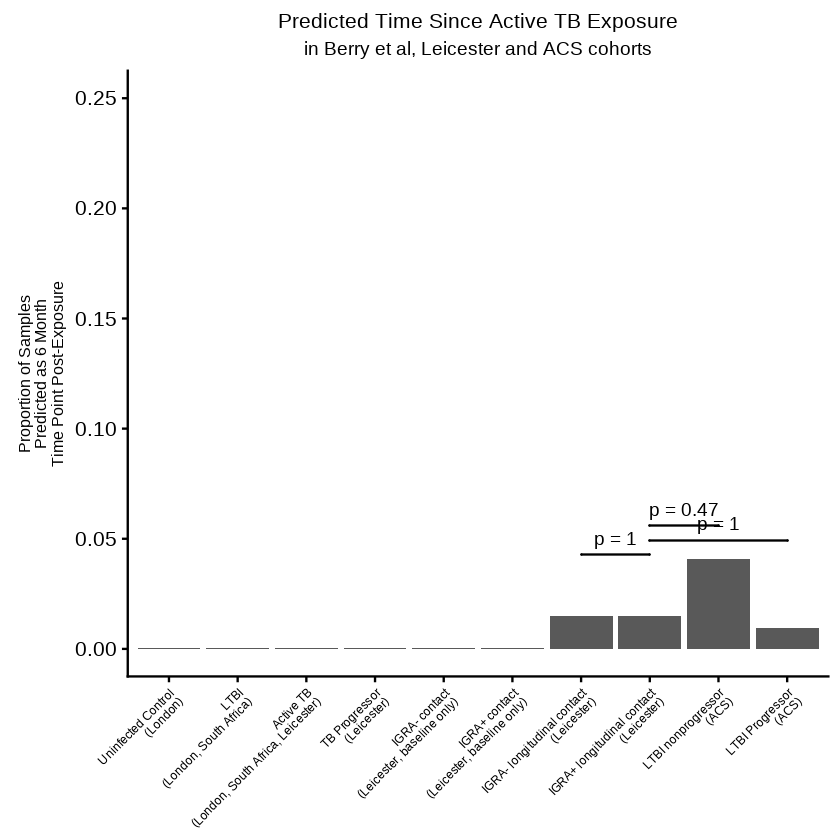

In [143]:
validate.recent.exposure.plot = ggplot(recent.contact.validation, aes(x=cohort, y=prop)) + geom_bar(stat="identity")  +
    labs(y="Proportion of Samples\nPredicted as 6 Month\nTime Point Post-Exposure") +
ggtitle("Predicted Time Since Active TB Exposure", subtitle="in Berry et al, Leicester and ACS cohorts") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                          plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) +
theme(axis.text.x=element_text(angle=45, hjust=1, size = 7)) +
#scale_y_continuous(breaks=c(0.00, 0.1, 0.2, 0.3, 0.4, 0.50, 1.0)) +
theme(axis.title.x=element_blank(),
     axis.title.y = element_text(size=9)) + 
geom_signif(comparisons=list(c("IGRA- longitudinal contact\n(Leicester)", "IGRA+ longitudinal contact\n(Leicester)"),
                             c("IGRA+ longitudinal contact\n(Leicester)", "LTBI Progressor\n(ACS)"),
                             c("IGRA+ longitudinal contact\n(Leicester)", "LTBI nonprogressor\n(ACS)")
                             ),
                               
              annotations = paste("p =", c(signif(fisher.ltbi.ctrl$p.value, 2),
                                           signif(fisher.ltbi.ACS.prog$p.value, 2),
                                           signif(fisher.ltbi.ACS.ctrl$p.value, 2) 
                                           )),# vjust=-0.4, #step_increase = 0.3, vjust = 0.4, tip_length = 0.015, textsize=3.5) 
             step_increase=0.16, tip_length=0, vjust=-0.3) +
ylim(0.0, 0.25)#, y_position=1.075)

validate.recent.exposure.plot

##### Figure 4B

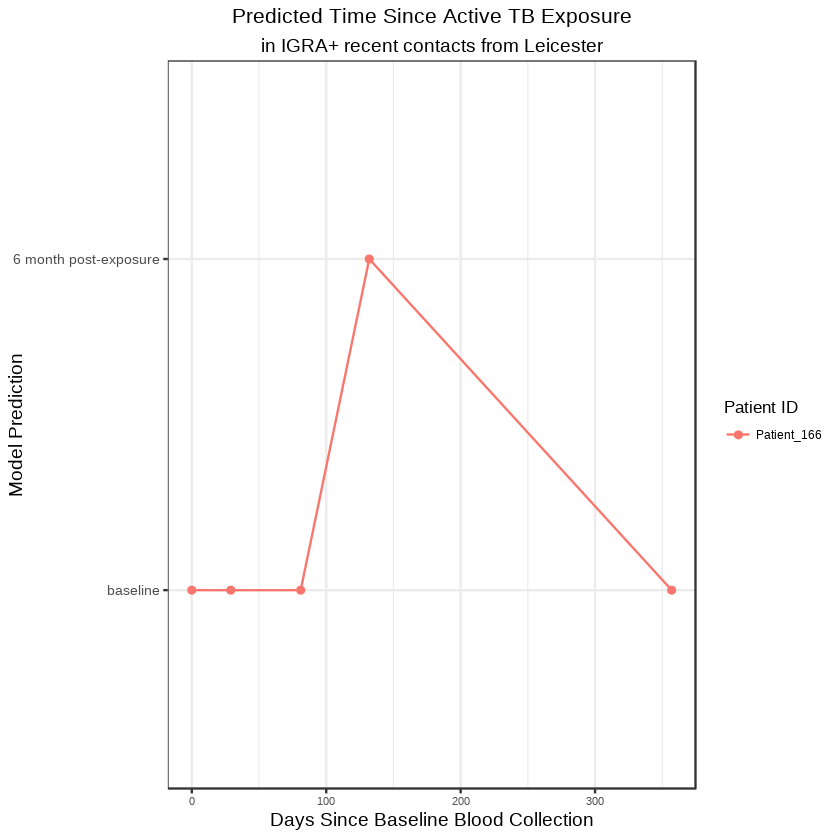

In [144]:
Garra.pheno.contact.ltbi.pos$time.pred.renamed = factor(ifelse(Garra.pheno.contact.ltbi.pos$time.pred == "early", 
                                                               "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure")) 

pred.time.plot.pos = ggplot(Garra.pheno.contact.ltbi.pos, aes(time.since.exposure.days, time.pred.renamed, col=patient_id)) +
geom_point() +
    geom_line(aes(time.since.exposure.days, time.pred.renamed, group=patient_id)) +
    theme_bw() +
labs(x="Days Since Baseline Blood Collection", y="Model Prediction") + labs(color='Patient ID') + facet_wrap(~patient_id, ncol=2) + theme(
  strip.text.x = element_blank(), strip.text.y = element_blank(), strip.background = element_blank()
  
) + ggtitle("Predicted Time Since Active TB Exposure", subtitle="in IGRA+ recent contacts from Leicester") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                          plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) +    # +

theme(axis.text.y = element_text(size=8),
      axis.text.x = element_text(size=6),
     legend.title = element_text(size=10),
     legend.text = element_text(size=7))

pred.time.plot.pos

##### Figure 4C

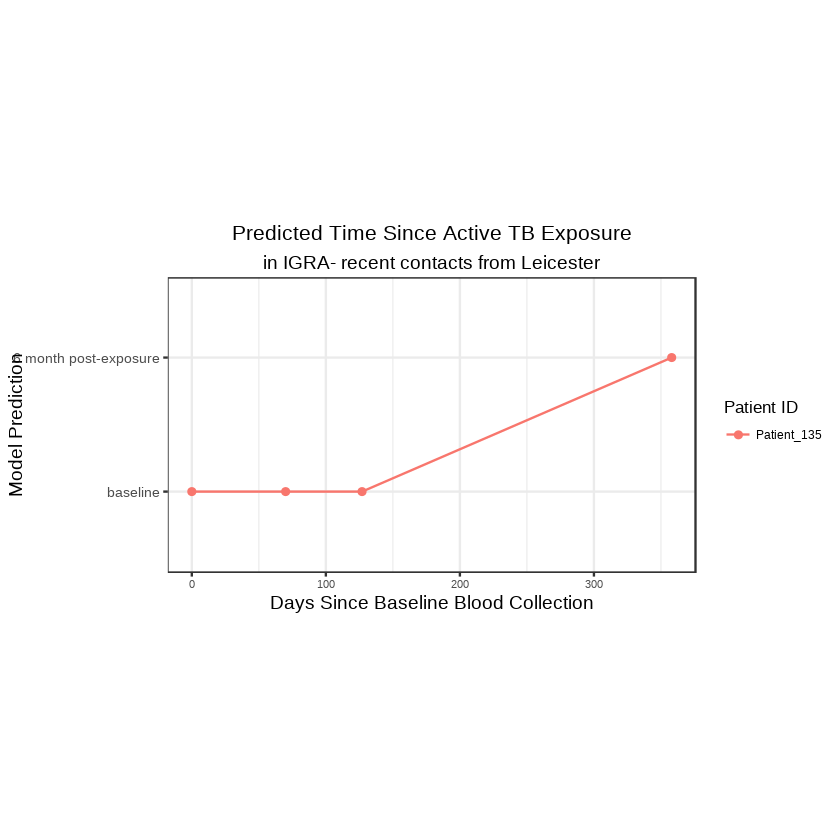

In [145]:
Garra.pheno.contact.ctrl.pos$time.pred.renamed = factor(ifelse(Garra.pheno.contact.ctrl.pos$time.pred == "early", 
                                                               "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure"))

pred.time.plot.pos.ctrl = ggplot(Garra.pheno.contact.ctrl.pos, aes(time.since.exposure.days, time.pred.renamed, col=patient_id)) +
geom_point() +
    geom_line(aes(time.since.exposure.days, time.pred.renamed, group=patient_id)) +
    theme_bw() +
labs(x="Days Since Baseline Blood Collection", y="Model Prediction") + labs(color='Patient ID') + facet_wrap(~patient_id, ncol=2) + theme(
  strip.text.x = element_blank(), strip.text.y = element_blank(), strip.background = element_blank()
  
) + ggtitle("Predicted Time Since Active TB Exposure", subtitle="in IGRA- recent contacts from Leicester") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                          plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) + #+
coord_fixed(ratio = 100) +
theme(axis.text.y = element_text(size=8),
      axis.text.x = element_text(size=6),
     legend.title = element_text(size=10),
     legend.text = element_text(size=7))


pred.time.plot.pos.ctrl 

##### Figure 4D

Warning message:
“Removed 15 rows containing missing values (geom_point).”

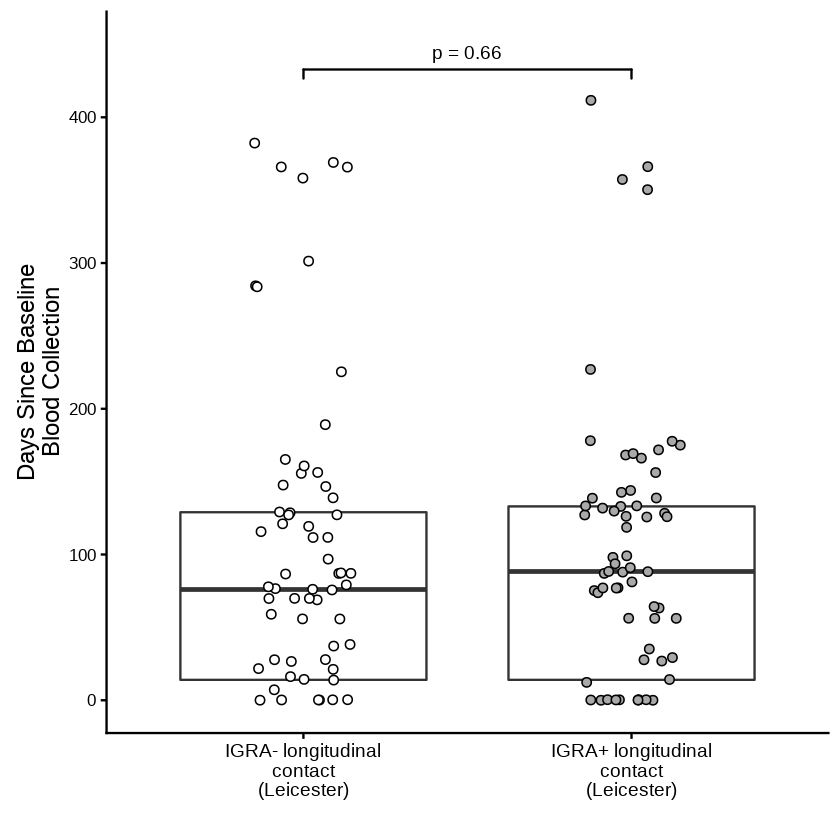

In [146]:
Garra.pheno.contact.gg = droplevels(Garra.pheno.contact )
Garra.pheno.contact.gg$source_name_ch1 = factor(ifelse(Garra.pheno.contact.gg$source_name_ch1 == "Longitudnal_Leicester_Control_Non_progressor",
                                                       "IGRA- longitudinal\ncontact\n(Leicester)", "IGRA+ longitudinal\ncontact\n(Leicester)"),
                                                ordered=TRUE,
                                                        levels = c("IGRA- longitudinal\ncontact\n(Leicester)", "IGRA+ longitudinal\ncontact\n(Leicester)"))
G.pheno.contact.wilc.ltbi.ctrl = wilcox.test(time.since.exposure.days~source_name_ch1,Garra.pheno.contact.gg )

theme.days = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=source_name_ch1), position=position_jitter(0.15), shape=21, size=2),
                 scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Days Since Baseline\nBlood Collection", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

ltbi.ctrl.Leicester.sampling = ggplot(Garra.pheno.contact.gg, aes(x=source_name_ch1, y=time.since.exposure.days)) + theme.days + 
                geom_signif(comparison = list(c("IGRA- longitudinal\ncontact\n(Leicester)", 
                                                                                "IGRA+ longitudinal\ncontact\n(Leicester)")), 
                                                            annotations = c(paste("p =", signif(G.pheno.contact.wilc.ltbi.ctrl$p.value, 2))),
                                                            tip_length=0.015, vjust=-0.3, ) +
ylim(0, 450) + theme(axis.text.x = element_text(size=11))
ltbi.ctrl.Leicester.sampling   


In [40]:
sum(Garra.pheno.contact.gg$source_name_ch1 == "IGRA- longitudinal\ncontact\n(Leicester)" & 
    Garra.pheno.contact.gg$time.since.exposure.days >= 0)
sum(Garra.pheno.contact.gg$source_name_ch1 == "IGRA+ longitudinal\ncontact\n(Leicester)" & 
    Garra.pheno.contact.gg$time.since.exposure.days >= 0)

[1] 69

[1] 69

##### Figure 4E

Warning message in wilcox.test.default(x = c(0, 14, 28, 63, 128, 168, 412, 0, 56, :
“cannot compute exact p-value with ties”Warning message:
“Removed 9 rows containing missing values (geom_point).”

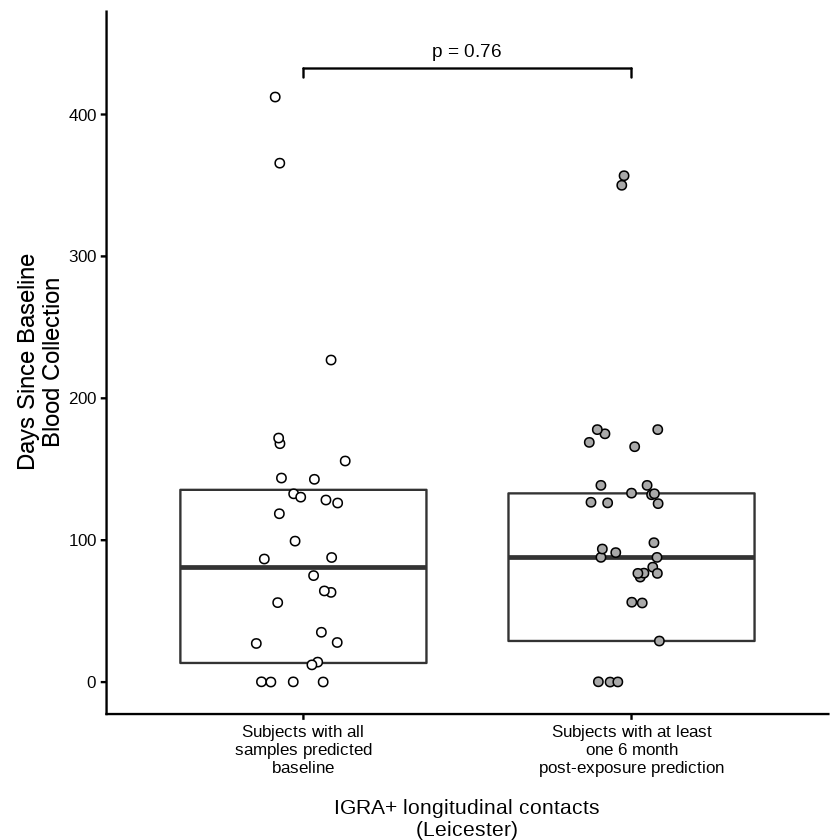

In [41]:
Garra.pheno.contact.ltbi.wpredf = Garra.pheno.contact.ltbi
Garra.pheno.contact.ltbi.wpredf$has6mo = as.factor(ifelse(Garra.pheno.contact.ltbi.wpredf$patient_id %in%
                                                dplyr::filter(Garra.pheno.contact.ltbi, time.pred == "late")$patient_id,
                                               "Subjects with at least\none 6 month\npost-exposure prediction", "Subjects with all\nsamples predicted\nbaseline"))

theme.days.ltbi = theme.days
theme.days.ltbi[2] = list(geom_jitter(aes(fill=has6mo), position=position_jitter(0.15), shape=21, size=2))

wil.ltbi.wpredf = wilcox.test(time.since.exposure.days~has6mo, Garra.pheno.contact.ltbi.wpredf)
ltbi.pos.Leicester.sampling   = ggplot(Garra.pheno.contact.ltbi.wpredf, aes(x=has6mo, y=time.since.exposure.days))  +
theme.days.ltbi +
 
    geom_signif(comparison = list(c("Subjects with at least\none 6 month\npost-exposure prediction", "Subjects with all\nsamples predicted\nbaseline")), 
                                                             annotations = c(paste("p =", signif(wil.ltbi.wpredf$p.value, 2))),
                                                            tip_length=0.015, vjust=-0.3, ) + 
labs(x="IGRA+ longitudinal contacts\n(Leicester)") + theme(axis.title.x = element_text(vjust=-2.5)) +
ylim(0, 450) + theme(axis.text.x = element_text(size=10),
                    axis.title.x = element_text(size=12))

ltbi.pos.Leicester.sampling

In [42]:
sum(Garra.pheno.contact.ltbi.wpredf$has6mo == "Subjects with at least\none 6 month\npost-exposure prediction" & 
    Garra.pheno.contact.ltbi.wpredf$time.since.exposure.days >= 0)
sum(Garra.pheno.contact.ltbi.wpredf$has6mo == "Subjects with all\nsamples predicted\nbaseline" & 
    Garra.pheno.contact.ltbi.wpredf$time.since.exposure.days >= 0)

[1] 37

[1] 32

##### Figure 4F

###### Load Meta-analysis libraries

In [71]:
if (!require("metafor")) {
  install.packages("metafor")
  library("metafor")
}

if (!require("epiR")) {
  install.packages("epiR")
  library("epiR")
}

Loading required package: metafor
Loading 'metafor' package (version 2.0-0). For an overview 
and introduction to the package please type: help(metafor).
Loading required package: epiR
Package epiR 0.9-93 is loaded
Type help(epi.about) for summary information




###### Use GC6-74 0 vs 6 months post-exposure model (from Figure 3C) to predict time since exposure in Ethiopia and Gambia test set

In [76]:
table(human.pheno$site)


AHRI  MRC  SUN 
  48  169  198 

In [72]:
human.pheno.test.all = human.pheno

table(human.pheno.test.all$dataset)

human.pheno.test.all$status = ifelse(human.pheno.test.all$group == "Control", "control", "progressor")
human.pheno.test.all$dataset = as.character(human.pheno.test.all$dataset)
human.pheno.test.all$subjectid = as.character(human.pheno.test.all$subjectid)

for (row in 1:dim(human.pheno.test.all)[1]) {
    if (as.character(human.pheno.test.all[row, "subjectid"]) %in% as.character(human.pheno.6mo$subjectid)) {
        
        human.pheno.test.all[row, "dataset"] = as.character(unique(dplyr::filter(human.pheno.6mo, 
                                                                    subjectid ==human.pheno.test.all[row, "subjectid"])$dataset))
    }
        
}
table(human.pheno.test.all$dataset)
        
human.pheno.test.all$dataset = as.factor(human.pheno.test.all$dataset)
human.pheno.test.all$subjectid = as.factor(human.pheno.test.all$subjectid)

human.pheno.test.all = droplevels(dplyr::filter(human.pheno.test.all,site %in% c("AHRI", "MRC"), dataset == "Test" ))
human.exprs.test.all = t(human.exprs.log[, colnames(human.exprs.log) %in% human.pheno.test.all$code])

dim(human.pheno.test.all)
dim(human.exprs.test.all)


    Test Training 
     182      233 


    Test Training 
     161      254 

[1] 90 10

[1]    90 14842

In [73]:
pred.all.test = predict(human.exposure.model, newdata = human.exprs.test.all[, colnames(human.exprs.test.all) %in% c(optvars)])


table(pred.all.test)

human.pheno.test.all$time.pred = factor(ifelse(pred.all.test == "early", "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure"))
 

table(human.pheno.test.all$status)

human.pheno.test.all.ctrl = droplevels(dplyr::filter(human.pheno.test.all, status == "control"))
human.pheno.test.all.prog = droplevels(dplyr::filter(human.pheno.test.all, status != "control"))

pred.all.test
early  late 
   48    42 


   control progressor 
        70         20 

###### Use GC6-74 0 vs 6 months post-exposure model (from Figure 3C) to predict time since exposure in untouched South Africa dataset (from GC6-74 cohort)

In [74]:
human.pheno.test.SUN = human.pheno

table(human.pheno.test.SUN$dataset)

human.pheno.test.SUN$status = ifelse(human.pheno.test.SUN$group == "Control", "control", "progressor")
human.pheno.test.SUN$dataset = as.character(human.pheno.test.SUN$dataset)
human.pheno.test.SUN$subjectid = as.character(human.pheno.test.SUN$subjectid)

for (row in 1:dim(human.pheno.test.SUN)[1]) {
    if (as.character(human.pheno.test.SUN[row, "subjectid"]) %in% as.character(human.pheno.6mo$subjectid)) {
        
        human.pheno.test.SUN[row, "dataset"] = as.character(unique(dplyr::filter(human.pheno.6mo, 
                                                                    subjectid ==human.pheno.test.SUN[row, "subjectid"])$dataset))
    }
        
}
table(human.pheno.test.SUN$dataset)
        
human.pheno.test.SUN$dataset = as.factor(human.pheno.test.SUN$dataset)
human.pheno.test.SUN$subjectid = as.factor(human.pheno.test.SUN$subjectid)

human.pheno.test.SUN = droplevels(dplyr::filter(human.pheno.test.SUN,!(site %in% c("AHRI", "MRC"))))
human.exprs.test.SUN = t(human.exprs.log[, colnames(human.exprs.log) %in% human.pheno.test.SUN$code])

dim(human.pheno.test.SUN)
dim(human.exprs.test.SUN)


    Test Training 
     182      233 


    Test Training 
     161      254 

[1] 198  10

[1]   198 14842

In [75]:
pred.SUN.test = predict(human.exposure.model, newdata = human.exprs.test.SUN[, colnames(human.exprs.test.SUN) %in% c(optvars)])


table(pred.SUN.test)

human.pheno.test.SUN$time.pred = factor(ifelse(pred.SUN.test == "early", "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure"))
 

table(human.pheno.test.SUN$status)

human.pheno.test.SUN.ctrl = droplevels(dplyr::filter(human.pheno.test.SUN, status == "control"))
human.pheno.test.SUN.prog = droplevels(dplyr::filter(human.pheno.test.SUN, status != "control"))

pred.SUN.test
early  late 
  168    30 


   control progressor 
       155         43 

###### Perform Meta-analysis to generate Forest plot of Figure 4F

In [84]:
prog.6mo.Eth.Gam = sum(tapply(human.pheno.test.all.prog$time.pred, human.pheno.test.all.prog$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
prog.Eth.Gam.subj = length(unique(human.pheno.test.all.prog$subjectid))
prog.6mo.Eth.Gam
prog.Eth.Gam.subj
7 / 11

ctrl.6mo.Eth.Gam = sum(tapply(human.pheno.test.all.ctrl$time.pred, human.pheno.test.all.ctrl$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
ctrl.Eth.Gam.subj = length(unique(human.pheno.test.all.ctrl$subjectid))
ctrl.6mo.Eth.Gam
ctrl.Eth.Gam.subj
26 / 51


[1] 7

[1] 11

[1] 0.6363636

[1] 26

[1] 51

[1] 0.5098039

In [85]:
prog.6mo.SUN = sum(tapply(human.pheno.test.SUN.prog$time.pred, human.pheno.test.SUN.prog$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
prog.6mo.SUN
prog.SUN.subj = length(unique(human.pheno.test.SUN.prog$subjectid))
prog.SUN.subj

9 / 39

ctrl.6mo.SUN = sum(tapply(human.pheno.test.SUN.ctrl$time.pred, human.pheno.test.SUN.ctrl$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
ctrl.6mo.SUN
ctrl.SUN.subj = length(unique(human.pheno.test.SUN.ctrl$subjectid))
ctrl.SUN.subj
20 / 141


[1] 9

[1] 39

[1] 0.2307692

[1] 20

[1] 141

[1] 0.141844

In [86]:
data.meta = data.frame(study=c("Sun","Eth.Gam"), 
                       prog.6mo = c(prog.6mo.SUN, prog.6mo.Eth.Gam), 
                       prog.base = c(prog.SUN.subj-prog.6mo.SUN, 
                                     prog.Eth.Gam.subj-prog.6mo.Eth.Gam),
                      ctrl.6mo = c(ctrl.6mo.SUN, ctrl.6mo.Eth.Gam), 
                       ctrl.base = c(ctrl.SUN.subj-ctrl.6mo.SUN,
                                     ctrl.Eth.Gam.subj-ctrl.6mo.Eth.Gam))
data.meta
dat1 = escalc(measure="OR", ai=prog.6mo, bi=prog.base, ci=ctrl.6mo, di=ctrl.base, data=data.meta)
dat1
res1 = rma(yi, vi, data=dat1,slab=c("South Africa\n(all subjects)", "Gambia and Ethiopia\n(test set)"))
res1
predict(res1, transf=exp, digits=2)

study,prog.6mo,prog.base,ctrl.6mo,ctrl.base
Sun,9,30,20,121
Eth.Gam,7,4,26,25


study,prog.6mo,prog.base,ctrl.6mo,ctrl.base,yi,vi
Sun,9,30,20,121,0.5960855,0.2027089
Eth.Gam,7,4,26,25,0.5203951,0.4713187



Random-Effects Model (k = 2; tau^2 estimator: REML)

tau^2 (estimated amount of total heterogeneity): 0 (SE = 0.4766)
tau (square root of estimated tau^2 value):      0
I^2 (total heterogeneity / total variability):   0.00%
H^2 (total variability / sampling variability):  1.00

Test for Heterogeneity: 
Q(df = 1) = 0.0085, p-val = 0.9265

Model Results:

estimate      se    zval    pval    ci.lb   ci.ub   
  0.5733  0.3765  1.5228  0.1278  -0.1646  1.3112   

---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


 pred ci.lb ci.ub cr.lb cr.ub
 1.77  0.85  3.71  0.85  3.71

One-sided p-value from epiR

In [94]:
epi.obj = epi.dsl(data.meta$prog.6mo, data.meta$prog.6mo + data.meta$prog.base,
                  data.meta$ctrl.6mo, data.meta$ctrl.6mo + data.meta$ctrl.base, data.meta$study, 
                  alternative=c("greater"))
print(epi.obj$effect['p.value'])
epi.obj

Warning message in sqrt((1/(2 * (k - 2))) * (1 - (1/(3 * (k - 2)^2)))):
“NaNs produced”

   p.value 
0.06390397 


$OR
       est     lower    upper
1 1.815000 0.7509974 4.386467
2 1.682692 0.4381595 6.462152

$OR.summary
       est     lower    upper
1 1.774151 0.8482438 3.710741

$weights
   inv.var      dsl
1 4.933182 4.933182
2 2.121707 2.121707

$heterogeneity
          Q          df     p.value 
0.008502213 1.000000000 0.926533222 

$Hsq
          est lower upper
1 0.008502213   NaN   NaN

$Isq
        est lower upper
1 -11661.64   NaN   NaN

$tau.sq
[1] 0

$effect
         z    p.value 
1.52280327 0.06390397

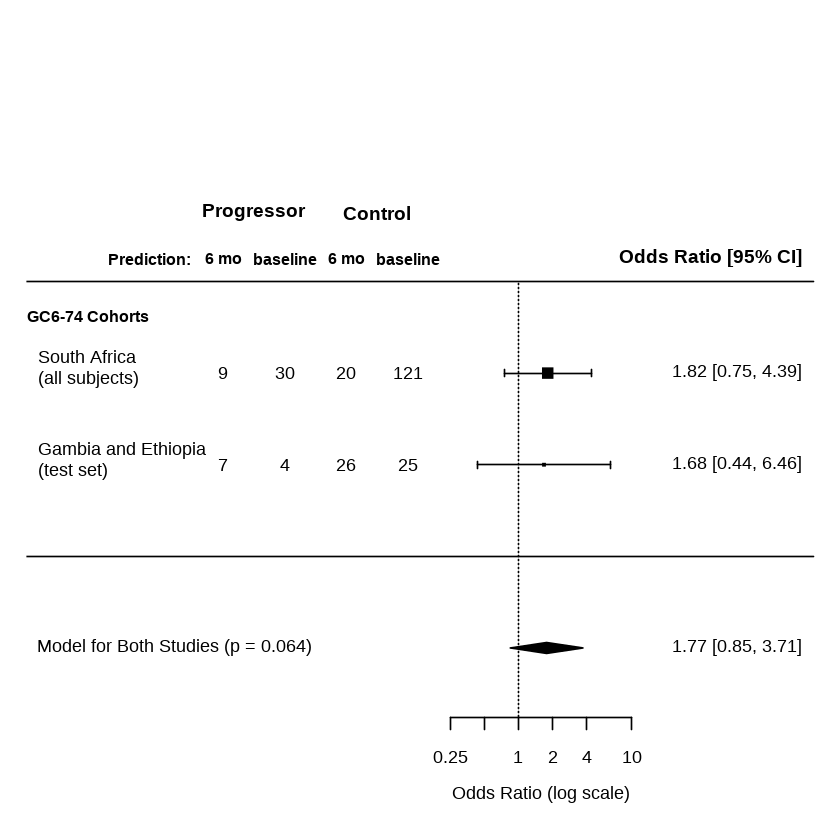

In [87]:
data.txt = 0.85
x.raw = c(-6,-4.75,-3.5,-2.25)
forest(res1,  xlim=c(-10, 6), atransf=exp, at=log(c(0.25, 0.5, 1, 2, 4, 10)),
      ilab = cbind(data.meta$prog.6mo, data.meta$prog.base, data.meta$ctrl.6mo, data.meta$ctrl.base),
      ilab.xpos=x.raw, cex=data.txt, mlab="")

op = par(cex=0.75, font=4)

par(font=2)
text(-8.75, 2.625, c("GC6-74 Cohorts"), cex=1.0)

pred.txt = 1.0
text(x.raw, 3.25, c("6 mo", "baseline", "6 mo", "baseline"), cex=pred.txt)
text(-7.5, 3.25, c("Prediction:"), cex=pred.txt)
text(c(mean(x.raw[1:2]),mean(x.raw[3:4])),     3.75, c("Progressor", "Control"), cex=1.25)

text(-9, )
text(6,                  3.25, "Odds Ratio [95% CI]", pos=2, cex=1.25)

par(op)

text(-7, -1.0 , cex=data.txt, bquote(paste("Model for Both Studies (p = ", 0.064, ")", sep="")))

### Test Validation of 6-gene signature in predicting TB risk in GC6-74 contacts and ACS cohorts

- Approach: Do maximum score prediction (as shown by Adolescent acquisition cohort and mouse cross-prediction to be the recent infection indicator) for individuals. See if this discriminates progressors from non-progressors

- Consider having a separate threshold for the Gambia/Ethiopia vs. South Africa. Definitely separate for ACS

I think now that I should take the 6 gene signature and do all validation with it. I don’t think I should do odds ratio for TB risk in the GC6-74 cohort because the threshold is arbitrary. I think I should do maximum prediction for all, since the score was highest at first known conversion in the adolescent acquisition cohort. Then I can do an AUC on progressors vs. non-rpogresors for the max prediction. I can do the same on the ACS study, and just keep it at that. If significant AUC, significant, if not, still present it but don’t try to do something else.

- RESULTS: If I take the min score for the ACS data, then I get significant (p = 0.01) discrimination with AUC 0.64. But this is against the current biological understanding of the score, and I pre-specified the max score as recent infection, based on the adolescent acquisition validation. SO, in this scenario of 6-month sampling in these 3 populations, there is no discrimination of the maximum score between progressors and controls. I think the simplest explanation is that it's not accurate enough for recent infection yet, together with 6-month sampling being too infrequent for this transcriptomic signature. Therefore, for this purpose, what I have is probably not useful yet.

#### Load all the data

In [ ]:
source("utils_submission.R")

In [295]:
source("utils_submission.R")

Sul.path = paste(path, "/data/GSE94438", sep="")
ACS.path = paste(path, "/data/GSE79362", sep="")

Sul.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

Sul.pheno = filter.human.pheno(pData(Sul.pheno.set))

ACS.pheno.set = getGEO(filename=paste(ACS.path, "GSE79362_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

ACS.pheno = filter.ACS.pheno(pData(ACS.pheno.set))

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.ACS.pheno(pData(ACS.pheno.set)):
“NAs introduced by coercion”

[1] "about to return new data frame"


In [296]:
# Common names for progressor
Sul.pheno$group = ifelse(Sul.pheno$group == "Control", "control", "progressor")
ACS.pheno$group = ifelse(ACS.pheno$group == "control (non-progressor)", "control", "progressor")

ACS.exprs = read.table(paste(ACS.path, "gene_count_GSE79362.tsv", sep="/"), header=T, row.names=1)
ACS.exprs = filter.HUMAN.exprs(ACS.exprs, ACS.pheno)
Sul.exprs = read.table(paste(Sul.path, "gene_count_GSE94438.tsv", sep="/"), header=T, row.names=1)
Sul.exprs = filter.HUMAN.exprs(Sul.exprs, Sul.pheno)

all.exprs = Sul.exprs

# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

Sul.exprs.log = exprs.log

all.exprs = ACS.exprs

# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

ACS.exprs.log = exprs.log

[1] "Identical column and rownames between exprs and pheno tables?"
[1] TRUE
[1] "Identical column and rownames between exprs and pheno tables?"
[1] TRUE


In [298]:
Sul.exprs.log = t(Sul.exprs.log)
ACS.exprs.log = t(ACS.exprs.log)

In [299]:
dim(Sul.exprs.log)
dim(ACS.exprs.log)

[1]   415 17617

[1]   355 17202

In [301]:
Sul.pheno.risk = Sul.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new Sul.pheno

AHRI.subj = unique(dplyr::filter(Sul.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
Sul.pheno.risk$dataset[Sul.pheno.risk$subjectid %in% AHRI.subj.train] = "Training"

In [312]:
Sul.pheno.risk.test = droplevels(Sul.pheno.risk[Sul.pheno.risk$site %in% c("AHRI", "MRC") & Sul.pheno.risk$dataset != "Training",])
Sul.exprs.log.test = Sul.exprs.log[rownames(Sul.exprs.log) %in% row.names(Sul.pheno.risk.test),]

In [313]:
Sul.pheno.risk.SUN = droplevels(Sul.pheno.risk[Sul.pheno.risk$site %in% c("SUN"),])
Sul.exprs.log.SUN = Sul.exprs.log[rownames(Sul.exprs.log) %in% row.names(Sul.pheno.risk.SUN),]

In [386]:
library(stringr)
ACS.pheno.subj = ACS.pheno
ACS.pheno.subj$subjectid = as.factor(extract_id(ACS.pheno$title))
ACS.pheno.subj = ACS.pheno.subj[!is.na(ACS.pheno.subj$subjectid),]
ACS.exprs.subj = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.subj),]
identical(rownames(ACS.exprs.subj), rownames(ACS.pheno.subj))

[1] TRUE

In [387]:
dim(Sul.pheno.risk.test)
dim(Sul.exprs.log.test)
dim(Sul.pheno.risk.SUN)
dim(Sul.exprs.log.SUN)
dim(ACS.pheno.subj)
dim(ACS.exprs.subj)

[1] 88  9

[1]    88 17617

[1] 198   9

[1]   198 17617

[1] 264  10

[1]   264 17202

#### Make the predictions, and max them by subject for AUC curve

In [388]:
test.scores = calculateScore(Sul.exprs.log.test, posGenes, negGenes)
SUN.scores = calculateScore(Sul.exprs.log.SUN, posGenes, negGenes)
ACS.scores = calculateScore(ACS.exprs.subj, posGenes, negGenes)

[1] "This is the AUC:"
Area under the curve: 0.6289
[1] "This is the AUC p-value:"
[1] 0.09510112
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4595-0.7984 (DeLong)


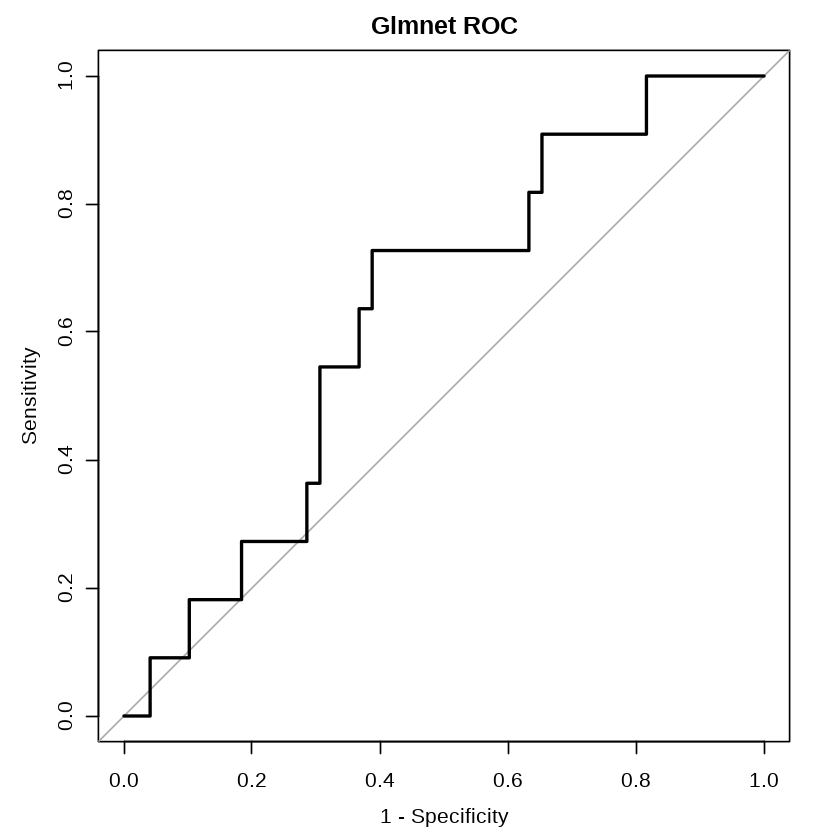

In [370]:
test.max = tapply(test.scores, Sul.pheno.risk.test$subjectid, max)

test.dis = Sul.pheno.risk.test[!duplicated(Sul.pheno.risk.test[,c('subjectid')]),]

test.dis = test.dis[match(names(test.max),test.dis$subjectid),]
test.dis$score = test.max

Sul.test.ROC.score <- my.roc(test.dis$score,
                        test.dis$group,
                     "progressor", title="Glmnet ROC")

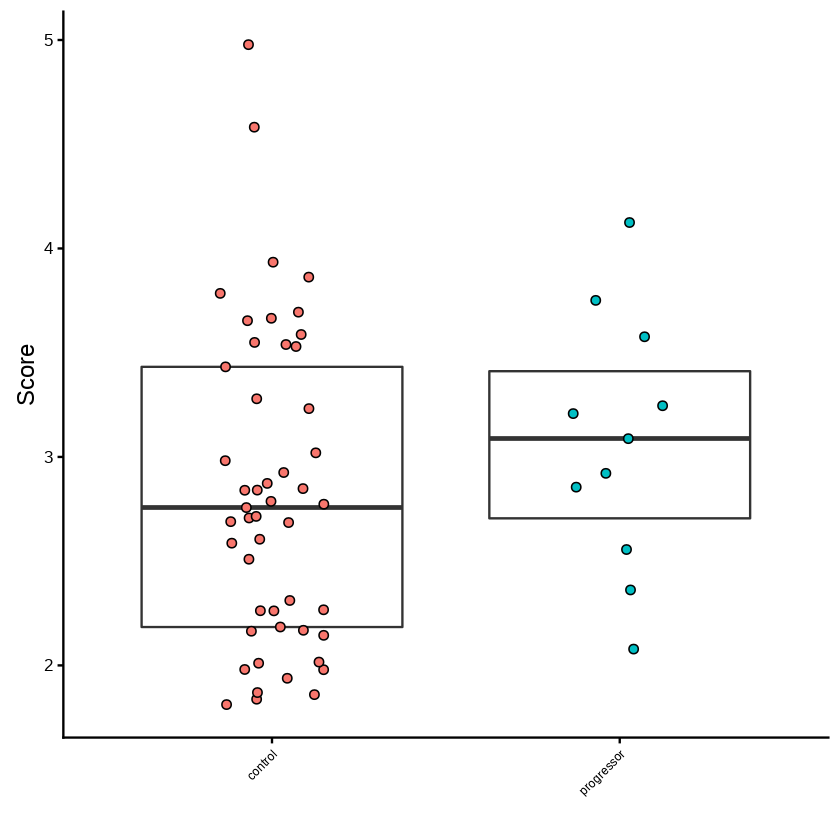

In [402]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=group ), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))


test.bar = ggplot(test.dis, aes(x=group , y=score)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
test.bar

[1] "This is the AUC:"
Area under the curve: 0.5135
[1] "This is the AUC p-value:"
[1] 0.6027293
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.3977-0.6294 (DeLong)


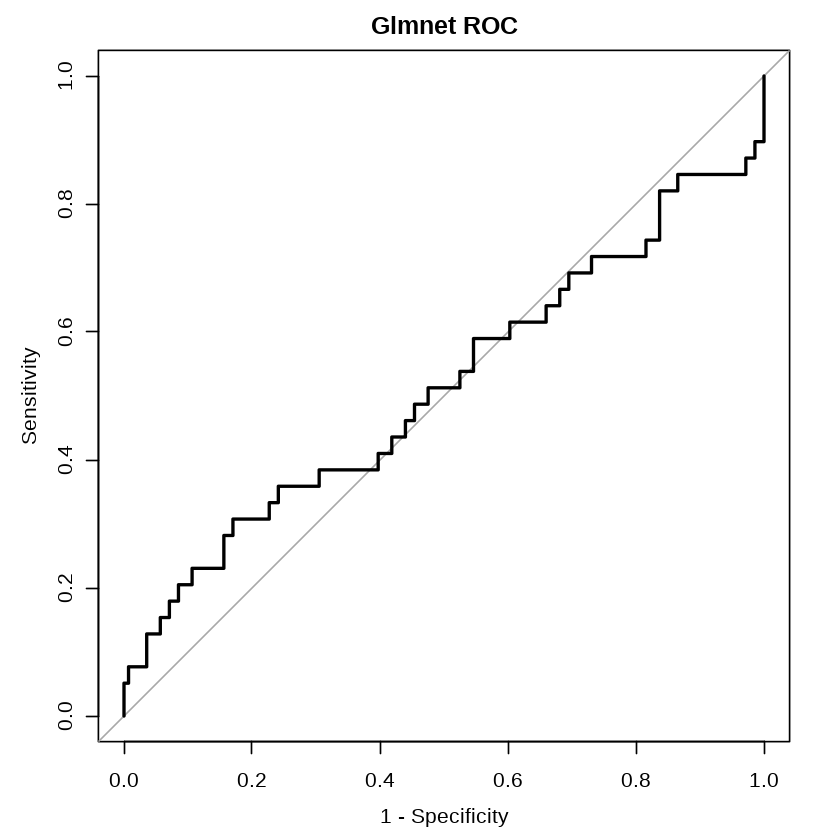

In [396]:
SUN.max = tapply(SUN.scores, Sul.pheno.risk.SUN$subjectid,max)

SUN.dis = Sul.pheno.risk.SUN[!duplicated(Sul.pheno.risk.SUN[,c('subjectid')]),]

SUN.dis = SUN.dis[match(names(SUN.max),SUN.dis$subjectid),]
SUN.dis$score = SUN.max

Sul.SUN.ROC.score <- my.roc(SUN.dis$score,
                        SUN.dis$group,
                     "progressor", title="Glmnet ROC")

[1] "This is the AUC:"
Area under the curve: 0.548
[1] "This is the AUC p-value:"
[1] 0.7812002
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.434-0.6619 (DeLong)


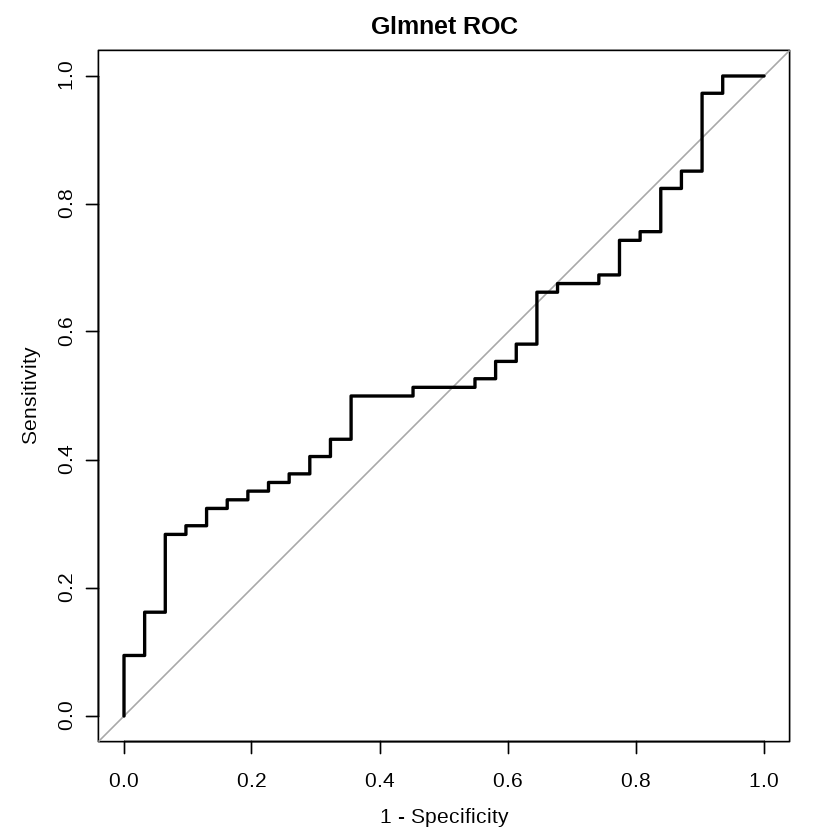

In [403]:
ACS.max = tapply(ACS.scores, ACS.pheno.subj$subjectid, max)

ACS.dis = ACS.pheno.subj[!duplicated(ACS.pheno.subj[,c('subjectid')]),]

ACS.dis = ACS.dis[match(names(ACS.max),ACS.dis$subjectid),]
ACS.dis$score = ACS.max

Sul.ACS.ROC.score <- my.roc(ACS.dis$score,
                        ACS.dis$group,
                     "control", title="Glmnet ROC")

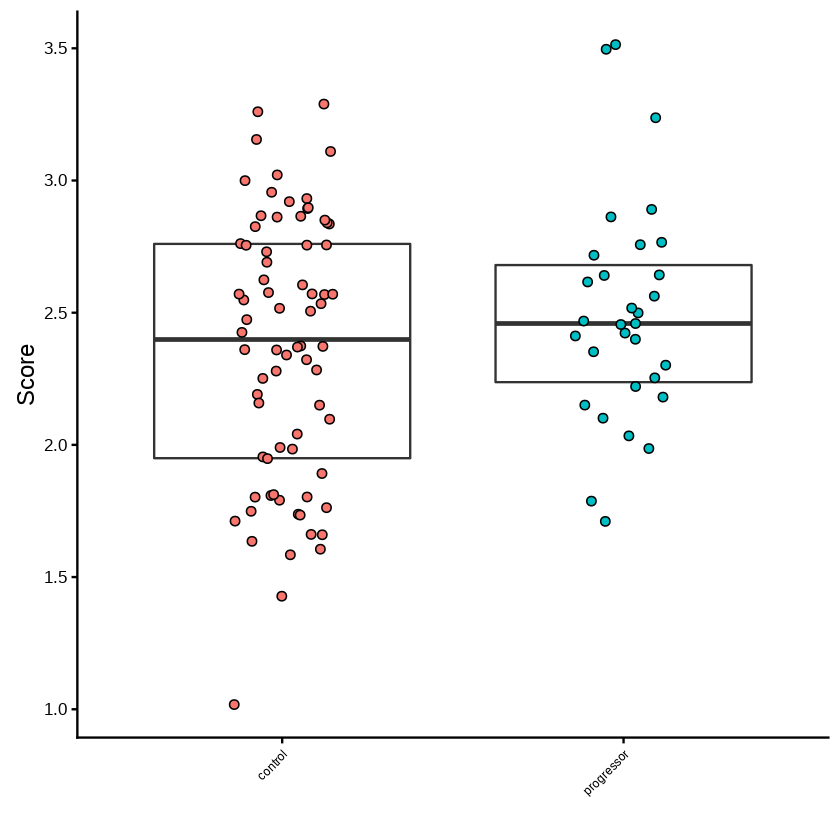

In [404]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=group ), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))


ACS.bar = ggplot(ACS.dis, aes(x=group , y=score)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
ACS.bar

In [364]:
table(test.dis$group)


   control progressor 
        49         11 

In [337]:
dim(test.dis)
dim(test.data)

[1] 60  9

[1] 60  2

In [360]:
identical(as.character(test.dis$subjectid), as.character(test.data$subjectid))

[1] TRUE

In [350]:
tester = data.frame(a =test.dis$subjectid, b = test.data$subjectid )

ERROR: Error in data.frame(a = test.dis$subjectid, b = test.data$subjectid): arguments imply differing number of rows: 0, 60


In [348]:
print(test.dis$subjectid)
test.data$subjectid

factor(0)
60 Levels: 07/G328 08/G109 08/G131 08/G143 08/G154 08/G196 08/G198 ... KAZHHC23


[1] 07/G328   08/G109   08/G131   08/G143   08/G154   08/G196   08/G198  
 [8] 08/G249   08/G372   08/G434   08/G496   08/G506   08/G593   08/G762  
[15] 08/G802   08/G826   08/G828   08/G876   09/G106   09/G110   09/G112  
[22] 09/G113   09/G143   09/G162   09/G169   09/G187   09/G212   09/G252  
[29] 09/G258   09/G280   09/G384   09/G391   09/G397   09/G401   09/G431  
[36] 09/G449   09/G450   09/G482   10/G261   10/G279   10/G369   ARHHC35  
[43] ARHHC45   ARHHC46   ARHHC63   DZHHC10   DZHHC70   DZHHC78   KHHC47   
[50] KHHC68    KHHC78    KHHC87    LDHHC09   LDHHC10   TEKHHC08  TEKHHC81 
[57] TEKHHC89  W23HHC113 DZHHC06   KAZHHC23 
60 Levels: 07/G328 08/G109 08/G131 08/G143 08/G154 08/G196 08/G198 ... W23HHC113

In [328]:
names(test.max)

[1] "07/G328"   "08/G109"   "08/G131"   "08/G143"   "08/G154"   "08/G196"  
 [7] "08/G198"   "08/G249"   "08/G372"   "08/G434"   "08/G496"   "08/G506"  
[13] "08/G593"   "08/G762"   "08/G802"   "08/G826"   "08/G828"   "08/G876"  
[19] "09/G106"   "09/G110"   "09/G112"   "09/G113"   "09/G143"   "09/G162"  
[25] "09/G169"   "09/G187"   "09/G212"   "09/G252"   "09/G258"   "09/G280"  
[31] "09/G384"   "09/G391"   "09/G397"   "09/G401"   "09/G431"   "09/G449"  
[37] "09/G450"   "09/G482"   "10/G261"   "10/G279"   "10/G369"   "ARHHC35"  
[43] "ARHHC45"   "ARHHC46"   "ARHHC63"   "DZHHC10"   "DZHHC70"   "DZHHC78"  
[49] "KHHC47"    "KHHC68"    "KHHC78"    "KHHC87"    "LDHHC09"   "LDHHC10"  
[55] "TEKHHC08"  "TEKHHC81"  "TEKHHC89"  "W23HHC113" "DZHHC06"   "KAZHHC23"

In [326]:
length(test.max)

[1] 60

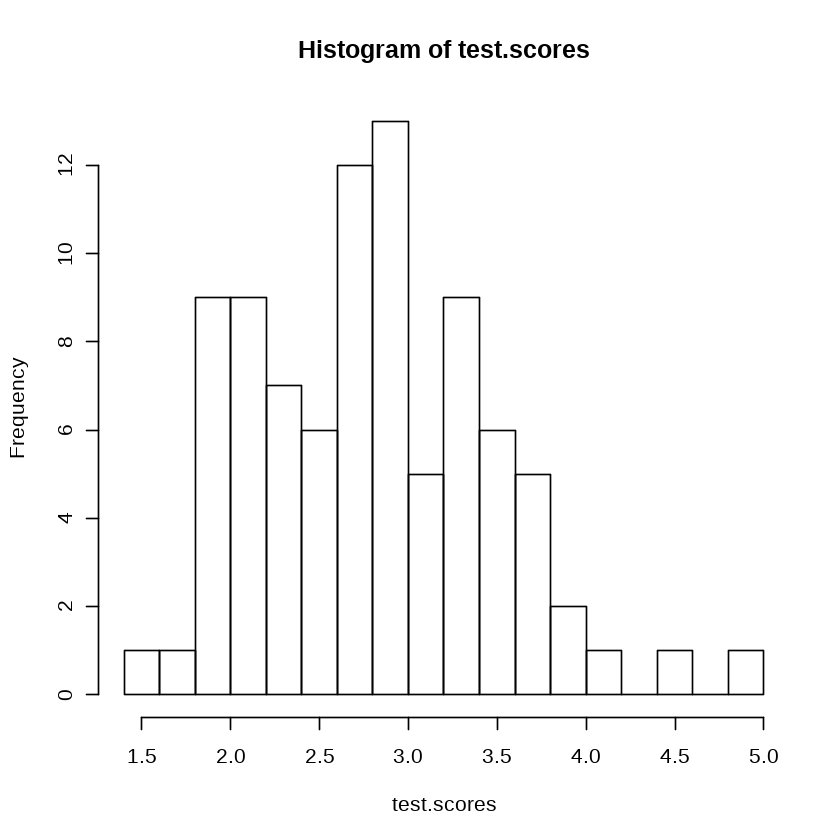

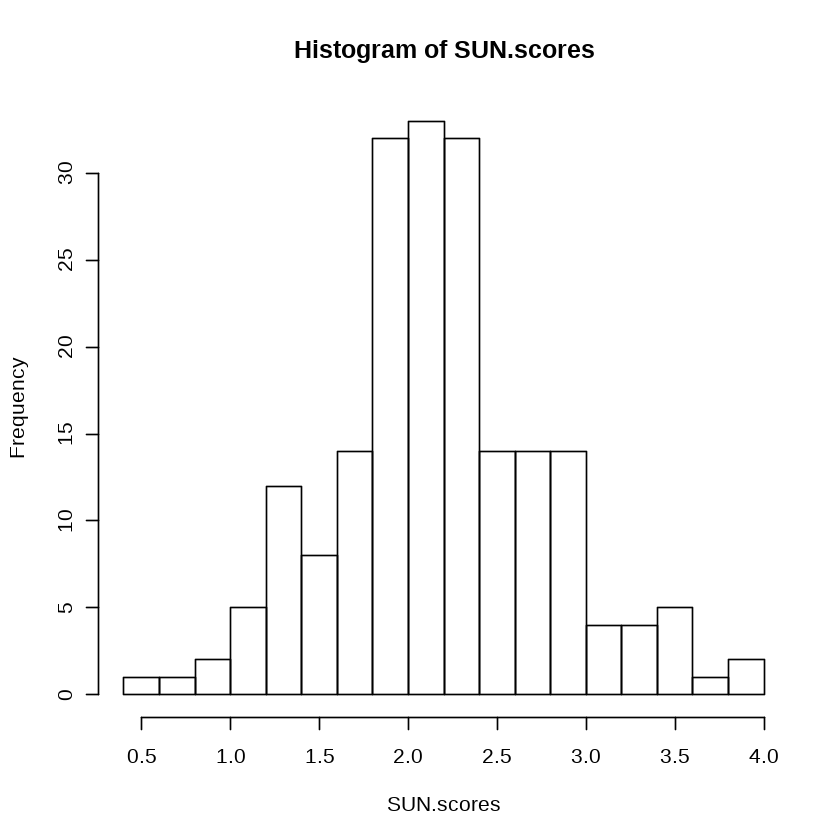

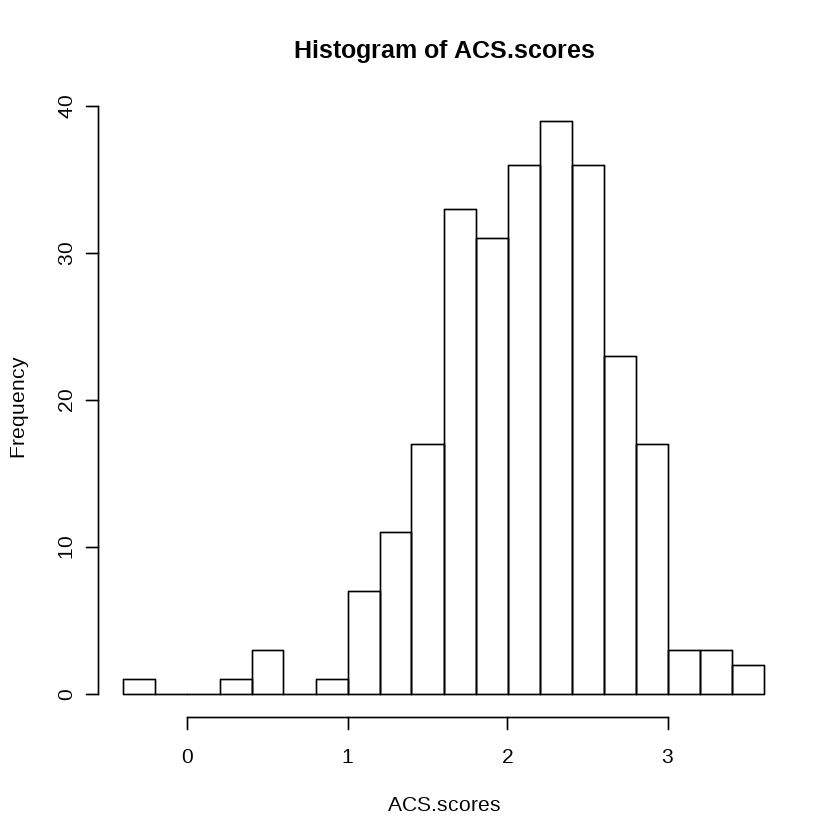

In [392]:
hist(test.scores, breaks=20)
hist(SUN.scores, breaks=20)
hist(ACS.scores, breaks=20)

### Reproduce Analysis for Figures 4A-F

- This requires the code from Figure 3 to have been run beforehand

#### Load and co-process the data from the ARCHS4 resource for GC6-74 and Singhania et al 2018

#### To download GC6-74 data from the ARCHS4 resource:

 - In a web browser go to https://amp.pharm.mssm.edu/archs4/data.html
 - Search for GSE94438 (GC6-74) and click the download link (a zipped folder with a gene_count.tsv file is downloaded)
 - Move the respective file into its data/GSE... folder in this repository and rename: "gene_count_GSE[GSE # here].tsv"

#### To download Singhania et al 2018 data from the ARCHS4 resource:
 - These data are more difficult to extract due to GSE107995 being a multi-series record and not available by direct quiery at  https://amp.pharm.mssm.edu/archs4/data.html
 - We extracted these data from the entire gene expression table of the ARCHS4 resource:
     - Run download_ARCHS4_datatable.sh to download human_matrix.h5 v6 Date: 9/2018. Our analyses should be unchanged if the matrix is updated on the ARCHS4 website.
     - Run code in extract_ARCHS4_Singhania_etal.ipynb

In [380]:
source("utils_submission.R")

In [381]:
Sul.path = paste(path, "/data/GSE94438", sep="")

Sul.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

Sul.pheno = filter.human.pheno(pData(Sul.pheno.set))

# Common names for progressor
Sul.pheno$group = ifelse(Sul.pheno$group == "Control", "control", "progressor")

Sul.exprs = read.table(paste(Sul.path, "gene_count_GSE94438.tsv", sep="/"), header=T, row.names=1)
Sul.exprs = filter.HUMAN.exprs(Sul.exprs, Sul.pheno) 

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

In [382]:
Garra.path = paste(path, "/data/GSE107995", sep="")
Garra.pheno.set = getGEO(filename=paste(Garra.path, "GSE107995_series_matrix.txt.gz", sep="/"),
             destdir=Garra.path)

Garra.pheno = filter.Garra.pheno(pData(Garra.pheno.set))

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL20301 found here:
./data/GSE107995/GPL20301.soft 
Warning message in filter.Garra.pheno(pData(Garra.pheno.set)):
“NAs introduced by coercion”

                   title    
 Berry_London_Sample1 :  1  
 Berry_London_Sample10:  1  
 Berry_London_Sample11:  1  
 Berry_London_Sample12:  1  
 Berry_London_Sample13:  1  
 Berry_London_Sample14:  1  
 (Other)              :408  
                                     source_name_ch1 age_at_baseline_visit
 Longitudnal_Leicester_Control_Non_progressor:69     Min.   :16.00        
 Longitudnal_Leicester_LTBI_Non_progressor   :69     1st Qu.:30.00        
 Leicester_Active_TB                         :53     Median :39.00        
 Leicester_Control                           :50     Mean   :39.21        
 Leicester_LTBI                              :49     3rd Qu.:46.00        
 Berry_SouthAfrica_Validation_set_LTBI       :31     Max.   :84.00        
 (Other)                                     :93     NA's   :101          
       birth_place                    ethnicity    gender   
 Foreign_Born:263   South_Asia_ISC         :198   F   :111  
 UK_Born     : 50   British_Indian         : 2

In [383]:
dim(Garra.pheno)

[1] 414  15

In [384]:
Garra.exprs = read.table(paste(Garra.path, "Singhania_et_al_expression_ARCHS4.csv", sep="/"), header=T, row.names=1, sep=",")

In [385]:
dim(Garra.exprs)

[1] 35238   414

In [386]:
all.exprs = cbind(Garra.exprs, Sul.exprs)
dim(all.exprs)

[1] 35238   829

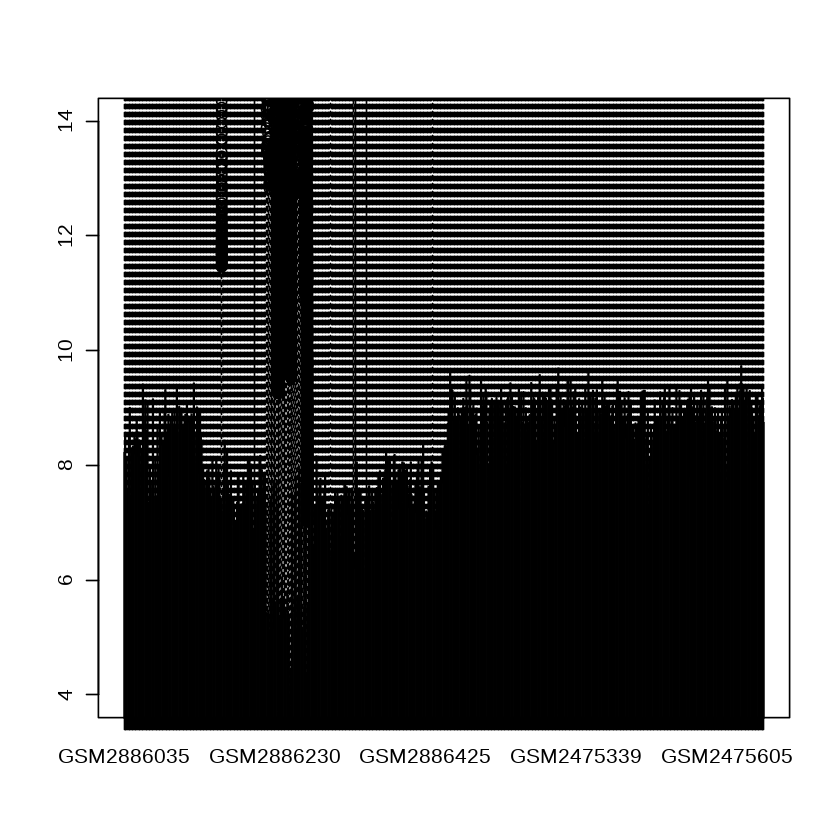

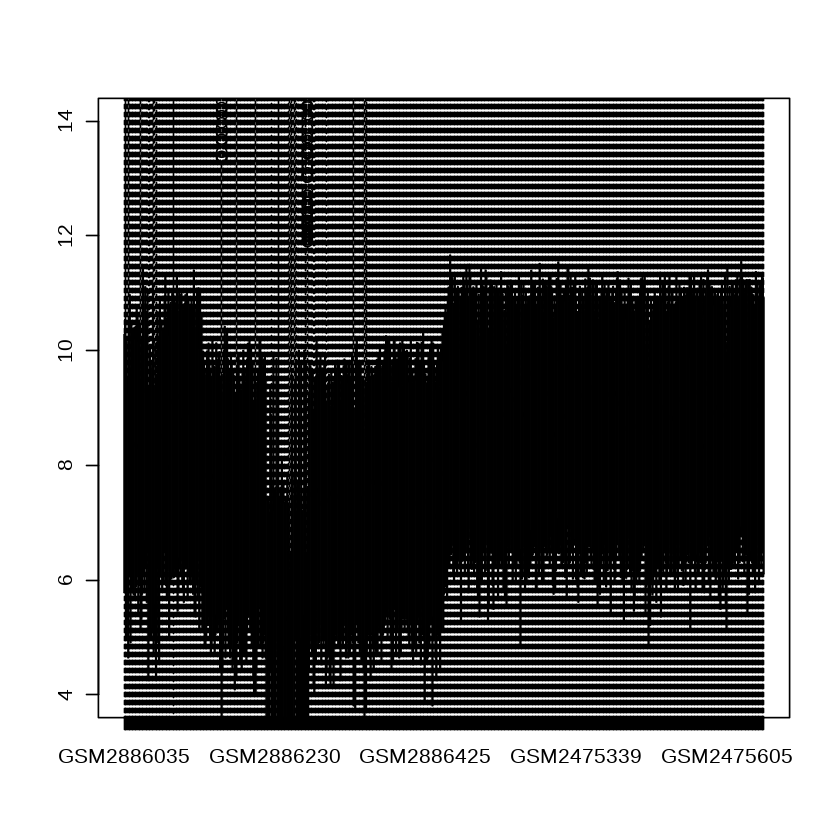

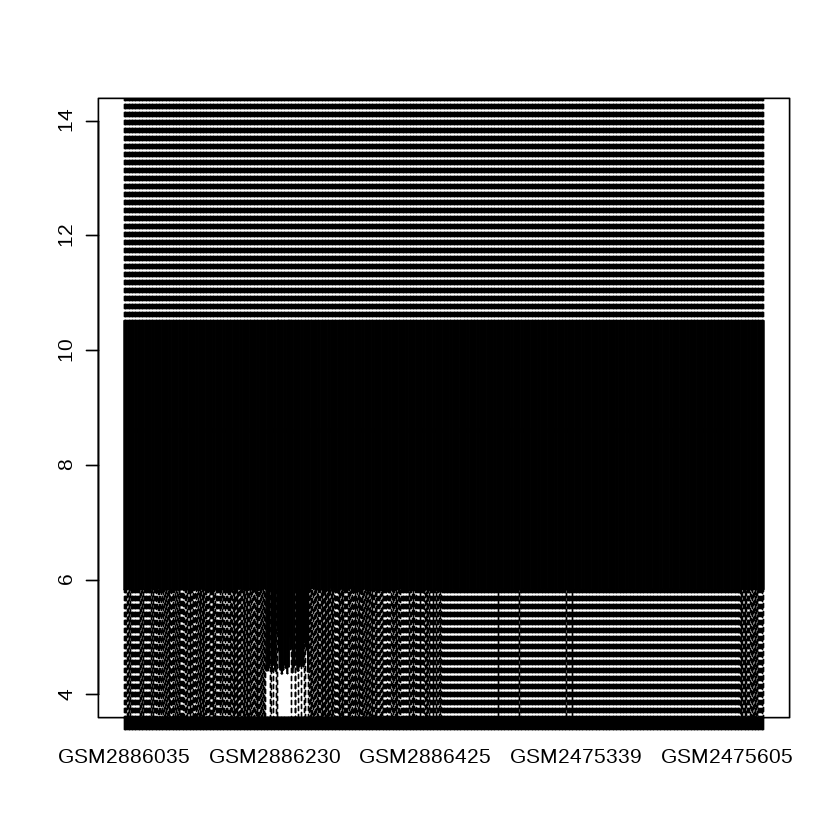

In [387]:
# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)


boxplot(log2(all.exprs+ 1), ylim=c(4,14))
boxplot(log2(exprs.fil+ 1), ylim=c(4,14))
boxplot(log2(exprs.qn+ 1), ylim=c(4,14))


In [388]:
Garra.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Garra.pheno)]
Sul.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Sul.pheno)]

identical(colnames(Garra.exprs.log), row.names(Garra.pheno))

[1] TRUE

#### Repeat process of Figure 3C to build a model from GC6-74 data to then predict time since TB exposure in Singhania et al 2018 cohorts

In [199]:
Sul.pheno.6mo = Sul.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new Sul.pheno

AHRI.subj = unique(dplyr::filter(Sul.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
Sul.pheno.6mo$dataset[Sul.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"


# dplyr::filter pheno and expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

Sul.pheno.6mo = droplevels(Sul.pheno.6mo[Sul.pheno.6mo$site %in% c("AHRI", "MRC") & Sul.pheno.6mo$time.from.exposure.months %in% c(0, 6),])

Sul.exprs.log.6mo = Sul.exprs.log[, colnames(Sul.exprs.log) %in% row.names(Sul.pheno.6mo)]

Sul.pheno.6mo.train = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset == "Training",])
Sul.pheno.6mo.test = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset != "Training",])

Sul.exprs.train = t(Sul.exprs.log.6mo[,row.names(Sul.pheno.6mo.train)])
Sul.exprs.test = t(Sul.exprs.log.6mo[, row.names(Sul.pheno.6mo.test)])

set.seed(100)
folds.6mo = groupKFold(Sul.pheno.6mo.train$subjectid, k=10)
for (fold in lapply(folds.6mo, function(x) {Sul.pheno.6mo.train$subjectid[x]}))
    print(length((as.character(fold))))

lapply(folds.6mo, function(x, y) table(y[x]), y = Sul.pheno.6mo.train$subjectid)

time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.train$time.from.exposure.months == "0", "early", "late"))
test.time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.test$time.from.exposure.months == "0", "early", "late"))

[1] 112
[1] 107
[1] 98
[1] 99
[1] 101
[1] 103
[1] 102
[1] 103
[1] 105
[1] 105


$Fold01

  07/G189   07/G274   07/G277   07/G300   07/G351   07/G354   07/G368   07/G370 
        1         1         1         0         1         1         1         1 
  07/G419   08/G136   08/G141   08/G160   08/G245   08/G260   08/G324   08/G333 
        1         1         1         1         1         2         2         1 
  08/G343   08/G367   08/G400   08/G407   08/G415   08/G423   08/G424   08/G433 
        1         2         1         1         1         1         1         2 
  08/G493   08/G494   08/G541   08/G587   08/G596   08/G606   08/G613   08/G643 
        1         1         1         1         1         1         1         1 
  08/G652   08/G654   08/G695   08/G701   08/G703   08/G714   08/G715   08/G726 
        2         1         1         1         2         1         1         1 
  08/G782   08/G788   08/G797   08/G800   08/G810   08/G814   08/G893   09/G120 
        1         1         2         1         1         1         1         1 
  09/G133   09/G135

In [200]:
start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

print("Made the clusters")

myFunc <- caretSBF
myFunc$summary <- twoClassSummary
myFunc$score <- function(x, y) {
  out <- wilcox.test(x ~ y)$p.value # Will have warnings due to ties; ignore for now.
  out
}

filtercontrol.lm = sbfControl(functions = myFunc, method = "cv",  index=folds.6mo,  allowParallel=TRUE) 
set.seed(10)
wilcoxWithFilter.lm = sbf(Sul.exprs.train, as.factor(Sul.pheno.6mo.train$time.from.exposure.months), sbfControl = filtercontrol.lm)

print("Did the feature selection")
stopCluster(cluster)
registerDoSEQ()


end_time <- Sys.time()
print(end_time - start_time)

[1] "Made the clusters"
[1] "Did the feature selection"
Time difference of 11.67026 mins


In [201]:
opt.Sul.Garra.vars = wilcoxWithFilter.lm$optVariables

In [202]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-6), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))

In [203]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(Sul.exprs.train[, colnames(Sul.exprs.train) %in% c(opt.Sul.Garra.vars)],
                  time.period.from.exposure,
                  method=alg, tuneGrid = train.grid, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}



stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 2.452045 mins


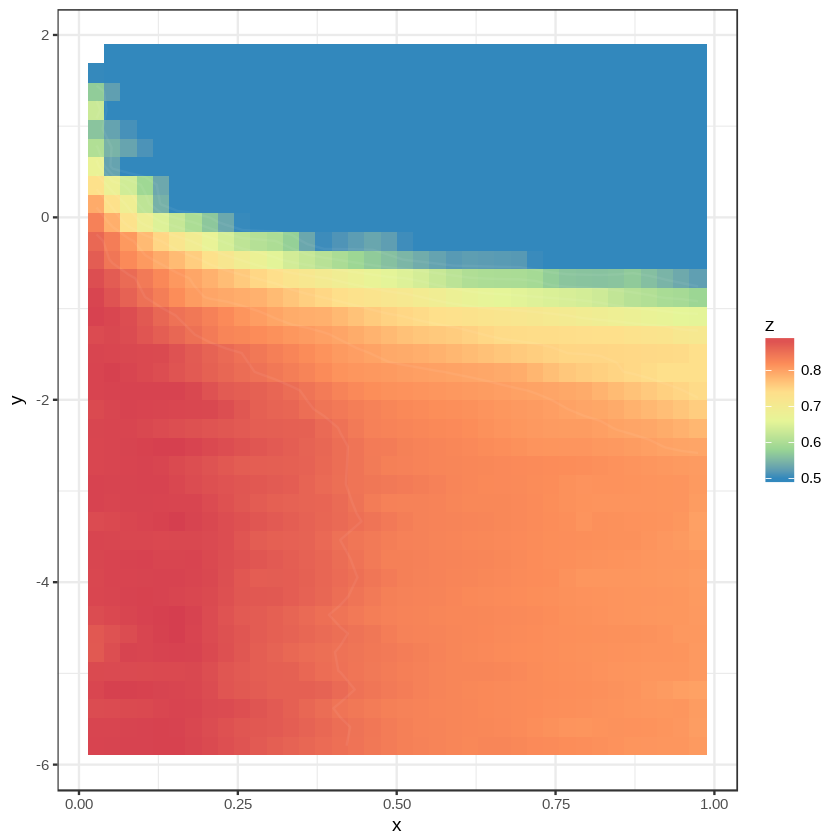

In [204]:
glmres = models$glmnet$results
graph.hyper (x=glmres$alpha, y=log10(glmres$lambda), z=glmres$ROC)

[1] "This is the AUC:"
Area under the curve: 0.8831
[1] "This is the AUC p-value:"
[1] 1.428919e-12
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.8185-0.9477 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6565
[1] "This is the AUC p-value:"
[1] 0.01342422
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5255-0.7875 (DeLong)


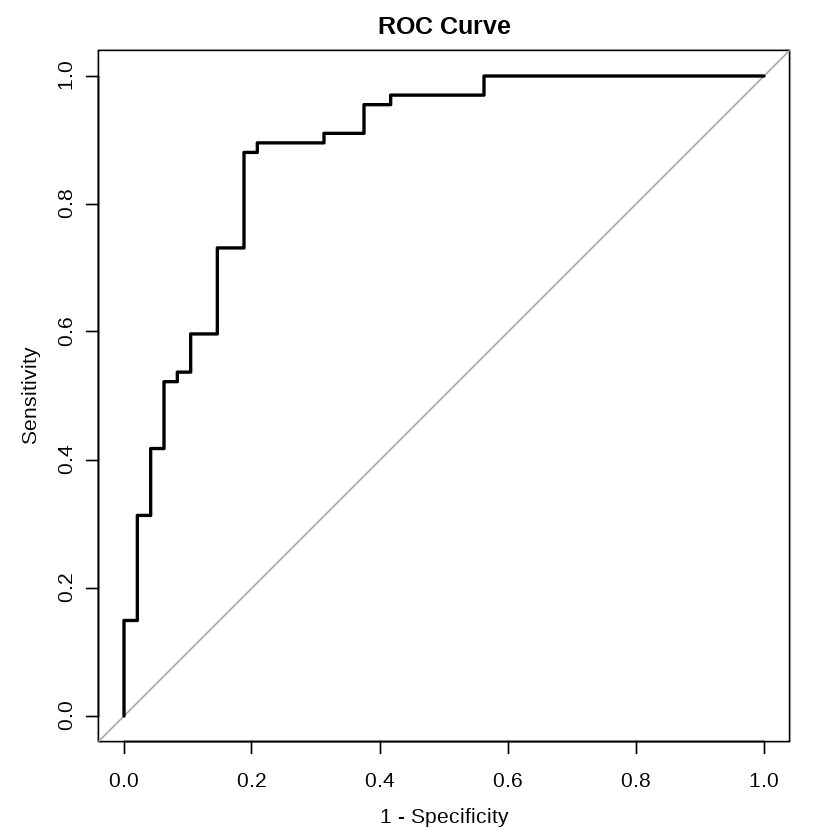

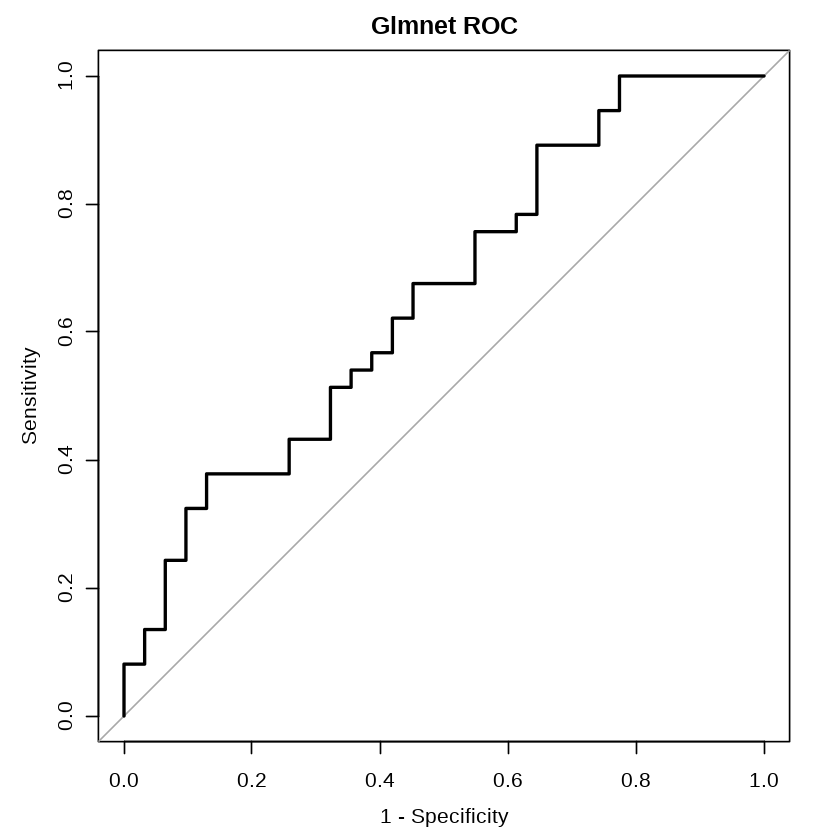

In [205]:
human.expose.Sul.Garra.model = models$glmnet

glmnet.Sul.val.ROC = my.roc(human.expose.Sul.Garra.model$pred$early, human.expose.Sul.Garra.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.Garra.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.Garra.vars)], type="prob")

glmnet.Sul.test.ROC <- my.roc(pred.Sul.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

#### Load and co-process the data from the ARCHS4 resource for GC6-74 and ACS

#### To download data from the ARCHS4 resource
 - In a web browser go to https://amp.pharm.mssm.edu/archs4/data.html
 - (If have not done already) Search for GSE94438 (GC6-74) and click the download link (a zipped folder with a gene_count.tsv file is downloaded)
 - Do the same for for GSE79362 (ACS) 
 - Move the respective files into their data/GSE... folder in this repository and rename: "gene_count_GSE[GSE # here].tsv"

In [408]:
source("utils_submission.R")

Sul.path = paste(path, "/data/GSE94438", sep="")
ACS.path = paste(path, "/data/GSE79362", sep="")

Sul.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

Sul.pheno = filter.human.pheno(pData(Sul.pheno.set))

ACS.pheno.set = getGEO(filename=paste(ACS.path, "GSE79362_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

ACS.pheno = filter.ACS.pheno(pData(ACS.pheno.set))

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.ACS.pheno(pData(ACS.pheno.set)):
“NAs introduced by coercion”

[1] "about to return new data frame"


In [409]:
# Common names for progressor
Sul.pheno$group = ifelse(Sul.pheno$group == "Control", "control", "progressor")
ACS.pheno$group = ifelse(ACS.pheno$group == "control (non-progressor)", "control", "progressor")

ACS.exprs = read.table(paste(ACS.path, "gene_count_GSE79362.tsv", sep="/"), header=T, row.names=1)
ACS.exprs = filter.HUMAN.exprs(ACS.exprs, ACS.pheno)
Sul.exprs = read.table(paste(Sul.path, "gene_count_GSE94438.tsv", sep="/"), header=T, row.names=1)
Sul.exprs = filter.HUMAN.exprs(Sul.exprs, Sul.pheno)

all.exprs = cbind(ACS.exprs, Sul.exprs)

# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(all.exprs <= 5, 1, mean) <= 0.5

exprs.fil = all.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)

Sul.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(Sul.pheno)]
ACS.exprs.log = exprs.log[, colnames(exprs.log) %in% row.names(ACS.pheno)]

ACS.exprs.log = t(ACS.exprs.log)

[1] "Identical column and rownames between exprs and pheno tables?"
[1] TRUE
[1] "Identical column and rownames between exprs and pheno tables?"
[1] TRUE


#### Repeat process of Figure 3C to build a model from GC6-74 data to then predict time since TB exposure in ACS cohort

In [208]:
Sul.pheno.6mo = Sul.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new Sul.pheno

AHRI.subj = unique(dplyr::filter(Sul.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
Sul.pheno.6mo$dataset[Sul.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"


# dplyr::filter pheno and expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

Sul.pheno.6mo = droplevels(Sul.pheno.6mo[Sul.pheno.6mo$site %in% c("AHRI", "MRC") & Sul.pheno.6mo$time.from.exposure.months %in% c(0, 6),])

Sul.exprs.log.6mo = Sul.exprs.log[, colnames(Sul.exprs.log) %in% row.names(Sul.pheno.6mo)]

Sul.pheno.6mo.train = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset == "Training",])
Sul.pheno.6mo.test = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset != "Training",])

Sul.exprs.train = t(Sul.exprs.log.6mo[,row.names(Sul.pheno.6mo.train)])
Sul.exprs.test = t(Sul.exprs.log.6mo[, row.names(Sul.pheno.6mo.test)])

set.seed(100)
folds.6mo = groupKFold(Sul.pheno.6mo.train$subjectid, k=10)
for (fold in lapply(folds.6mo, function(x) {Sul.pheno.6mo.train$subjectid[x]}))
    print(length((as.character(fold))))

lapply(folds.6mo, function(x, y) table(y[x]), y = Sul.pheno.6mo.train$subjectid)

time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.train$time.from.exposure.months == "0", "early", "late"))
test.time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.test$time.from.exposure.months == "0", "early", "late"))

[1] 112
[1] 107
[1] 98
[1] 99
[1] 101
[1] 103
[1] 102
[1] 103
[1] 105
[1] 105


$Fold01

  07/G189   07/G274   07/G277   07/G300   07/G351   07/G354   07/G368   07/G370 
        1         1         1         0         1         1         1         1 
  07/G419   08/G136   08/G141   08/G160   08/G245   08/G260   08/G324   08/G333 
        1         1         1         1         1         2         2         1 
  08/G343   08/G367   08/G400   08/G407   08/G415   08/G423   08/G424   08/G433 
        1         2         1         1         1         1         1         2 
  08/G493   08/G494   08/G541   08/G587   08/G596   08/G606   08/G613   08/G643 
        1         1         1         1         1         1         1         1 
  08/G652   08/G654   08/G695   08/G701   08/G703   08/G714   08/G715   08/G726 
        2         1         1         1         2         1         1         1 
  08/G782   08/G788   08/G797   08/G800   08/G810   08/G814   08/G893   09/G120 
        1         1         2         1         1         1         1         1 
  09/G133   09/G135

In [209]:
start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

print("Made the clusters")

myFunc <- caretSBF
myFunc$summary <- twoClassSummary
myFunc$score <- function(x, y) {
  out <- wilcox.test(x ~ y)$p.value # Will have warnings due to ties; ignore for now.
  out
}

filtercontrol.lm = sbfControl(functions = myFunc, method = "cv",  index=folds.6mo,  allowParallel=TRUE) 
set.seed(10)
wilcoxWithFilter.lm = sbf(Sul.exprs.train, as.factor(Sul.pheno.6mo.train$time.from.exposure.months), sbfControl = filtercontrol.lm)

print("Did the feature selection")
stopCluster(cluster)
registerDoSEQ()


end_time <- Sys.time()
print(end_time - start_time)

[1] "Made the clusters"
[1] "Did the feature selection"
Time difference of 12.26804 mins


In [216]:
length(opt.Sul.vars)

[1] 2636

In [210]:
opt.Sul.vars = wilcoxWithFilter.lm$optVariables

In [211]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e-6), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))

In [212]:
seed=7

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")

models = list()


control <- trainControl(method="cv", index=folds.6mo, savePredictions = 'final', allowParallel=TRUE,
                       classProbs=TRUE, summaryFunction=twoClassSummary) # Use AUC to pick the best model

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(Sul.exprs.train[, colnames(Sul.exprs.train) %in% c(opt.Sul.vars)],
                  time.period.from.exposure,
                  method=alg, tuneGrid = train.grid, trControl=control,
                 metric="ROC")
    models[[alg]] = model
}



stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 2.015692 mins


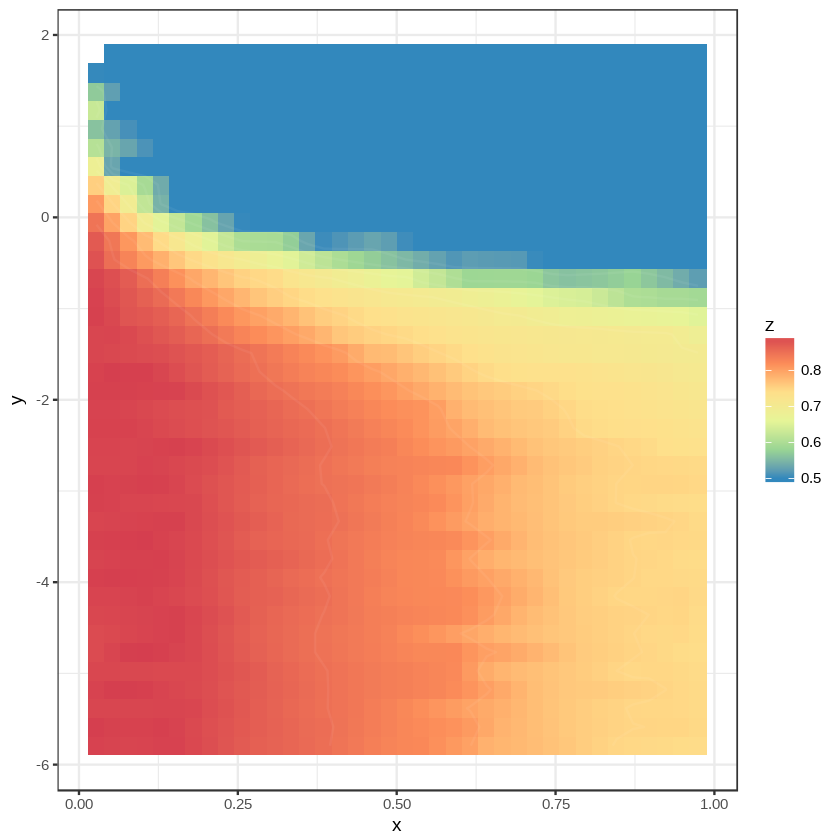

In [213]:
glmres = models$glmnet$results
graph.hyper (x=glmres$alpha, y=log10(glmres$lambda), z=glmres$ROC)

In [214]:
human.expose.Sul.ACS.model = models$glmnet

[1] "This is the AUC:"
Area under the curve: 0.8871
[1] "This is the AUC p-value:"
[1] 8.429174e-13
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.8234-0.9508 (DeLong)
[1] "This is the AUC:"
Area under the curve: 0.6548
[1] "This is the AUC p-value:"
[1] 0.01431948
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5237-0.7858 (DeLong)


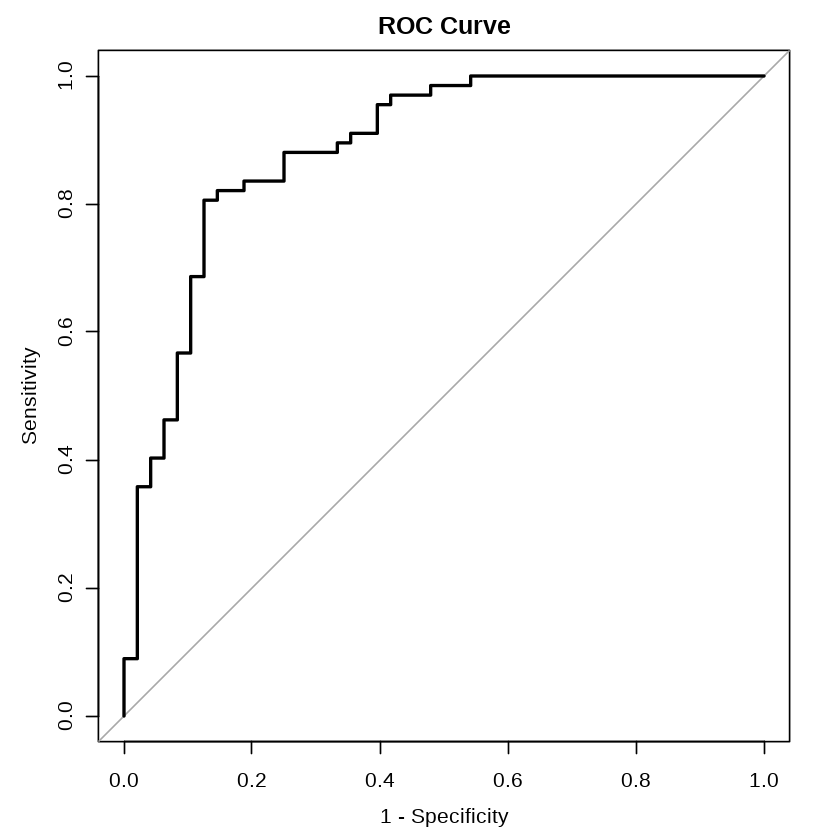

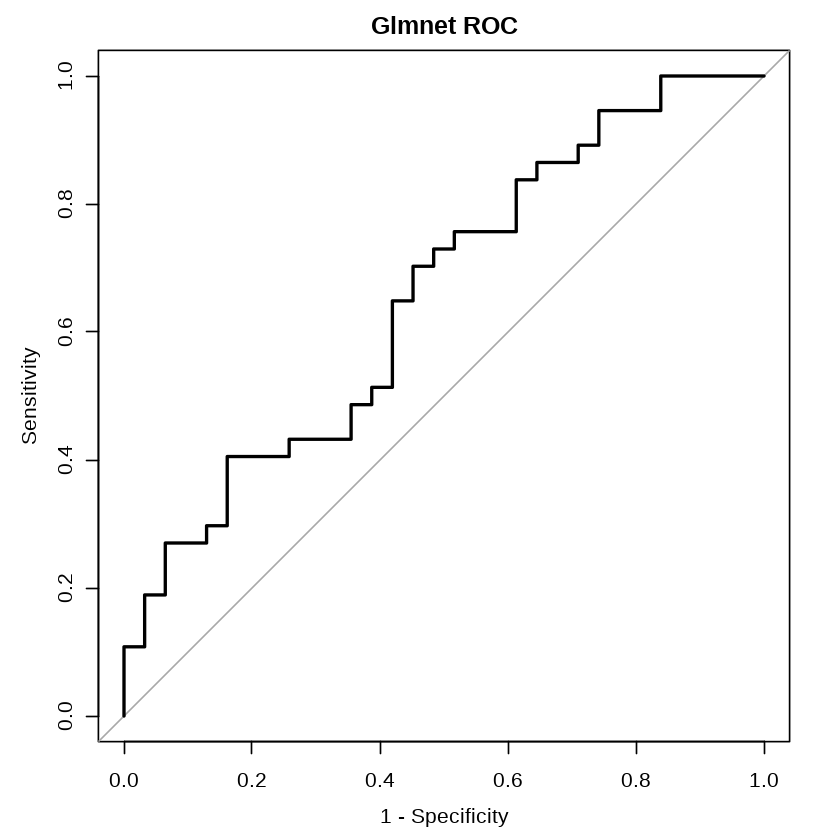

In [215]:
glmnet.Sul.val.ROC = my.roc(human.expose.Sul.ACS.model$pred$early, human.expose.Sul.ACS.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.ACS.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.vars)], type="prob")

glmnet.Sul.test.ROC <- my.roc(pred.Sul.test.prob$early,
                        test.time.period.from.exposure,
                     "early", title="Glmnet ROC")

#### As with the fully co-normalized model, graph the prediction scores together with these separately tested models (ACS and Garra separate)

##### First boxplot takes no account of the patient id's, the predictions for all samples
- It looks like I could be better served by considering the two aggregated datasets separately. It looks better calibrated with them separately with values spanning from 0 to 1. Okay, my results definitely are true, they definitely reproduce. It's just the presentation and maybe just using a more generazable calculation of upregulated and downregulated genes for a small gene signature.

- Stick with separate to start on the many genes and few genes, then go to separate. I will do the few gene analysis before I decide how to present the AUC curves. LTBI longitudinal non progressor vs. all within the Garra dataset definitely will have a high AUC and is in accordance with my pre-specified hypothesis. I could use AUC and show that the differing patients had the 6-month prediction as the defining feature, meaning it is 6-months.

- Then I could present ACS separately and see whether this score longitudinally allows to separate controls from progressors.

- It really is a different model when I combine them all together. Maybe by being more strategic I can in fact get into PLoS Medicine or the like.

In [ ]:
 ACS.exprs.log[, colnames(ACS.exprs.log) %in% c(opt.Sul.vars)])

In [389]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

ACS.pheno.bar = ACS.pheno
Garra.pheno.bar = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
ACS.exprs.bar = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.bar),]
Garra.exprs.bar = t(Garra.exprs.log[,colnames(Garra.exprs.log) %in% rownames(Garra.pheno.bar)])
pred.ACS.test.prob = predict(human.expose.Sul.ACS.model,  newdata = ACS.exprs.bar[, colnames(ACS.exprs.bar) %in% c(opt.Sul.vars)], type="prob")
pred.Garra.test.prob = predict(human.expose.Sul.Garra.model, newdata = Garra.exprs.bar[, colnames(Garra.exprs.bar) %in% c(opt.Sul.Garra.vars)], type="prob")
ACS.pheno.bar$disease = ACS.pheno.bar$group
Garra.pheno.bar$disease = Garra.pheno.bar$source_name_ch1

All.pheno.bar = data.frame(disease=c(as.character(Garra.pheno.bar$disease), as.character(ACS.pheno.bar$disease)))
All.pheno.bar$late.pred = c(pred.Garra.test.prob$late,pred.ACS.test.prob$late)

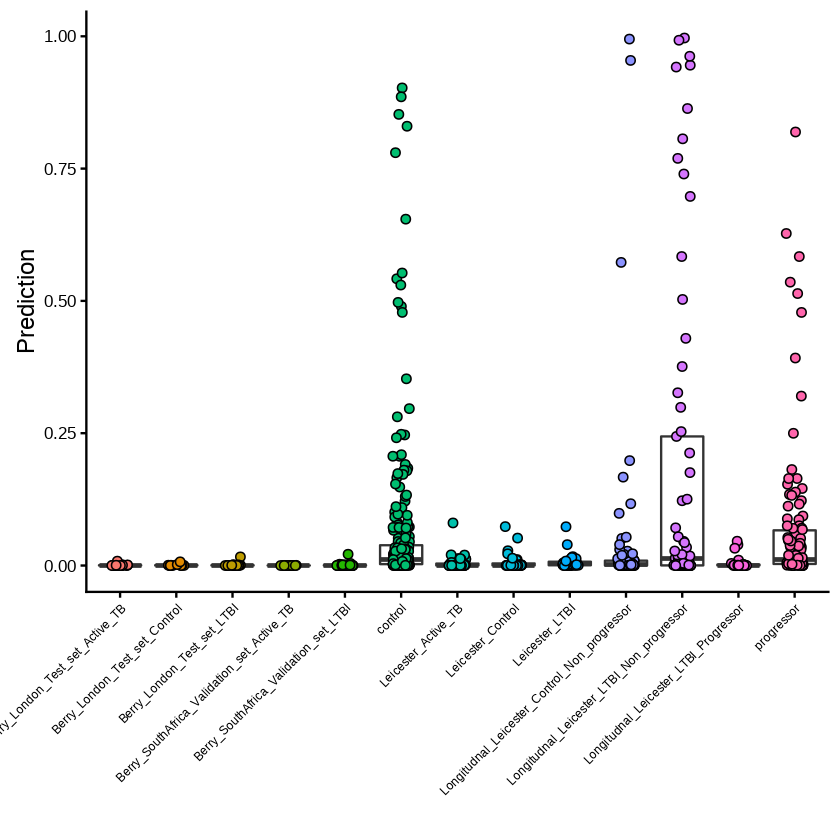

In [390]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(All.pheno.bar, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

In [222]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

ACS.pheno.bar = ACS.pheno
Garra.pheno.bar = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
ACS.exprs.bar = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.bar),]
Garra.exprs.bar = t(Garra.exprs.log[,colnames(Garra.exprs.log) %in% rownames(Garra.pheno.bar)])
pred.ACS.test.prob = predict(human.expose.Sul.ACS.model,  newdata = ACS.exprs.bar[, colnames(ACS.exprs.bar) %in% c(opt.Sul.vars)], type="prob")
pred.Garra.test.prob = predict(human.expose.Sul.Garra.model, newdata = Garra.exprs.bar[, colnames(Garra.exprs.bar) %in% c(opt.Sul.Garra.vars)], type="prob")
ACS.pheno.bar$disease = ACS.pheno.bar$group
Garra.pheno.bar$disease = Garra.pheno.bar$source_name_ch1

All.pheno.bar = data.frame(disease=c(as.character(Garra.pheno.bar$disease), as.character(ACS.pheno.bar$disease)))
All.pheno.bar$late.pred = c(pred.Garra.test.prob$late,pred.ACS.test.prob$late)

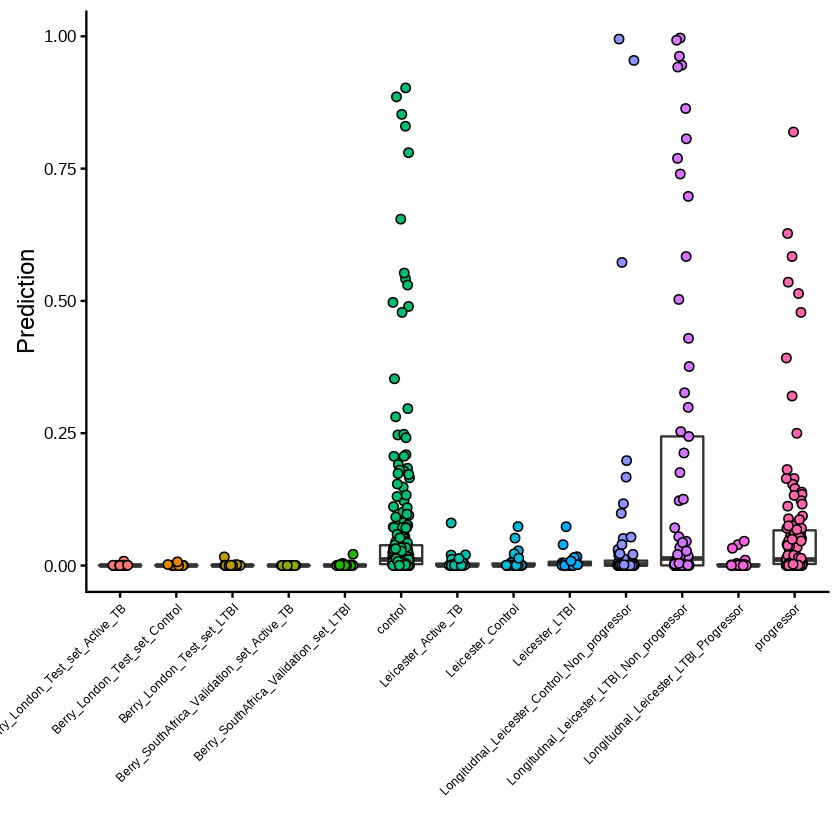

In [224]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(All.pheno.bar, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

###### Do a scatter plot of median read length from filtered dataset along with the total predictions

- While there are many low read predictions that are close to 0, the only predictions approaching 1 are in the low read samples.  For a true predictive signature, there shouldn't be any correlation between technical variables and the prediction. Therefore, I cannot say with any confidence that these predictions are real. I should have considered this technical, potential confounder from the beginning, for I saw it early as I analyzed these data.

- I am now convinced that For a subtle phenotype like this, a study needs to be well-designed to test it.

- I may present in a supplemental figure these results with the Garra and ACS cohort. It would seem to suggest changes occuring at 6-months, but it's hard to say for sure without internal controls (known recent infection in a validation cohort). 

- I think the only thing I can do now is to compare human, monkey and mouse genes. Are they differentially expressed in all species? That's about the best validation I can get. And maybe, just maybe apply the 6-gene signature to the Adolescent acquisition cohort. 

- Okay, I think I can try the 6 gene signature, comparing pre and post conversion if there is any difference in the distributions, in the Adolescent acquisition

- It may be good to look a correlation between age and prediction in ACS cohort. In this cohort, there was no correlation between read number and prediction.
- Nope, no correlation between score and age.

In [397]:
library(ggpubr)

Loading required package: magrittr

Attaching package: ‘ggpubr’

The following object is masked from ‘package:cowplot’:

    get_legend



In [393]:
scatter.contact.ltbi = data.frame(score = pred.Garra.test.prob$late[Garra.pheno.bar$disease == "Longitudnal_Leicester_LTBI_Non_progressor"],
                                 med.read = apply(log2(exprs.fil+1), 2,median)[colnames(exprs.fil) %in% rownames(Garra.pheno.bar[Garra.pheno.bar$disease == "Longitudnal_Leicester_LTBI_Non_progressor",])])

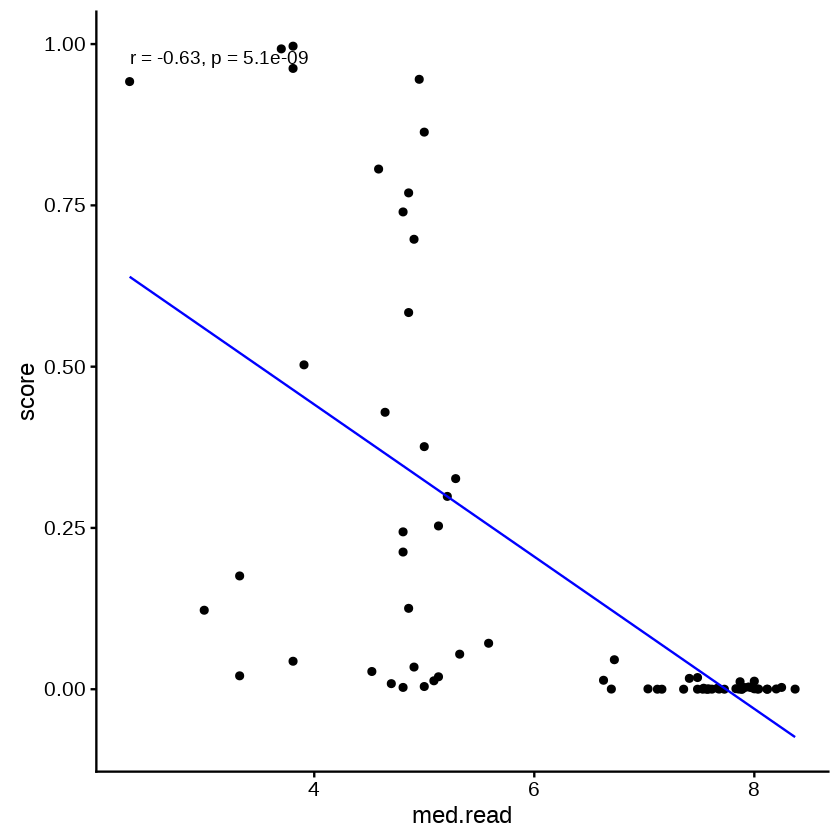

In [398]:
ggplot(scatter.contact.ltbi, aes(x=med.read, y=score)) + geom_point() +
geom_smooth(method = "lm", col= "blue", se = FALSE, size=0.5) + 
        stat_cor(method = "pearson") 

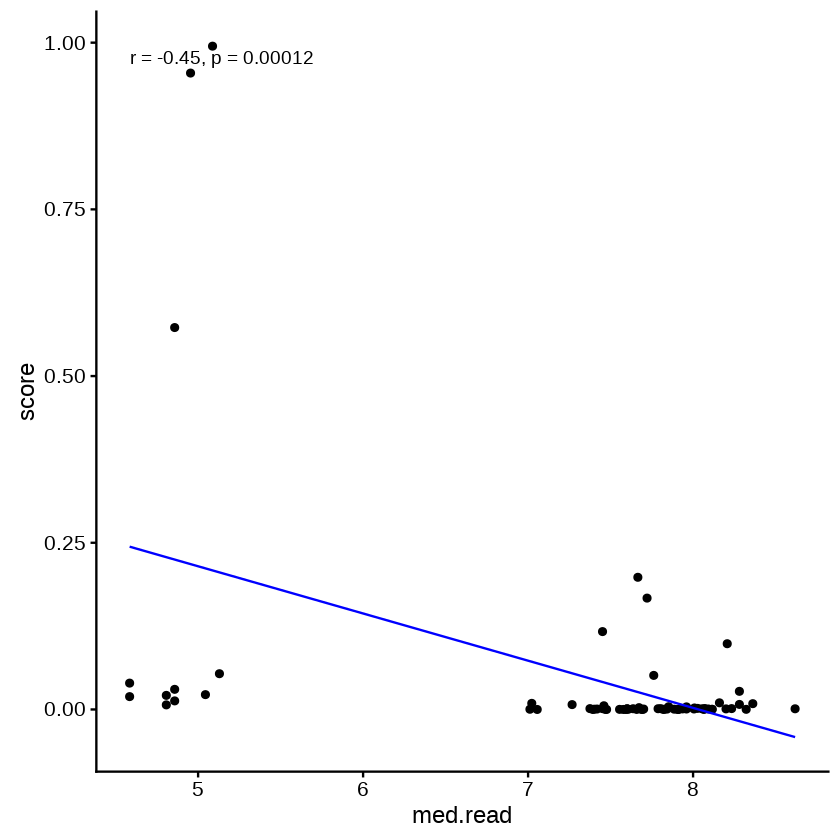

In [399]:
scatter.contact.control = data.frame(score = pred.Garra.test.prob$late[Garra.pheno.bar$disease == "Longitudnal_Leicester_Control_Non_progressor"],
                                 med.read = apply(log2(exprs.fil+1), 2,median)[colnames(exprs.fil) %in% rownames(Garra.pheno.bar[Garra.pheno.bar$disease == "Longitudnal_Leicester_Control_Non_progressor",])])

ggplot(scatter.contact.control, aes(x=med.read, y=score)) + geom_point() +
geom_smooth(method = "lm", col= "blue", se = FALSE, size=0.5) + 
        stat_cor(method = "pearson") 

In [403]:
length(apply(log2(exprs.fil+1), 2,median))

[1] 829

In [404]:
length(colnames(exprs.fil))

[1] 829

In [405]:
sum(colnames(exprs.fil) %in% rownames(ACS.pheno.bar))

[1] 0

In [407]:
head(colnames(exprs.fil))

[1] "GSM2886035" "GSM2886036" "GSM2886037" "GSM2886038" "GSM2886039"
[6] "GSM2886040"

In [406]:
rownames(ACS.pheno.bar)

[1] "GSM2092905" "GSM2092906" "GSM2092907" "GSM2092908" "GSM2092909"
  [6] "GSM2092910" "GSM2092911" "GSM2092912" "GSM2092913" "GSM2092914"
 [11] "GSM2092915" "GSM2092916" "GSM2092917" "GSM2092918" "GSM2092919"
 [16] "GSM2092920" "GSM2092921" "GSM2092922" "GSM2092923" "GSM2092924"
 [21] "GSM2092925" "GSM2092926" "GSM2092927" "GSM2092928" "GSM2092929"
 [26] "GSM2092930" "GSM2092931" "GSM2092932" "GSM2092933" "GSM2092934"
 [31] "GSM2092935" "GSM2092936" "GSM2092937" "GSM2092938" "GSM2092939"
 [36] "GSM2092940" "GSM2092941" "GSM2092942" "GSM2092943" "GSM2092944"
 [41] "GSM2092945" "GSM2092946" "GSM2092947" "GSM2092948" "GSM2092949"
 [46] "GSM2092950" "GSM2092951" "GSM2092952" "GSM2092953" "GSM2092954"
 [51] "GSM2092955" "GSM2092956" "GSM2092957" "GSM2092958" "GSM2092959"
 [56] "GSM2092960" "GSM2092961" "GSM2092962" "GSM2092963" "GSM2092964"
 [61] "GSM2092965" "GSM2092966" "GSM2092967" "GSM2092968" "GSM2092969"
 [66] "GSM2092970" "GSM2092971" "GSM2092972" "GSM2092973" "GSM2092974"
 [71] "GSM2092975" "GSM2092976" "GSM2092977" "GSM2092978" "GSM2092979"
 [76] "GSM2092980" "GSM2092981" "GSM2092982" "GSM2092983" "GSM2092984"
 [81] "GSM2092985" "GSM2092986" "GSM2092987" "GSM2092988" "GSM2092989"
 [86] "GSM2092990" "GSM2092991" "GSM2092992" "GSM2092993" "GSM2092994"
 [91] "GSM2092995" "GSM2092996" "GSM2092997" "GSM2092998" "GSM2092999"
 [96] "GSM2093000" "GSM2093001" "GSM2093002" "GSM2093003" "GSM2093004"
[101] "GSM2093005" "GSM2093006" "GSM2093007" "GSM2093008" "GSM2093009"
[106] "GSM2093010" "GSM2093011" "GSM2093012" "GSM2093013" "GSM2093014"
[111] "GSM2093015" "GSM2093016" "GSM2093017" "GSM2093018" "GSM2093019"
[116] "GSM2093020" "GSM2093021" "GSM2093022" "GSM2093023" "GSM2093024"
[121] "GSM2093025" "GSM2093026" "GSM2093027" "GSM2093028" "GSM2093029"
[126] "GSM2093030" "GSM2093031" "GSM2093032" "GSM2093033" "GSM2093034"
[131] "GSM2093035" "GSM2093036" "GSM2093037" "GSM2093038" "GSM2093039"
[136] "GSM2093040" "GSM2093041" "GSM2093042" "GSM2093043" "GSM2093044"
[141] "GSM2093045" "GSM2093046" "GSM2093047" "GSM2093048" "GSM2093049"
[146] "GSM2093050" "GSM2093051" "GSM2093052" "GSM2093053" "GSM2093054"
[151] "GSM2093055" "GSM2093056" "GSM2093057" "GSM2093058" "GSM2093059"
[156] "GSM2093060" "GSM2093061" "GSM2093062" "GSM2093063" "GSM2093064"
[161] "GSM2093065" "GSM2093066" "GSM2093067" "GSM2093068" "GSM2093069"
[166] "GSM2093070" "GSM2093071" "GSM2093072" "GSM2093073" "GSM2093074"
[171] "GSM2093075" "GSM2093076" "GSM2093077" "GSM2093078" "GSM2093079"
[176] "GSM2093080" "GSM2093081" "GSM2093082" "GSM2093083" "GSM2093084"
[181] "GSM2093085" "GSM2093086" "GSM2093087" "GSM2093088" "GSM2093089"
[186] "GSM2093090" "GSM2093091" "GSM2093092" "GSM2093093" "GSM2093094"
[191] "GSM2093095" "GSM2093096" "GSM2093097" "GSM2093098" "GSM2093099"
[196] "GSM2093100" "GSM2093101" "GSM2093102" "GSM2093103" "GSM2093104"
[201] "GSM2093105" "GSM2093106" "GSM2093107" "GSM2093108" "GSM2093109"
[206] "GSM2093110" "GSM2093111" "GSM2093112" "GSM2093113" "GSM2093114"
[211] "GSM2093115" "GSM2093116" "GSM2093117" "GSM2093118" "GSM2093119"
[216] "GSM2093120" "GSM2093121" "GSM2093122" "GSM2093123" "GSM2093124"
[221] "GSM2093125" "GSM2093126" "GSM2093127" "GSM2093128" "GSM2093129"
[226] "GSM2093130" "GSM2093131" "GSM2093132" "GSM2093133" "GSM2093134"
[231] "GSM2093135" "GSM2093136" "GSM2093137" "GSM2093138" "GSM2093139"
[236] "GSM2093140" "GSM2093141" "GSM2093142" "GSM2093143" "GSM2093144"
[241] "GSM2093145" "GSM2093146" "GSM2093147" "GSM2093148" "GSM2093149"
[246] "GSM2093150" "GSM2093151" "GSM2093152" "GSM2093153" "GSM2093154"
[251] "GSM2093155" "GSM2093156" "GSM2093157" "GSM2093158" "GSM2093159"
[256] "GSM2093160" "GSM2093161" "GSM2093162" "GSM2093163" "GSM2093164"
[261] "GSM2093165" "GSM2093166" "GSM2093167" "GSM2093168" "GSM2093169"
[266] "GSM2093170" "GSM2093171" "GSM2093172" "GSM2093173" "GSM2093174"
[271] "GSM2093175" "GSM2093176" "GSM2093177" "GSM2093178" "GSM2093179"
[276] "GSM2093180" "GSM2093181" "GSM2093182" "GSM2093183" "GSM2093184"
[281] "GSM2093185" "GSM209

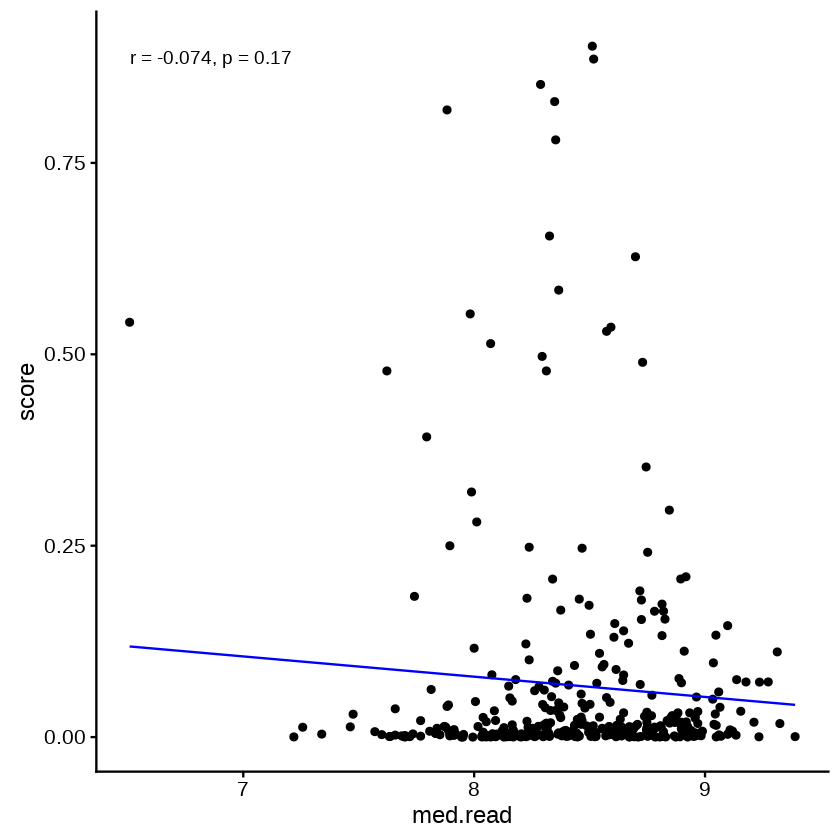

In [410]:
scatter.ACS = data.frame(score = pred.ACS.test.prob$late,
                                 med.read = apply(log2(exprs.fil+1), 2,median)[colnames(exprs.fil) %in% rownames(ACS.pheno)])

ggplot(scatter.ACS, aes(x=med.read, y=score)) + geom_point() +
geom_smooth(method = "lm", col= "blue", se = FALSE, size=0.5) + 
        stat_cor(method = "pearson") 

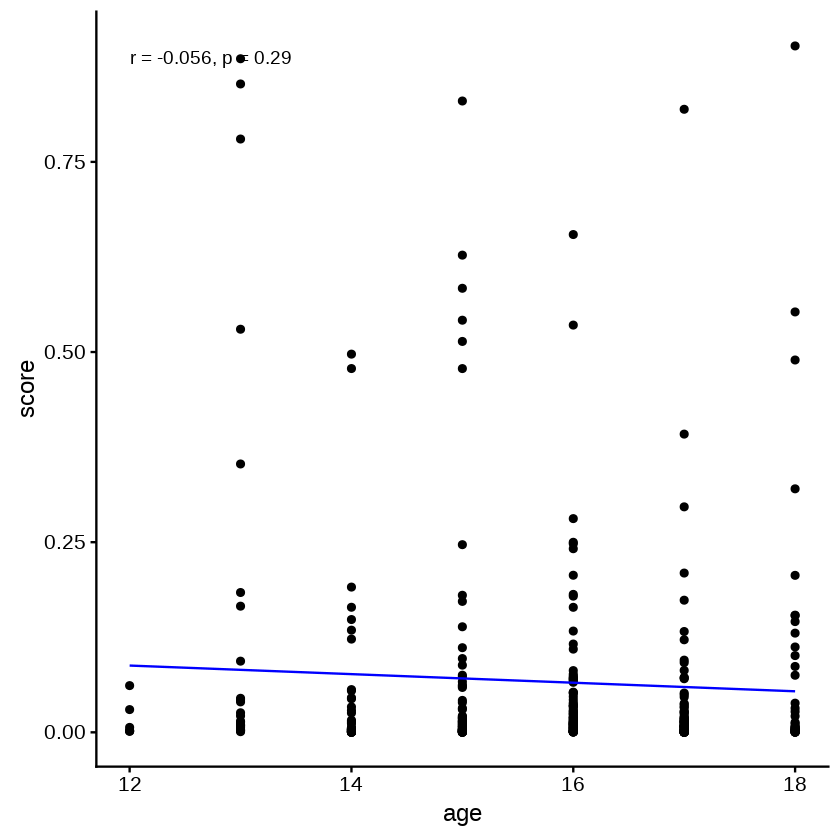

In [411]:
scatter.ACS.age = data.frame(score = pred.ACS.test.prob$late,
                                 age = ACS.pheno$age)

ggplot(scatter.ACS.age, aes(x=age, y=score)) + geom_point() +
geom_smooth(method = "lm", col= "blue", se = FALSE, size=0.5) + 
        stat_cor(method = "pearson") 

##### Second boxplot only - key thoughts here for modifying my results text and presentation

- Yes, my results are definitely right! I should just keep Leicester (and all of that study) separate from ACS, and acknowledge that was not associated with disease in ACS and perhaps put reasons why. It is clear from Leicester that the results are true. The work in microarray adolescents acquiring M.tb infection helped me understand a little more how the data distribution and normalization can affect things. I am just going to keep ACS and UK completely different, especially as they are different age and exposure scenarios. Very different, and I am not going to compare them. Just use AUC. And show the graphs over time for a particular AUC (highest specificity, as much sensitivity as possible). What we want to do there is exclude treatment, provide high predictive value.

- The few gene model may be able to transfer to microarray, if I can separate far before infection to after infection, in anyone.

###### Boxplot with ACS and Garra's studies (models were co-normalized separately)

In [234]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

ACS.pheno.subj = ACS.pheno
Garra.pheno.subj = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
ACS.pheno.subj$patient_id = as.factor(extract_id(ACS.pheno$title))
ACS.pheno.subj = ACS.pheno.subj[!is.na(ACS.pheno.subj$patient_id),]
ACS.exprs.subj = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.subj),]
Garra.exprs.subj = t(Garra.exprs.log[,colnames(Garra.exprs.log) %in% rownames(Garra.pheno.subj)])
pred.ACS.test.prob = predict(human.expose.Sul.ACS.model,  newdata = ACS.exprs.subj[, colnames(ACS.exprs.subj) %in% c(opt.Sul.vars)], type="prob")
pred.Garra.test.prob = predict(human.expose.Sul.Garra.model, newdata = Garra.exprs.subj[, colnames(Garra.exprs.subj) %in% c(opt.Sul.Garra.vars)], type="prob")
ACS.pheno.subj$disease = ACS.pheno.subj$group
Garra.pheno.subj$disease = Garra.pheno.subj$source_name_ch1

All.pheno.subj = data.frame(disease=c(as.character(Garra.pheno.subj$disease), as.character(ACS.pheno.subj$disease)),
                           patient_id = c(as.character(Garra.pheno.subj$patient_id), as.character(ACS.pheno.subj$patient_id)))
late.pred = c(pred.Garra.test.prob$late,pred.ACS.test.prob$late)
All.test.subj.max = tapply(late.pred, All.pheno.subj$patient_id, max)

All.pheno.subj.max = All.pheno.subj[!duplicated(All.pheno.subj[,c('patient_id')]),]#All.pheno.subj[All.pheno.subj$patient_id %in% names(ACS.test.subj.max),]
All.test.subj.tab =data.frame(patient_id=names(All.test.subj.max), late.pred=All.test.subj.max)
all.pred.tab = merge(All.pheno.subj.max, All.test.subj.tab, by.y="patient_id")

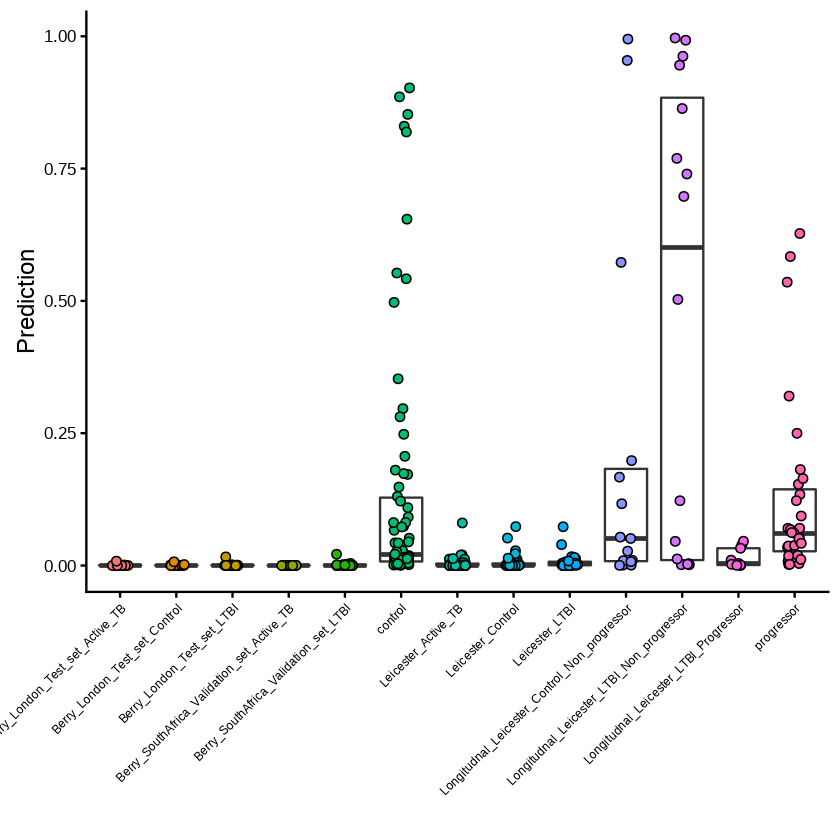

In [235]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(all.pred.tab, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

###### ROC Curve for Leicester LTBI non progressor vs. all others in Singhania et al.

In [237]:
dim(all.pred.tab)

[1] 367   3

In [242]:
Garra.pred.tab = dplyr::filter(all.pred.tab, !(disease %in% c("progressor", "control")))

In [244]:
dim(Garra.pred.tab)

[1] 262   3

[1] "This is the AUC:"
Area under the curve: 0.9113
[1] "This is the AUC p-value:"
[1] 1.788189e-08
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.8476-0.9751 (DeLong)


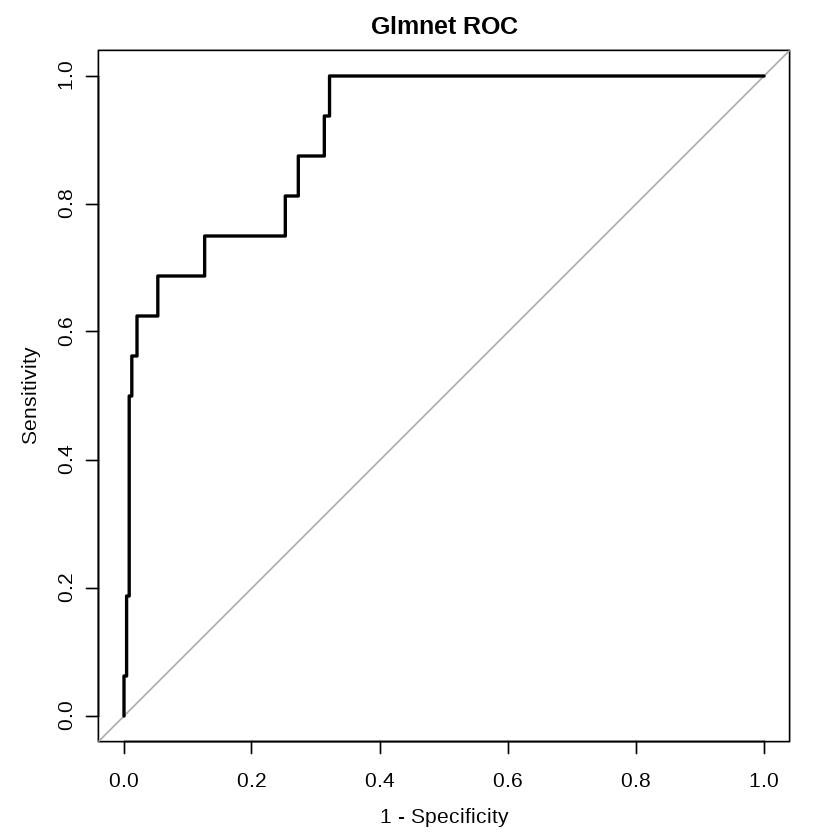

In [246]:
Garra.pred.tab$time.infection = ifelse(Garra.pred.tab$disease %in% c("Berry_London_Test_set_Active_TB",
 "Berry_London_Test_set_LTBI",
 "Berry_London_Test_set_Control",
 "Berry_SouthAfrica_Validation_set_LTBI",
 "Berry_SouthAfrica_Validation_set_Active_TB",
 "Longitudnal_Leicester_Control_Non_progressor","Leicester_Control", "Leicester_LTBI",
 "Leicester_Active_TB",
 "Longitudnal_Leicester_LTBI_Progressor"), "remote","recent")


Garra.test.ROC <- my.roc(Garra.pred.tab$late.pred,
                        Garra.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

In [252]:
long.pred.tab = dplyr::filter(all.pred.tab, disease %in% c( "Longitudnal_Leicester_Control_Non_progressor",
                                                          "Longitudnal_Leicester_LTBI_Non_progressor"))

In [253]:
long.pred.tab

patient_id,disease,late.pred
Patient_012,Longitudnal_Leicester_Control_Non_progressor,0.0007350331
Patient_024,Longitudnal_Leicester_Control_Non_progressor,0.0099780520
Patient_031,Longitudnal_Leicester_Control_Non_progressor,0.0006435627
Patient_033,Longitudnal_Leicester_Control_Non_progressor,0.0511127403
Patient_035,Longitudnal_Leicester_LTBI_Non_progressor,0.0034576789
Patient_039,Longitudnal_Leicester_Control_Non_progressor,0.1168052817
Patient_040,Longitudnal_Leicester_LTBI_Non_progressor,0.0015825604
Patient_041,Longitudnal_Leicester_Control_Non_progressor,0.0091911785
Patient_045,Longitudnal_Leicester_LTBI_Non_progressor,0.0015533364
Patient_047,Longitudnal_Leicester_Control_Non_progressor,0.0073094353


In [254]:
long.pred.tab$time.infection = ifelse(long.pred.tab$disease=="Longitudnal_Leicester_Control_Non_progressor", "remote","recent")

This is a trend, but very low sample size. Probably just state in the text at the above threshold, I get certain percentage. Do just compare the percentages, and the sensitivity and specificity at that thresshold for LTBI vs. control (but really, it is the proportion at that point that I should share). ROC is too much for this low sample size. May want to select a different proportion threshold...

In [256]:
dim(long.pred.tab)

[1] 31  4

[1] "This is the AUC:"
Area under the curve: 0.6458
[1] "This is the AUC p-value:"
[1] 0.08757359
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4424-0.8493 (DeLong)


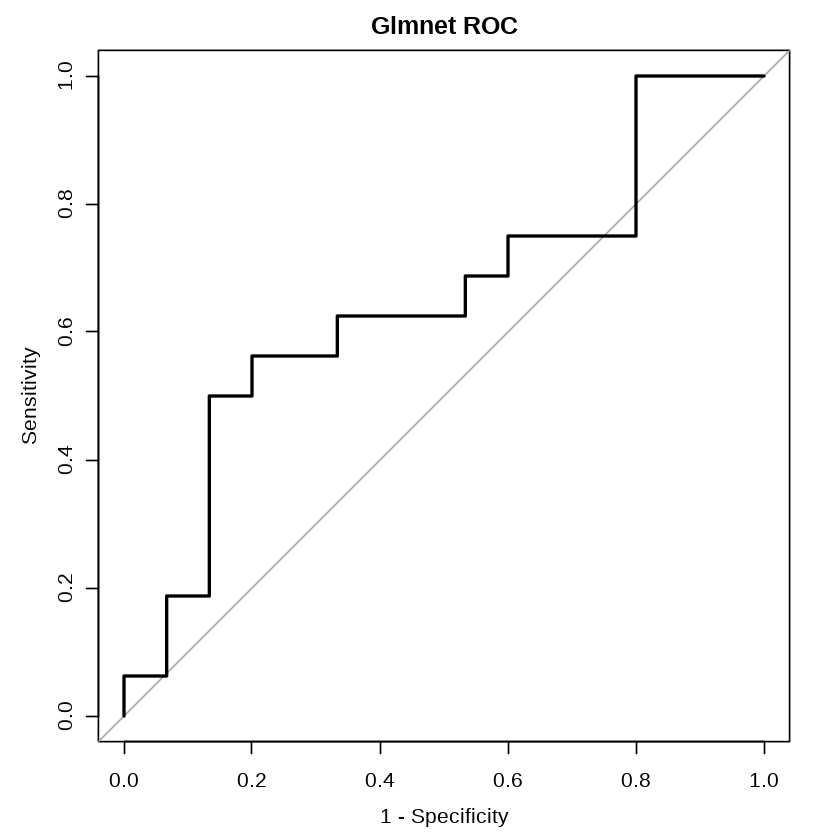

In [255]:
long.test.ROC <- my.roc(long.pred.tab$late.pred,
                        long.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

###### ROC Curve for ACS progressor vs. control

- Maybe doing the odds ratio would be best at an optimum cut-off, even in the other test sets

- I can report this and perhaps explain the low discrimination. It has to have something along the lines of low recent infection percentage by a cut-off. Ideally it would be the few-gene cut-off that I can apply across many datasets.
- I can't really use the training set ROC curve to set a cut-off here. I really need a few gene signature that is more generalizable, where things are preserved for the Garra dataset.

- I don't know if this trend can explain things overall, for why I have trend on the odds ratios elsewhere. I have to be careful about cut-offs etc. I THINK IT IS TIME TO GO TO THE STEP OF REDUCING THE SIGNATURE!

[1] "This is the AUC:"
Area under the curve: 0.5955
[1] "This is the AUC p-value:"
[1] 0.06239884
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.4815-0.7094 (DeLong)


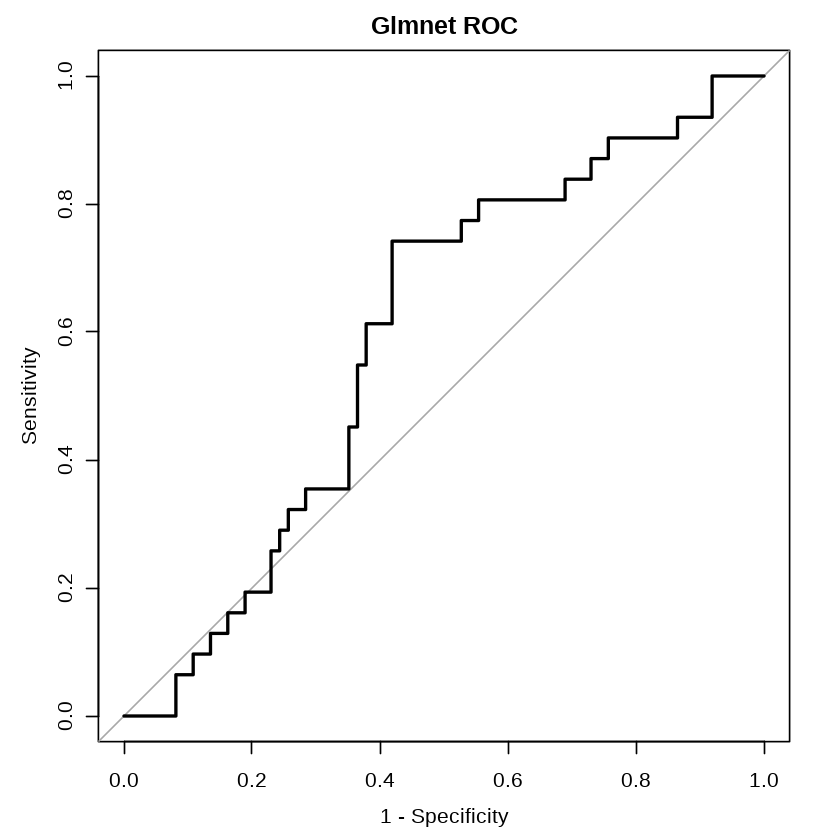

In [257]:
ACS.pred.tab = dplyr::filter(all.pred.tab, disease %in% c("progressor", "control"))

ACS.pred.tab$time.infection = ifelse(ACS.pred.tab$disease=="control", "remote","recent")


ACS.test.ROC <- my.roc(ACS.pred.tab$late.pred,
                        ACS.pred.tab$time.infection,
                     "recent", title="Glmnet ROC")

#### Use GC6-74 0 vs 6 months post-exposure model to predict time since exposure in the Singhania et al cohorts and ACS cohort

In [43]:
pred.ACS.expose = predict(human.expose.Sul.ACS.model, newdata = ACS.exprs.log[, colnames(ACS.exprs.log) %in% c(opt.Sul.vars)])
       
# Proportion of progressor samples with a late time point prediction
prop.ACS.prog.late = sum(pred.ACS.expose == "late" & ACS.pheno$group == "progressor") / sum(ACS.pheno$group == "progressor")
prop.ACS.prog.late     

# Proportion of control samples with a late time point prediction
prop.ACS.ctrl.late = sum(pred.ACS.expose == "late" & ACS.pheno$group == "control") / sum(ACS.pheno$group == "control")
prop.ACS.ctrl.late

[1] 0.04545455

[1] 0.03673469

In [31]:
pred.Garra.expose = predict(human.expose.Sul.Garra.model, newdata = t(Garra.exprs.log)[, rownames(Garra.exprs.log) %in% c(opt.Sul.Garra.vars)])
Garra.pheno$time.pred = pred.Garra.expose

table(Garra.pheno$time.pred, Garra.pheno$source_name_ch1)

Garra.pheno.contact = Garra.pheno[Garra.pheno$source_name_ch1 %in% c("Longitudnal_Leicester_Control_Non_progressor", 
                                                                     "Longitudnal_Leicester_LTBI_Non_progressor"),]
Garra.pheno.contact.ctrl = Garra.pheno[Garra.pheno$source_name_ch1 == "Longitudnal_Leicester_Control_Non_progressor",]
Garra.pheno.contact.ltbi = Garra.pheno[Garra.pheno$source_name_ch1 == "Longitudnal_Leicester_LTBI_Non_progressor",]

Garra.pheno.contact.ltbi.pos = dplyr::filter(Garra.pheno.contact.ltbi, patient_id %in% dplyr::filter(Garra.pheno.contact.ltbi, time.pred == "late")$patient_id)
Garra.pheno.contact.ctrl.pos = dplyr::filter(Garra.pheno.contact.ctrl, patient_id %in% dplyr::filter(Garra.pheno.contact.ctrl, time.pred == "late")$patient_id)

ratio.UK.ctrl = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Berry_London_Test_set_Control", time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Berry_London_Test_set_Control" ))[1]
ratio.UK.SA.ltbi = dim(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Berry_London_Test_set_LTBI", "Berry_SouthAfrica_Validation_set_LTBI"), time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_LTBI", "Berry_SouthAfrica_Validation_set_LTBI") ))[1]
ratio.UK.SA.Leicester.activeTB = dim(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Berry_London_Test_set_Active_TB", "Berry_SouthAfrica_Validation_set_Active_TB", "Leicester_Active_TB"), time.pred == "late" ))[1] /
    dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_Active_TB", "Berry_SouthAfrica_Validation_set_Active_TB", "Leicester_Active_TB") ))[1]
ratio.Leicester.progTB = dim(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Progressor"), time.pred == "late" ))[1] /
    dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Longitudnal_Leicester_LTBI_Progressor") ))[1]

long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)
ratio.Leicester.ctrl = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_Control", !(patient_id %in% long.subj), time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_Control", !(patient_id %in% long.subj),  ))[1]
ratio.Leicester.ltbi = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_LTBI", !(patient_id %in% long.subj), time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_LTBI", !(patient_id %in% long.subj),  ))[1]
ratio.Leicester.long.ctrl = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor", time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor" ))[1]
ratio.Leicester.long.ltbi = dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1] / dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1]


       
        Berry_London_Test_set_Active_TB Berry_London_Test_set_Control
  early                              21                            12
  late                                0                             0
       
        Berry_London_Test_set_LTBI Berry_SouthAfrica_Validation_set_Active_TB
  early                         21                                         16
  late                           0                                          0
       
        Berry_SouthAfrica_Validation_set_LTBI Leicester_Active_TB
  early                                    31                  53
  late                                      0                   0
       
        Leicester_Control Leicester_LTBI
  early                50             49
  late                  0              0
       
        Longitudnal_Leicester_Control_Non_progressor
  early                                           66
  late                                             3
       
        Longitudnal_Leiceste

In [32]:
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Berry_London_Test_set_Control" ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_LTBI", "Berry_SouthAfrica_Validation_set_LTBI") ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Berry_London_Test_set_Active_TB", "Berry_SouthAfrica_Validation_set_Active_TB", "Leicester_Active_TB") ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1  %in% c("Longitudnal_Leicester_LTBI_Progressor") ))[1]

dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_Control", !(patient_id %in% long.subj),  ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Leicester_LTBI", !(patient_id %in% long.subj),  ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor" ))[1]
dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1]

dim(Garra.pheno)

[1] 12

[1] 52

[1] 90

[1] 23

[1] 35

[1] 33

[1] 69

[1] 69

[1] 414  16

In [33]:
ratio.UK.ctrl
ratio.UK.SA.ltbi
ratio.UK.SA.Leicester.activeTB
ratio.Leicester.progTB
ratio.Leicester.ctrl
ratio.Leicester.ltbi
ratio.Leicester.long.ctrl 
ratio.Leicester.long.ltbi 

[1] 0

[1] 0

[1] 0

[1] 0

[1] 0

[1] 0

[1] 0.04347826

[1] 0.173913

In [34]:
cohort = factor(c(
                     "Uninfected Control\n(London)", "LTBI\n(London, South Africa)",
                    "Active TB\n(London, South Africa, Leicester)", "TB Progressor\n(Leicester)",
                    "IGRA- contact\n(Leicester, baseline only)", "IGRA+ contact\n(Leicester, baseline only)",
                    "IGRA- longitudinal contact\n(Leicester)", "IGRA+ longitudinal contact\n(Leicester)", "LTBI nonprogressor\n(ACS)",
                 "LTBI Progressor\n(ACS)") ,
               ordered=TRUE,
               levels = c(
                     "Uninfected Control\n(London)", "LTBI\n(London, South Africa)",
                    "Active TB\n(London, South Africa, Leicester)", "TB Progressor\n(Leicester)",
                    "IGRA- contact\n(Leicester, baseline only)", "IGRA+ contact\n(Leicester, baseline only)",
                    "IGRA- longitudinal contact\n(Leicester)", "IGRA+ longitudinal contact\n(Leicester)", "LTBI nonprogressor\n(ACS)",
                 "LTBI Progressor\n(ACS)" ))

prop.6mo = c( ratio.UK.ctrl, ratio.UK.SA.ltbi, ratio.UK.SA.Leicester.activeTB,
             ratio.Leicester.progTB, ratio.Leicester.ctrl, ratio.Leicester.ltbi, ratio.Leicester.long.ctrl ,
             ratio.Leicester.long.ltbi, prop.ACS.ctrl.late, prop.ACS.prog.late )

recent.contact.validation = data.frame(cohort=cohort, prop = prop.6mo)

#### Figure 4A

In [35]:
fisher.ltbi.ctrl = fisher.test(matrix(c(dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                     dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_Control_Non_progressor", time.pred == "late" ))[1]),
                     
                   nrow=2))
fisher.ltbi.ctrl
fisher.ltbi.ACS.ctrl = fisher.test(matrix(c(dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                     sum(pred.ACS.expose == "late" & ACS.pheno$group == "control"),
                   sum(ACS.pheno$group == "control") - sum(pred.ACS.expose == "late" & ACS.pheno$group == "control")),
                                            nrow=2))
fisher.ltbi.ACS.ctrl    

fisher.ltbi.ACS.prog = fisher.test(matrix(c(dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                   dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor" ))[1] - dim(dplyr::filter(Garra.pheno,source_name_ch1 =="Longitudnal_Leicester_LTBI_Non_progressor", time.pred == "late" ))[1],
                     sum(pred.ACS.expose == "late" & ACS.pheno$group == "progressor"),
                   sum(ACS.pheno$group == "progressor") - sum(pred.ACS.expose == "late" & ACS.pheno$group == "progressor")),
                                            nrow=2))
fisher.ltbi.ACS.prog



	Fisher's Exact Test for Count Data

data:  
p-value = 0.02589
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
  1.158654 26.559013
sample estimates:
odds ratio 
  4.584668 



	Fisher's Exact Test for Count Data

data:  
p-value = 0.0002946
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
  2.009838 15.504257
sample estimates:
odds ratio 
  5.479893 



	Fisher's Exact Test for Count Data

data:  
p-value = 0.007286
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
  1.354233 16.697725
sample estimates:
odds ratio 
  4.382577 


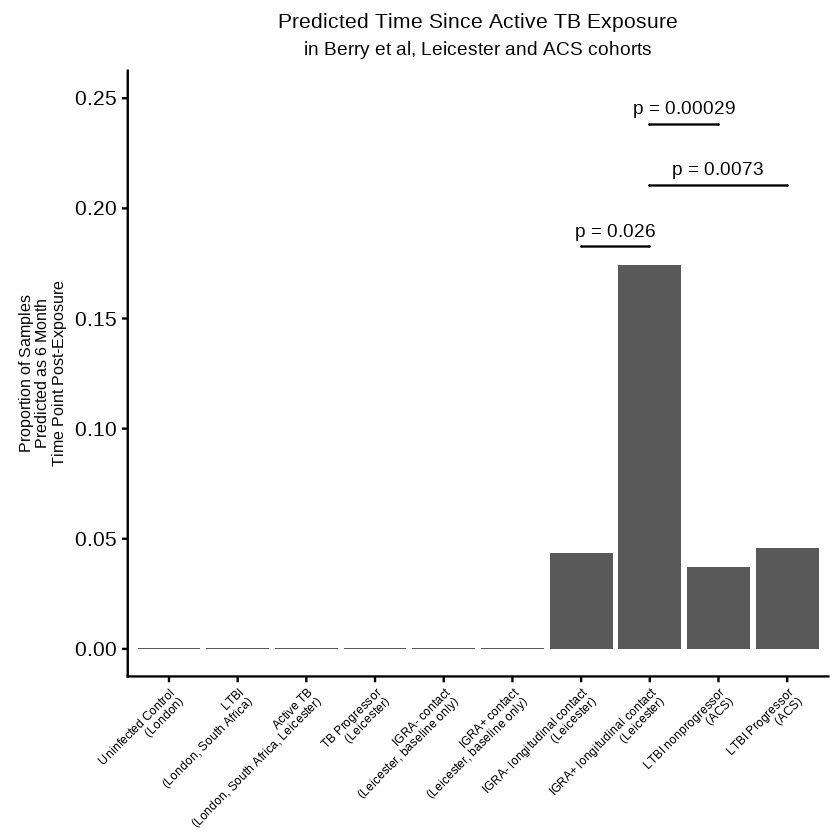

In [36]:
validate.recent.exposure.plot = ggplot(recent.contact.validation, aes(x=cohort, y=prop)) + geom_bar(stat="identity")  +
    labs(y="Proportion of Samples\nPredicted as 6 Month\nTime Point Post-Exposure") +
ggtitle("Predicted Time Since Active TB Exposure", subtitle="in Berry et al, Leicester and ACS cohorts") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                          plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) +
theme(axis.text.x=element_text(angle=45, hjust=1, size = 7)) +
#scale_y_continuous(breaks=c(0.00, 0.1, 0.2, 0.3, 0.4, 0.50, 1.0)) +
theme(axis.title.x=element_blank(),
     axis.title.y = element_text(size=9)) + 
geom_signif(comparisons=list(c("IGRA- longitudinal contact\n(Leicester)", "IGRA+ longitudinal contact\n(Leicester)"),
                             c("IGRA+ longitudinal contact\n(Leicester)", "LTBI Progressor\n(ACS)"),
                             c("IGRA+ longitudinal contact\n(Leicester)", "LTBI nonprogressor\n(ACS)")
                             ),
                               
              annotations = paste("p =", c(signif(fisher.ltbi.ctrl$p.value, 2),
                                           signif(fisher.ltbi.ACS.prog$p.value, 2),
                                           signif(fisher.ltbi.ACS.ctrl$p.value, 2) 
                                           )),# vjust=-0.4, #step_increase = 0.3, vjust = 0.4, tip_length = 0.015, textsize=3.5) 
             step_increase=0.16, tip_length=0, vjust=-0.3) +
ylim(0.0, 0.25)#, y_position=1.075)

validate.recent.exposure.plot

#### Figure 4B

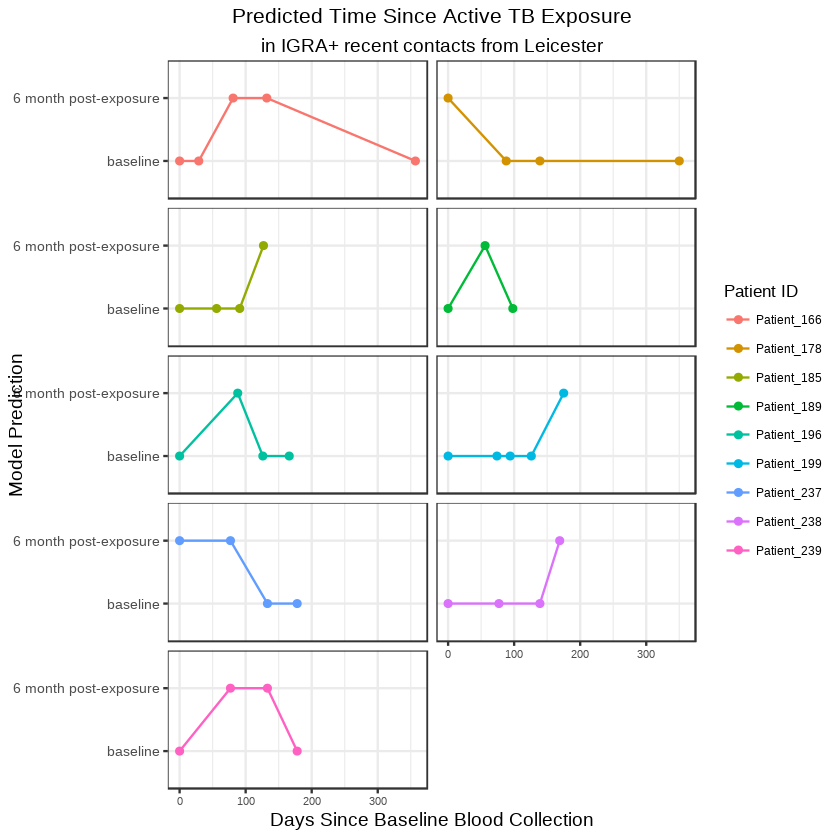

In [37]:
Garra.pheno.contact.ltbi.pos$time.pred.renamed = factor(ifelse(Garra.pheno.contact.ltbi.pos$time.pred == "early", 
                                                               "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure")) 

pred.time.plot.pos = ggplot(Garra.pheno.contact.ltbi.pos, aes(time.since.exposure.days, time.pred.renamed, col=patient_id)) +
geom_point() +
    geom_line(aes(time.since.exposure.days, time.pred.renamed, group=patient_id)) +
    theme_bw() +
labs(x="Days Since Baseline Blood Collection", y="Model Prediction") + labs(color='Patient ID') + facet_wrap(~patient_id, ncol=2) + theme(
  strip.text.x = element_blank(), strip.text.y = element_blank(), strip.background = element_blank()
  
) + ggtitle("Predicted Time Since Active TB Exposure", subtitle="in IGRA+ recent contacts from Leicester") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                          plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) +    # +

theme(axis.text.y = element_text(size=8),
      axis.text.x = element_text(size=6),
     legend.title = element_text(size=10),
     legend.text = element_text(size=7))

pred.time.plot.pos

#### Figure 4C

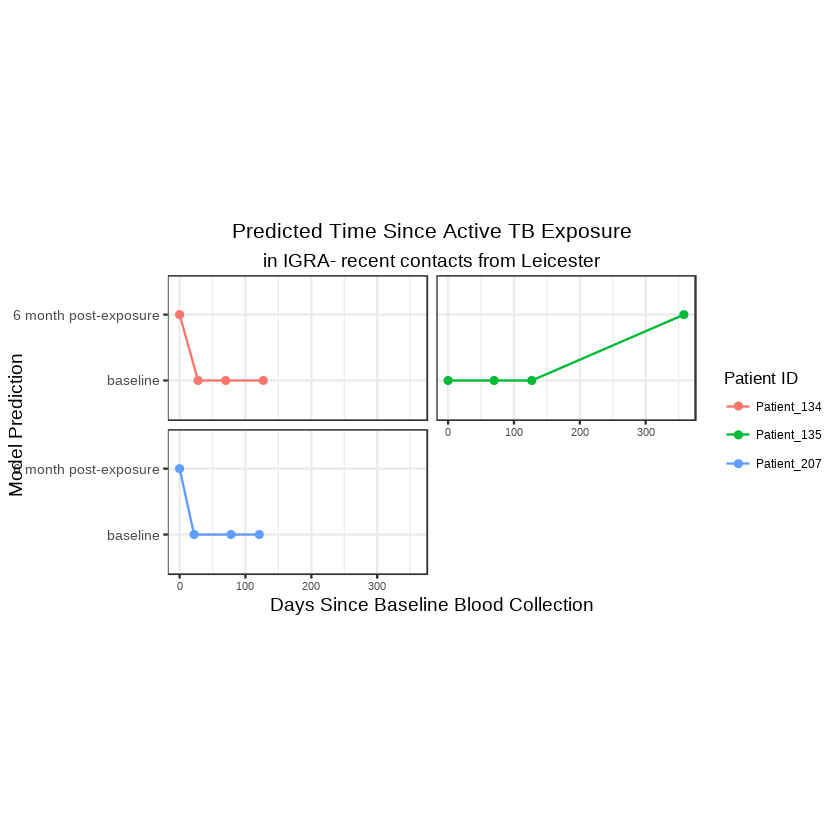

In [38]:
Garra.pheno.contact.ctrl.pos$time.pred.renamed = factor(ifelse(Garra.pheno.contact.ctrl.pos$time.pred == "early", 
                                                               "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure"))

pred.time.plot.pos.ctrl = ggplot(Garra.pheno.contact.ctrl.pos, aes(time.since.exposure.days, time.pred.renamed, col=patient_id)) +
geom_point() +
    geom_line(aes(time.since.exposure.days, time.pred.renamed, group=patient_id)) +
    theme_bw() +
labs(x="Days Since Baseline Blood Collection", y="Model Prediction") + labs(color='Patient ID') + facet_wrap(~patient_id, ncol=2) + theme(
  strip.text.x = element_blank(), strip.text.y = element_blank(), strip.background = element_blank()
  
) + ggtitle("Predicted Time Since Active TB Exposure", subtitle="in IGRA- recent contacts from Leicester") + theme(plot.title = element_text(size=12, face="plain", hjust=0.5), 
                                                                          plot.subtitle=element_text(size=11, face="plain", hjust=0.5)) + #+
coord_fixed(ratio = 100) +
theme(axis.text.y = element_text(size=8),
      axis.text.x = element_text(size=6),
     legend.title = element_text(size=10),
     legend.text = element_text(size=7))


pred.time.plot.pos.ctrl 

#### Figure 4D

Warning message:
“Removed 15 rows containing missing values (geom_point).”

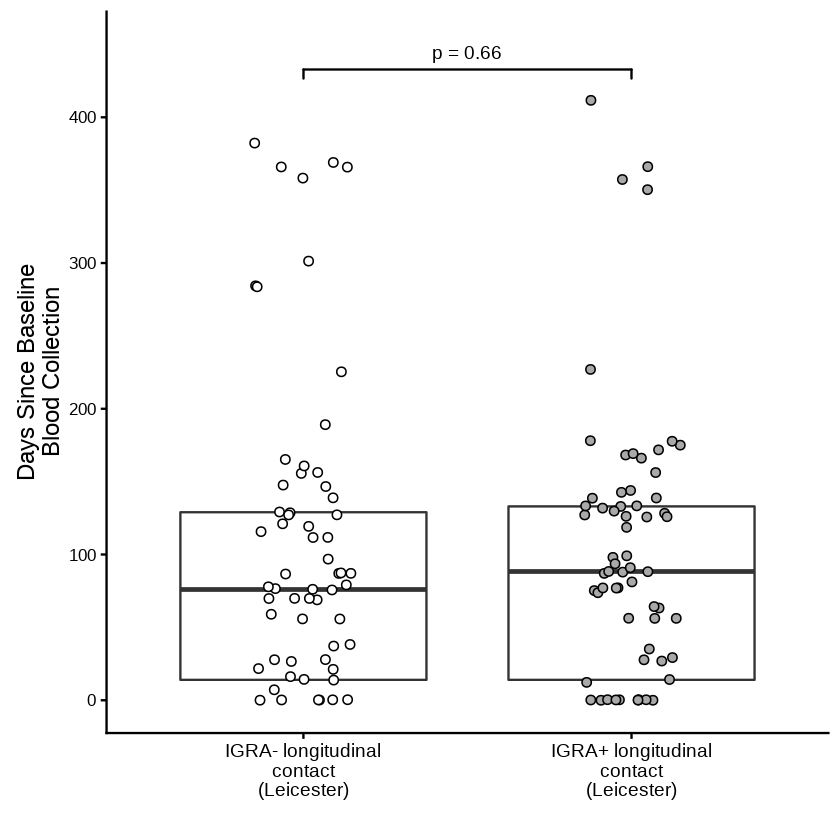

In [39]:
Garra.pheno.contact.gg = droplevels(Garra.pheno.contact )
Garra.pheno.contact.gg$source_name_ch1 = factor(ifelse(Garra.pheno.contact.gg$source_name_ch1 == "Longitudnal_Leicester_Control_Non_progressor",
                                                       "IGRA- longitudinal\ncontact\n(Leicester)", "IGRA+ longitudinal\ncontact\n(Leicester)"),
                                                ordered=TRUE,
                                                        levels = c("IGRA- longitudinal\ncontact\n(Leicester)", "IGRA+ longitudinal\ncontact\n(Leicester)"))
G.pheno.contact.wilc.ltbi.ctrl = wilcox.test(time.since.exposure.days~source_name_ch1,Garra.pheno.contact.gg )

theme.days = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=source_name_ch1), position=position_jitter(0.15), shape=21, size=2),
                 scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Days Since Baseline\nBlood Collection", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

ltbi.ctrl.Leicester.sampling = ggplot(Garra.pheno.contact.gg, aes(x=source_name_ch1, y=time.since.exposure.days)) + theme.days + 
                geom_signif(comparison = list(c("IGRA- longitudinal\ncontact\n(Leicester)", 
                                                                                "IGRA+ longitudinal\ncontact\n(Leicester)")), 
                                                            annotations = c(paste("p =", signif(G.pheno.contact.wilc.ltbi.ctrl$p.value, 2))),
                                                            tip_length=0.015, vjust=-0.3, ) +
ylim(0, 450) + theme(axis.text.x = element_text(size=11))
ltbi.ctrl.Leicester.sampling   


In [40]:
sum(Garra.pheno.contact.gg$source_name_ch1 == "IGRA- longitudinal\ncontact\n(Leicester)" & 
    Garra.pheno.contact.gg$time.since.exposure.days >= 0)
sum(Garra.pheno.contact.gg$source_name_ch1 == "IGRA+ longitudinal\ncontact\n(Leicester)" & 
    Garra.pheno.contact.gg$time.since.exposure.days >= 0)

[1] 69

[1] 69

#### Figure 4E

Warning message in wilcox.test.default(x = c(0, 14, 28, 63, 128, 168, 412, 0, 56, :
“cannot compute exact p-value with ties”Warning message:
“Removed 9 rows containing missing values (geom_point).”

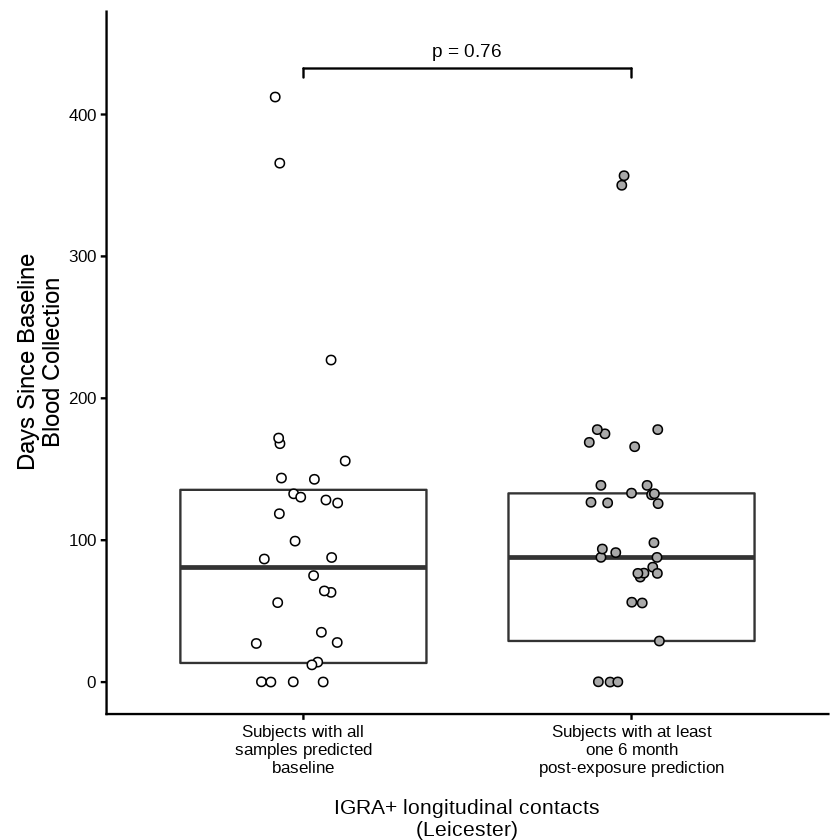

In [41]:
Garra.pheno.contact.ltbi.wpredf = Garra.pheno.contact.ltbi
Garra.pheno.contact.ltbi.wpredf$has6mo = as.factor(ifelse(Garra.pheno.contact.ltbi.wpredf$patient_id %in%
                                                dplyr::filter(Garra.pheno.contact.ltbi, time.pred == "late")$patient_id,
                                               "Subjects with at least\none 6 month\npost-exposure prediction", "Subjects with all\nsamples predicted\nbaseline"))

theme.days.ltbi = theme.days
theme.days.ltbi[2] = list(geom_jitter(aes(fill=has6mo), position=position_jitter(0.15), shape=21, size=2))

wil.ltbi.wpredf = wilcox.test(time.since.exposure.days~has6mo, Garra.pheno.contact.ltbi.wpredf)
ltbi.pos.Leicester.sampling   = ggplot(Garra.pheno.contact.ltbi.wpredf, aes(x=has6mo, y=time.since.exposure.days))  +
theme.days.ltbi +
 
    geom_signif(comparison = list(c("Subjects with at least\none 6 month\npost-exposure prediction", "Subjects with all\nsamples predicted\nbaseline")), 
                                                             annotations = c(paste("p =", signif(wil.ltbi.wpredf$p.value, 2))),
                                                            tip_length=0.015, vjust=-0.3, ) + 
labs(x="IGRA+ longitudinal contacts\n(Leicester)") + theme(axis.title.x = element_text(vjust=-2.5)) +
ylim(0, 450) + theme(axis.text.x = element_text(size=10),
                    axis.title.x = element_text(size=12))

ltbi.pos.Leicester.sampling

In [42]:
sum(Garra.pheno.contact.ltbi.wpredf$has6mo == "Subjects with at least\none 6 month\npost-exposure prediction" & 
    Garra.pheno.contact.ltbi.wpredf$time.since.exposure.days >= 0)
sum(Garra.pheno.contact.ltbi.wpredf$has6mo == "Subjects with all\nsamples predicted\nbaseline" & 
    Garra.pheno.contact.ltbi.wpredf$time.since.exposure.days >= 0)

[1] 37

[1] 32

#### Figure 4F

##### Load Meta-analysis libraries

In [71]:
if (!require("metafor")) {
  install.packages("metafor")
  library("metafor")
}

if (!require("epiR")) {
  install.packages("epiR")
  library("epiR")
}

Loading required package: metafor
Loading 'metafor' package (version 2.0-0). For an overview 
and introduction to the package please type: help(metafor).
Loading required package: epiR
Package epiR 0.9-93 is loaded
Type help(epi.about) for summary information




##### Use GC6-74 0 vs 6 months post-exposure model (from Figure 3C) to predict time since exposure in Ethiopia and Gambia test set

In [76]:
table(human.pheno$site)


AHRI  MRC  SUN 
  48  169  198 

In [72]:
human.pheno.test.all = human.pheno

table(human.pheno.test.all$dataset)

human.pheno.test.all$status = ifelse(human.pheno.test.all$group == "Control", "control", "progressor")
human.pheno.test.all$dataset = as.character(human.pheno.test.all$dataset)
human.pheno.test.all$subjectid = as.character(human.pheno.test.all$subjectid)

for (row in 1:dim(human.pheno.test.all)[1]) {
    if (as.character(human.pheno.test.all[row, "subjectid"]) %in% as.character(human.pheno.6mo$subjectid)) {
        
        human.pheno.test.all[row, "dataset"] = as.character(unique(dplyr::filter(human.pheno.6mo, 
                                                                    subjectid ==human.pheno.test.all[row, "subjectid"])$dataset))
    }
        
}
table(human.pheno.test.all$dataset)
        
human.pheno.test.all$dataset = as.factor(human.pheno.test.all$dataset)
human.pheno.test.all$subjectid = as.factor(human.pheno.test.all$subjectid)

human.pheno.test.all = droplevels(dplyr::filter(human.pheno.test.all,site %in% c("AHRI", "MRC"), dataset == "Test" ))
human.exprs.test.all = t(human.exprs.log[, colnames(human.exprs.log) %in% human.pheno.test.all$code])

dim(human.pheno.test.all)
dim(human.exprs.test.all)


    Test Training 
     182      233 


    Test Training 
     161      254 

[1] 90 10

[1]    90 14842

In [73]:
pred.all.test = predict(human.exposure.model, newdata = human.exprs.test.all[, colnames(human.exprs.test.all) %in% c(optvars)])


table(pred.all.test)

human.pheno.test.all$time.pred = factor(ifelse(pred.all.test == "early", "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure"))
 

table(human.pheno.test.all$status)

human.pheno.test.all.ctrl = droplevels(dplyr::filter(human.pheno.test.all, status == "control"))
human.pheno.test.all.prog = droplevels(dplyr::filter(human.pheno.test.all, status != "control"))

pred.all.test
early  late 
   48    42 


   control progressor 
        70         20 

##### Use GC6-74 0 vs 6 months post-exposure model (from Figure 3C) to predict time since exposure in untouched South Africa dataset (from GC6-74 cohort)

In [74]:
human.pheno.test.SUN = human.pheno

table(human.pheno.test.SUN$dataset)

human.pheno.test.SUN$status = ifelse(human.pheno.test.SUN$group == "Control", "control", "progressor")
human.pheno.test.SUN$dataset = as.character(human.pheno.test.SUN$dataset)
human.pheno.test.SUN$subjectid = as.character(human.pheno.test.SUN$subjectid)

for (row in 1:dim(human.pheno.test.SUN)[1]) {
    if (as.character(human.pheno.test.SUN[row, "subjectid"]) %in% as.character(human.pheno.6mo$subjectid)) {
        
        human.pheno.test.SUN[row, "dataset"] = as.character(unique(dplyr::filter(human.pheno.6mo, 
                                                                    subjectid ==human.pheno.test.SUN[row, "subjectid"])$dataset))
    }
        
}
table(human.pheno.test.SUN$dataset)
        
human.pheno.test.SUN$dataset = as.factor(human.pheno.test.SUN$dataset)
human.pheno.test.SUN$subjectid = as.factor(human.pheno.test.SUN$subjectid)

human.pheno.test.SUN = droplevels(dplyr::filter(human.pheno.test.SUN,!(site %in% c("AHRI", "MRC"))))
human.exprs.test.SUN = t(human.exprs.log[, colnames(human.exprs.log) %in% human.pheno.test.SUN$code])

dim(human.pheno.test.SUN)
dim(human.exprs.test.SUN)


    Test Training 
     182      233 


    Test Training 
     161      254 

[1] 198  10

[1]   198 14842

In [75]:
pred.SUN.test = predict(human.exposure.model, newdata = human.exprs.test.SUN[, colnames(human.exprs.test.SUN) %in% c(optvars)])


table(pred.SUN.test)

human.pheno.test.SUN$time.pred = factor(ifelse(pred.SUN.test == "early", "baseline", "6 month post-exposure"),
                                                        ordered=TRUE,
                                                        levels = c("baseline" , "6 month post-exposure"))
 

table(human.pheno.test.SUN$status)

human.pheno.test.SUN.ctrl = droplevels(dplyr::filter(human.pheno.test.SUN, status == "control"))
human.pheno.test.SUN.prog = droplevels(dplyr::filter(human.pheno.test.SUN, status != "control"))

pred.SUN.test
early  late 
  168    30 


   control progressor 
       155         43 

##### Perform Meta-analysis to generate Forest plot of Figure 4F

In [84]:
prog.6mo.Eth.Gam = sum(tapply(human.pheno.test.all.prog$time.pred, human.pheno.test.all.prog$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
prog.Eth.Gam.subj = length(unique(human.pheno.test.all.prog$subjectid))
prog.6mo.Eth.Gam
prog.Eth.Gam.subj
7 / 11

ctrl.6mo.Eth.Gam = sum(tapply(human.pheno.test.all.ctrl$time.pred, human.pheno.test.all.ctrl$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
ctrl.Eth.Gam.subj = length(unique(human.pheno.test.all.ctrl$subjectid))
ctrl.6mo.Eth.Gam
ctrl.Eth.Gam.subj
26 / 51


[1] 7

[1] 11

[1] 0.6363636

[1] 26

[1] 51

[1] 0.5098039

In [85]:
prog.6mo.SUN = sum(tapply(human.pheno.test.SUN.prog$time.pred, human.pheno.test.SUN.prog$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
prog.6mo.SUN
prog.SUN.subj = length(unique(human.pheno.test.SUN.prog$subjectid))
prog.SUN.subj

9 / 39

ctrl.6mo.SUN = sum(tapply(human.pheno.test.SUN.ctrl$time.pred, human.pheno.test.SUN.ctrl$subjectid, function(x) {sum(x=="6 month post-exposure") > 0}))
ctrl.6mo.SUN
ctrl.SUN.subj = length(unique(human.pheno.test.SUN.ctrl$subjectid))
ctrl.SUN.subj
20 / 141


[1] 9

[1] 39

[1] 0.2307692

[1] 20

[1] 141

[1] 0.141844

In [86]:
data.meta = data.frame(study=c("Sun","Eth.Gam"), 
                       prog.6mo = c(prog.6mo.SUN, prog.6mo.Eth.Gam), 
                       prog.base = c(prog.SUN.subj-prog.6mo.SUN, 
                                     prog.Eth.Gam.subj-prog.6mo.Eth.Gam),
                      ctrl.6mo = c(ctrl.6mo.SUN, ctrl.6mo.Eth.Gam), 
                       ctrl.base = c(ctrl.SUN.subj-ctrl.6mo.SUN,
                                     ctrl.Eth.Gam.subj-ctrl.6mo.Eth.Gam))
data.meta
dat1 = escalc(measure="OR", ai=prog.6mo, bi=prog.base, ci=ctrl.6mo, di=ctrl.base, data=data.meta)
dat1
res1 = rma(yi, vi, data=dat1,slab=c("South Africa\n(all subjects)", "Gambia and Ethiopia\n(test set)"))
res1
predict(res1, transf=exp, digits=2)

study,prog.6mo,prog.base,ctrl.6mo,ctrl.base
Sun,9,30,20,121
Eth.Gam,7,4,26,25


study,prog.6mo,prog.base,ctrl.6mo,ctrl.base,yi,vi
Sun,9,30,20,121,0.5960855,0.2027089
Eth.Gam,7,4,26,25,0.5203951,0.4713187



Random-Effects Model (k = 2; tau^2 estimator: REML)

tau^2 (estimated amount of total heterogeneity): 0 (SE = 0.4766)
tau (square root of estimated tau^2 value):      0
I^2 (total heterogeneity / total variability):   0.00%
H^2 (total variability / sampling variability):  1.00

Test for Heterogeneity: 
Q(df = 1) = 0.0085, p-val = 0.9265

Model Results:

estimate      se    zval    pval    ci.lb   ci.ub   
  0.5733  0.3765  1.5228  0.1278  -0.1646  1.3112   

---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1 


 pred ci.lb ci.ub cr.lb cr.ub
 1.77  0.85  3.71  0.85  3.71

One-sided p-value from epiR

In [94]:
epi.obj = epi.dsl(data.meta$prog.6mo, data.meta$prog.6mo + data.meta$prog.base,
                  data.meta$ctrl.6mo, data.meta$ctrl.6mo + data.meta$ctrl.base, data.meta$study, 
                  alternative=c("greater"))
print(epi.obj$effect['p.value'])
epi.obj

Warning message in sqrt((1/(2 * (k - 2))) * (1 - (1/(3 * (k - 2)^2)))):
“NaNs produced”

   p.value 
0.06390397 


$OR
       est     lower    upper
1 1.815000 0.7509974 4.386467
2 1.682692 0.4381595 6.462152

$OR.summary
       est     lower    upper
1 1.774151 0.8482438 3.710741

$weights
   inv.var      dsl
1 4.933182 4.933182
2 2.121707 2.121707

$heterogeneity
          Q          df     p.value 
0.008502213 1.000000000 0.926533222 

$Hsq
          est lower upper
1 0.008502213   NaN   NaN

$Isq
        est lower upper
1 -11661.64   NaN   NaN

$tau.sq
[1] 0

$effect
         z    p.value 
1.52280327 0.06390397

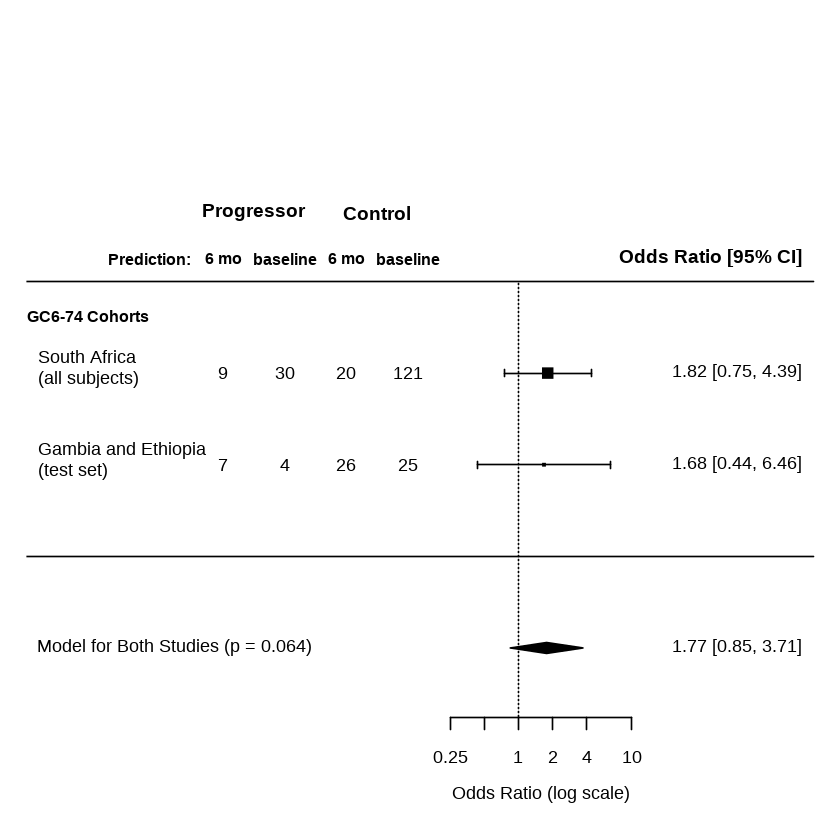

In [87]:
data.txt = 0.85
x.raw = c(-6,-4.75,-3.5,-2.25)
forest(res1,  xlim=c(-10, 6), atransf=exp, at=log(c(0.25, 0.5, 1, 2, 4, 10)),
      ilab = cbind(data.meta$prog.6mo, data.meta$prog.base, data.meta$ctrl.6mo, data.meta$ctrl.base),
      ilab.xpos=x.raw, cex=data.txt, mlab="")

op = par(cex=0.75, font=4)

par(font=2)
text(-8.75, 2.625, c("GC6-74 Cohorts"), cex=1.0)

pred.txt = 1.0
text(x.raw, 3.25, c("6 mo", "baseline", "6 mo", "baseline"), cex=pred.txt)
text(-7.5, 3.25, c("Prediction:"), cex=pred.txt)
text(c(mean(x.raw[1:2]),mean(x.raw[3:4])),     3.75, c("Progressor", "Control"), cex=1.25)

text(-9, )
text(6,                  3.25, "Odds Ratio [95% CI]", pos=2, cex=1.25)

par(op)

text(-7, -1.0 , cex=data.txt, bquote(paste("Model for Both Studies (p = ", 0.064, ")", sep="")))

## Figure 5 Human Analysis (Grand Challenges 6-74 cohort)

- This code reproduces the cell-type analysis of Figure 5, showing that "Time since TB exposure in humans is associated with alteration in CD4+ T cell proportion"
- The Ingenuity Pathway Analysis for Figure 5E is excluded (commercial software)

### Load and Install Required Libraries

- If the whole notebook is run in one sitting, loading MetaIntegrator may give a `maximal number of DLLs reached...` error. In this case, simply restart the notebook and run this Figure 5 code alone. It does not depend upon any other code in the notebook.

In [ ]:
path="."  # this is the TB repository folder

In [92]:
if (!require("preprocessCore")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("preprocessCore")
  library("preprocessCore")
}

source("https://bioconductor.org/biocLite.R")
if (!require("Biobase")) {
  biocLite("Biobase")
  library("Biobase")
}

if (!require("GEOquery")) {
  biocLite("GEOquery")
  library("GEOquery")
}

if (!require("ggplot2")) {
  install.packages("ggplot2")
  library("ggplot2")
}

if (!require("glmnet")) {
  install.packages("glmnet")
  library("glmnet")
}

if (!require("caret")) {
  install.packages("caret")
  library("caret")
}
if (!require("dplyr")) {
  install.packages("dplyr")
  library("dplyr")
}

if (!require("ggsignif")) {
  install.packages("ggsignif")
  library("ggsignif")
}

if (!require("doParallel")) {
  install.packages("doParallel")
  library("doParallel")
}

if (!require("cowplot")) {
  install.packages("cowplot")
  library("cowplot")
}

if (!require("pROC")) {
    # pROC 1.12.0 is required, and may not be the default installation:
    packageUrl<- "https://cran.r-project.org/src/contrib/Archive/pROC/pROC_1.12.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("pROC")
}

if (!require("lme4")) {
  install.packages("lme4")
  library("lme4")
}

if (!require("lmerTest")) {
  install.packages("lmerTest")
  library("lmerTest")
}

if (!require("MetaIntegrator")) {
    
  # First install several dependencies required by MetaIntegrator 2.0.0
    if (!require("multtest")) {
      biocLite("multtest")
      library("multtest")
    }

    if (!require("GEOmetadb")) {
      biocLite("GEOmetadb")
      library("GEOmetadb")
    }
    
    if (!require("biomaRt")) {
      biocLite("biomaRt")
      library("biomaRt")
    }
    
    install.packages(c("ggpubr", "ROCR", "pracma", "COCONUT" , "Metrics", "manhattanly", "snplist", "DT", "pheatmap", "HGNChelper"))
    
    # Now install MetaIntegrator. Version 2.0.0 is required to use ImmunoStates
    packageUrl = "https://cran.r-project.org/src/contrib/MetaIntegrator_2.0.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("MetaIntegrator")
}

Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install
Loading required package: lmerTest

Attaching package: ‘lmerTest’

The following object is masked from ‘package:lme4’:

    lmer

The following object is masked from ‘package:stats’:

    step



### Reproduce Analysis for Figures 5A-D

#### Load the data and perform cell-type deconvolution using Immunostates and linear mixed model analyses

In [65]:
source("utils_submission.R")
source("utils_immunoStates.R")

In [69]:
Sul.path = paste(path, "/data/GSE94438", sep="")

Sul.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

Sul.pheno = filter.human.pheno(pData(Sul.pheno.set))

Sul.exprs = read.table(paste(Sul.path, "gene_count_GSE94438.tsv", sep="/"), header=T, row.names=1)
Sul.exprs = filter.HUMAN.exprs(Sul.exprs, Sul.pheno)

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

In [ ]:
Sul.pheno.6mo = Sul.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new Sul.pheno

AHRI.subj = unique(dplyr::filter(Sul.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
Sul.pheno.6mo$dataset[Sul.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"


# filter pheno and expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

Sul.pheno.6mo = droplevels(Sul.pheno.6mo[Sul.pheno.6mo$site %in% c("AHRI", "MRC") & Sul.pheno.6mo$time.from.exposure.months %in% c(0, 6),])

In [99]:
# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(Sul.exprs <= 5, 1, mean) <= 0.5
Sul.exprs.qn = as.data.frame(normalize.quantiles(as.matrix(Sul.exprs[exprs.j.keep,])))
colnames(Sul.exprs.qn) = colnames(Sul.exprs[exprs.j.keep,])
rownames(Sul.exprs.qn) = rownames(Sul.exprs[exprs.j.keep,])

Sul.decov.qn = iSdeconvolution(immunoStatesMatrix, Sul.exprs.qn)

Sul.decov.qn.data = as.data.frame(Sul.decov.qn[,!(colnames(Sul.decov.qn) %in% c('P-value', 'Correlation', 'RMSE')) ])

summary(Sul.decov.qn.data)

# Make everything on the percent scale.
Sul.decov.qn.data = Sul.decov.qn.data * 100

cells.Sul.6mo = data.frame(Sul.decov.qn.data[row.names(Sul.decov.qn.data) %in% 
                                                  rownames(Sul.pheno.6mo),] , 
                                time.from.exposure.months = Sul.pheno.6mo$time.from.exposure.months,
                               patient = Sul.pheno.6mo$subjectid,
                              site = Sul.pheno.6mo$site)
cells.Sul.18mo = data.frame(Sul.decov.qn.data[row.names(Sul.decov.qn.data) %in% 
                                                  rownames(Sul.pheno[Sul.pheno$time.from.exposure.months != 6,]),] , 
                                time.from.exposure.months = Sul.pheno[Sul.pheno$time.from.exposure.months != 6,]$time.from.exposure.months,
                               patient = Sul.pheno[Sul.pheno$time.from.exposure.months != 6,]$subjectid,
                           site = Sul.pheno[Sul.pheno$time.from.exposure.months != 6,]$site)

cells.Sul.6mo$NK_cell = cells.Sul.6mo$CD56bright_natural_killer_cell + cells.Sul.6mo$CD56dim_natural_killer_cell
cells.Sul.18mo$NK_cell = cells.Sul.18mo$CD56bright_natural_killer_cell + cells.Sul.18mo$CD56dim_natural_killer_cell

 CD14_positive_monocyte CD16_positive_monocyte CD4_positive_alpha_beta_T_cell
 Min.   :0.00000        Min.   :0.00000        Min.   :0.0287                
 1st Qu.:0.01157        1st Qu.:0.09289        1st Qu.:0.2290                
 Median :0.03401        Median :0.11809        Median :0.2811                
 Mean   :0.04243        Mean   :0.11914        Mean   :0.2729                
 3rd Qu.:0.06088        3rd Qu.:0.14111        3rd Qu.:0.3155                
 Max.   :0.22496        Max.   :0.27652        Max.   :0.4300                
 CD56bright_natural_killer_cell CD56dim_natural_killer_cell
 Min.   :0.001581               Min.   :0.0000000          
 1st Qu.:0.173857               1st Qu.:0.0000000          
 Median :0.201391               Median :0.0000000          
 Mean   :0.196017               Mean   :0.0001228          
 3rd Qu.:0.227082               3rd Qu.:0.0000000          
 Max.   :0.302639               Max.   :0.0305743          
 CD8_positive_alpha_beta_T_cell   

In [100]:
table(cells.Sul.6mo$time.from.exposure.months)
table(cells.Sul.18mo$time.from.exposure.months)


  0   6 
104  79 


  0  18 
272  64 

In [101]:
CD4_LMM_6mo = lmer(CD4_positive_alpha_beta_T_cell ~ time.from.exposure.months + site + (0+time.from.exposure.months|site) + (1|patient) + (0 + time.from.exposure.months|patient), cells.Sul.6mo)
summary(CD4_LMM_6mo)
lmerTest::anova(CD4_LMM_6mo)

NK_LMM_6mo = lmer(NK_cell ~ time.from.exposure.months + (1|patient) + site + (0+time.from.exposure.months|site) + (0 + time.from.exposure.months|patient), cells.Sul.6mo)
summary(NK_LMM_6mo)
lmerTest::anova(NK_LMM_6mo)

CD4_LMM_18 = lmer(CD4_positive_alpha_beta_T_cell ~ time.from.exposure.months + site + (0+time.from.exposure.months|site) +
               (1|patient) + (0 + time.from.exposure.months|patient), 
               cells.Sul.18mo)
summary(CD4_LMM_18)
lmerTest::anova(CD4_LMM_18)

NK_LMM_18 = lmer(NK_cell ~ time.from.exposure.months + site + (0+time.from.exposure.months|site) +
               (1|patient) + (0 + time.from.exposure.months|patient), 
               cells.Sul.18mo)
summary(NK_LMM_18)
lmerTest::anova(NK_LMM_18)

Linear mixed model fit by REML t-tests use Satterthwaite approximations to
  degrees of freedom [lmerMod]
Formula: CD4_positive_alpha_beta_T_cell ~ time.from.exposure.months +  
    site + (0 + time.from.exposure.months | site) + (1 | patient) +  
    (0 + time.from.exposure.months | patient)
   Data: cells.Sul.6mo

REML criterion at convergence: 1116

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-2.27082 -0.46741  0.01641  0.53162  2.23743 

Random effects:
 Groups    Name                      Variance Std.Dev.
 patient   time.from.exposure.months  0.00    0.000   
 patient.1 (Intercept)               13.39    3.659   
 site      time.from.exposure.months  0.00    0.000   
 Residual                            14.39    3.793   
Number of obs: 183, groups:  patient, 148; site, 2

Fixed effects:
                          Estimate Std. Error       df t value Pr(>|t|)    
(Intercept)                27.7925     0.9254 146.3400  30.034  < 2e-16 ***
time.from.exposure.mont

,Sum Sq,Mean Sq,NumDF,DenDF,F.value,Pr(>F)
time.from.exposure.months,106.94330,106.94330,1,79.29353,7.432645,0.007881019
site,26.23795,26.23795,1,131.72634,1.823558,0.179205805


Linear mixed model fit by REML t-tests use Satterthwaite approximations to
  degrees of freedom [lmerMod]
Formula: NK_cell ~ time.from.exposure.months + (1 | patient) + site +  
    (0 + time.from.exposure.months | site) + (0 + time.from.exposure.months |  
    patient)
   Data: cells.Sul.6mo

REML criterion at convergence: 1116

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.6040 -0.3983  0.1381  0.5411  1.5027 

Random effects:
 Groups    Name                      Variance Std.Dev.
 patient   time.from.exposure.months  0.00    0.000   
 patient.1 (Intercept)               10.10    3.178   
 site      time.from.exposure.months  0.00    0.000   
 Residual                            17.07    4.132   
Number of obs: 183, groups:  patient, 148; site, 2

Fixed effects:
                           Estimate Std. Error        df t value Pr(>|t|)    
(Intercept)                17.85846    0.90868 157.45000  19.653   <2e-16 ***
time.from.exposure.months  -0.01896    0.11717 112.1

,Sum Sq,Mean Sq,NumDF,DenDF,F.value,Pr(>F)
time.from.exposure.months,0.4467516,0.4467516,1,112.1093,0.02617279,0.8717703
site,41.2551393,41.2551393,1,145.3133,2.41691831,0.1222061


Linear mixed model fit by REML t-tests use Satterthwaite approximations to
  degrees of freedom [lmerMod]
Formula: CD4_positive_alpha_beta_T_cell ~ time.from.exposure.months +  
    site + (0 + time.from.exposure.months | site) + (1 | patient) +  
    (0 + time.from.exposure.months | patient)
   Data: cells.Sul.18mo

REML criterion at convergence: 2133.7

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.1729 -0.5151  0.0875  0.5988  2.2991 

Random effects:
 Groups    Name                      Variance Std.Dev.
 patient   time.from.exposure.months  0.01779 0.1334  
 patient.1 (Intercept)                9.69878 3.1143  
 site      time.from.exposure.months  0.00000 0.0000  
 Residual                            23.31752 4.8288  
Number of obs: 336, groups:  patient, 301; site, 3

Fixed effects:
                           Estimate Std. Error        df t value Pr(>|t|)    
(Intercept)                27.61383    1.04539 319.20000  26.415  < 2e-16 ***
time.from.exposure.months 

,Sum Sq,Mean Sq,NumDF,DenDF,F.value,Pr(>F)
time.from.exposure.months,38.86183,38.86183,1,80.49473,1.666637,2.004050e-01
site,1006.21490,503.10745,2,302.18827,21.576377,1.741754e-09


Linear mixed model fit by REML t-tests use Satterthwaite approximations to
  degrees of freedom [lmerMod]
Formula: 
NK_cell ~ time.from.exposure.months + site + (0 + time.from.exposure.months |  
    site) + (1 | patient) + (0 + time.from.exposure.months |      patient)
   Data: cells.Sul.18mo

REML criterion at convergence: 1950.4

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-3.03343 -0.46025  0.04702  0.49411  1.70801 

Random effects:
 Groups    Name                      Variance Std.Dev.
 patient   time.from.exposure.months  0.02905 0.1705  
 patient.1 (Intercept)                7.80758 2.7942  
 site      time.from.exposure.months  0.00000 0.0000  
 Residual                            10.40439 3.2256  
Number of obs: 336, groups:  patient, 301; site, 3

Fixed effects:
                           Estimate Std. Error        df t value Pr(>|t|)    
(Intercept)                17.96554    0.79393 314.76000  22.629  < 2e-16 ***
time.from.exposure.months  -0.06091    

,Sum Sq,Mean Sq,NumDF,DenDF,F.value,Pr(>F)
time.from.exposure.months,28.25535,28.25535,1,72.72003,2.715706,0.103679407
site,126.87598,63.43799,2,301.19221,6.097216,0.002536373


#### Figure 5A

In [76]:
testTheme = list(geom_boxplot(outlier.shape=NA, coef=0),
                   geom_jitter(aes(fill=factor(time.from.exposure.months)), position=position_jitter(0.15), shape=21, size=2),
                   scale_fill_manual(values=c("white", "darkgrey")),
                   theme_classic(),
                   labs(x="Months from Baseline"),
                   theme(plot.title = element_text(hjust = 0.5, size=14, face="bold")),
                   theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black"),
                         axis.title=element_text(size=12)),
                   theme(legend.position="none"))

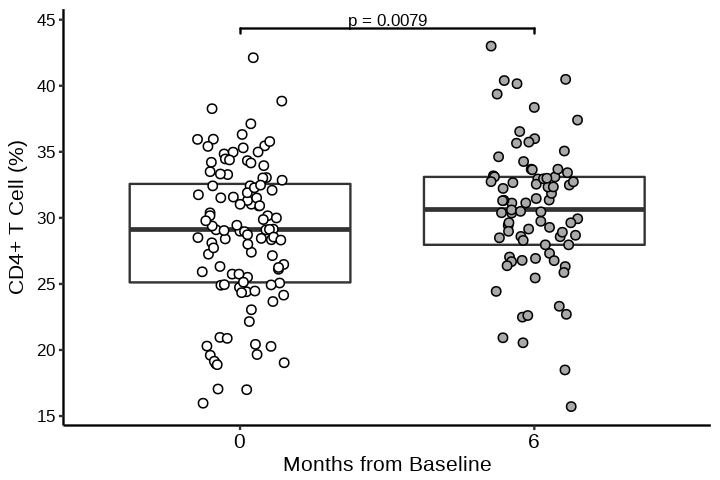

In [102]:
CD4_cell_6mo = ggplot(cells.Sul.6mo , aes(x=as.factor(time.from.exposure.months), y=CD4_positive_alpha_beta_T_cell)) + testTheme +
labs(y="CD4+ T Cell (%)") + geom_signif(comparisons=list(c("0", "6")),
                                                       annotations = c("p = 0.0079"),
                                                       step_increase = 0.09, vjust = 0.14,
                               tip_length = 0.015, textsize=3.5)
CD4_cell_6mo

#### Figure 5B

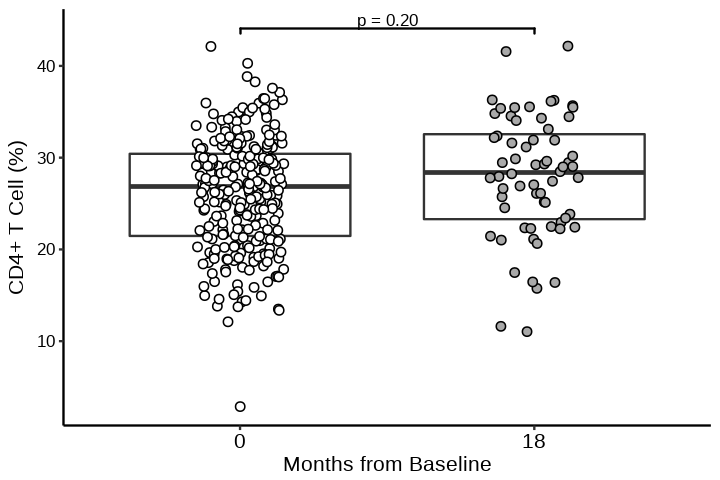

In [103]:
CD4_cell_18mo = ggplot(cells.Sul.18mo , aes(x=as.factor(time.from.exposure.months), y=CD4_positive_alpha_beta_T_cell)) + testTheme +
labs(y="CD4+ T Cell (%)") + geom_signif(comparisons=list(c("0", "18")),
                                                       annotations = c("p = 0.20"),
                                                       step_increase = 0.09, vjust = 0.14,
                               tip_length = 0.015, textsize=3.5)

CD4_cell_18mo

#### Figure 5C

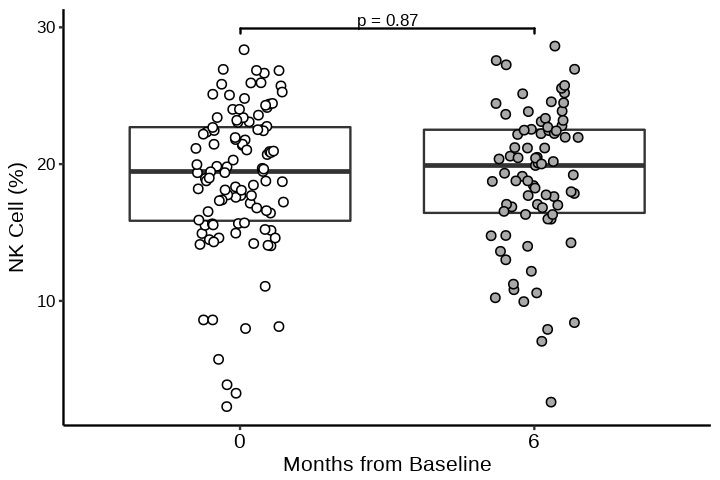

In [104]:
NK_cell_6mo = ggplot(cells.Sul.6mo , aes(x=as.factor(time.from.exposure.months), y=NK_cell)) + testTheme +
labs(y="NK Cell (%)") + geom_signif(comparisons=list(c("0", "6")),
                                                       annotations = c("p = 0.87"),
                                                       step_increase = 0.09, vjust = 0.14,
                               tip_length = 0.015, textsize=3.5)

NK_cell_6mo


#### Figure 5D

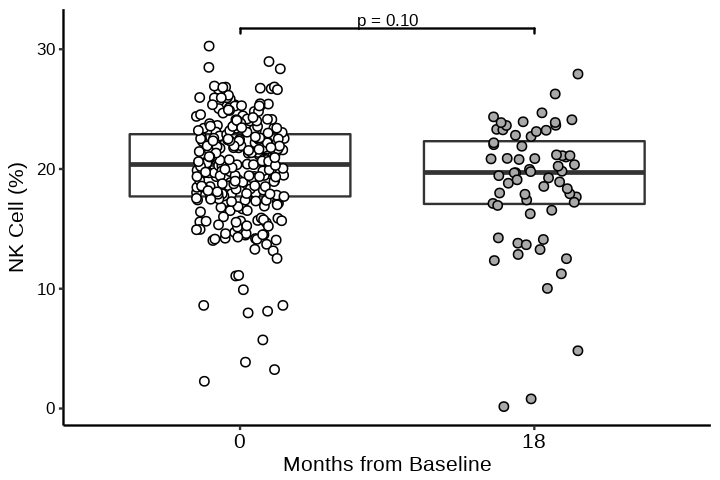

In [105]:
NK_cell_18mo = ggplot(cells.Sul.18mo , aes(x=as.factor(time.from.exposure.months), y=NK_cell)) + testTheme +
labs(y="NK Cell (%)") + geom_signif(comparisons=list(c("0", "18")),
                                                       annotations = c("p = 0.10"),
                                                       step_increase = 0.09, vjust = 0.14,
                               tip_length = 0.015, textsize=3.5)

NK_cell_18mo

## Figure 6 Make the signature more parsimonious

Comparing baseline vs. 6 mo. time point
- Try to use the best 3 upregulated genes
- And the 3 best downregulated genes

### Load libraries

In [258]:
if (!require("preprocessCore")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("preprocessCore")
  library("preprocessCore")
}

source("https://bioconductor.org/biocLite.R")
if (!require("Biobase")) {
  biocLite("Biobase")
  library("Biobase")
}
if (!require("GEOquery")) {
  biocLite("GEOquery")
  library("GEOquery")
}

if (!require("ggplot2")) {
  install.packages("ggplot2")
  library("ggplot2")
}

if (!require("glmnet")) {
  install.packages("glmnet")
  library("glmnet")
}

if (!require("caret")) {
  install.packages("caret")
  library("caret")
}
if (!require("dplyr")) {
  install.packages("dplyr")
  library("dplyr")
}

if (!require("ggsignif")) {
  install.packages("ggsignif")
  library("ggsignif")
}

if (!require("doParallel")) {
  install.packages("doParallel")
  library("doParallel")
}

if (!require("cowplot")) {
  install.packages("cowplot")
  library("cowplot")
}

if (!require("e1071")) {
  install.packages("e1071")
  library("e1071")
}

if (!require("pROC")) {
    # pROC 1.12.0 is required, and may not be the default installation:
    packageUrl<- "https://cran.r-project.org/src/contrib/Archive/pROC/pROC_1.12.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("pROC")
}

if (!require("MetaIntegrator")) {
    
  # First install several dependencies required by MetaIntegrator 2.0.0
    if (!require("multtest")) {
      biocLite("multtest")
      library("multtest")
    }

    if (!require("GEOmetadb")) {
      biocLite("GEOmetadb")
      library("GEOmetadb")
    }
    
    if (!require("biomaRt")) {
      biocLite("biomaRt")
      library("biomaRt")
    }
    
    install.packages(c("ggpubr", "ROCR", "pracma", "COCONUT" , "Metrics", "manhattanly", "snplist", "DT", "pheatmap", "HGNChelper"))
    
    # Now install MetaIntegrator. Version 2.0.0 is required to use ImmunoStates
    packageUrl = "https://cran.r-project.org/src/contrib/MetaIntegrator_2.0.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("MetaIntegrator")
}

if (!require("stringr")) {
  install.packages("stringr")
  library("stringr")
}

Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install


### Load GC6-74 data. Use the ARCHS4 quantification, since I'll be using these data in comparing to other cohorts

- Perform feature selection too

In [259]:
Sul.path = paste(path, "/data/GSE94438", sep="")

Sul.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

Sul.pheno = filter.human.pheno(pData(Sul.pheno.set))

# Common names for progressor
Sul.pheno$group = ifelse(Sul.pheno$group == "Control", "control", "progressor")

Sul.exprs = read.table(paste(Sul.path, "gene_count_GSE94438.tsv", sep="/"), header=T, row.names=1)
Sul.exprs = filter.HUMAN.exprs(Sul.exprs, Sul.pheno) 

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(Sul.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

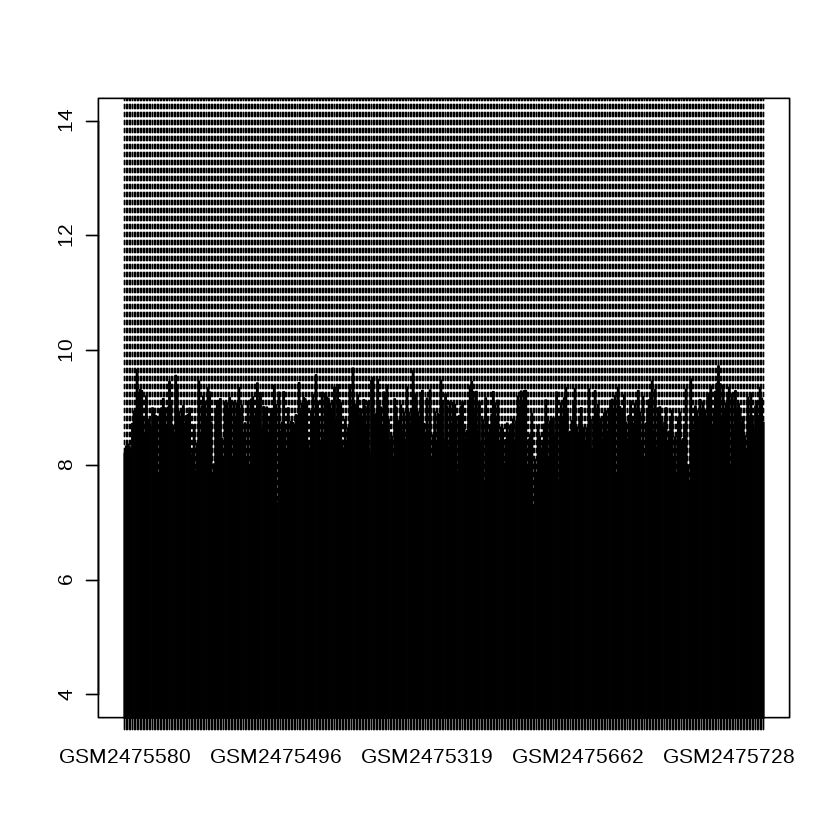

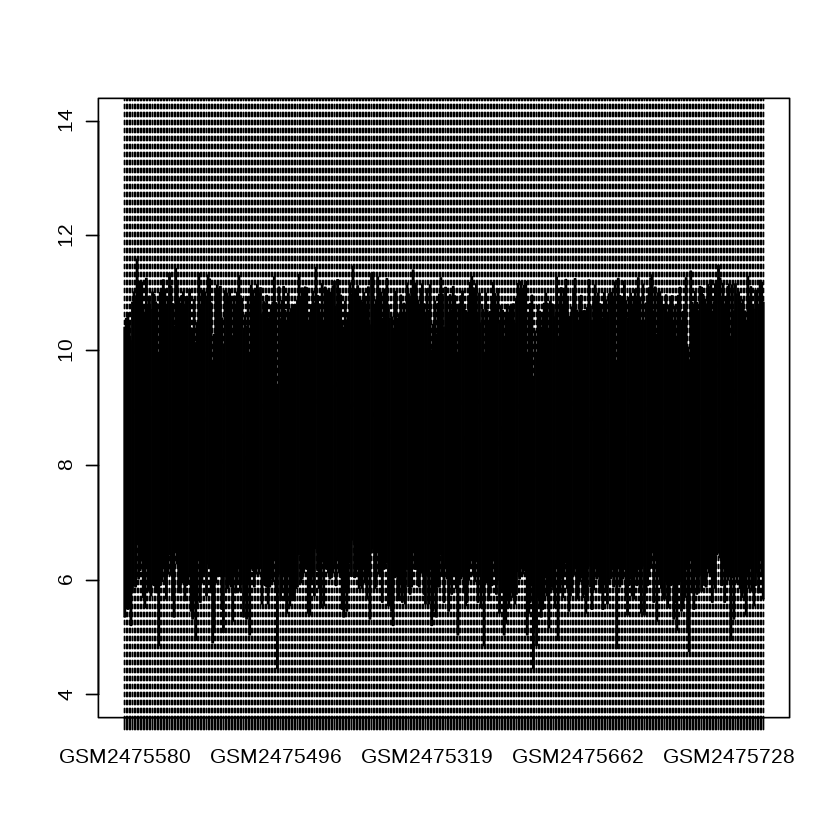

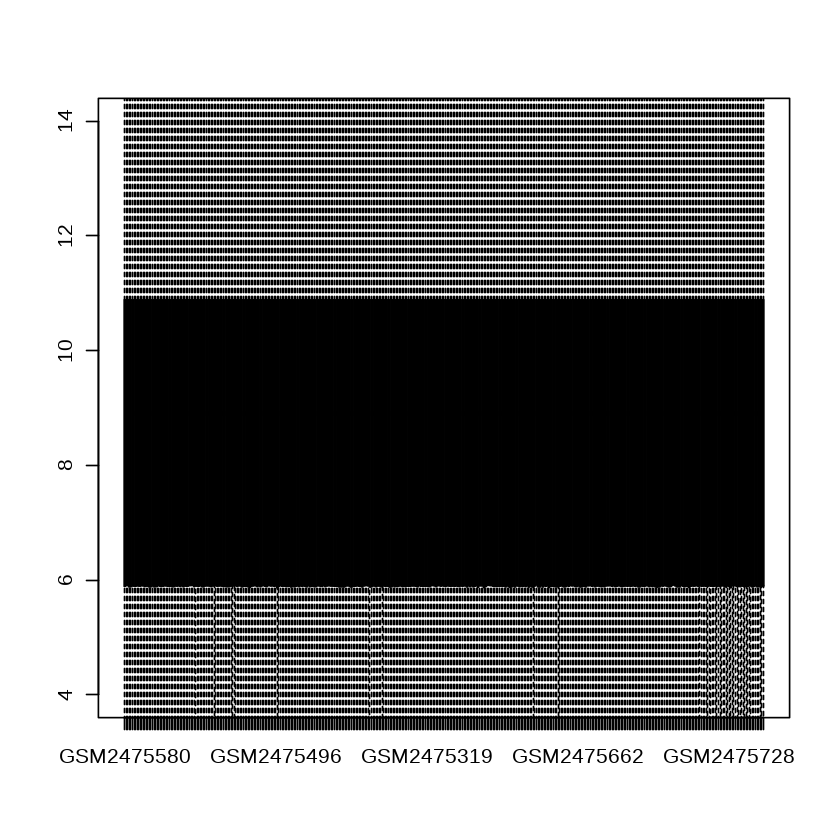

In [260]:
# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(Sul.exprs <= 5, 1, mean) <= 0.5

exprs.fil = Sul.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)


boxplot(log2(Sul.exprs+ 1), ylim=c(4,14))
boxplot(log2(exprs.fil+ 1), ylim=c(4,14))
boxplot(log2(exprs.qn+ 1), ylim=c(4,14))


In [262]:
Sul.pheno.6mo = Sul.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new Sul.pheno

AHRI.subj = unique(dplyr::filter(Sul.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
Sul.pheno.6mo$dataset[Sul.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"


# dplyr::filter pheno and expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

Sul.pheno.6mo = droplevels(Sul.pheno.6mo[Sul.pheno.6mo$site %in% c("AHRI", "MRC") & Sul.pheno.6mo$time.from.exposure.months %in% c(0, 6),])

Sul.exprs.log.6mo = Sul.exprs.log[, colnames(Sul.exprs.log) %in% row.names(Sul.pheno.6mo)]

Sul.pheno.6mo.train = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset == "Training",])
Sul.pheno.6mo.test = droplevels(Sul.pheno.6mo[ Sul.pheno.6mo$dataset != "Training",])

Sul.exprs.train = t(Sul.exprs.log.6mo[,row.names(Sul.pheno.6mo.train)])
Sul.exprs.test = t(Sul.exprs.log.6mo[, row.names(Sul.pheno.6mo.test)])

set.seed(100)
folds.6mo = groupKFold(Sul.pheno.6mo.train$subjectid, k=10)
for (fold in lapply(folds.6mo, function(x) {Sul.pheno.6mo.train$subjectid[x]}))
    print(length((as.character(fold))))

lapply(folds.6mo, function(x, y) table(y[x]), y = Sul.pheno.6mo.train$subjectid)

time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.train$time.from.exposure.months == "0", "early", "late"))
test.time.period.from.exposure = as.factor(ifelse(Sul.pheno.6mo.test$time.from.exposure.months == "0", "early", "late"))

[1] 112
[1] 107
[1] 98
[1] 99
[1] 101
[1] 103
[1] 102
[1] 103
[1] 105
[1] 105


$Fold01

  07/G189   07/G274   07/G277   07/G300   07/G351   07/G354   07/G368   07/G370 
        1         1         1         0         1         1         1         1 
  07/G419   08/G136   08/G141   08/G160   08/G245   08/G260   08/G324   08/G333 
        1         1         1         1         1         2         2         1 
  08/G343   08/G367   08/G400   08/G407   08/G415   08/G423   08/G424   08/G433 
        1         2         1         1         1         1         1         2 
  08/G493   08/G494   08/G541   08/G587   08/G596   08/G606   08/G613   08/G643 
        1         1         1         1         1         1         1         1 
  08/G652   08/G654   08/G695   08/G701   08/G703   08/G714   08/G715   08/G726 
        2         1         1         1         2         1         1         1 
  08/G782   08/G788   08/G797   08/G800   08/G810   08/G814   08/G893   09/G120 
        1         1         2         1         1         1         1         1 
  09/G133   09/G135

In [263]:
start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

print("Made the clusters")

myFunc <- caretSBF
myFunc$summary <- twoClassSummary
myFunc$score <- function(x, y) {
  out <- wilcox.test(x ~ y)$p.value # Will have warnings due to ties; ignore for now.
  out
}

filtercontrol.lm = sbfControl(functions = myFunc, method = "cv",  index=folds.6mo,  allowParallel=TRUE) 
set.seed(10)
wilcoxWithFilter.lm = sbf(Sul.exprs.train, as.factor(Sul.pheno.6mo.train$time.from.exposure.months), sbfControl = filtercontrol.lm)

print("Did the feature selection")
stopCluster(cluster)
registerDoSEQ()


end_time <- Sys.time()
print(end_time - start_time)

[1] "Made the clusters"
[1] "Did the feature selection"
Time difference of 14.75062 mins


In [264]:
opt.Sul.only.vars = wilcoxWithFilter.lm$optVariables

In [266]:
dim(Sul.exprs.train)

[1]   115 17448

In [267]:
Sul.exprs.meta = Sul.exprs.train[,colnames(Sul.exprs.train) %in% opt.Sul.only.vars]

In [268]:
dim(Sul.exprs.meta)

[1]  115 2636

### Load feature selection training set into a MetaIntegrator object to perform forward gene selection

### Show performance of the reduced signature (6 genes) in the GC6-74 training and test sets

-  I do want to make sure they are using arithmetic means for the log2 normalized data (so it is geometric for the raw expression value)

- I think applying this to the microarray dataset, I can't really set a global threshold, except maybe using the pre-conversion time points. The first test would be are the distributions fo scores different before and after. And then is the distribution of highest single score before and after different.

- Honestly, I can just implement my own function with the genes at hand. Since it is so simply. Just take in an expression matrix, verify that the genes are there, calculate the score, voila! I just needed MetaIntegrator to do the forward search, which it seems to have done beautifully

- This will definitely be an additional figure, that 6 genes can recapitulate the predictive accuracy in training and test set (for Gambia and Ethipia HHCs). And performance in all other datasets too!

In [271]:
gene.keys = opt.Sul.only.vars
names(gene.keys) = opt.Sul.only.vars

In [280]:
class = ifelse(time.period.from.exposure=="late", 1, 0)
names(class) = rownames(Sul.exprs.meta)

In [283]:
Sul.data = list(class, t(Sul.exprs.meta), gene.keys, Sul.pheno.6mo.train, "Sul.train.set")
names(Sul.data) = c("class","expr","keys","pheno","formattedName")

In [305]:
dim(Sul.data$expr)

[1] 2636  115

In [285]:
head(Sul.data$expr)

,GSM2475701,GSM2475610,GSM2475615,GSM2475443,GSM2475613,GSM2475618,GSM2475617,GSM2475381,GSM2475378,GSM2475383,⋯,GSM2475732,GSM2475735,GSM2475736,GSM2475738,GSM2475741,GSM2475744,GSM2475745,GSM2475746,GSM2475749,GSM2475750
A1BG,7.804190,8.521855,7.681809,8.619365,8.531326,8.645481,9.077466,8.153897,8.563917,8.652300,⋯,9.097078,8.375550,8.517899,8.653771,8.992422,7.602325,7.951209,8.748587,8.009367,7.543785
AAED1,8.697897,8.594136,8.679681,8.570689,8.377470,8.366021,8.105398,8.665634,8.874890,8.495102,⋯,8.904922,8.514604,8.890813,8.416636,8.833206,8.387863,8.690774,8.479240,8.563308,7.935708
ABAT,9.921885,10.116553,10.014465,9.758188,10.151624,9.980039,9.698441,9.889854,10.018486,9.859720,⋯,9.137982,9.638304,10.568922,10.646559,10.309051,10.450753,9.581638,9.757350,10.517001,9.702302
ABCA1,9.158016,10.244564,9.205563,8.792938,8.538892,8.645481,7.424074,9.496674,9.806179,9.393418,⋯,9.612165,8.653504,10.547519,9.900067,9.600676,10.870376,10.502752,10.726012,10.350589,8.181685
ABCC2,6.689208,7.022411,6.523552,6.674114,6.455210,6.551925,6.338160,6.437182,6.544628,7.028322,⋯,7.080004,7.759478,7.076663,6.856454,6.490374,7.437285,6.871133,7.336805,6.136279,7.753907
ABHD14A,9.116145,9.408395,9.418131,10.248501,9.975351,9.604601,10.623877,9.647111,9.312011,10.113660,⋯,9.875588,9.963070,9.294113,9.535212,9.561377,9.158426,9.237390,9.577274,9.130554,9.702302


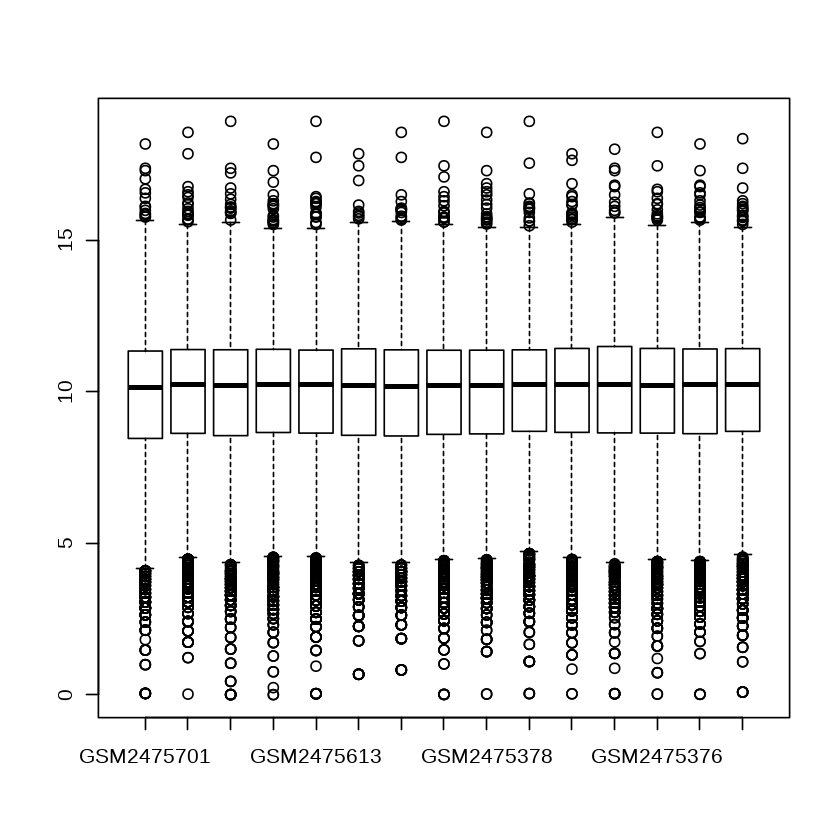

In [286]:
boxplot(Sul.data$expr[,1:15])

In [287]:
checkDataObject(Sul.data, "Dataset")

[1] TRUE

In [288]:
Sul.Meta = list(Sul.data)
names(Sul.Meta) = c(Sul.data$formattedName)

In [293]:
Meta = list()
Meta$originalData = Sul.Meta

In [294]:
checkDataObject(Meta, "Meta", "Pre-Analysis")

[1] TRUE

Computing effect sizes...
Computing summary effect sizes...
Computing Fisher's output...

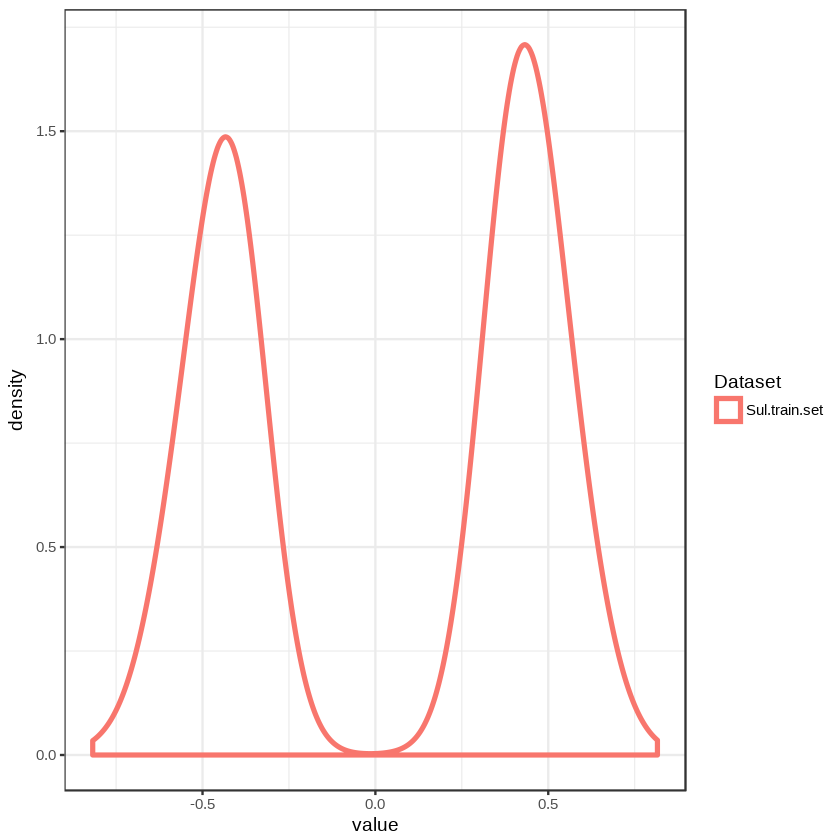

In [296]:
Meta = runMetaAnalysis(Meta)

In [297]:
Meta = filterGenes(Meta, FDRThresh=1.0)

In [301]:
summarizeFilterResults(Meta, getMostRecentFilter(Meta))

[1] 1215   14

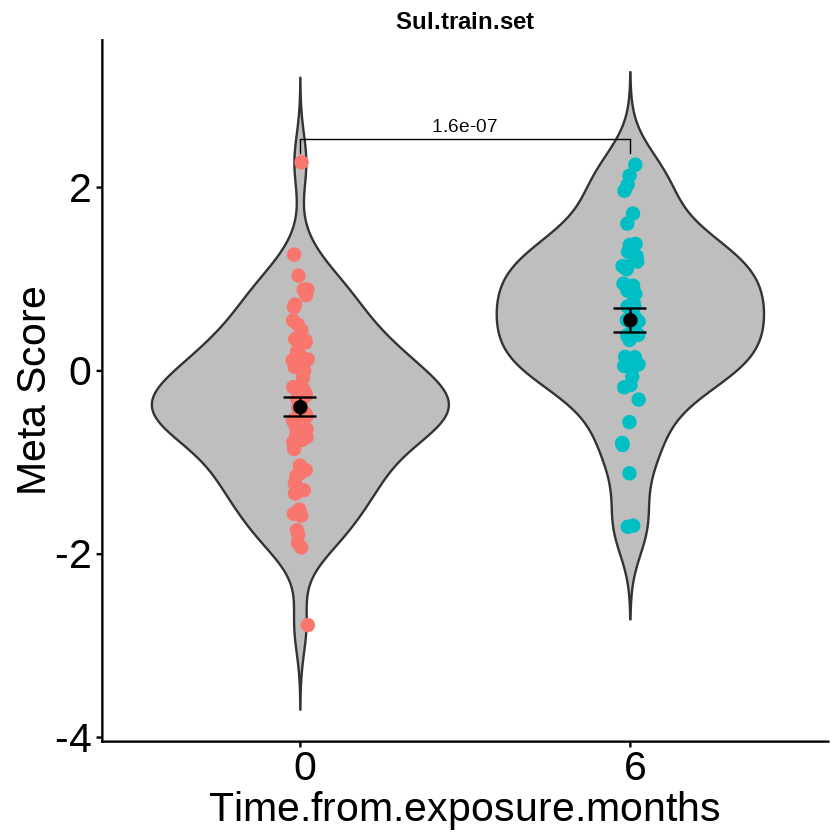

In [303]:
violinPlot(Meta$filterResults$FDR1_es0_nStudies1_looaFALSE_hetero0, Sul.data, labelColumn = 'time.from.exposure.months')

Do note that this is with a different algorithm, how the score is calculated. It doesn't allow as much optimization as a regularized linear model

Used  1421 of  1421  pos genes, and  1215  of  1215  neg genes 
For dataset Sul.train.set, AUC = 0.788

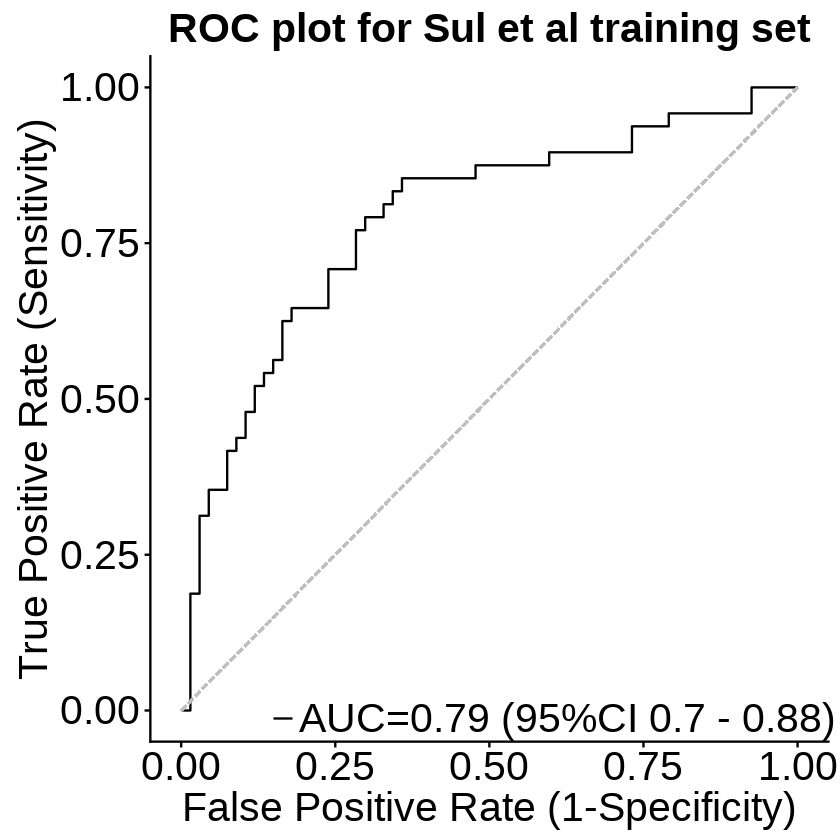

In [304]:
rocPlot(Meta$filterResults$FDR1_es0_nStudies1_looaFALSE_hetero0, Sul.data,title = "ROC plot for Sul et al training set")

I WILL DEFINITELY WANT TO USE THIS IF I WANT TO USE METAINTEGRATOR TO CALCULATE THIS SCORE IN MY INDEPENDNET DATASETS. I DO NEED TO MAKE SURE THAT A Z SCORE HASN"T BEEn CALCULATED COMPLETELY YET. Okay, it does do the Z-score, which I do not want to do. 

0.4.3.5 Optional: Calculate signature score for gene sets with calculateScore()
Given a gene set of interest, it is often desirable to summarize the expression of that gene set using a single integrated signature score (for details see above). The method calculateScore() calculates the geometric mean of the expression level of all positive genes, minus the geometric mean of the expression level of all negative genes. Although mostly used internally (e.g. to calculate the Z-scores for violinPlot()), the function has been exported in case users want to compare multiple classes, etc., using the same Z-score as is used for producing two-class comparisons.

Example:

calculateScore(exampleMetaObj$filterResults$FDR0.001_es0_nStudies1_looaTRUE_hetero0, dataObj2)
## Used  6 of  6  pos genes, and  2  of  2  neg genes
##  [1] -0.15306434 -0.68681735 -0.81023751 -0.81863726 -1.25195646 -1.87385218
##  [7] -1.35369218 -1.00883527 -1.29960805 -1.38863102 -0.76999804 -0.71777841
## [13]  0.07056772 -0.37165758 -0.42032379 -0.51503945 -0.74899507 -0.14092856
## [19]  2.22416036 -0.01965896  0.78892927  0.40788351  0.17038795  1.59325560
## [25]  0.15670475  0.76272870 -0.85048217  0.55503900 -0.73279309 -0.77016199
## [31] -0.49176551  0.54325166  0.93394146  0.26956889  1.61741129  1.23905868
## [37]  0.99592740  1.38078543  1.02264230  0.90994709  0.33786849 -0.24990791
## [43] -1.05145613 -0.93880708  1.92819891  1.18440716 -0.62728134 -0.68417686
## [49]  1.65387796
Typically, this vector would be added as $score column in datasetObject$pheno.

In [310]:
forwardRes = forwardSearch(Meta, Meta$filterResults[[1]], forwardThresh=0.01)

Converting probes:genes for gene list for all discovery GEMs.   done. 
next best= 83.94356 
Adding  ZNF608 83.94356 
next best= 5.703514 
Adding  RP11-552F3.12 89.64708 
next best= 5.828669 
Adding  PYURF 95.47575 
next best= 2.896455 
Adding  TRIM7 98.3722 
next best= 4.004975 
Adding  BEAN1 102.3772 
next best= 1.716418 
Adding  TUBGCP4 104.0936 
next best= 1.001244 
Adding  DUSP7 105.0948 
next best= 0.8939677 
Adding  SPATA7 105.9888 
next best= 1.573383 
Adding  TIFAB 107.5622 
next best= 0.9297264 
Adding  C17ORF67 108.4919 
next best= 0.858209 
Adding  MRPL30 109.3501 
next best= 0.3218284 
Adding  HAS3 109.672 
next best= 0.4648632 
Adding  YBX1 110.1368 
next best= 0.2503109 
Adding  TMEM218 110.3871 
next best= 0.4291045 
Adding  ZNF670-ZNF695 110.8162 
next best= 0.2503109 
Adding  PIGL 111.0665 
next best= 0.607898 
Adding  AGAP9 111.6744 
next best= 0.8939677 
Adding  ZNF69 112.5684 
next best= 0.4291045 
Adding  HOPX 112.9975 
next best= 0.5006219 
Adding  ZNF35 113.4981 

In [311]:
forwardRes

$posGeneNames
 [1] "RP11-552F3.12" "PYURF"         "TRIM7"         "TUBGCP4"      
 [5] "DUSP7"         "TIFAB"         "C17ORF67"      "MRPL30"       
 [9] "YBX1"          "TMEM218"       "PIGL"          "ZNF69"        
[13] "HOPX"          "ZNF35"         "TMEM254"       "TRIM35"       
[17] "PIAS3"         "SNX20"        

$negGeneNames
 [1] "ZNF608"        "BEAN1"         "SPATA7"        "HAS3"         
 [5] "ZNF670-ZNF695" "AGAP9"         "BLM"           "CD14"         
 [9] "MSH3"          "STRIP1"       

$effectSizeThresh
[1] 0

$FDRThresh
[1] 1

$numberStudiesThresh
[1] 1

$heterogeneityPvalThresh
[1] 0

$isLeaveOneOut
[1] FALSE

$filterDescription
[1] "MetaFilter from version 1.0. Forward search with forwardThresh=0.01"

$timestamp
[1] "2019-08-22 11:47:44 CDT"


In [312]:
forwardRes.02 = forwardSearch(Meta, Meta$filterResults[[1]], forwardThresh=0.02)
forwardRes.02

Converting probes:genes for gene list for all discovery GEMs.   done. 
next best= 83.94356 
Adding  ZNF608 83.94356 
next best= 5.703514 
Adding  RP11-552F3.12 89.64708 
next best= 5.828669 
Adding  PYURF 95.47575 
next best= 2.896455 
Adding  TRIM7 98.3722 
next best= 4.004975 
Adding  BEAN1 102.3772 
next best= 1.716418 
Adding  TUBGCP4 104.0936 
next best= 1.001244 
Adding  DUSP7 105.0948 
next best= 0.8939677 
Adding  SPATA7 105.9888 
next best= 1.573383 
Adding  TIFAB 107.5622 
next best= 0.9297264 
Adding  C17ORF67 108.4919 
next best= 0.858209 
Adding  MRPL30 109.3501 
next best= 0.3218284 
Adding  HAS3 109.672 
next best= 0.4648632 
Adding  YBX1 110.1368 
next best= 0.2503109 
Adding  TMEM218 110.3871 
next best= 0.4291045 
Adding  ZNF670-ZNF695 110.8162 
next best= 0.2503109 
Adding  PIGL 111.0665 
next best= 0.607898 
Adding  AGAP9 111.6744 
next best= 0.8939677 
Adding  ZNF69 112.5684 
next best= 0.4291045 
Adding  HOPX 112.9975 
next best= 0.5006219 
Adding  ZNF35 113.4981 

$posGeneNames
 [1] "RP11-552F3.12" "PYURF"         "TRIM7"         "TUBGCP4"      
 [5] "DUSP7"         "TIFAB"         "C17ORF67"      "MRPL30"       
 [9] "YBX1"          "TMEM218"       "PIGL"          "ZNF69"        
[13] "HOPX"          "ZNF35"         "TMEM254"       "TRIM35"       
[17] "PIAS3"         "SNX20"        

$negGeneNames
 [1] "ZNF608"        "BEAN1"         "SPATA7"        "HAS3"         
 [5] "ZNF670-ZNF695" "AGAP9"         "BLM"           "CD14"         
 [9] "MSH3"          "STRIP1"       

$effectSizeThresh
[1] 0

$FDRThresh
[1] 1

$numberStudiesThresh
[1] 1

$heterogeneityPvalThresh
[1] 0

$isLeaveOneOut
[1] FALSE

$filterDescription
[1] "MetaFilter from version 1.0. Forward search with forwardThresh=0.02"

$timestamp
[1] "2019-08-22 11:47:44 CDT"


In [313]:
forwardRes.04 = forwardSearch(Meta, Meta$filterResults[[1]], forwardThresh=0.04)
forwardRes.04

Converting probes:genes for gene list for all discovery GEMs.   done. 
next best= 83.94356 
Adding  ZNF608 83.94356 
next best= 5.703514 
Adding  RP11-552F3.12 89.64708 
next best= 5.828669 
Adding  PYURF 95.47575 
next best= 2.896455 
Adding  TRIM7 98.3722 
next best= 4.004975 
Adding  BEAN1 102.3772 
next best= 1.716418 
Adding  TUBGCP4 104.0936 
next best= 1.001244 
Adding  DUSP7 105.0948 
next best= 0.8939677 
Adding  SPATA7 105.9888 
next best= 1.573383 
Adding  TIFAB 107.5622 
next best= 0.9297264 
Adding  C17ORF67 108.4919 
next best= 0.858209 
Adding  MRPL30 109.3501 
next best= 0.3218284 
Adding  HAS3 109.672 
next best= 0.4648632 
Adding  YBX1 110.1368 
next best= 0.2503109 
Adding  TMEM218 110.3871 
next best= 0.4291045 
Adding  ZNF670-ZNF695 110.8162 
next best= 0.2503109 
Adding  PIGL 111.0665 
next best= 0.607898 
Adding  AGAP9 111.6744 
next best= 0.8939677 
Adding  ZNF69 112.5684 
next best= 0.4291045 
Adding  HOPX 112.9975 
next best= 0.5006219 
Adding  ZNF35 113.4981 

$posGeneNames
 [1] "RP11-552F3.12" "PYURF"         "TRIM7"         "TUBGCP4"      
 [5] "DUSP7"         "TIFAB"         "C17ORF67"      "MRPL30"       
 [9] "YBX1"          "TMEM218"       "PIGL"          "ZNF69"        
[13] "HOPX"          "ZNF35"         "TMEM254"       "TRIM35"       

$negGeneNames
[1] "ZNF608"        "BEAN1"         "SPATA7"        "HAS3"         
[5] "ZNF670-ZNF695" "AGAP9"         "BLM"          

$effectSizeThresh
[1] 0

$FDRThresh
[1] 1

$numberStudiesThresh
[1] 1

$heterogeneityPvalThresh
[1] 0

$isLeaveOneOut
[1] FALSE

$filterDescription
[1] "MetaFilter from version 1.0. Forward search with forwardThresh=0.04"

$timestamp
[1] "2019-08-22 11:47:44 CDT"


In [ ]:
set.seed(100)
forwardRes.04 = forwardSearch(Meta, Meta$filterResults[[1]], forwardThresh=0.04)
forwardRes.04

In [316]:
length(forwardRes.04$negGeneNames)

[1] 7

In [ ]:
sthresh = 0.06
inc.thresh = 0.02

neg.need = 2
total.genes = 10
while (1) {
    fres = forwardSearch(Meta, Meta$filterResults[[1]], forwardThresh=sthresh)
    if (length(fres$negGeneNames) >= neg.need && (length(fres$negGeneNames) + ))
}


In [314]:
i = 0
while (1) {
    i = i + 1
    if (i > 100)
        break
}
print(i)

[1] 101


In [307]:
0.01

[1] 0.01

In [317]:
forwardRes.big = forwardSearch(Meta, Meta$filterResults[[1]], forwardThresh=1.04)
forwardRes.big

Converting probes:genes for gene list for all discovery GEMs.   done. 
next best= 83.94356 
Adding  ZNF608 83.94356 
next best= 5.703514 
Adding  RP11-552F3.12 89.64708 
next best= 5.828669 
Adding  PYURF 95.47575 
next best= 2.896455 
Adding  TRIM7 98.3722 
next best= 4.004975 
Adding  BEAN1 102.3772 
next best= 1.716418 
Adding  TUBGCP4 104.0936 
next best= 1.001244 

Final discovery AUCs from forward search genes:
Sul.train.set 0.871 
mean AUC: 0.871 


$posGeneNames
[1] "RP11-552F3.12" "PYURF"         "TRIM7"         "TUBGCP4"      

$negGeneNames
[1] "ZNF608" "BEAN1" 

$effectSizeThresh
[1] 0

$FDRThresh
[1] 1

$numberStudiesThresh
[1] 1

$heterogeneityPvalThresh
[1] 0

$isLeaveOneOut
[1] FALSE

$filterDescription
[1] "MetaFilter from version 1.0. Forward search with forwardThresh=1.04"

$timestamp
[1] "2019-08-22 11:47:44 CDT"


In [430]:
is.null(NULL)

[1] TRUE

In [431]:
posGenes = c("RP11-552F3.12", "PYURF" ,        "TRIM7"  ,       "TUBGCP4"  )
negGenes = c("ZNF608", "BEAN1")

# Calculates arithmetic mean of log2 gene values of upregulated genes - downregulated genes
# exprs is an expression matrix of genes with nsamples as rows and ngenes as columns
calculateScore = function(exprs, posGenes, negGenes) {
    pos.exprs = exprs[,colnames(exprs) %in% posGenes]
    neg.exprs = exprs[,colnames(exprs) %in% negGenes]
    
    if (!is.null(dim(neg.exprs))) {
        scores = apply(pos.exprs, 1, mean) - apply(neg.exprs, 1, mean)
        } else {
        scores = apply(pos.exprs, 1, mean) - neg.exprs
    }
    return (scores)
}

In [322]:
Sul.exprs.meta.scores= calculateScore(Sul.exprs.meta, posGenes, negGenes)

In [324]:
length(Sul.exprs.meta.scores)

[1] 115

In [323]:
Sul.exprs.meta.scores

GSM2475701 GSM2475610 GSM2475615 GSM2475443 GSM2475613 GSM2475618 GSM2475617 
 3.1960245  2.0449557  1.7095889  3.2256781  2.9988708  3.1688063  2.7218584 
GSM2475381 GSM2475378 GSM2475383 GSM2475382 GSM2475372 GSM2475376 GSM2475369 
 2.3669086  2.6561287  2.9941933  3.0450390  3.2230236  3.4018455  3.7346091 
GSM2475626 GSM2475379 GSM2475373 GSM2475374 GSM2475366 GSM2475371 GSM2475367 
 2.7038347  2.6883184  3.2670172  3.6124660  3.8501291  2.4924222  3.5201007 
GSM2475377 GSM2475559 GSM2475364 GSM2475365 GSM2475368 GSM2475363 GSM2475380 
 2.8423252  2.5683572  2.3777007  2.4178084  2.8984302  3.1115620  3.4415088 
GSM2475608 GSM2475384 GSM2475570 GSM2475571 GSM2475573 GSM2475566 GSM2475574 
 2.2087092  3.0509150  2.0282237  3.8224530  2.6131497  2.7798479  2.8931845 
GSM2475567 GSM2475569 GSM2475568 GSM2475440 GSM2475576 GSM2475575 GSM2475577 
 3.4631857  2.6919875  2.9514097  2.5649068  1.7482604  2.2831519  2.7329748 
GSM2475572 GSM2475564 GSM2475565 GSM2475560 GSM2475432 GSM2475450 GSM2475451 
 2.2016849  2.4834338  2.8563139  2.3839170  2.2704454  2.5942027  2.1107773 
GSM2475447 GSM2475445 GSM2475448 GSM2475446 GSM2475449 GSM2475441 GSM2475444 
 2.5926869  3.1101110  2.2732321  2.5821756  2.3199299  3.1575675  2.7565609 
GSM2475442 GSM2475386 GSM2475614 GSM2475343 GSM2475439 GSM2475435 GSM2475437 
 2.7438872  1.7908668  2.1520992  2.9485906  2.5961017  3.3261412  3.3154412 
GSM2475433 GSM2475438 GSM2475436 GSM2475337 GSM2475322 GSM2475434 GSM2475321 
 2.2280752  2.7923081  3.0241627  2.5265586  2.9816406  1.7984603  3.4329362 
GSM2475452 GSM2475319 GSM2475375 GSM2475563 GSM2475328 GSM2475330 GSM2475327 
 2.1656047  2.3836238  2.9821442  1.8202062  1.8466922  2.4908534  1.9902546 
GSM2475329 GSM2475326 GSM2475334 GSM2475331 GSM2475317 GSM2475320 GSM2475370 
 3.3014012  3.0925989  2.9694253  2.4050613  3.0284470  2.7902981  3.0653469 
GSM2475611 GSM2475612 GSM2475453 GSM2475335 GSM2475473 GSM2475454 GSM2475625 
 2.4692468  2.7522588  2.7886897  1.7866073  1.7823256  2.4183965  3.0540063 
GSM2475390 GSM2475323 GSM2475325 GSM2475324 GSM2475707 GSM2475716 GSM2475718 
 3.4884497  1.9798862  1.6153108  2.8356050  4.3523009  3.0877899  2.9732660 
GSM2475724 GSM2475725 GSM2475726 GSM2475727 GSM2475729 GSM2475730 GSM2475731 
 3.4937152  1.9738202  3.0452254  2.1222198  3.5196828  2.4673352  2.7861617 
GSM2475732 GSM2475735 GSM2475736 GSM2475738 GSM2475741 GSM2475744 GSM2475745 
 3.7890296  2.4394056  0.7316959  2.0004787  2.2147647  1.5029229  2.5226449 
GSM2475746 GSM2475749 GSM2475750 
 2.1089384  2.7923327  0.9820053

In [325]:
score.plot = data.frame(scores=Sul.exprs.meta.scores, time=time.period.from.exposure)

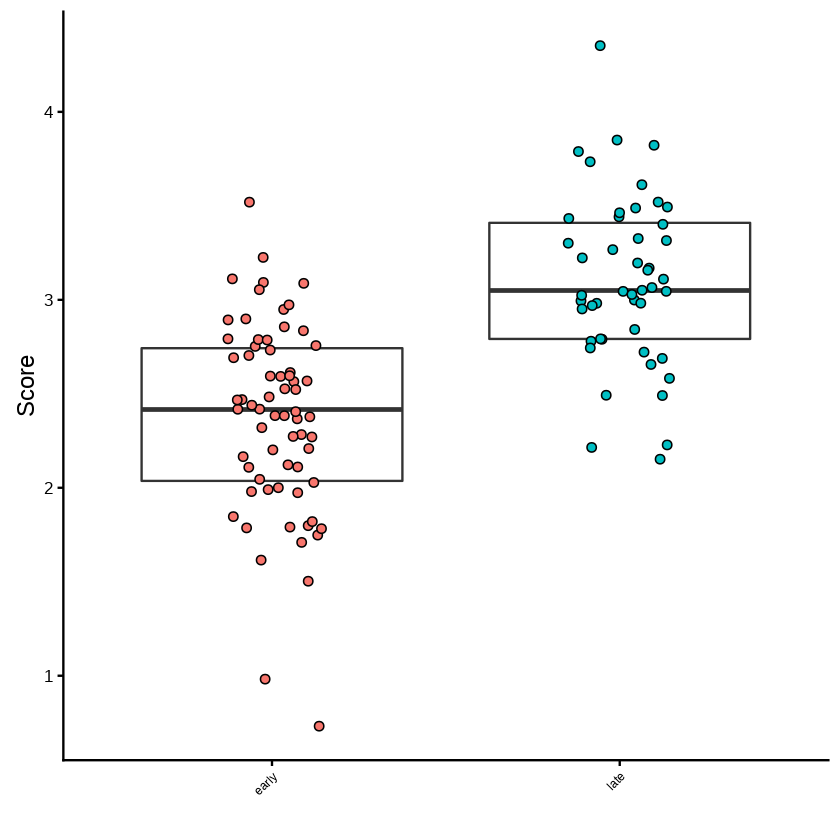

In [327]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=time), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(score.plot, aes(x=time, y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

In [ ]:
human.expose.Sul.Garra.model = models$glmnet

glmnet.Sul.val.ROC = my.roc(human.expose.Sul.Garra.model$pred$early, human.expose.Sul.Garra.model$pred$obs, "early")

pred.Sul.test.prob = predict(human.expose.Sul.Garra.model, newdata = Sul.exprs.test[, colnames(Sul.exprs.test) %in% c(opt.Sul.Garra.vars)], type="prob")

[1] "This is the AUC:"
Area under the curve: 0.8657
[1] "This is the AUC p-value:"
[1] 1.306001e-11
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.7995-0.9318 (DeLong)


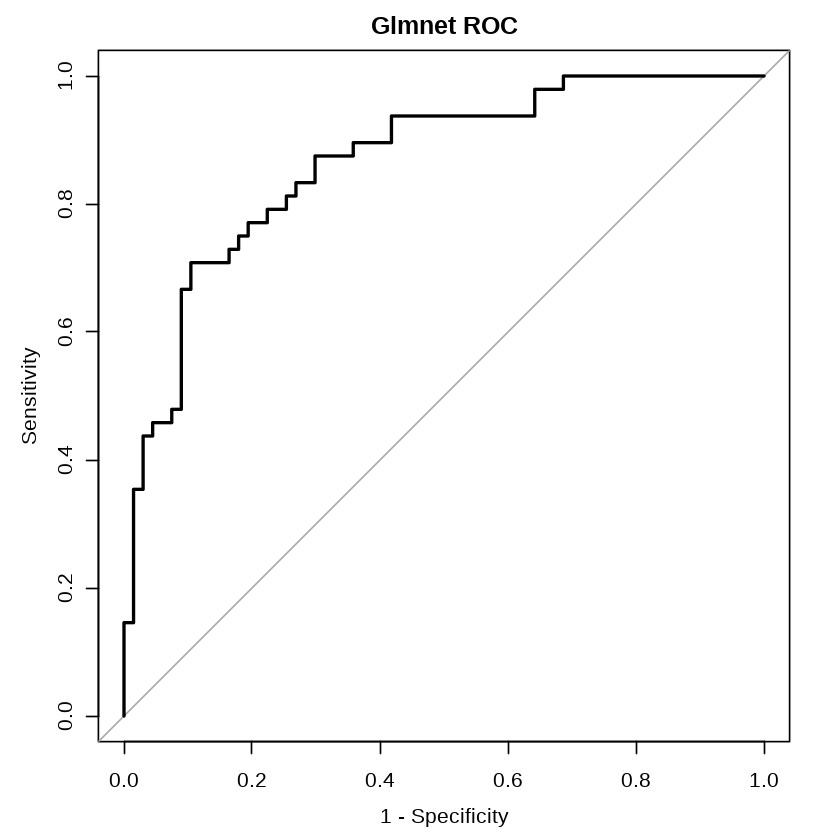

In [329]:
glmnet.Sul.train.ROC.score <- my.roc(Sul.exprs.meta.scores,
                        time.period.from.exposure,
                     "late", title="Glmnet ROC")

In [330]:
Sul.exprs.test.scores = calculateScore(Sul.exprs.test, posGenes, negGenes)

In [332]:
score.plot.test = data.frame(scores=Sul.exprs.test.scores, time=test.time.period.from.exposure)

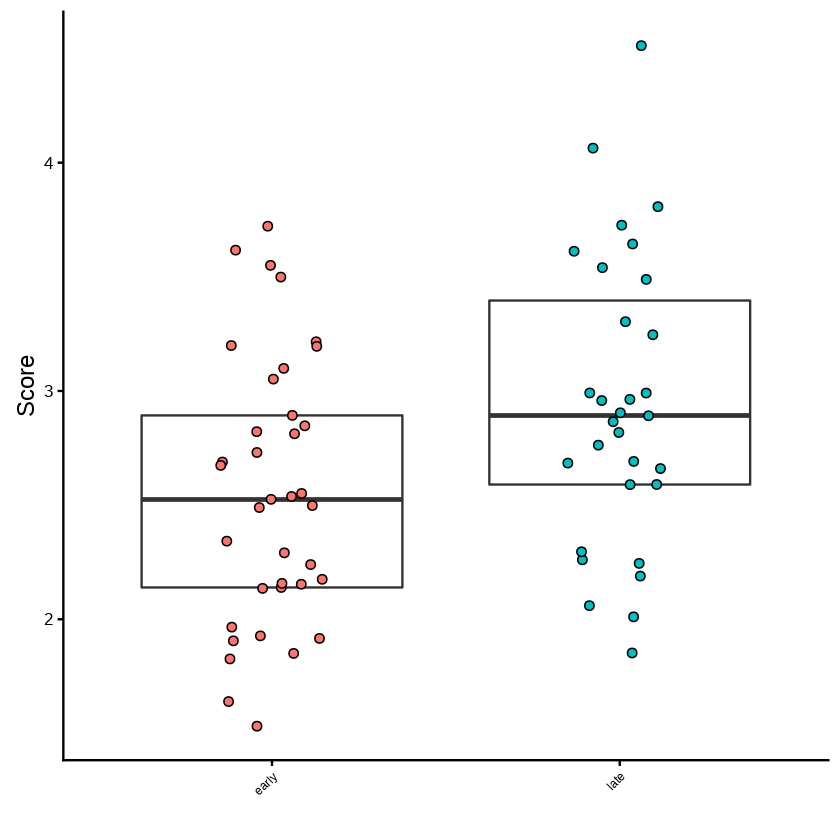

In [334]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=time), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(score.plot.test, aes(x=time, y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

[1] "This is the AUC:"
Area under the curve: 0.6792
[1] "This is the AUC p-value:"
[1] 0.0054721
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.5515-0.8068 (DeLong)


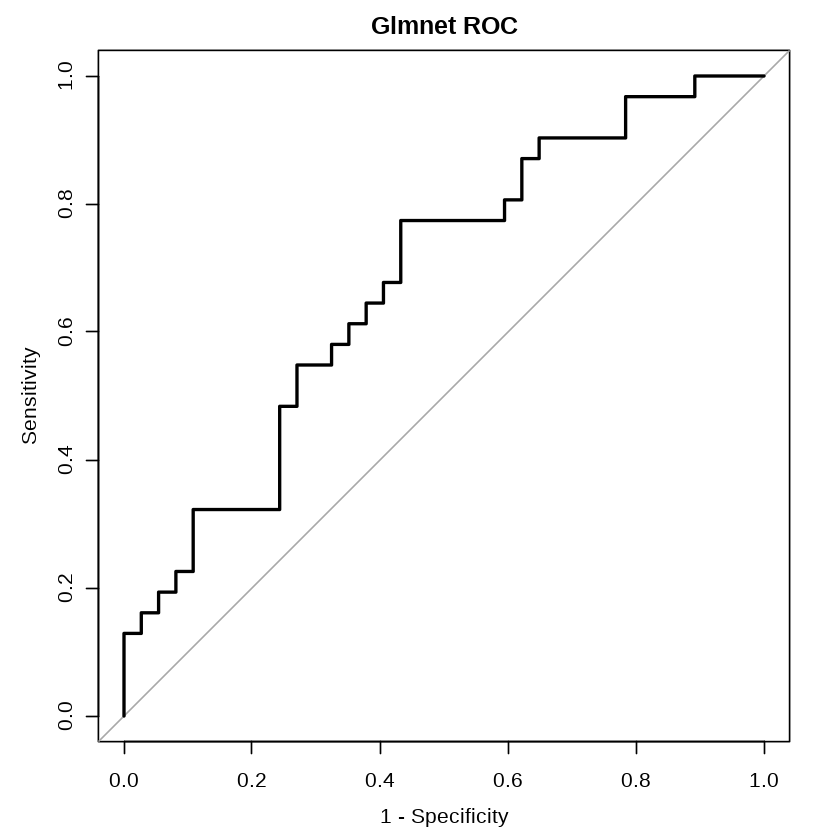

In [331]:
Sul.test.ROC.score <- my.roc(Sul.exprs.test.scores,
                        test.time.period.from.exposure,
                     "late", title="Glmnet ROC")

### Do predictions in the Garra dataset, wherein the Garra dataset has been quantile normalized only with itself.

- I finally learned in this that the lowered read distribution samples in this dataset is largely the LTBI nonprogressor longitudinal cohort, with a few of the control longitudinal cohort. Thus, it could be a confounder with my key result. I think I don't have to worry about this as long as I describe the need for further validation clearly.

- It may be good to see the median read count in the 6-month prediction samples vs. all other samples. This would either lay the question to rest (it isn't confounded) or introduce this as a potential technical confounder. It would be a shame if the groups were not comparable due to this

- Now we can get separation from the negative part of the distribution. I am getting very confused now...

- Okay, with normalization within the Garra dataset, median read count is completely correlated with the big difference in score for those negative samples. It makes me definitely feel the need to review this in the 1st overall prediction

In [335]:
Garra.path = paste(path, "/data/GSE107995", sep="")
Garra.pheno.set = getGEO(filename=paste(Garra.path, "GSE107995_series_matrix.txt.gz", sep="/"),
             destdir=Garra.path)

Garra.pheno = filter.Garra.pheno(pData(Garra.pheno.set))
Garra.exprs = read.table(paste(Garra.path, "Singhania_et_al_expression_ARCHS4.csv", sep="/"), header=T, row.names=1, sep=",")

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL20301 found here:
./data/GSE107995/GPL20301.soft 
Warning message in filter.Garra.pheno(pData(Garra.pheno.set)):
“NAs introduced by coercion”

                   title    
 Berry_London_Sample1 :  1  
 Berry_London_Sample10:  1  
 Berry_London_Sample11:  1  
 Berry_London_Sample12:  1  
 Berry_London_Sample13:  1  
 Berry_London_Sample14:  1  
 (Other)              :408  
                                     source_name_ch1 age_at_baseline_visit
 Longitudnal_Leicester_Control_Non_progressor:69     Min.   :16.00        
 Longitudnal_Leicester_LTBI_Non_progressor   :69     1st Qu.:30.00        
 Leicester_Active_TB                         :53     Median :39.00        
 Leicester_Control                           :50     Mean   :39.21        
 Leicester_LTBI                              :49     3rd Qu.:46.00        
 Berry_SouthAfrica_Validation_set_LTBI       :31     Max.   :84.00        
 (Other)                                     :93     NA's   :101          
       birth_place                    ethnicity    gender   
 Foreign_Born:263   South_Asia_ISC         :198   F   :111  
 UK_Born     : 50   British_Indian         : 2

In [338]:
dim(Garra.pheno)

[1] 414  15

In [339]:
dim(Garra.exprs)

[1] 35238   414

In [367]:
head(apply(exprs.fil, 2,median))

GSM2886035 GSM2886036 GSM2886037 GSM2886038 GSM2886039 GSM2886040 
       405        489        219        374        244        192

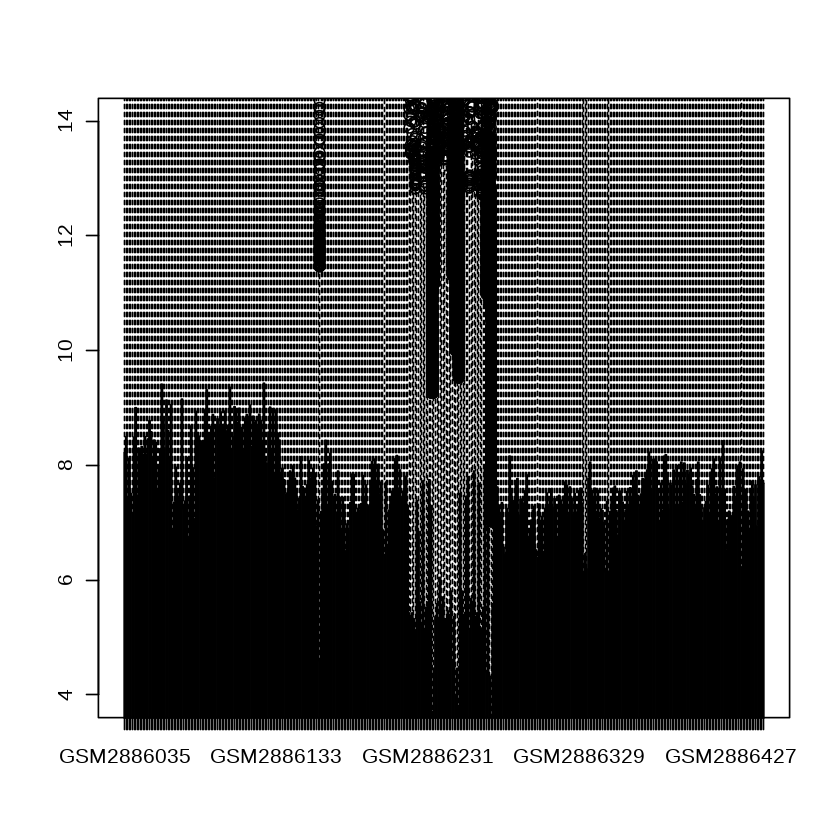

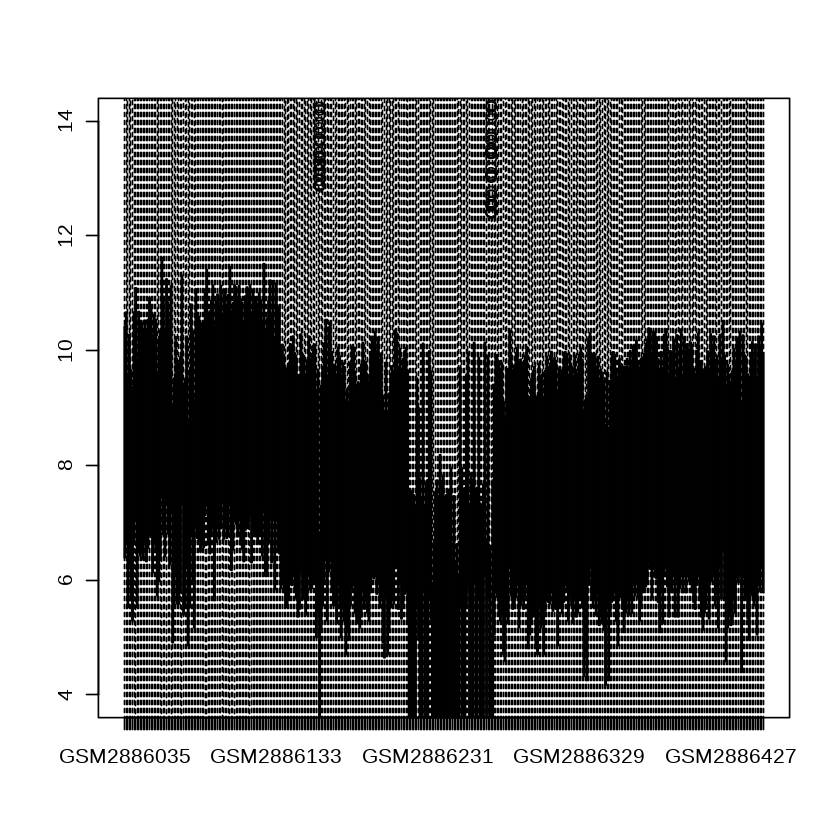

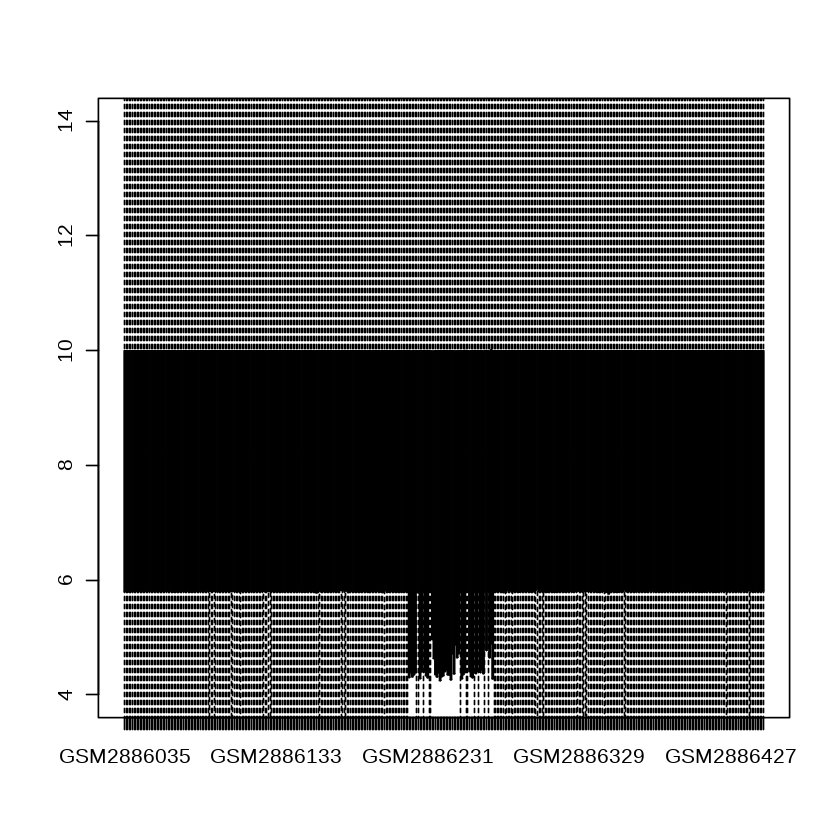

In [340]:
# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(Garra.exprs <= 5, 1, mean) <= 0.5

exprs.fil = Garra.exprs[exprs.j.keep,]

exprs.qn = as.data.frame(normalize.quantiles(as.matrix(exprs.fil)))
colnames(exprs.qn) = colnames(exprs.fil)
rownames(exprs.qn) = rownames(exprs.fil)
exprs.log = log2(exprs.qn + 1)


boxplot(log2(Garra.exprs+ 1), ylim=c(4,14))
boxplot(log2(exprs.fil+ 1), ylim=c(4,14))
boxplot(log2(exprs.qn+ 1), ylim=c(4,14))


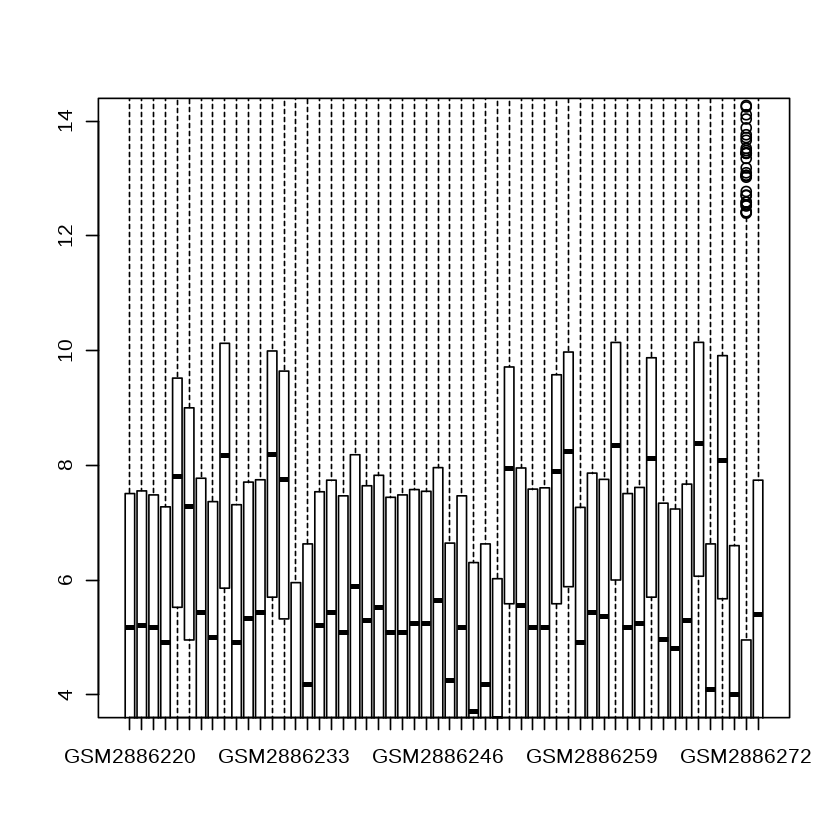

In [352]:
boxplot(log2(exprs.fil[,186:239]+ 1), ylim=c(4,14))

In [294]:
negGenes

[1] "ZNF608" "BEAN1"

In [354]:
summary(droplevels(Garra.pheno[166:259,]))

                                                 title   
 Leicester_non_progressor_longitudnal_only_Sample100: 1  
 Leicester_non_progressor_longitudnal_only_Sample101: 1  
 Leicester_non_progressor_longitudnal_only_Sample102: 1  
 Leicester_non_progressor_longitudnal_only_Sample103: 1  
 Leicester_non_progressor_longitudnal_only_Sample104: 1  
 Leicester_non_progressor_longitudnal_only_Sample107: 1  
 (Other)                                            :88  
                                     source_name_ch1 age_at_baseline_visit
 Leicester_Active_TB                         : 6     Min.   :16.00        
 Leicester_Control                           : 6     1st Qu.:30.00        
 Leicester_LTBI                              : 4     Median :35.00        
 Longitudnal_Leicester_Control_Non_progressor:24     Mean   :37.09        
 Longitudnal_Leicester_LTBI_Non_progressor   :50     3rd Qu.:43.00        
 Longitudnal_Leicester_LTBI_Progressor       : 4     Max.   :65.00        
           

In [353]:
summary(droplevels(Garra.pheno[186:239,]))

                                                 title   
 Leicester_non_progressor_longitudnal_only_Sample100: 1  
 Leicester_non_progressor_longitudnal_only_Sample101: 1  
 Leicester_non_progressor_longitudnal_only_Sample102: 1  
 Leicester_non_progressor_longitudnal_only_Sample103: 1  
 Leicester_non_progressor_longitudnal_only_Sample104: 1  
 Leicester_non_progressor_longitudnal_only_Sample107: 1  
 (Other)                                            :48  
                                     source_name_ch1 age_at_baseline_visit
 Longitudnal_Leicester_Control_Non_progressor:14     Min.   :17.00        
 Longitudnal_Leicester_LTBI_Non_progressor   :40     1st Qu.:29.25        
                                                     Median :36.00        
                                                     Mean   :36.96        
                                                     3rd Qu.:41.00        
                                                     Max.   :65.00        
           

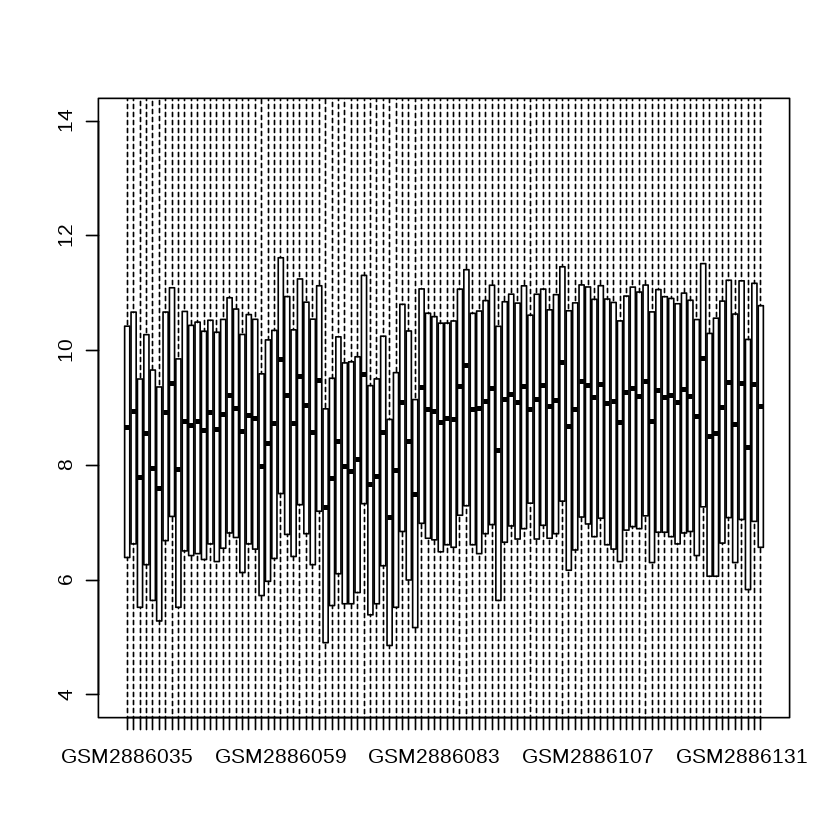

In [375]:
boxplot(log2(exprs.fil[,1:100]+ 1), ylim=c(4,14))

In [376]:
summary(droplevels(Garra.pheno[1:100,]))

                   title                                      source_name_ch1
 Berry_London_Sample1 : 1   Berry_London_Test_set_Active_TB           :21    
 Berry_London_Sample10: 1   Berry_London_Test_set_Control             :12    
 Berry_London_Sample11: 1   Berry_London_Test_set_LTBI                :21    
 Berry_London_Sample12: 1   Berry_SouthAfrica_Validation_set_Active_TB:15    
 Berry_London_Sample13: 1   Berry_SouthAfrica_Validation_set_LTBI     :31    
 Berry_London_Sample14: 1                                                    
 (Other)              :94                                                    
 age_at_baseline_visit birth_place ethnicity   gender          group   
 Min.   : NA           NA's:100    NA's:100   NA's:100   Active_TB:36  
 1st Qu.: NA                                             Control  :12  
 Median : NA                                             LTBI     :52  
 Mean   :NaN                                                           
 3rd Qu.: NA    

In [341]:
Garra.exprs.log = t(exprs.log)
dim(Garra.exprs.log)

[1]   414 15765

In [355]:
Garra.exprs.scores = calculateScore(Garra.exprs.log, posGenes, negGenes)

In [358]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

#ACS.pheno.subj = ACS.pheno
Garra.pheno.subj = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
#ACS.pheno.subj$patient_id = as.factor(extract_id(ACS.pheno$title))
#ACS.pheno.subj = ACS.pheno.subj[!is.na(ACS.pheno.subj$patient_id),]
#ACS.exprs.subj = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.subj),]
Garra.exprs.subj = Garra.exprs.log[rownames(Garra.exprs.log) %in% rownames(Garra.pheno.subj),]
#pred.ACS.test.prob = predict(human.expose.Sul.ACS.model,  newdata = ACS.exprs.subj[, colnames(ACS.exprs.subj) %in% c(opt.Sul.vars)], type="prob")
Garra.exprs.scores = calculateScore(Garra.exprs.subj, posGenes, negGenes)
Garra.pheno.subj$disease = Garra.pheno.subj$source_name_ch1

All.pheno.subj = data.frame(disease=c(as.character(Garra.pheno.subj$disease)),
                           patient_id = c(as.character(Garra.pheno.subj$patient_id)))
late.pred = c(Garra.exprs.scores)
All.test.subj.max = tapply(late.pred, All.pheno.subj$patient_id, max)

All.pheno.subj.max = All.pheno.subj[!duplicated(All.pheno.subj[,c('patient_id')]),]#All.pheno.subj[All.pheno.subj$patient_id %in% names(ACS.test.subj.max),]
All.test.subj.tab =data.frame(patient_id=names(All.test.subj.max), late.pred=All.test.subj.max)
all.pred.tab = merge(All.pheno.subj.max, All.test.subj.tab, by.y="patient_id")

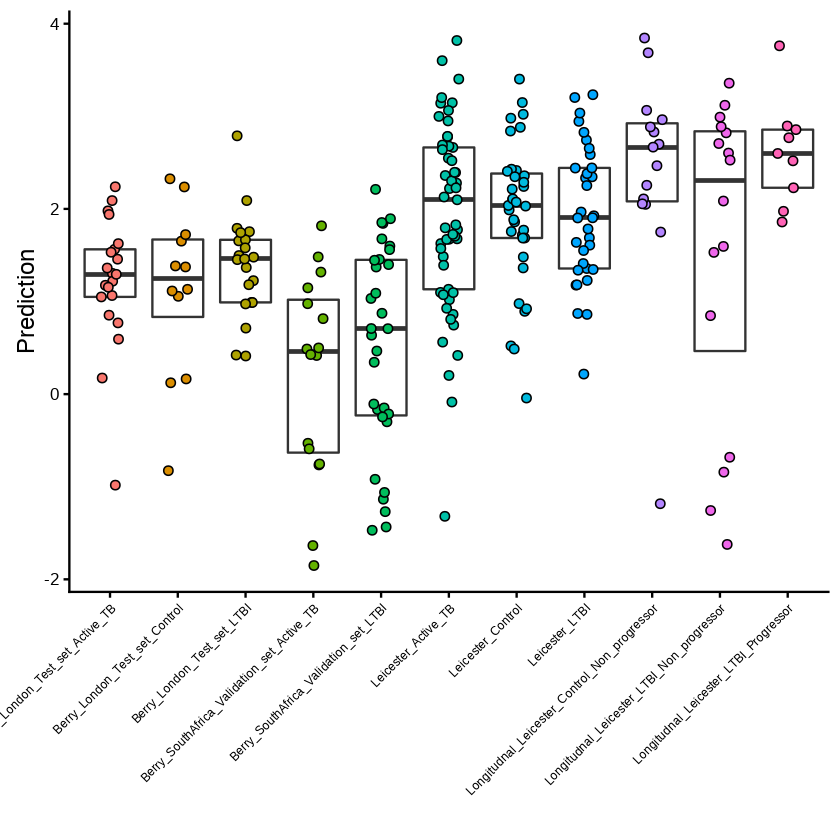

In [359]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(all.pred.tab, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

In [360]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

#ACS.pheno.subj = ACS.pheno
Garra.pheno.subj = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
#ACS.pheno.subj$patient_id = as.factor(extract_id(ACS.pheno$title))
#ACS.pheno.subj = ACS.pheno.subj[!is.na(ACS.pheno.subj$patient_id),]
#ACS.exprs.subj = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.subj),]
Garra.exprs.subj = Garra.exprs.log[rownames(Garra.exprs.log) %in% rownames(Garra.pheno.subj),]
#pred.ACS.test.prob = predict(human.expose.Sul.ACS.model,  newdata = ACS.exprs.subj[, colnames(ACS.exprs.subj) %in% c(opt.Sul.vars)], type="prob")
Garra.exprs.scores = calculateScore(Garra.exprs.subj, posGenes, negGenes)
Garra.pheno.subj$disease = Garra.pheno.subj$source_name_ch1

late.pred = c(Garra.exprs.scores)


Garra.pheno.bar = data.frame(disease=Garra.pheno.subj$disease, late.pred=late.pred)



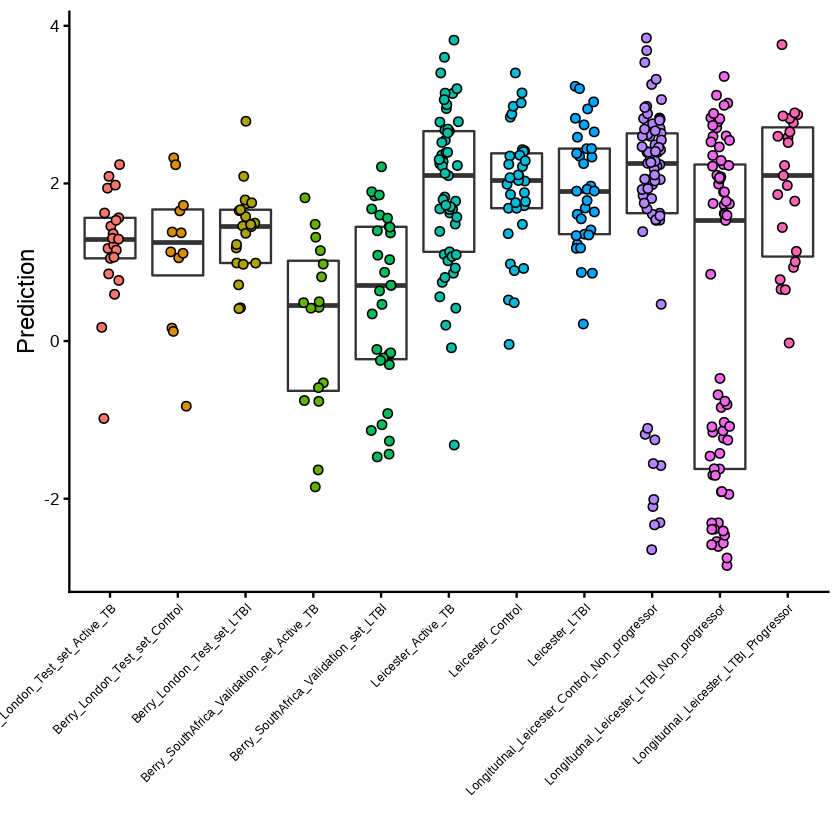

In [361]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(Garra.pheno.bar, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

In [377]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

#ACS.pheno.subj = ACS.pheno
Garra.pheno.subj = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
#ACS.pheno.subj$patient_id = as.factor(extract_id(ACS.pheno$title))
#ACS.pheno.subj = ACS.pheno.subj[!is.na(ACS.pheno.subj$patient_id),]
#ACS.exprs.subj = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.subj),]
Garra.exprs.subj = Garra.exprs.log[rownames(Garra.exprs.log) %in% rownames(Garra.pheno.subj),]
#pred.ACS.test.prob = predict(human.expose.Sul.ACS.model,  newdata = ACS.exprs.subj[, colnames(ACS.exprs.subj) %in% c(opt.Sul.vars)], type="prob")
Garra.exprs.scores = calculateScore(Garra.exprs.subj, posGenes, negGenes)
Garra.pheno.subj$disease = Garra.pheno.subj$source_name_ch1

All.pheno.subj = data.frame(disease=c(as.character(Garra.pheno.subj$disease)),
                           patient_id = c(as.character(Garra.pheno.subj$patient_id)))
late.pred = c(Garra.exprs.scores)
All.test.subj.max = tapply(late.pred, All.pheno.subj$patient_id, min)

All.pheno.subj.max = All.pheno.subj[!duplicated(All.pheno.subj[,c('patient_id')]),]#All.pheno.subj[All.pheno.subj$patient_id %in% names(ACS.test.subj.max),]
All.test.subj.tab =data.frame(patient_id=names(All.test.subj.max), late.pred=All.test.subj.max)
all.pred.tab = merge(All.pheno.subj.max, All.test.subj.tab, by.y="patient_id")

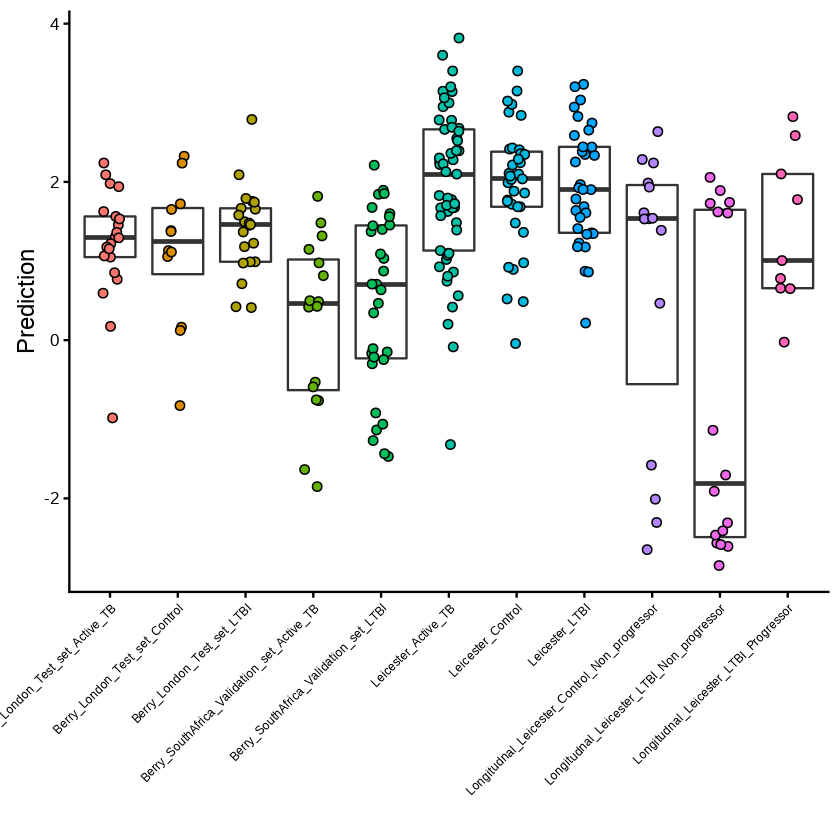

In [378]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(all.pred.tab, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

### Do a scatter plot of median reads in filtered data (low level expressed genes removed) and the final prediction score for the contacts, -1 is the threshold for baloney

- Yes, read completely confounds the score. The score is meaningless with normalization within the Garra dataset.

- This also makes me wonder whether the same occurred in my analysis with the full 250 genes. I have to find this out. If it did, I have to totally back-track on all my validation conclusions and remove that from the study. But really, how does it affect it that much?

- I think I should test with co-normalization with Sul study too.

In [372]:
scatter.contact.ltbi = data.frame(score = late.pred[Garra.pheno.subj$disease == "Longitudnal_Leicester_LTBI_Non_progressor"],
                                 med.read = apply(log2(exprs.fil+1), 2,median)[colnames(exprs.fil) %in% rownames(Garra.pheno.subj[Garra.pheno.subj$disease == "Longitudnal_Leicester_LTBI_Non_progressor",])])

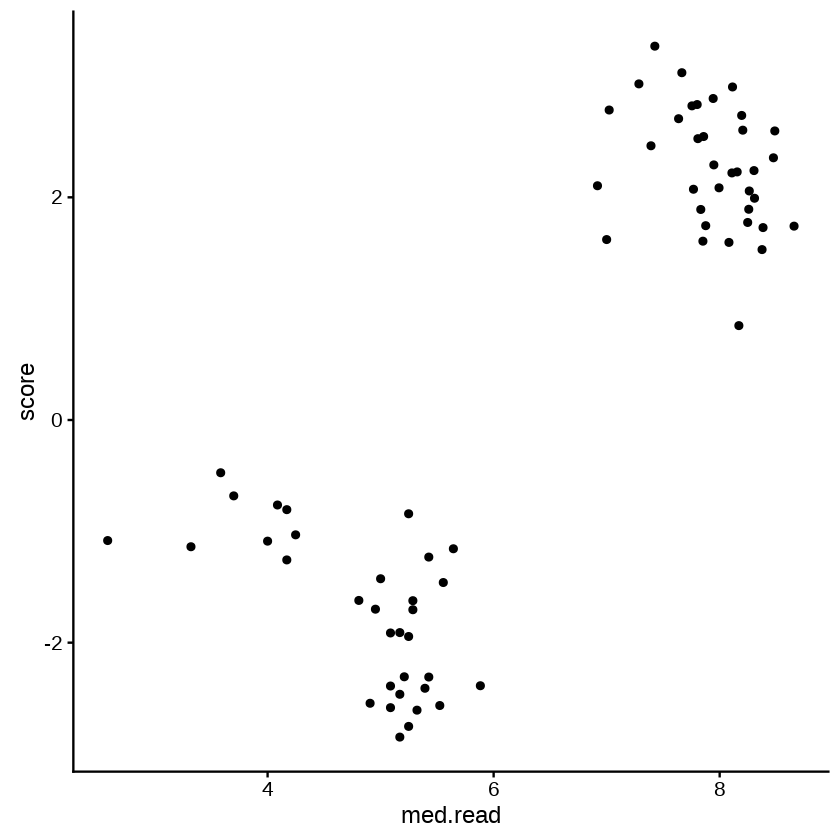

In [374]:
ggplot(scatter.contact.ltbi, aes(x=med.read, y=score)) + geom_point()

In [373]:
head(scatter.contact.ltbi)

,score,med.read
GSM2886154,2.596229,8.487840
GSM2886155,2.603108,8.204571
GSM2886156,2.240210,8.303781
GSM2886157,1.728171,8.383704
GSM2886158,1.991647,8.308339
GSM2886159,2.462943,7.392317


In [222]:
long.subj = unique(dplyr::filter(Garra.pheno,source_name_ch1 %in% c("Longitudnal_Leicester_LTBI_Non_progressor", "Longitudnal_Leicester_Control_Non_progressor"))$patient_id)

ACS.pheno.bar = ACS.pheno
Garra.pheno.bar = droplevels(Garra.pheno[!(Garra.pheno$source_name_ch1 %in% c("Leicester_Control", "Leicester_LTBI") & Garra.pheno$patient_id %in% long.subj), ])
ACS.exprs.bar = ACS.exprs.log[rownames(ACS.exprs.log) %in% rownames(ACS.pheno.bar),]
Garra.exprs.bar = t(Garra.exprs.log[,colnames(Garra.exprs.log) %in% rownames(Garra.pheno.bar)])
pred.ACS.test.prob = predict(human.expose.Sul.ACS.model,  newdata = ACS.exprs.bar[, colnames(ACS.exprs.bar) %in% c(opt.Sul.vars)], type="prob")
pred.Garra.test.prob = predict(human.expose.Sul.Garra.model, newdata = Garra.exprs.bar[, colnames(Garra.exprs.bar) %in% c(opt.Sul.Garra.vars)], type="prob")
ACS.pheno.bar$disease = ACS.pheno.bar$group
Garra.pheno.bar$disease = Garra.pheno.bar$source_name_ch1

All.pheno.bar = data.frame(disease=c(as.character(Garra.pheno.bar$disease), as.character(ACS.pheno.bar$disease)))
All.pheno.bar$late.pred = c(pred.Garra.test.prob$late,pred.ACS.test.prob$late)

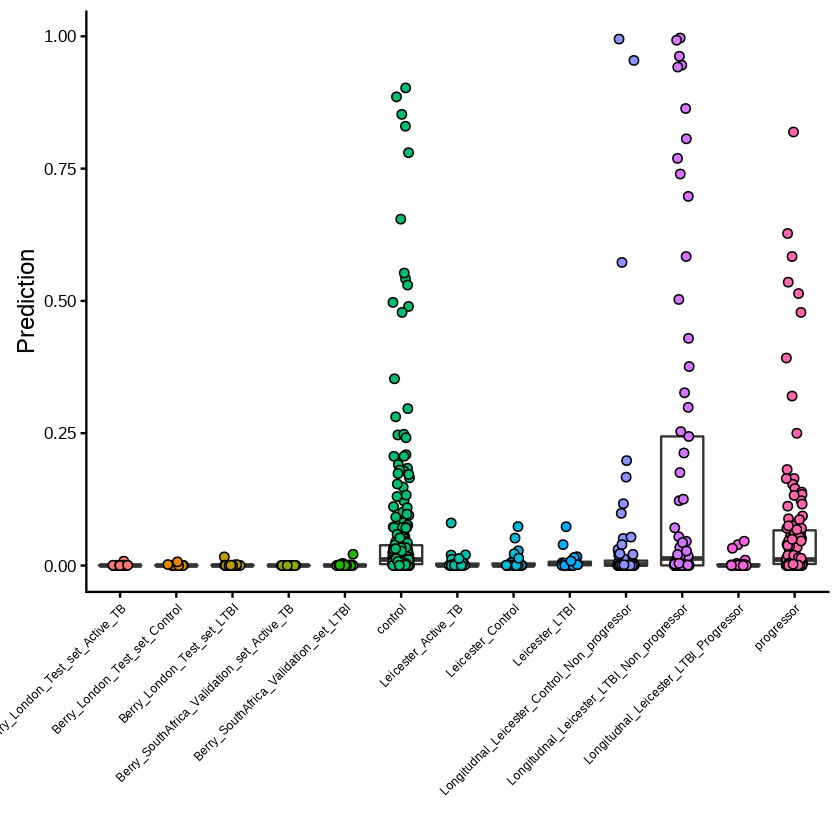

In [224]:
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=disease), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Prediction", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(All.pheno.bar, aes(x=disease, y=late.pred)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

## Figure 7 - Show the relationships between species in the expression of the various signatures:

- 1st - Does the parsimonious human signature predict time period of infection in monkeys and mice?
    - Yes in mice (several genes are detectable), No in monkey (only 1 gene is detected with 1 probe, and this 1 probe does not discriminate)
- 2nd - What is the overlap in differential expression from the larger signatures between the species? Take the 50 gene regression signature from monkeys, the top 50 genes in mice from feature importance and take of the 2500 genes in humans, only those with genome-wide FDR < 0.05 (this is in my supplementary table). I will use the whole datasets, and not just train or test datasets, for this comparison
     - There is hardly any overlap, a little more between humans and monkeys.
     - This in keeping with the literature, especially the cross-species PNAS papers on immune responses
     - I am going to try Disco instead, as it is more geared towards this purpose.
     - There is no great method for answering the question of whether one should believe in this RNA expression phenomenon based on cross-species overlap. It's not a question reducible to a statistical test. No question of "Do I believe?" is reducible to a statistical test!
     
## Now here is what I think to share:

- Share the disco results, including overlaps between pairwise comparisons. I think I should share this with the immunostates figure and the IPA analysis. I think I should move this figure to just after the first results in GC6-74 cohort
- Do share the results of the parsimonious human signature (maybe as part of the validation figure, which I am thinking now to make the last figure). Include here the new thoughts I have on validation for risk of TB in GC6-74 and ACS cohorts. 

### Load Libraries

In [2]:
if (!require("preprocessCore")) {
  source("https://bioconductor.org/biocLite.R")
  biocLite("preprocessCore")
  library("preprocessCore")
}

source("https://bioconductor.org/biocLite.R")
if (!require("Biobase")) {
  biocLite("Biobase")
  library("Biobase")
}

if (!require("biomaRt")) {
  biocLite("biomaRt")
  library("biomaRt")
}

if (!require("GEOquery")) {
  biocLite("GEOquery")
  library("GEOquery")
}

if (!require("ggplot2")) {
  install.packages("ggplot2")
  library("ggplot2")
}

if (!require("randomForest")) {
  install.packages("randomForest")
  library("randomForest")
}

if (!require("cowplot")) {
  install.packages("cowplot")
  library("cowplot")
}
if (!require("sva")) {
  biocLite("sva")
  library("sva")
}

if (!require("pROC")) {
    # pROC 1.12.0 is required, and may not be the default installation:
    packageUrl<- "https://cran.r-project.org/src/contrib/Archive/pROC/pROC_1.12.0.tar.gz"
    install.packages(packageUrl, repos=NULL, type='source')
    library("pROC")
}


if (!require("glmnet")) {
  install.packages("glmnet")
  library("glmnet")
}

if (!require("caret")) {
  install.packages("caret")
  library("caret")
}


if (!require("doParallel")) {
  install.packages("doParallel")
  library("doParallel")
}



Loading required package: preprocessCore
Bioconductor version 3.6 (BiocInstaller 1.28.0), ?biocLite for help
A new version of Bioconductor is available after installing the most recent
  version of R; see http://bioconductor.org/install
Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, cbind, colMeans, colnames,
    colSums, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, lengths, Map, mapply, match,
    mget, order, paste, pmax, 

### Load the mouse, monkey and human data for this comparison. I'll just use the Suliman data for now, but the adolescent microarray data could be used too. I'm just going to work with the probes at this point in the mouse and monkey, since the probes was what I built the models from

### Also run the models in these species (mouse and monkey) in order to get the genes to test across species

- Since I do mean expression of probes through MetaSignature, I could just take the means of probes mapping to homologous genes. I don't think I need to worry about trying to use MetaSignature code for this

#### Mouse

In [2]:
# In case this variable was not defined above, please do so here.
path="."  # this is the TB repository folder

In [4]:
source("utils_submission.R")

mouse.path = paste(path, "/data/GSE124688", sep="")
soft.mouse.file.name = "GSE124688_family.soft"
mouse.soft = getGEO(filename=paste(mouse.path, soft.mouse.file.name, sep="/"))
gsmlist = GSMList(mouse.soft)


Attaching package: ‘dplyr’

The following object is masked from ‘package:nlme’:

    collapse

The following object is masked from ‘package:randomForest’:

    combine

The following object is masked from ‘package:biomaRt’:

    select

The following object is masked from ‘package:Biobase’:

    combine

The following objects are masked from ‘package:BiocGenerics’:

    combine, intersect, setdiff, union

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union

Loading required package: lubridate

Attaching package: ‘lubridate’

The following object is masked from ‘package:base’:

    date

Loading required package: verification
Loading required package: fields
Loading required package: spam
Loading required package: dotCall64
Loading required package: grid
Spam version 2.1-2 (2017-12-21) is loaded.
Type 'help( Spam)' or 'demo( spam)' for a short introduction 
and overview o

In [5]:
# Make the data matrix from the VALUE columns from each GSM, a matrix of detection Pvalues and the pheno data

# Parse the expression matrix
mouse.exprs <- do.call('cbind',lapply(gsmlist,function(x) 
                                      {tab <- Table(x)
                                       return(tab$VALUE)
                                     }))
mouse.exprs <- data.frame(apply(mouse.exprs,2,function(x) {as.numeric(as.character(x))}))
rownames(mouse.exprs) = Table(gsmlist[[1]])$ID_REF

# Parse the Detection P value matrix
detectPval.matrix = do.call('cbind',lapply(gsmlist,function(x) 
                                      {tab <- Table(x)
                                       return(tab[, "Detection Pval"])
                                     }))
detectPval.matrix <- data.frame(apply(detectPval.matrix,2,function(x) {as.numeric(as.character(x))}))
rownames(detectPval.matrix) = Table(gsmlist[[1]])$ID_REF       

# Parse the pheno table
pheno = do.call('rbind', lapply(gsmlist, function(x)
    {chars = Meta(x)$characteristics_ch1
     newchars = chars
     newnames = chars
     i = 1
     for (char in chars) {
         new.name = strsplit(char, split=":")[[1]][1]
        new.data = as.character(sapply(char, function(x) {return(trimws(strsplit(x, split=":")[[1]][2]))}))
         newchars[i] = new.data
         newnames[i] = new.name
         i = i + 1
     }
     return(newchars)}
))

colnames(pheno) = c("strain", "infection.status", "time.point.days", "tissue", "gender")
pheno.data = data.frame(pheno)
pheno.data$time.point.days = as.numeric(as.character(pheno.data$time.point.days))

In [6]:
# Filter probes with a detection P value <= 0.01 in at least 10% of mice
det_pval_thresh = 0.01
PAL.10  = apply(detectPval.matrix <= det_pval_thresh, 1, mean) >= 0.10
mouse.exprs.fil = mouse.exprs[PAL.10,]

# Quantile normalize the data
mouse.exprs.qn = as.data.frame(normalize.quantiles(as.matrix(mouse.exprs.fil)))
colnames(mouse.exprs.qn) = colnames(mouse.exprs.fil)
rownames(mouse.exprs.qn) = rownames(mouse.exprs.fil)

# Set all values <10 to 10
mouse.exprs.qn[mouse.exprs.qn < 10] = 10



# Filter probes by two-fold change in expression from the median in at least 10% of samples (10% 2 fold above, or 10% 2 fold below)
med.exprs = mouse.exprs.qn / apply(mouse.exprs.qn, 1, median)
var.genes = (apply((med.exprs > 2.00) , 1, mean) > 0.10) | (apply((med.exprs < 0.50) , 1, mean) > 0.10)


# Log2 transform data
mouse.exprs.log = log2(mouse.exprs.qn + 1)
mouse.exprs.qn.all = mouse.exprs.qn[var.genes,]
mouse.exprs.log.all = log2(mouse.exprs.qn.all + 1)

In [7]:
mouse.tb= as.data.frame(t(mouse.exprs.log[,pheno.data$infection.status == "Mtb"]))
dim(mouse.tb)
mouse.tb.fil = as.data.frame(t(mouse.exprs.log.all[,pheno.data$infection.status == "Mtb"]))
dim(mouse.tb.fil)
#mouse.table.class$stage = as.factor(stage)

[1]    20 16754

[1]   20 1650

In [8]:
pheno.data = droplevels(pheno.data[pheno.data$infection.status == "Mtb",])

pheno.data$stage = ifelse(pheno.data$time.point.days <= 60, "early","late")

pheno.data

,strain,infection.status,time.point.days,tissue,gender,stage
GSM3541219,C57BL/6,Mtb,30,Whole Blood,female,early
GSM3541220,C57BL/6,Mtb,30,Whole Blood,female,early
GSM3541221,C57BL/6,Mtb,30,Whole Blood,female,early
GSM3541222,C57BL/6,Mtb,30,Whole Blood,female,early
GSM3541223,C57BL/6,Mtb,60,Whole Blood,female,early
GSM3541224,C57BL/6,Mtb,60,Whole Blood,female,early
GSM3541225,C57BL/6,Mtb,60,Whole Blood,female,early
GSM3541226,C57BL/6,Mtb,60,Whole Blood,female,early
GSM3541227,C57BL/6,Mtb,90,Whole Blood,female,late
GSM3541228,C57BL/6,Mtb,90,Whole Blood,female,late


In [125]:
mouse.table.regress = mouse.tb.fil
mouse.table.regress$time.point.days = pheno.data$time.point.days
set.seed(100)
C57.rf.regres = randomForest(time.point.days~., data=mouse.table.regress, importance=T)

Warning message in randomForest.default(m, y, ...):
“The response has five or fewer unique values.  Are you sure you want to do regression?”

In [128]:
B6.regres.imp = data.frame(importance(C57.rf.regres))
mouse.impvar = rownames(B6.regres.imp)[order(B6.regres.imp[,1], decreasing=TRUE)]

In [129]:
length(mouse.impvar)

[1] 1650

#### Monkey

In [8]:
source("utils_submission.R")

In [9]:
monkey.path = paste(path, "/data/GSE84152", sep="")

In [10]:
monkey.gset = getGEO(filename=paste(monkey.path, "GSE84152_series_matrix.txt.gz", sep="/"), 
             destdir=monkey.path)

Parsed with column specification:
cols(
  .default = col_double(),
  ID_REF = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL10558 found here:
./data/GSE84152/GPL10558.soft 


In [11]:
monkey.gset

ExpressionSet (storageMode: lockedEnvironment)
assayData: 47323 features, 470 samples 
  element names: exprs 
protocolData: none
phenoData
  sampleNames: GSM2227793 GSM2227794 ... GSM2228262 (470 total)
  varLabels: title geo_accession ... wbc:ch1 (95 total)
  varMetadata: labelDescription
featureData
  featureNames: ILMN_1343291 ILMN_1343295 ... ILMN_3311190 (47323
    total)
  fvarLabels: ID Species ... GB_ACC (30 total)
  fvarMetadata: Column Description labelDescription
experimentData: use 'experimentData(object)'
Annotation: GPL10558 

In [12]:
raw.expres = read.table(file = paste(monkey.path, "GSE84152_non-normalized.txt", sep="/"), header=T , sep="\t")

In [13]:
pheno = filter.monkey.pheno(pData(monkey.gset))

              title ChIP hyb.chamber  dataset synchroset monkeyid time.point
GSM2227793  M16_150    1           1 Training         No      M16        150
GSM2227794    M17_3    1           1 Training         No      M17          3
GSM2227795  M8_Pre2    1           1 Training         No       M8          1
GSM2227796   M19_56    1           1 Training         No      M19         56
GSM2227797   M19_90    1           1 Training         No      M19         90
GSM2227798     M1_7    1           1 Training         No       M1          7
GSM2227799   M18_20    1           1 Training         No      M18         20
GSM2227800   M15_90    1           1 Training         No      M15         90
GSM2227801    M1_42    1           1 Training         No       M1         42
GSM2227802  M13_180    1           1 Training        Yes      M13        180
GSM2227803   M17_10    1           1 Training         No      M17         10
GSM2227804   M18_10    1           1 Training         No      M18         10

In [14]:
PAL.5 = get.monkey.expressed.genes(raw.expres)

[1] "Genes expressed in at least 5 % of samples: 15083"


In [15]:
expres = process.monkey.exprs(exprs(monkey.gset), PAL.5)

Found2batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data

Found12batches
Adjusting for0covariate(s) or covariate level(s)


Standardizing Data across genes


Fitting L/S model and finding priors
Finding parametric adjustments
Adjusting the Data



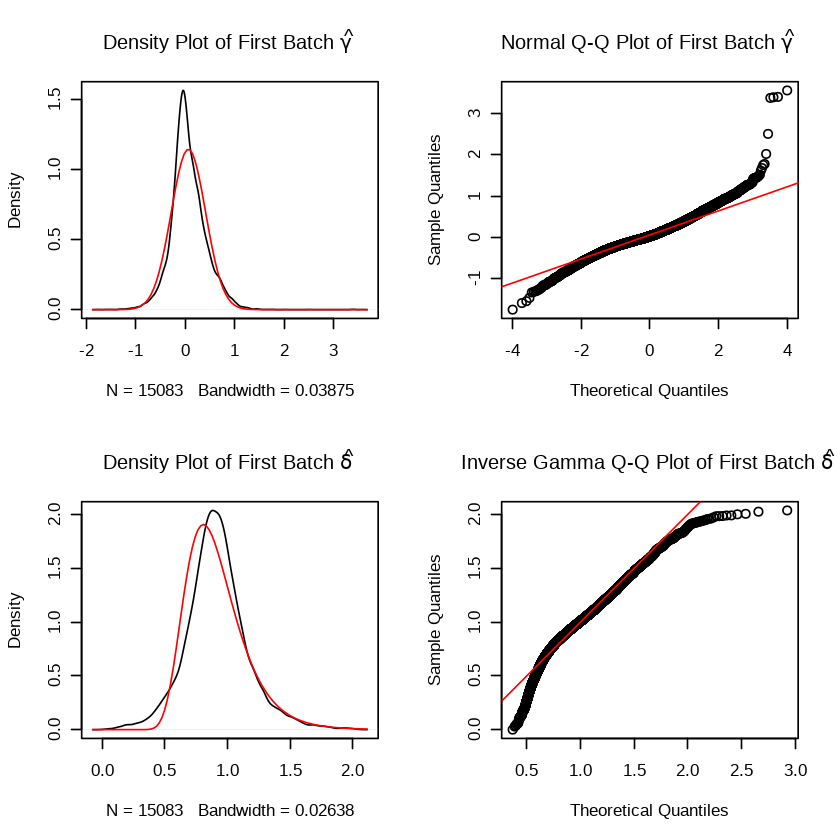

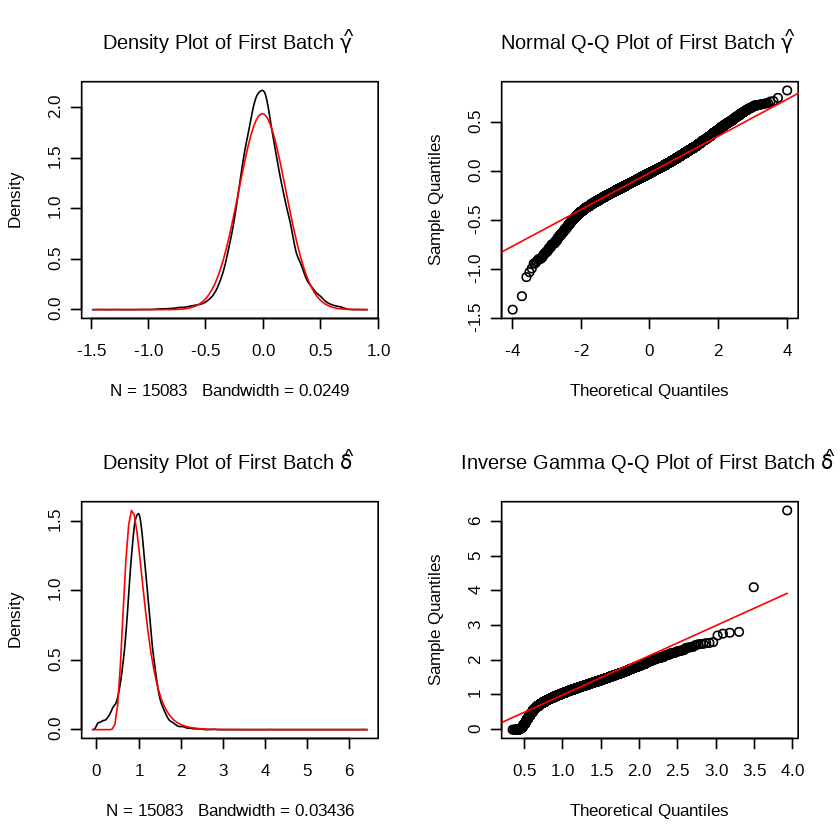

In [16]:
modcombat<-model.matrix(~1, data=pheno)
combat_dataset= ComBat(dat=expres, batch=pheno$dataset, mod=modcombat, par.prior=TRUE, prior.plots=TRUE)
expres = ComBat(dat=combat_dataset, batch=pheno$hyb.chamber, mod=modcombat, par.prior=TRUE, prior.plots=TRUE)
  


In [147]:
cut = 0.6

filter = function(x) {IQR(x) / median(x)}
genes.range = apply(expres, 1, filter)
criteria = quantile(genes.range, c(1-cut))

genes.f = rownames(expres)[genes.range > criteria]
expres = expres[genes.f,]

In [17]:
expres = expres[, pheno$time.point > 10]
pheno = pheno[pheno$time.point > 10,]
pheno$time.period = as.factor(ifelse(pheno$time.point >= 90,
                                             "late",
                                             "early"))
expres = t(expres)

In [18]:
dim(expres)
dim(pheno)

[1]   294 15083

[1] 294  13

In [150]:
test.latent.monkeys = c('M13', 'M27', 'M34', 'M15', 'M35', 'M36')
test.active.monkeys = c('M1', 'M16', 'M32', 'M18', 'M23')

In [151]:
test.rows = rownames(pheno[pheno$monkeyid %in% union(test.latent.monkeys, test.active.monkeys),])
train.rows = setdiff(rownames(pheno), test.rows)

if (dim(expres)[1] > dim(expres)[2])
    expres = t(expres)

pheno.train = droplevels(pheno[train.rows,])
pheno.test = droplevels(pheno[test.rows,])
expres.train = expres[train.rows,]
expres.test = expres[test.rows,]

In [154]:
set.seed(100)
folds = groupKFold(pheno.train$monkeyid, k=10)
for (fold in lapply(folds, function(x) {pheno.train$monkeyid[x]}))
    print(length((as.character(fold))))

lapply(folds, function(x, y) table(y[x]), y = pheno.train$monkeyid)

[1] 202
[1] 194
[1] 186
[1] 174
[1] 187
[1] 179
[1] 186
[1] 178
[1] 194


$Fold1

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   8   8   0   8   7   8   8   8   8   8   8   8   8   8   8   8   7   8   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   8   8 

$Fold2

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   8   8   8   8   7   8   8   8   0   8   8   8   8   8   8   8   7   8   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   0   8 

$Fold3

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  5   0   8   8   8   7   8   8   8   8   8   8   0   8   8   8   0   7   8   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   8   8 

$Fold4

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 M37 
  0   8   8   8   8   7   8   0   8   8   8   8   8   0   8   8   8   0   0   8 
M38  M4  M5  M6  M7  M8  M9 
  7   8   8   8   8   8   8 

$Fold5

M10 M11 M12 M14 M17 M19  M2 M20 M21 M22 M24 M25 M26 M28 M29  M3 M30 M31 M33 

In [155]:
set.seed(100)

n = 1000
lambda.grid = c(10 ^ runif(n, min = log10(1e0), max = log10(1e2)))

alpha.grid = runif(length(lambda.grid), min = 0.00, 1.00)

train.grid = data.frame(lambda = sample(lambda.grid, length(lambda.grid)),
                       alpha = sample(alpha.grid, length(lambda.grid)))


In [156]:
seed=7

library(doParallel)

start_time <- Sys.time()

cluster = makeCluster(detectCores()-3) # Leaving 3 for other jobs
registerDoParallel(cluster)

methods = c("glmnet")


models = list()


#folds
control <- trainControl(method="cv", index=folds, savePredictions = 'final', allowParallel=TRUE)

for (alg in methods) {
    set.seed(seed)
    print("I have gotten to model:")
    print(alg)
    model = train(expres.train, pheno.train$time.point, tuneGrid = train.grid, method=alg, trControl=control) # 
    models[[alg]] = model
}

stopCluster(cluster)
registerDoSEQ()

end_time <- Sys.time()
print(end_time - start_time)

[1] "I have gotten to model:"
[1] "glmnet"


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
“There were missing values in resampled performance measures.”

Time difference of 11.52987 mins


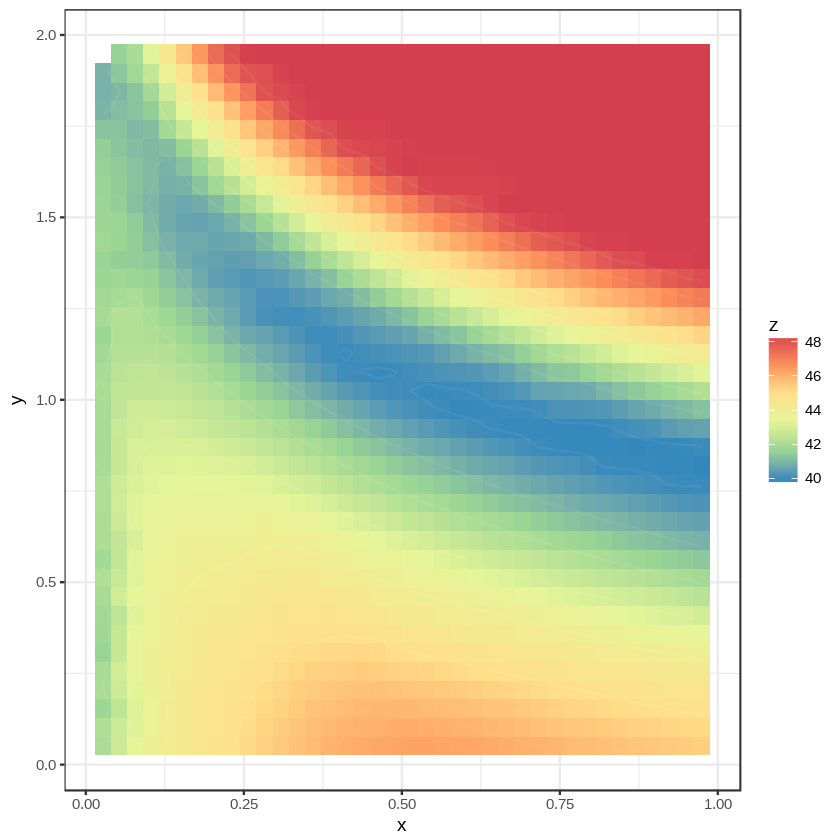

In [159]:
glmres = models$glmnet$results
graph.hyper(glmres$alpha, log10(glmres$lambda), glmres$MAE)


In [160]:
glmnet.monkey.model = models$glmnet$finalModel
coefs.monkey.regress = coef(glmnet.monkey.model, s=models$glmnet$bestTune$lambda)
nonzero.coefs.r = data.frame(name = coefs.monkey.regress@Dimnames[[1]][coefs.monkey.regress@i + 1], coefficient = coefs.monkey.regress@x)
sort.coeffs.r = nonzero.coefs.r[order(-abs(nonzero.coefs.r$coefficient)), ]
monkey.genes = sort.coeffs.r$name[2:length(sort.coeffs.r$name)]


In [162]:
length(monkey.genes)

[1] 45

In [ ]:
"source": [
    "glmnet.monkey.model = models$glmnet$finalModel\n",
    "\n",
    "coefs.monkey.regress = coef(glmnet.monkey.model, s=models$glmnet$bestTune$lambda)\n",
    "#coef(models$glmnet$finalModel, models$glmnet$finalModel$lambdaOpt)\n",
    "\n",
    "nonzero.coefs.r = data.frame(name = coefs.monkey.regress@Dimnames[[1]][coefs.monkey.regress@i + 1], coefficient = coefs.monkey.regress@x)\n",
    "sort.coeffs.r = nonzero.coefs.r[order(-abs(nonzero.coefs.r$coefficient)), ]#, sort(abs(nonzero.coefs$coefficient), T)\n",
    "\n",
    "\n",
    "genes.coefs.r = sort.coeffs.r$name[2:length(sort.coeffs.r$name)]\n",
    "#genes.coefs.r = genes.coefs.r[1:50]"

#### Human

In [19]:
source("utils_submission.R")

Sul.path = paste(path, "/data/GSE94438", sep="")

human.pheno.set = getGEO(filename=paste(Sul.path, "GSE94438_series_matrix.txt.gz", sep="/"),
             destdir=Sul.path)

human.pheno = filter.human.pheno(pData(human.pheno.set))

human.exprs.set = read.csv(file=paste(Sul.path, "GSE94438_rawCounts_GeneNames_AllSamples.csv", sep="/"), header=T, row.names = 1)
human.exprs = filter.human.exprs(human.exprs.set, human.pheno)

Parsed with column specification:
cols(
  .default = col_character()
)
See spec(...) for full column specifications.
Using locally cached version of GPL11154 found here:
./data/GSE94438/GPL11154.soft 
Warning message in filter.human.pheno(pData(human.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(human.pheno.set)):
“NAs introduced by coercion”Warning message in filter.human.pheno(pData(human.pheno.set)):
“NAs introduced by coercion”

           age code gender group site subjectid time.from.exposure.months
GSM2475704  NA  672     NA    NA   NA        NA                        NA
GSM2475705  NA  694     NA    NA   NA        NA                        NA
GSM2475706  NA  695     NA    NA   NA        NA                        NA
GSM2475722  NA  994     NA    NA   NA        NA                        NA
GSM2475742  NA 1061     NA    NA   NA        NA                        NA
GSM2475748  NA 1194     NA    NA   NA        NA                        NA
           time.to.tb.months
GSM2475704                NA
GSM2475705                NA
GSM2475706                NA
GSM2475722                NA
GSM2475742                NA
GSM2475748                NA
 [1] "GSM2475598" "GSM2475603" "GSM2475587" "GSM2475592" "GSM2475599"
 [6] "GSM2475604" "GSM2475360" "GSM2475387" "GSM2475362" "GSM2475389"
[11] "GSM2475402" "GSM2475555" "GSM2475361" "GSM2475388" "GSM2475359"
[16] "GSM2475390" "GSM2475588" "GSM2475593" "GSM2475591" "GSM2475596"

In [20]:
# Filter out genes whose counts are <= 5 in 50% of samples
exprs.j.keep = apply(human.exprs <= 5, 1, mean) <= 0.5

human.exprs.fil = human.exprs[exprs.j.keep,]

human.exprs.qn = as.data.frame(normalize.quantiles(as.matrix(human.exprs.fil)))
colnames(human.exprs.qn) = colnames(human.exprs.fil)
rownames(human.exprs.qn) = rownames(human.exprs.fil)
human.exprs.log = log2(human.exprs.qn + 1)

human.pheno.6mo = human.pheno

# Randomly sample 50% of AHRI site to training set and test set for this new human.pheno

AHRI.subj = unique(dplyr::filter(human.pheno, site == "AHRI")$subjectid)
set.seed(100)
AHRI.subj.train = sample(AHRI.subj, length(AHRI.subj) / 2)
human.pheno.6mo$dataset[human.pheno.6mo$subjectid %in% AHRI.subj.train] = "Training"

# Filter pheno and splice expression table to include only AHRI and MRC sites and to include only 0 and 6 month time points

human.pheno.6mo = droplevels(dplyr::filter(human.pheno.6mo, site %in% c("AHRI", "MRC"), time.from.exposure.months %in% c(0, 6)))
human.pheno.6mo$status = ifelse(human.pheno.6mo$group == "Control", "control", "progressor")

human.exprs.log.6mo = human.exprs.log[, colnames(human.exprs.log) %in% human.pheno.6mo$code]
human.exprs.log.6mo = t(human.exprs.log.6mo)

In [21]:
dim(human.pheno.6mo)
dim(human.exprs.log.6mo)

[1] 183  10

[1]   183 14842

### Do disco comparison between the different species

- Now I have a comparable amount of probes/genes

In [351]:
dim(expres)
dim(pheno)

dim(mouse.tb)
dim(pheno.data)

dim(human.pheno.6mo)
dim(human.exprs.log.6mo)

[1]   294 15083

[1] 294  13

[1]    20 16754

[1] 20  6

[1] 183  10

[1]   183 14842

In [27]:
mouse.tb.disco = mouse.tb
#mouse.tb.disco$target = rownames(mouse.tb.disco)

#### Perform orthologue assignment before linear models with limma
    - Starting with the mouse and human to develop the code.

Weiner et al 2017:

"Ortholog assignment
Orthologous genes were assigned to each other between corresponding human and mouse data sets used in each comparison. Probe names specific to the microarray used were assigned an ENSEMBL identifier with use of “mapIds” function from biomaRt package (version 2.24.1)41,42. Multiple repeating probes were averaged by applying limma “avereps” function. Then, orthologous human and mouse genes were identified with biomaRt “getLDS” function based on homology mapping between different species interlinked in Ensembl data base (with attributes and filters defined as “ensembl_gene_id”). Only the putative orthologs with a 1:1 mapping (no potential in-paralogs) were included in the further analysis."

In [23]:
library(limma)


Attaching package: ‘limma’

The following object is masked from ‘package:BiocGenerics’:

    plotMA



In [24]:
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")

In [25]:
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

##### Human vs Mouse

In [28]:
mouse.probes = getBM(attributes = c("illumina_mousewg_6_v2", "ensembl_gene_id"),
                        filters="illumina_mousewg_6_v2",
                        values = colnames(mouse.tb.disco), mart = mouse, uniqueRows=TRUE)

In [29]:
u.mouse.probes = mouse.probes[!duplicated(mouse.probes[,c('illumina_mousewg_6_v2')]),]

In [30]:
mouse.disco.genes = mouse.tb.disco[,colnames(mouse.tb.disco) %in% u.mouse.probes$illumina_mousewg_6_v2]
mouse.disco.genes = mouse.disco.genes[,match(u.mouse.probes$illumina_mousewg_6_v2,colnames(mouse.disco.genes))]
#rownames(mouse.disco.genes) = u.mouse.probes$ensembl_gene_id
mouse.disco.genes = t(avereps(t(mouse.disco.genes), ID=u.mouse.probes$ensembl_gene_id))

In [31]:
head(mouse.disco.genes)

ERROR while rich displaying an object: Error in sprintf(wrap, header, body): 'fmt' length exceeds maximal format length 8192

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     rpr <- mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     rpr <- mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. mime2repr[[mime]](obj)
8. repr_latex.matrix(obj)
9. repr_matrix_generic(obj, sprintf("\\begin{tabular}{%s}\n%%s%%s\\end{tabular}\n", 
 .     cols), "%s\\\\\n\\hline\n", "  &", " %s &", "%s", "\t%s\\\\\n", 
 .     "%s &", " %s &", escape_fun = latex_escape_vec, ...)
10. sprintf(wrap

,ENSMUSG00000064367,ENSMUSG00000064341,ENSMUSG00000050088,ENSMUSG00000061461,ENSMUSG00000050552,ENSMUSG00000013495,ENSMUSG00000027327,ENSMUSG00000067847,ENSMUSG00000030741,ENSMUSG00000083763,⋯,ENSMUSG00000046572,ENSMUSG00000049295,ENSMUSG00000034265,ENSMUSG00000075227,ENSMUSG00000037001,ENSMUSG00000039841,ENSMUSG00000029587,ENSMUSG00000024792,ENSMUSG00000022000,ENSMUSG00000041215
GSM3541219,10.42932,14.02048,6.758298,7.618214,10.94689,6.202380,11.45223,8.080793,5.698298,7.655789,⋯,5.614933,7.194125,6.089690,6.605989,6.559808,5.112188,7.726954,6.269909,6.334904,6.418265
GSM3541220,10.71712,14.02753,6.380789,7.739945,10.79767,5.941918,11.35773,7.999023,5.770498,7.529665,⋯,5.543137,7.332540,6.673233,6.165290,6.850085,4.560738,8.198159,6.078492,6.576829,6.663137
GSM3541221,10.24862,14.07400,6.469542,7.753536,10.98306,6.572893,11.03339,7.036888,5.694970,7.169929,⋯,5.775409,7.454028,6.109573,6.713360,6.843012,4.079742,8.039382,6.326038,6.437799,6.465552
GSM3541222,10.23775,13.99735,6.243307,7.600567,10.99185,6.537673,10.74413,7.710055,5.076773,7.150252,⋯,5.933662,7.291018,6.407142,6.949808,6.773890,4.522486,8.023074,6.389218,6.781005,6.726952
GSM3541223,10.17723,13.84354,6.634565,7.769789,10.82916,6.332123,11.66693,7.796816,5.925945,7.178500,⋯,5.862201,7.376893,6.198773,6.243250,6.874905,3.459432,8.330654,6.429671,6.279452,6.257808
GSM3541224,10.21582,14.06979,6.421807,7.943337,10.97303,6.086806,11.19061,7.616736,5.993242,7.402628,⋯,6.026475,7.417257,6.790413,6.673573,7.020254,4.567966,8.160480,6.295067,5.961881,6.420312


In [32]:
dim(u.mouse.probes)
dim(mouse.disco.genes)

[1] 15609     2

[1]    20 10214

In [33]:
head(mouse.probes)
head(u.mouse.probes)

illumina_mousewg_6_v2,ensembl_gene_id
ILMN_2551741,ENSMUSG00000064367
ILMN_2551741,ENSMUSG00000064366
ILMN_2551741,ENSMUSG00000064365
ILMN_2551741,ENSMUSG00000064364
ILMN_2551741,ENSMUSG00000064363
ILMN_1240829,ENSMUSG00000064341


,illumina_mousewg_6_v2,ensembl_gene_id
1,ILMN_2551741,ENSMUSG00000064367
6,ILMN_1240829,ENSMUSG00000064341
9,ILMN_3009738,ENSMUSG00000050088
10,ILMN_3009735,ENSMUSG00000050088
11,ILMN_2718861,ENSMUSG00000050088
12,ILMN_2514723,ENSMUSG00000061461


In [34]:
mouse.disco.human = getLDS(attributes = c('ensembl_gene_id'),
 filters = c("ensembl_gene_id"),
    values = colnames(mouse.disco.genes), mart = mouse,
    attributesL = c("ensembl_gene_id"),
        martL=human)

In [35]:
head(mouse.disco.human)

Gene.stable.ID,Gene.stable.ID.1
ENSMUSG00000064358,ENSG00000198938
ENSMUSG00000064354,ENSG00000198712
ENSMUSG00000064367,ENSG00000198786
ENSMUSG00000064341,ENSG00000198888
ENSMUSG00000064357,ENSG00000198899
ENSMUSG00000064363,ENSG00000198886


In [36]:
dim(mouse.disco.human)
dim(unique(mouse.disco.human))
table(table(mouse.disco.human$Gene.stable.ID))

[1] 9854    2

[1] 9854    2


   1    2    3    4    5    6    7    8   13   14   15   16   18   19   22   24 
8641  319   46   12    4   11    1    4    2    1    4    2    1    1    2    1 
  27 
   1 

In [37]:
mouse.disco.human.genes = mouse.disco.genes[,!(colnames(mouse.disco.genes) %in% 
                                               mouse.disco.human$Gene.stable.ID[duplicated(mouse.disco.human$Gene.stable.ID)]) &
                                           (colnames(mouse.disco.genes) %in% mouse.disco.human$Gene.stable.ID) &
                                           !(colnames(mouse.disco.genes) %in% 
                                             mouse.disco.human[mouse.disco.human$Gene.stable.ID.1 %in% 
                                                              mouse.disco.human$Gene.stable.ID.1[duplicated(mouse.disco.human$Gene.stable.ID.1)],]$Gene.stable.ID)]

mouse.disco.human.fil = mouse.disco.human[mouse.disco.human$Gene.stable.ID %in% colnames(mouse.disco.human.genes),]
mouse.disco.human.genes = mouse.disco.human.genes[,match(mouse.disco.human.fil$Gene.stable.ID, colnames(mouse.disco.human.genes))]
colnames(mouse.disco.human.genes) = mouse.disco.human.fil$Gene.stable.ID.1

In [38]:
dim(mouse.disco.human.fil)

[1] 8475    2

In [39]:
dim(mouse.disco.human.genes)

[1]   20 8475

In [40]:
identical(colnames(mouse.disco.human.genes), mouse.disco.human.fil$Gene.stable.ID.1)

[1] TRUE

In [41]:
table(table(mouse.disco.human.fil$Gene.stable.ID))
table(table(mouse.disco.human.fil$Gene.stable.ID.1))


   1 
8475 


   1 
8475 

In [42]:
sum(colnames(human.exprs.log.6mo) %in% colnames(mouse.disco.human.genes))

[1] 7956

In [43]:
human.disco.mouse.genes  = human.exprs.log.6mo[,colnames(human.exprs.log.6mo) %in% colnames(mouse.disco.human.genes)]
mouse.disco.human.genes = mouse.disco.human.genes[,colnames(mouse.disco.human.genes) %in% colnames(human.disco.mouse.genes)]
human.disco.mouse.genes = human.disco.mouse.genes[,match(colnames(mouse.disco.human.genes), colnames(human.disco.mouse.genes))]

In [44]:
sum(colnames(human.exprs.log.6mo) %in% colnames(mouse.disco.human.genes))

[1] 7956

In [45]:
identical(colnames(human.disco.mouse.genes), colnames(mouse.disco.human.genes))

[1] TRUE

In [46]:
dim(mouse.disco.human.genes)
dim(human.disco.mouse.genes)

[1]   20 7956

[1]  183 7956

##### Human vs. Monkey

In [173]:
monkey.probes = getBM(attributes = c("illumina_humanht_12_v4", "ensembl_gene_id"),
                        filters="illumina_humanht_12_v4",
                        values = colnames(expres), mart = human,  uniqueRows=TRUE)

In [175]:
u.monkey.probes = monkey.probes[!duplicated(monkey.probes[,c('illumina_humanht_12_v4')]),]

In [176]:
monkey.disco.genes = expres[,colnames(expres) %in% u.monkey.probes$illumina_humanht_12_v4]
monkey.disco.genes = monkey.disco.genes[,match(u.monkey.probes$illumina_humanht_12_v4,colnames(monkey.disco.genes))]
monkey.disco.genes = t(avereps(t(monkey.disco.genes), ID=u.monkey.probes$ensembl_gene_id))

In [177]:
head(monkey.disco.genes)

ERROR while rich displaying an object: Error in sprintf(wrap, header, body): 'fmt' length exceeds maximal format length 8192

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     rpr <- mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     rpr <- mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. mime2repr[[mime]](obj)
8. repr_latex.matrix(obj)
9. repr_matrix_generic(obj, sprintf("\\begin{tabular}{%s}\n%%s%%s\\end{tabular}\n", 
 .     cols), "%s\\\\\n\\hline\n", "  &", " %s &", "%s", "\t%s\\\\\n", 
 .     "%s &", " %s &", escape_fun = latex_escape_vec, ...)
10. sprintf(wrap

,ENSG00000206990,ENSG00000207367,ENSG00000200403,ENSG00000276769,ENSG00000200893,ENSG00000197142,ENSG00000176915,ENSG00000283189,ENSG00000089053,ENSG00000114770,⋯,ENSG00000117174,ENSG00000243943,ENSG00000147130,ENSG00000143373,ENSG00000180787,ENSG00000167840,ENSG00000176371,ENSG00000196812,ENSG00000197279,ENSG00000142684
GSM2227793,9.956287,7.062131,4.654939,7.168076,5.510526,5.849821,4.895158,5.918236,8.953731,5.157331,⋯,3.735915,3.312301,4.345088,6.116972,4.895383,4.204588,4.731563,3.478682,3.475457,6.578228
GSM2227796,9.594570,6.845902,4.417277,6.991300,5.054604,5.989231,5.371417,6.528446,8.948000,5.336760,⋯,4.186108,3.312301,4.230962,5.556049,4.384552,3.721786,5.399535,5.133587,3.343844,6.944506
GSM2227797,9.748171,6.841031,4.587200,7.042747,3.859346,5.666271,5.136077,6.982847,8.854106,5.262847,⋯,3.456935,3.312301,4.351778,5.640196,4.086231,3.870925,5.085190,3.885190,3.398084,7.292108
GSM2227799,9.152435,6.026310,3.382864,7.004699,7.504243,5.952925,4.900224,6.589679,8.919546,4.859817,⋯,3.456935,3.312301,3.614838,6.003466,3.802917,4.394182,4.648112,3.445455,4.002506,5.586170
GSM2227800,10.461715,7.260524,5.305693,7.884169,5.327122,6.308011,4.811713,6.416072,9.663316,4.647694,⋯,3.456935,3.312301,4.749455,5.791776,3.455014,4.257511,4.362785,3.267935,4.138229,7.622208
GSM2227801,9.760975,6.915589,3.545938,8.079882,4.513822,5.583120,5.050888,6.225604,9.222783,5.376283,⋯,3.456935,3.312301,5.121010,6.418554,3.714827,3.911819,5.192051,3.572121,4.908525,7.683820


In [178]:
dim(u.monkey.probes)
dim(monkey.disco.genes)

head(monkey.probes)
head(u.monkey.probes)

[1] 13344     2

[1]   294 10687

illumina_humanht_12_v4,ensembl_gene_id
ILMN_1761804,ENSG00000206990
ILMN_1660199,ENSG00000207367
ILMN_1677043,ENSG00000200403
ILMN_2103841,ENSG00000276769
ILMN_1685952,ENSG00000200893
ILMN_1705247,ENSG00000197142


illumina_humanht_12_v4,ensembl_gene_id
ILMN_1761804,ENSG00000206990
ILMN_1660199,ENSG00000207367
ILMN_1677043,ENSG00000200403
ILMN_2103841,ENSG00000276769
ILMN_1685952,ENSG00000200893
ILMN_1705247,ENSG00000197142


In [189]:
human.disco.monkey.genes  = human.exprs.log.6mo[,colnames(human.exprs.log.6mo) %in% colnames(monkey.disco.genes)]
monkey.disco.human.genes = monkey.disco.genes[,colnames(monkey.disco.genes) %in% colnames(human.disco.monkey.genes)]
human.disco.monkey.genes = human.disco.monkey.genes[,match(colnames(monkey.disco.human.genes), colnames(human.disco.monkey.genes))]

In [195]:
sum(colnames(human.exprs.log.6mo) %in% colnames(monkey.disco.human.genes))

identical(colnames(human.disco.monkey.genes), colnames(monkey.disco.human.genes))

dim(monkey.disco.human.genes)
dim(human.disco.monkey.genes)

[1] 7986

[1] TRUE

[1]  294 7986

[1]  183 7986

##### Monkey vs. Mouse

- Repeats parts of other species comparison, so need to be run in order

In [200]:
# Repeat this level of processing

mouse.disco.monkey.genes = mouse.disco.genes[,!(colnames(mouse.disco.genes) %in% 
                                               mouse.disco.human$Gene.stable.ID[duplicated(mouse.disco.human$Gene.stable.ID)]) &
                                           (colnames(mouse.disco.genes) %in% mouse.disco.human$Gene.stable.ID) &
                                           !(colnames(mouse.disco.genes) %in% 
                                             mouse.disco.human[mouse.disco.human$Gene.stable.ID.1 %in% 
                                                              mouse.disco.human$Gene.stable.ID.1[duplicated(mouse.disco.human$Gene.stable.ID.1)],]$Gene.stable.ID)]

mouse.disco.human.fil = mouse.disco.human[mouse.disco.human$Gene.stable.ID %in% colnames(mouse.disco.monkey.genes),]
mouse.disco.monkey.genes = mouse.disco.monkey.genes[,match(mouse.disco.human.fil$Gene.stable.ID, colnames(mouse.disco.monkey.genes))]
colnames(mouse.disco.monkey.genes) = mouse.disco.human.fil$Gene.stable.ID.1

In [201]:
dim(mouse.disco.monkey.genes)
dim(monkey.disco.genes)

[1]   20 8475

[1]   294 10687

In [202]:
mouse.disco.monkey.genes  = mouse.disco.monkey.genes[,colnames(mouse.disco.monkey.genes) %in% colnames(monkey.disco.genes)]
monkey.disco.mouse.genes = monkey.disco.genes[,colnames(monkey.disco.genes) %in% colnames(mouse.disco.monkey.genes)]
mouse.disco.monkey.genes = mouse.disco.monkey.genes[,match(colnames(monkey.disco.mouse.genes), colnames(mouse.disco.monkey.genes))]

In [203]:
identical(colnames(mouse.disco.monkey.genes),colnames(monkey.disco.mouse.genes))
dim(mouse.disco.monkey.genes)
dim(monkey.disco.mouse.genes)

[1] TRUE

[1]   20 5564

[1]  294 5564

#### Perform Limma differential expression 

##### Matching mouse and human genes. 

In [47]:
dim(mouse.disco.human.genes)
dim(human.disco.mouse.genes)

[1]   20 7956

[1]  183 7956

In [119]:
m.stage = as.factor(ifelse(pheno.data$stage == "early", 0, 1))

m.fit = lmFit(t(mouse.disco.human.genes), design=model.matrix(~m.stage))

m.fit = eBayes(m.fit)

m.tt = topTable(m.fit, coef=2, number=dim(mouse.disco.human.genes)[2], sort.by="none")

In [121]:
head(m.tt)
dim(m.tt)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000198938,0.13842877,12.134932,0.8675899,0.39533396,0.6487782,-5.985089
ENSG00000198712,0.15398958,11.226397,0.6859773,0.50016162,0.7286807,-6.124357
ENSG00000198786,0.32305404,10.533876,2.1339827,0.04468145,0.2010665,-4.270510
ENSG00000198888,0.02294027,14.004508,0.3269137,0.74693913,0.8782465,-6.306657
ENSG00000198899,0.06510228,13.278040,0.5050707,0.61871973,0.8028853,-6.231976
ENSG00000198886,0.23815776,9.414603,1.9544765,0.06396137,0.2441826,-4.580238


[1] 7956    6

In [75]:
table(h.stage)

h.stage
  0   1 
 79 104 

In [109]:
h.stage = as.factor(ifelse(human.pheno.6mo$time.from.exposure.months==0, 1, 0))

h.fit = lmFit(t(human.disco.mouse.genes), design=model.matrix(~h.stage))

h.fit = eBayes(h.fit)

h.tt = topTable(h.fit, coef=2, number=dim(human.disco.mouse.genes)[2], sort.by="none")

In [118]:
dim(h.tt)

[1] 7956    6

In [107]:
dim(human.disco.mouse.genes)

[1]  183 7956

In [122]:
head(h.tt)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000198938,-0.03577655,16.93823,-0.5701031,0.5693008,0.7263242,-5.814938
ENSG00000198712,-0.03474970,16.96462,-0.5353072,0.5930817,0.7447219,-5.833001
ENSG00000198786,-0.03980014,16.19093,-0.4072880,0.6842683,0.8108403,-5.889692
ENSG00000198888,-0.06812350,16.97279,-0.8207349,0.4128557,0.5980845,-5.651428
ENSG00000198899,-0.06080657,16.50005,-0.8376319,0.4033205,0.5902902,-5.638299
ENSG00000198886,-0.04738771,17.89982,-0.5852727,0.5590790,0.7191645,-5.806710


In [124]:
max(h.tt$logFC)

[1] 0.475474

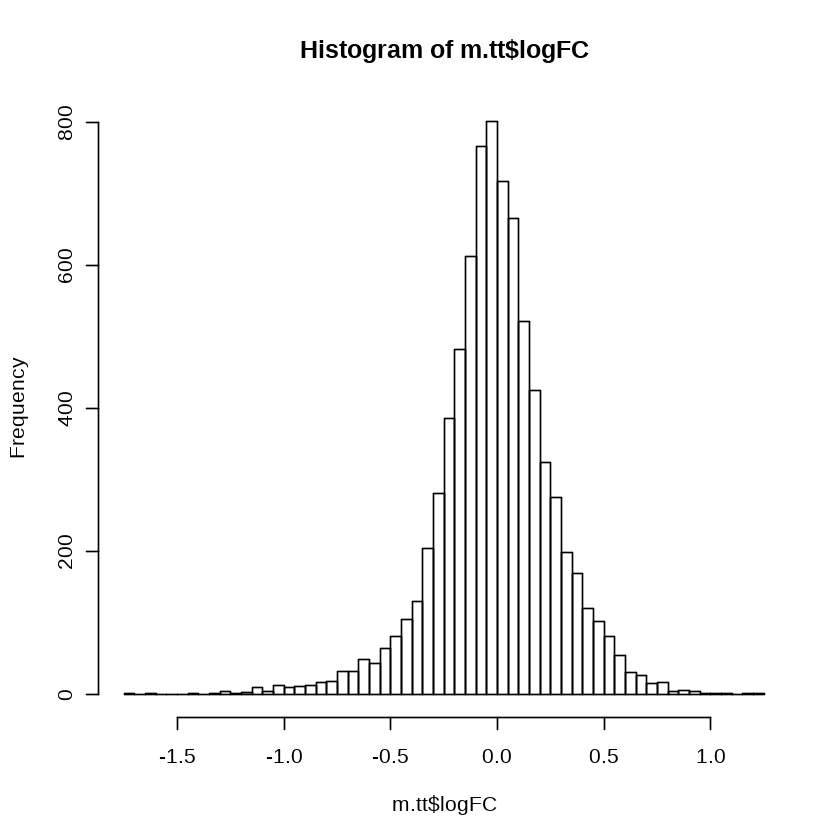

In [126]:
hist(m.tt$logFC, breaks=100)

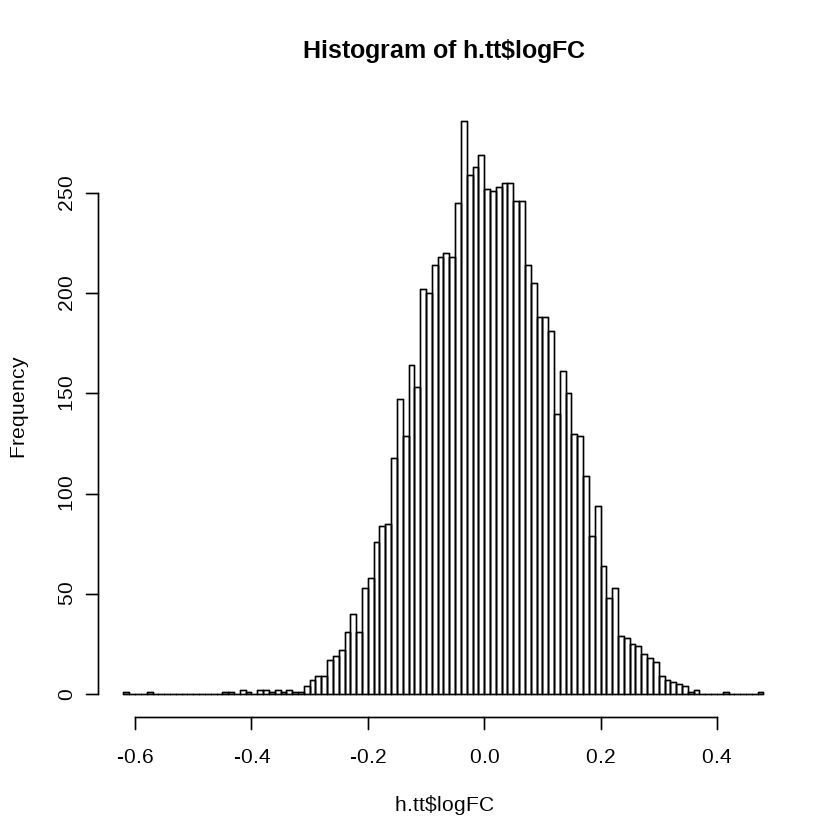

In [125]:
hist(h.tt$logFC, breaks=100)

In [1]:
2+2

[1] 4

In [147]:
head(h.tt)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000198712,0.005791616,16.96462,0.5353072,0.5930817,0.7447219,-6.898560
ENSG00000198888,0.011353916,16.97279,0.8207349,0.4128557,0.5980845,-6.705950
ENSG00000198938,0.005962758,16.93823,0.5701031,0.5693008,0.7263242,-6.879401
ENSG00000198695,0.023006470,14.60620,1.2824205,0.2013030,0.3782633,-6.224528
ENSG00000198886,0.007897951,17.89982,0.5852727,0.5590790,0.7191645,-6.870672
ENSG00000198786,0.006633357,16.19093,0.4072880,0.6842683,0.8108403,-6.958692


##### Matching human and monkey genes.

In [204]:
dim(monkey.disco.human.genes)
dim(human.disco.monkey.genes)

[1]  294 7986

[1]  183 7986

In [206]:
summary(pheno)

     title          ChIP      hyb.chamber      dataset    synchroset
 M1_120 :  1   2      : 11   5      : 32   Test    :147   No :256   
 M1_150 :  1   20     : 11   9      : 32   Training:147   Yes: 38   
 M1_180 :  1   24     : 10   1      : 31                            
 M1_20  :  1   14     :  9   4      : 31                            
 M1_30  :  1   7      :  9   2      : 28                            
 M1_42  :  1   15     :  8   8      : 28                            
 (Other):288   (Other):236   (Other):112                            
    monkeyid     time.point     infection.time clinical.status  description 
 M1     :  8   Min.   : 20.00   D20    :38     Active:118      M1_120 :  1  
 M11    :  8   1st Qu.: 30.00   D42    :38     Latent:176      M1_150 :  1  
 M12    :  8   Median : 56.00   D56    :38                     M1_180 :  1  
 M13    :  8   Mean   : 83.93   M3     :38                     M1_20  :  1  
 M14    :  8   3rd Qu.:120.00   D30    :37                     

In [207]:
mo.stage = as.factor(ifelse(pheno$time.period == "early", 0, 1))

mo.fit = lmFit(t(monkey.disco.human.genes), design=model.matrix(~mo.stage))

mo.fit = eBayes(mo.fit)

mo.tt = topTable(mo.fit, coef=2, number=dim(monkey.disco.human.genes)[2], sort.by="none")

In [209]:
head(mo.tt)
dim(mo.tt)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000197142,0.056142305,5.980891,1.0348301,0.3015911409,0.437353705,-5.9009332
ENSG00000176915,0.090887410,4.945555,3.5155131,0.0005074745,0.002599545,-0.5087982
ENSG00000089053,0.030453977,9.121334,0.9223287,0.3571066649,0.495285486,-6.0081868
ENSG00000114770,-0.031188232,5.067330,-0.9669211,0.3343711034,0.471698928,-5.9671400
ENSG00000106351,-0.046751543,3.663020,-0.9382981,0.3488545525,0.486714266,-5.9937085
ENSG00000094914,0.006274301,3.392063,0.2656306,0.7907082086,0.860885583,-6.3888537


[1] 7986    6

In [75]:
table(h.stage)

h.stage
  0   1 
 79 104 

In [210]:
hu.stage = as.factor(ifelse(human.pheno.6mo$time.from.exposure.months==0, 1, 0))

hu.fit = lmFit(t(human.disco.monkey.genes), design=model.matrix(~hu.stage))

hu.fit = eBayes(hu.fit)

hu.tt = topTable(hu.fit, coef=2, number=dim(human.disco.monkey.genes)[2], sort.by="none")

In [211]:
dim(hu.tt)

[1] 7986    6

In [107]:
dim(human.disco.mouse.genes)

[1]  183 7956

In [212]:
head(hu.tt)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000197142,0.03936173,11.62619,1.1205094,0.26395391,0.4636903,-5.376624
ENSG00000176915,0.02182041,11.47810,0.7282308,0.46739601,0.6577312,-5.715901
ENSG00000089053,-0.03309573,12.28668,-1.0504975,0.29486416,0.4977352,-5.447615
ENSG00000114770,0.13387004,10.48441,2.1763736,0.03079856,0.1308980,-3.767512
ENSG00000106351,-0.08763927,10.59144,-1.5199120,0.13024580,0.3001644,-4.885771
ENSG00000094914,-0.06062651,10.65423,-1.1799473,0.23954110,0.4354599,-5.312815


In [213]:
max(hu.tt$logFC)

[1] 0.5924005

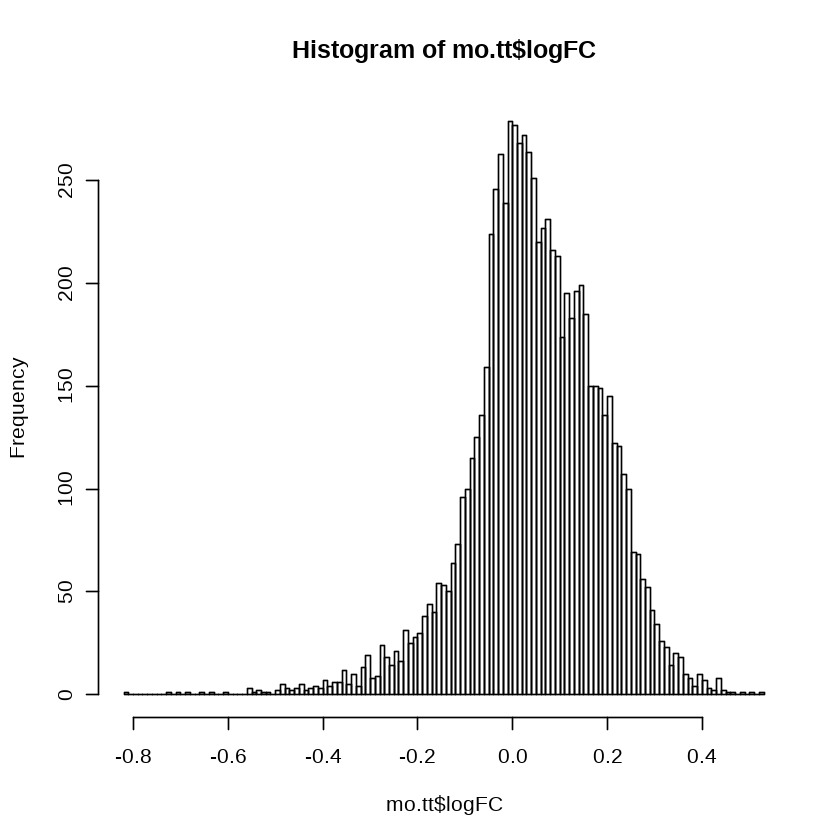

In [214]:
hist(mo.tt$logFC, breaks=100)

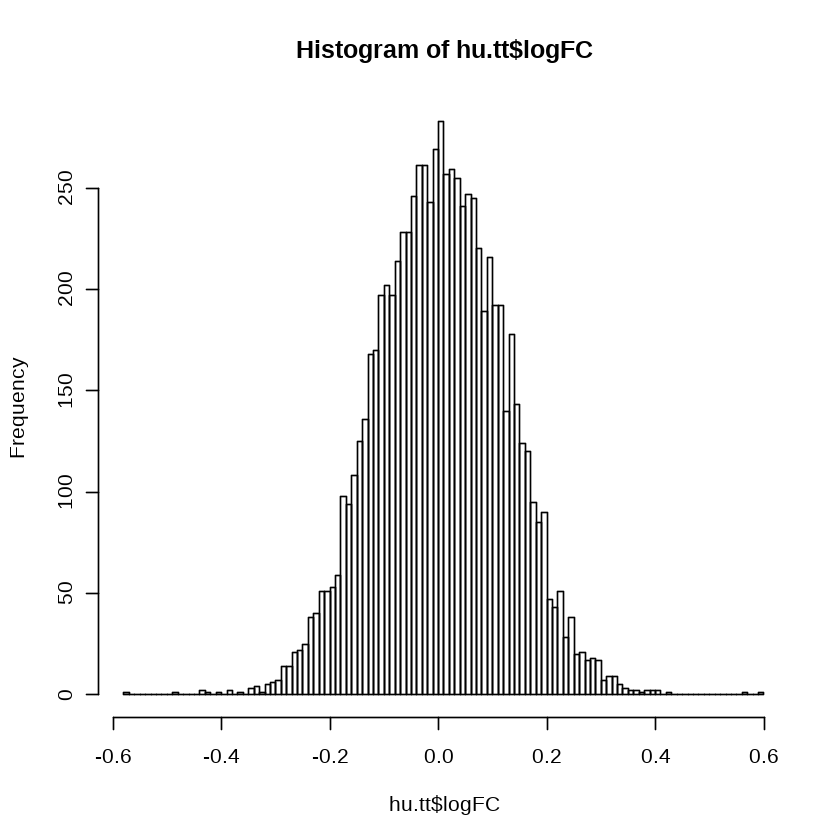

In [215]:
hist(hu.tt$logFC, breaks=100)

##### Matching  monkey and mouse genes.

In [216]:
dim(mouse.disco.monkey.genes)
dim(monkey.disco.mouse.genes)

[1]   20 5564

[1]  294 5564

In [217]:
mon.stage = as.factor(ifelse(pheno$time.period == "early", 0, 1))

mon.fit = lmFit(t(monkey.disco.mouse.genes), design=model.matrix(~mon.stage))

mon.fit = eBayes(mon.fit)

mon.tt = topTable(mon.fit, coef=2, number=dim(monkey.disco.mouse.genes)[2], sort.by="none")

In [218]:
head(mon.tt)
dim(mon.tt)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000197142,0.056142305,5.980891,1.0349213,0.3015479551,0.42487030,-5.9002000
ENSG00000176915,0.090887410,4.945555,3.5124595,0.0005130506,0.00241507,-0.5183319
ENSG00000089053,0.030453977,9.121334,0.9219691,0.3572933807,0.48304802,-6.0078650
ENSG00000114770,-0.031188232,5.067330,-0.9665089,0.3345762944,0.45921842,-5.9668846
ENSG00000106351,-0.046751543,3.663020,-0.9383319,0.3488366788,0.47443835,-5.9930331
ENSG00000094914,0.006274301,3.392063,0.2653349,0.7909356306,0.85335774,-6.3882715


[1] 5564    6

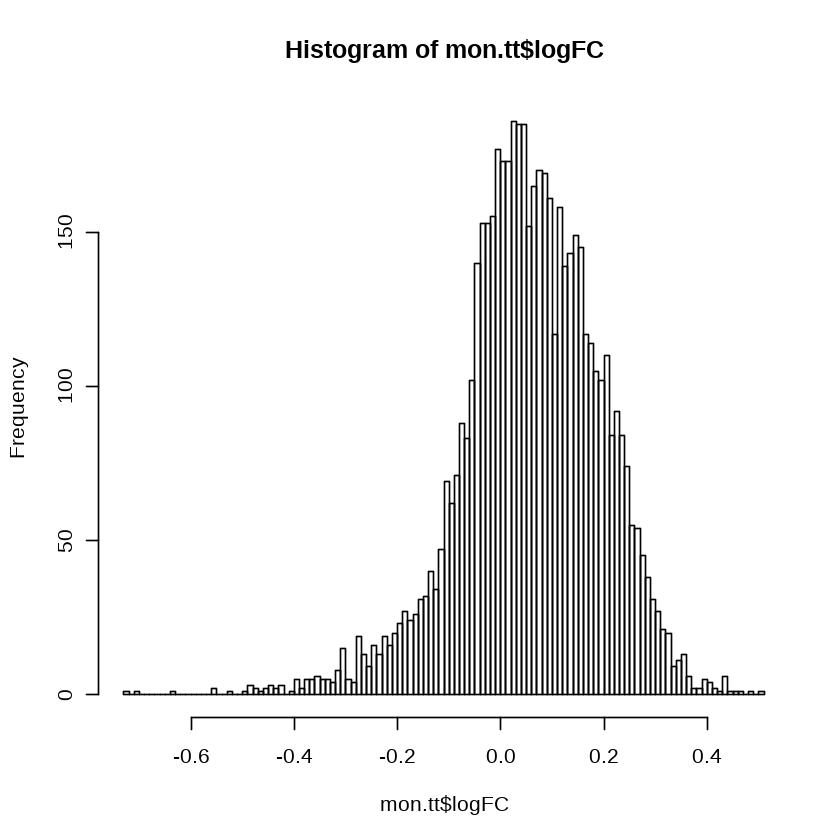

In [219]:
hist(mon.tt$logFC, breaks=100)

In [223]:
mus.stage = as.factor(ifelse(pheno.data$stage == "early", 0, 1))

mus.fit = lmFit(t(mouse.disco.monkey.genes), design=model.matrix(~mus.stage))

mus.fit = eBayes(mus.fit)

mus.tt = topTable(mus.fit, coef=2, number=dim(mouse.disco.monkey.genes)[2], sort.by="none")

In [224]:
head(mus.tt)
dim(mus.tt)

,logFC,AveExpr,t,P.Value,adj.P.Val,B
ENSG00000197142,-0.1386055,8.570961,-1.111811,0.27865458,0.5364824,-5.716687
ENSG00000176915,0.1719703,9.183294,2.274575,0.03341961,0.1722598,-3.986147
ENSG00000089053,-0.1768559,8.417406,-2.122281,0.04574182,0.2052480,-4.260724
ENSG00000114770,0.1835567,8.131226,1.717194,0.10050153,0.3129894,-4.928199
ENSG00000106351,-0.2722650,6.604978,-2.548194,0.01862521,0.1251578,-3.465612
ENSG00000094914,-0.1970029,6.247559,-1.809941,0.08448796,0.2834489,-4.784183


[1] 5564    6

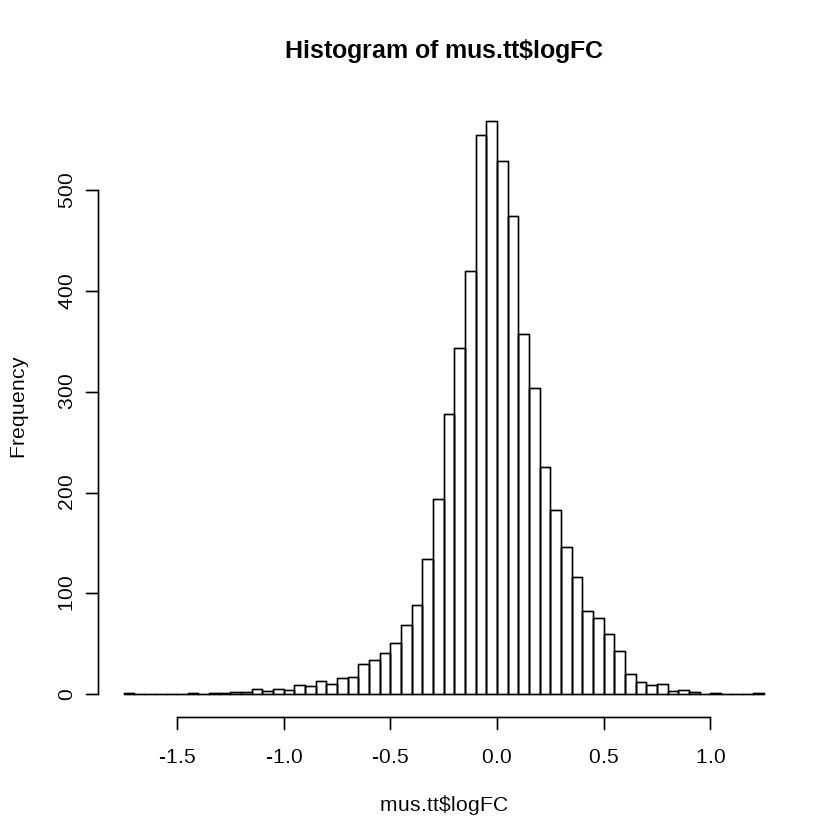

In [225]:
hist(mus.tt$logFC, breaks=100)

#### Perform disco analysis

In [83]:
library(disco)

Warning message in rgl.init(initValue, onlyNULL):
“RGL: unable to open X11 display”Warning message:
“'rgl_init' failed, running with rgl.useNULL = TRUE”

In [267]:
# Sets for module overlap between species pairs

overlap = list()

##### Functions

In [234]:
convert.to.gene.symbols = function(tt.1,tt.2,genes) {
    gene_symbols_disco = getBM(attributes = c("hgnc_symbol", "ensembl_gene_id"),
                        filters="ensembl_gene_id",
                        values = genes, mart = human)
    gs = gene_symbols_disco[gene_symbols_disco$hgnc_symbol!='',]
    print("Table of counts for gene symbols")
    print(table(table(gs$hgnc_symbol)))
    print("Table of counts for ensembl ids")
    print(table(table(gs$ensembl_gene_id)))
    tt.1.fil = tt.1[rownames(tt.1) %in% gs$ensembl_gene_id,]

    tt.2.fil = tt.2[rownames(tt.2) %in% gs$ensembl_gene_id,]

    gs.match = gs[match(rownames(tt.1.fil), gs$ensembl_gene_id),]

    rownames(tt.1.fil) = gs.match$hgnc_symbol
    rownames(tt.2.fil) = gs.match$hgnc_symbol
    
    
    result = list()
    result$tt.1 = tt.1.fil
    result$tt.2 = tt.2.fil
    return(result)
    
}

##### Human vs. Mouse

In [127]:
gene_symbols_disco = getBM(attributes = c("hgnc_symbol", "ensembl_gene_id"),
                        filters="ensembl_gene_id",
                        values = rownames(h.tt), mart = human)

In [128]:
head(gene_symbols_disco)
dim(gene_symbols_disco)
dim(human.disco.mouse.genes)

hgnc_symbol,ensembl_gene_id
M6PR,ENSG00000003056
PLXND1,ENSG00000004399
RPAP3,ENSG00000005175
LAMP2,ENSG00000005893
AP2B1,ENSG00000006125
CD79B,ENSG00000007312


[1] 7956    2

[1]  183 7956

In [137]:
gs = gene_symbols_disco[gene_symbols_disco$hgnc_symbol!='',]
table(table(gs$hgnc_symbol))
table(table(gs$ensembl_gene_id))


   1 
7920 


   1 
7920 

In [154]:
h.tt.fil = h.tt[rownames(h.tt) %in% gs$ensembl_gene_id,]

m.tt.fil = m.tt[rownames(m.tt) %in% gs$ensembl_gene_id,]

gs.match = gs[match(rownames(h.tt.fil), gs$ensembl_gene_id),]

rownames(m.tt.fil) = gs.match$hgnc_symbol
rownames(h.tt.fil) = gs.match$hgnc_symbol

In [155]:
dim(h.tt.fil)
dim(gs.match)

[1] 7920    6

[1] 7920    2

In [156]:
head(gs.match)
head(h.tt.fil)

,hgnc_symbol,ensembl_gene_id
482,MT-CO3,ENSG00000198938
473,MT-CO2,ENSG00000198712
476,MT-ND5,ENSG00000198786
479,MT-ND1,ENSG00000198888
480,MT-ATP6,ENSG00000198899
477,MT-ND4,ENSG00000198886


,logFC,AveExpr,t,P.Value,adj.P.Val,B
MT-CO3,-0.03577655,16.93823,-0.5701031,0.5693008,0.7263242,-5.814938
MT-CO2,-0.03474970,16.96462,-0.5353072,0.5930817,0.7447219,-5.833001
MT-ND5,-0.03980014,16.19093,-0.4072880,0.6842683,0.8108403,-5.889692
MT-ND1,-0.06812350,16.97279,-0.8207349,0.4128557,0.5980845,-5.651428
MT-ATP6,-0.06080657,16.50005,-0.8376319,0.4033205,0.5902902,-5.638299
MT-ND4,-0.04738771,17.89982,-0.5852727,0.5590790,0.7191645,-5.806710


In [157]:
disco.h.m = makeMatchedOrtholog(c("human","mouse"), rownames(h.tt.fil), h.tt.fil$logFC, m.tt.fil$logFC, h.tt.fil$P.Value, m.tt.fil$P.Value)

In [158]:
disco.s.h.m = disco.score(disco.h.m)

In [159]:
str(disco.s.h.m)

 num [1:7920] -0.003208 -0.002824 -0.019475 -0.000798 -0.002386 ...


In [160]:
library(tmod)
data(tmod)

In [161]:
head(toupper(disco.h.m$genes))

[1] "MT-CO3"  "MT-CO2"  "MT-ND5"  "MT-ND1"  "MT-ATP6" "MT-ND4"

Warning message in .xcheck(x):
“names(x) is NULL. Generating default names”

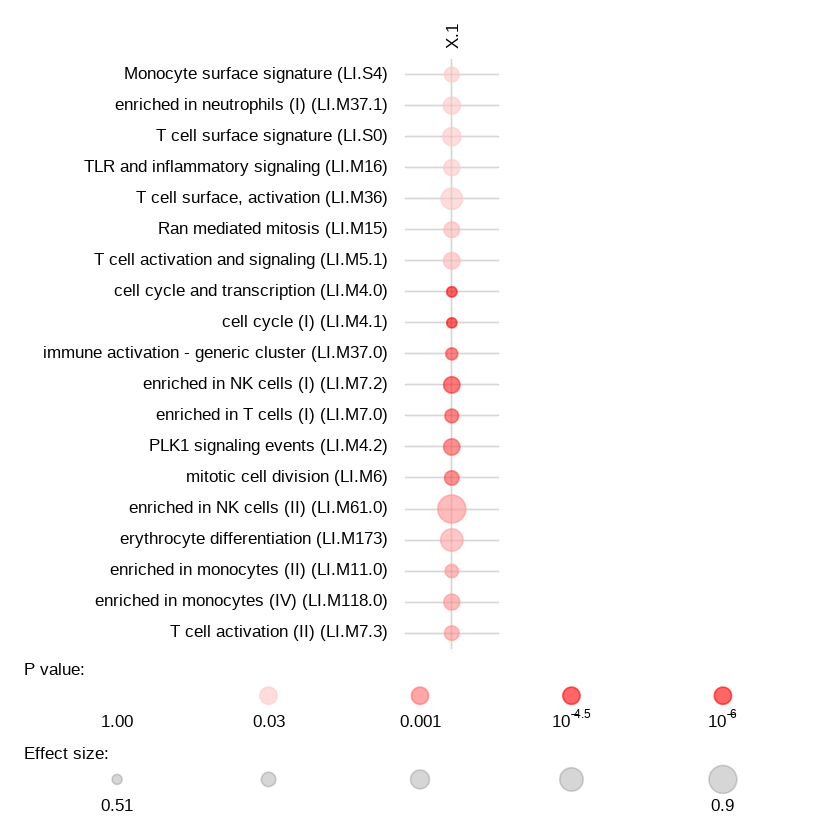

In [268]:
ord <- order(disco.s.h.m, decreasing = TRUE)
concordant <- tmodCERNOtest(toupper(disco.h.m$genes)[ord])
modtable <- percentGenes(disco.h.m, tmod[concordant$ID])


tmodPanelPlot(list(concordant), text.cex=0.8,  filter.unknown=TRUE,
              pval.thr=1.0)

overlap$human.mouse = as.character(concordant$ID)

In [249]:
concordant

,ID,Title,cerno,N1,AUC,cES,P.Value,adj.P.Val
LI.M4.1,LI.M4.1,cell cycle (I),286.53785,84,0.5122511,1.705582,3.239801e-08,6.980230e-06
LI.M4.0,LI.M4.0,cell cycle and transcription,527.74387,182,0.5163749,1.449846,4.034815e-08,6.980230e-06
LI.M7.2,LI.M7.2,enriched in NK cells (I),128.28430,29,0.6462535,2.211798,3.162096e-07,3.646951e-05
LI.M37.0,LI.M37.0,immune activation - generic cluster,492.26334,175,0.5539463,1.406467,7.611805e-07,6.584211e-05
LI.M7.0,LI.M7.0,enriched in T cells (I),158.96035,42,0.5900035,1.892385,1.487951e-06,1.029662e-04
LI.M4.2,LI.M4.2,PLK1 signaling events,78.54542,15,0.6454227,2.618181,3.190893e-06,1.840082e-04
LI.M6,LI.M6,mitotic cell division,87.19314,18,0.6059858,2.422032,3.901386e-06,1.928399e-04
LI.M61.0,LI.M61.0,enriched in NK cells (II),47.29886,8,0.8980030,2.956179,6.116697e-05,2.645472e-03
LI.M118.0,LI.M118.0,enriched in monocytes (IV),117.85917,33,0.6378006,1.785745,9.148670e-05,3.405923e-03
LI.M7.3,LI.M7.3,T cell activation (II),93.28093,24,0.6090320,1.943353,9.843709e-05,3.405923e-03


Warning message in .xcheck(x):
“names(x) is NULL. Generating default names”

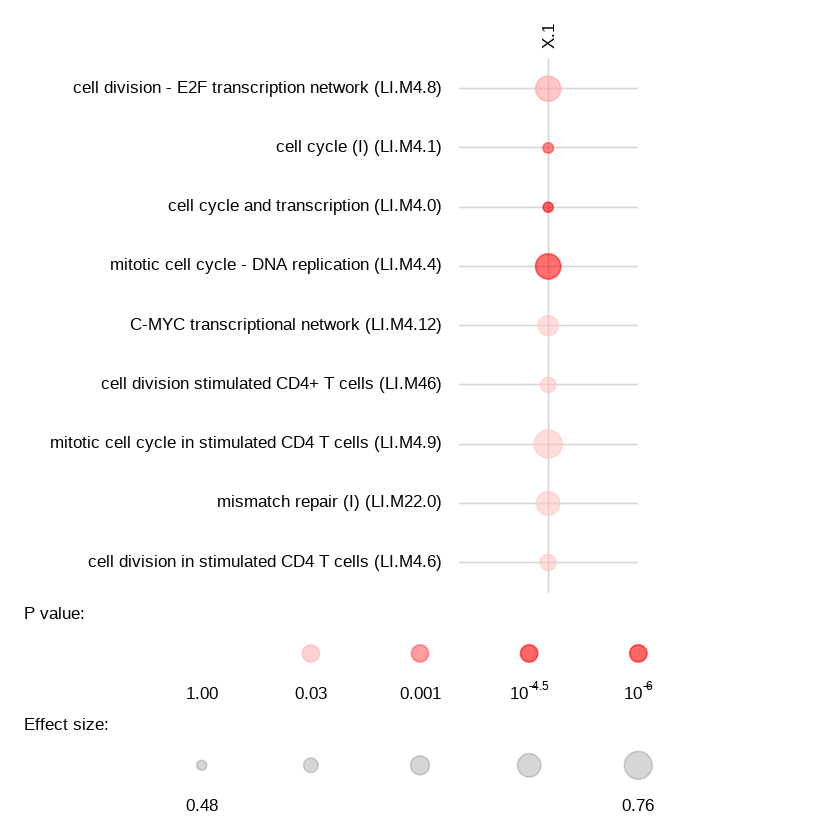

In [269]:
ord <- order(disco.s.h.m, decreasing = FALSE)
concordant <- tmodCERNOtest(toupper(disco.h.m$genes)[ord])
modtable <- percentGenes(disco.h.m, tmod[concordant$ID])


tmodPanelPlot(list(concordant), text.cex=0.8,  filter.unknown=TRUE,
              pval.thr=1.0)
overlap$human.mouse = c(overlap$human.mouse, as.character(concordant$ID))

In [164]:
head(concordant)

,ID,Title,cerno,N1,AUC,cES,P.Value,adj.P.Val
LI.M4.1,LI.M4.1,cell cycle (I),286.53785,84,0.5122511,1.705582,3.239801e-08,6.980230e-06
LI.M4.0,LI.M4.0,cell cycle and transcription,527.74387,182,0.5163749,1.449846,4.034815e-08,6.980230e-06
LI.M7.2,LI.M7.2,enriched in NK cells (I),128.28430,29,0.6462535,2.211798,3.162096e-07,3.646951e-05
LI.M37.0,LI.M37.0,immune activation - generic cluster,492.26334,175,0.5539463,1.406467,7.611805e-07,6.584211e-05
LI.M7.0,LI.M7.0,enriched in T cells (I),158.96035,42,0.5900035,1.892385,1.487951e-06,1.029662e-04
LI.M4.2,LI.M4.2,PLK1 signaling events,78.54542,15,0.6454227,2.618181,3.190893e-06,1.840082e-04


In [251]:
concordant

,ID,Title,cerno,N1,AUC,cES,P.Value,adj.P.Val
LI.M4.0,LI.M4.0,cell cycle and transcription,530.72511,182,0.4836251,1.458036,2.490644e-08,8.617629e-06
LI.M4.4,LI.M4.4,mitotic cell cycle - DNA replication,99.63804,19,0.7190229,2.622054,1.987649e-07,3.438632e-05
LI.M4.1,LI.M4.1,cell cycle (I),271.29007,84,0.4877489,1.614822,7.634827e-07,8.805501e-05
LI.M4.8,LI.M4.8,cell division - E2F transcription network,73.44290,17,0.7189898,2.160085,1.011222e-04,8.747068e-03
LI.M22.0,LI.M22.0,mismatch repair (I),70.64944,18,0.6916392,1.962484,4.917717e-04,2.598006e-02
LI.M46,LI.M46,cell division stimulated CD4+ T cells,76.07994,20,0.5645000,1.901998,5.019201e-04,2.598006e-02
LI.M4.9,LI.M4.9,mitotic cell cycle in stimulated CD4 T cells,41.02194,8,0.7620545,2.563872,5.511535e-04,2.598006e-02
LI.M4.6,LI.M4.6,cell division in stimulated CD4 T cells,49.92290,11,0.5767078,2.269223,6.006950e-04,2.598006e-02
LI.M4.12,LI.M4.12,C-MYC transcriptional network,44.69264,10,0.6383692,2.234632,1.214392e-03,4.668661e-02


In [166]:
modtable

,p_genes,all_genes
LI.M4.1,0.5793103,145
LI.M4.0,0.5432836,335
LI.M7.2,0.5918367,49
LI.M37.0,0.5043228,347
LI.M7.0,0.6774194,62
LI.M4.2,0.4411765,34
LI.M6,0.5625000,32
LI.M61.0,0.3333333,24
LI.M118.0,0.5964912,57
LI.M7.3,0.7741935,31


In [99]:
str(tmod)

Formal class 'tmod' [package "tmod"] with 1 slot
  ..@ .Data:List of 4
  .. ..$ :'data.frame':	606 obs. of  9 variables:
  .. .. ..$ ID         : chr [1:606] "LI.M0" "LI.M1.0" "LI.M1.1" "LI.M2.0" ...
  .. .. ..$ Title      : chr [1:606] "targets of FOSL1/2" "integrin cell surface interactions (I)" "integrin cell surface interactions (II)" "extracellular matrix (I)" ...
  .. .. ..$ Category   : chr [1:606] "TF targets" "molecular function" "molecular function" "location" ...
  .. .. ..$ Annotated  : chr [1:606] "Yes" "Yes" "Yes" "Yes" ...
  .. .. ..$ URL        : chr [1:606] "http://www.interactivefigures.com/meni/btm416_annotation/btmdata/M0.htm" "http://www.interactivefigures.com/meni/btm416_annotation/btmdata/M1.0.htm" "http://www.interactivefigures.com/meni/btm416_annotation/btmdata/M1.1.htm" "http://www.interactivefigures.com/meni/btm416_annotation/btmdata/M2.0.htm" ...
  .. .. ..$ Source     : chr [1:606] "Li et al. 2013" "Li et al. 2013" "Li et al. 2013" "Li et al. 2013" ...
  ..

In [97]:
toupper(disco.h.m$genes)

[1] "ENSG00000198938" "ENSG00000198712" "ENSG00000198786" "ENSG00000198888"
 [5] "ENSG00000198899" "ENSG00000198886" "ENSG00000198695" "ENSG00000198763"
 [9] "ENSG00000198727" "ENSG00000134575"

In [80]:
install.packages("disco")

also installing the dependencies ‘rgl’, ‘ellipse’, ‘beeswarm’, ‘pca3d’, ‘tagcloud’, ‘plotwidgets’, ‘tmod’

Warning message in install.packages("disco"):
“installation of package ‘rgl’ had non-zero exit status”Warning message in install.packages("disco"):
“installation of package ‘pca3d’ had non-zero exit status”Warning message in install.packages("disco"):
“installation of package ‘tmod’ had non-zero exit status”Warning message in install.packages("disco"):
“installation of package ‘disco’ had non-zero exit status”Updating HTML index of packages in '.Library'
Making 'packages.html' ... done


In [81]:
write.csv(m.tt, paste(path, "data/disco_results/mouse_to_human_disco.csv", sep="/"))

In [82]:
write.csv(h.tt, paste(path, "data/disco_results/human_to_mouse_disco.csv", sep="/"))

In [ ]:
Then perform the disco analysis

In [100]:
data(orthologs)

In [101]:
head(orthologs$genes)

[1] "GNAI3"  "CDC45L" "SCML2"  "APOH"   "NARF"   "CAV2"

##### Human vs. Monkey

- This reveals that maybe I should take both concordant and discordant as a regulated set, as I don't know the exact timing of humans vs. monkey and mouse. Maybe this is post-hoc, but statistically it is fine, I just use any regulated gene set in the hypergeometric test. Concordant and discordant sets are mutually exclusive for a given species pairing

- I think in explaining it I should state I'm not sure if it is differences in timing, or if the effect of things is really different between human and mice (more concordant) and monkeys and humans. But these same processes appear to be regulated as part of the overall phenotype, which is the significant and interesting part.

In [235]:
hu.m.result = convert.to.gene.symbols(hu.tt, mo.tt, rownames(hu.tt))

[1] "Table of counts for gene symbols"

   1 
7917 
[1] "Table of counts for ensembl ids"

   1 
7917 


 num [1:7917] 0.002429 0.007189 -0.000985 -0.008297 0.005501 ...


[1] "ACSL5"  "ANKLE2" "ANAPC5" "ABCC5"  "AGFG2"  "AAAS"

Warning message in .xcheck(x):
“names(x) is NULL. Generating default names”

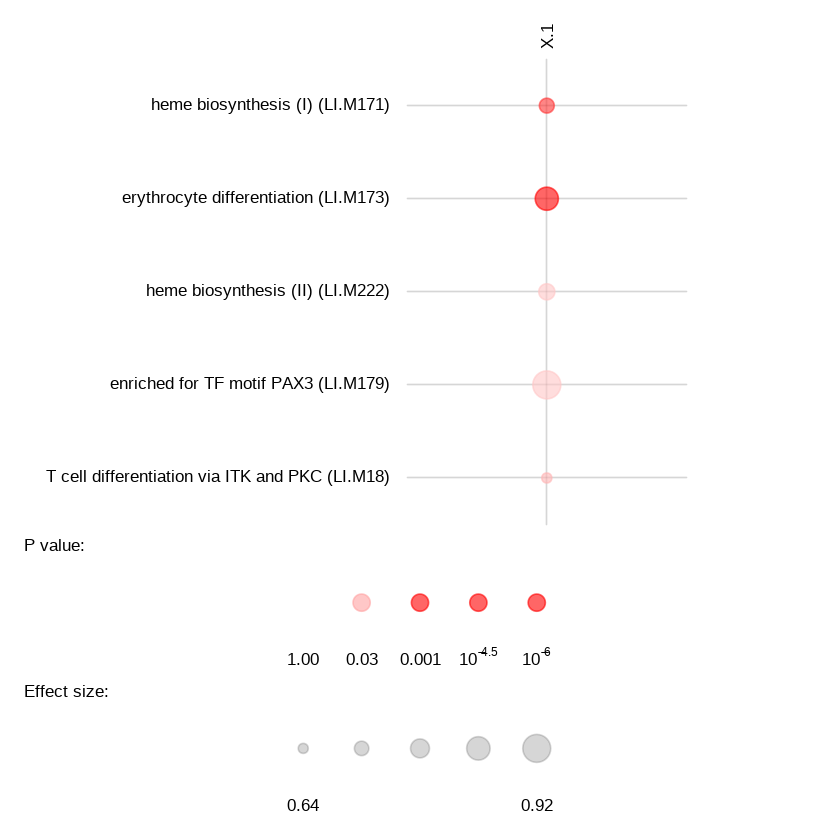

In [271]:
disco.hu.m = makeMatchedOrtholog(c("human","monkey"), rownames(hu.m.result$tt.1), 
                                hu.m.result$tt.1$logFC, 
                                hu.m.result$tt.2$logFC, 
                                hu.m.result$tt.1$P.Value, 
                                hu.m.result$tt.2$P.Value)

disco.s.hu.m = disco.score(disco.hu.m)

str(disco.s.hu.m)

library(tmod)
data(tmod)

head(toupper(disco.hu.m$genes))

ord <- order(disco.s.hu.m, decreasing = TRUE)
concordant <- tmodCERNOtest(toupper(disco.hu.m$genes)[ord])
modtable <- percentGenes(disco.hu.m, tmod[concordant$ID])


tmodPanelPlot(list(concordant), text.cex=0.8,  filter.unknown=TRUE,
              pval.thr=1.0)

overlap$human.monkey = as.character(concordant$ID)

Warning message in .xcheck(x):
“names(x) is NULL. Generating default names”

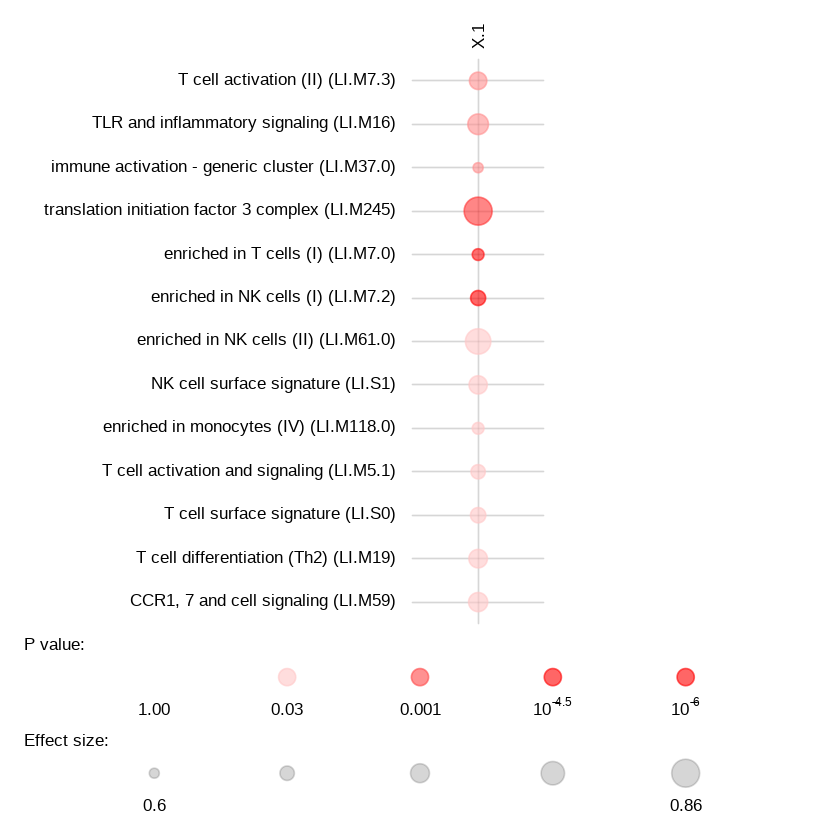

In [272]:
ord <- order(disco.s.hu.m, decreasing = FALSE)
concordant <- tmodCERNOtest(toupper(disco.hu.m$genes)[ord])
modtable <- percentGenes(disco.hu.m, tmod[concordant$ID])


tmodPanelPlot(list(concordant), text.cex=0.8,   filter.unknown=TRUE,
              pval.thr=1.0)

overlap$human.monkey = c(overlap$human.monkey, as.character(concordant$ID))

##### Monkey vs. Mouse

In [243]:
mon.mus.result = convert.to.gene.symbols(mon.tt, mus.tt, rownames(mon.tt))

[1] "Table of counts for gene symbols"

   1 
5531 
[1] "Table of counts for ensembl ids"

   1 
5531 


 num [1:5531] -0.00837 0.07449 -0.00962 -0.00843 0.02784 ...


[1] "ACSL5"  "ANKLE2" "ANAPC5" "ABCC5"  "AGFG2"  "AAAS"

Warning message in .xcheck(x):
“names(x) is NULL. Generating default names”

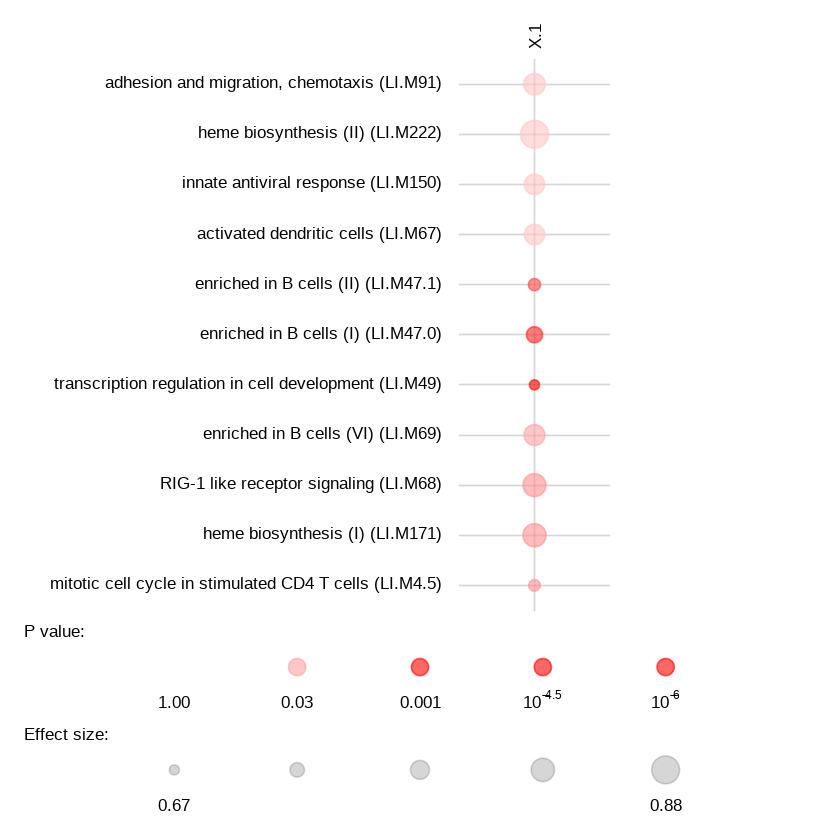

In [273]:
disco.mon.mus = makeMatchedOrtholog(c("monkey","mouse"), rownames(mon.mus.result$tt.1), 
                                mon.mus.result$tt.1$logFC, 
                                mon.mus.result$tt.2$logFC, 
                                mon.mus.result$tt.1$P.Value, 
                                mon.mus.result$tt.2$P.Value)

disco.s.mon.mus = disco.score(disco.mon.mus)

str(disco.s.mon.mus)

library(tmod)
data(tmod)

head(toupper(disco.mon.mus$genes))

ord <- order(disco.s.mon.mus, decreasing = TRUE)
concordant <- tmodCERNOtest(toupper(disco.mon.mus$genes)[ord])
modtable <- percentGenes(disco.mon.mus, tmod[concordant$ID])


tmodPanelPlot(list(concordant), text.cex=0.8,  filter.unknown=TRUE,
              pval.thr=1.0)
overlap$monkey.mouse = as.character(concordant$ID)

Warning message in .xcheck(x):
“names(x) is NULL. Generating default names”

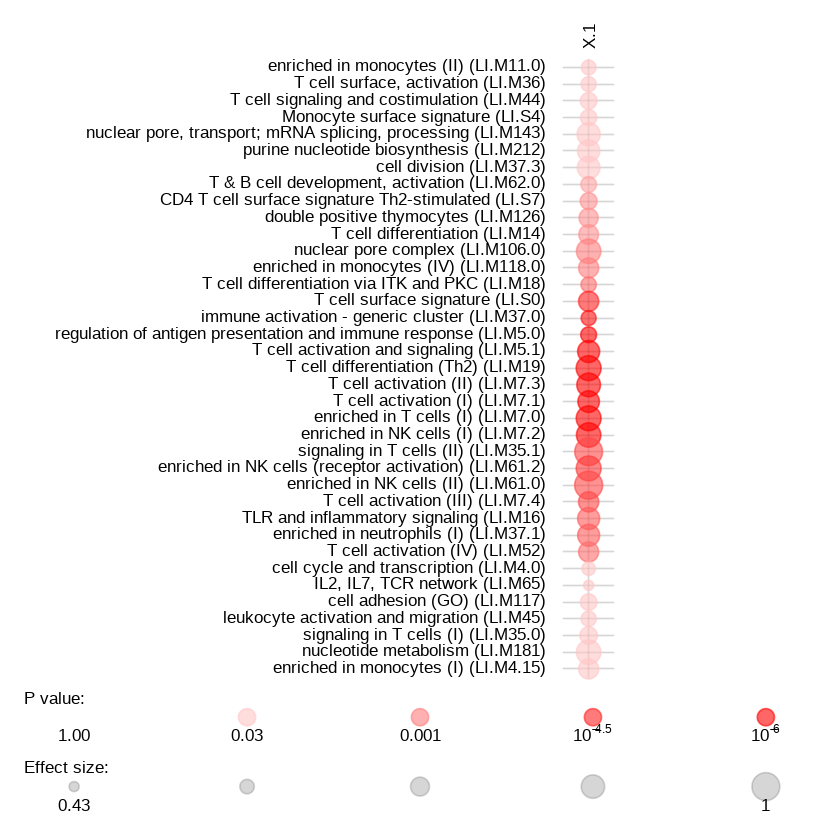

In [274]:
ord <- order(disco.s.mon.mus, decreasing = FALSE)
concordant <- tmodCERNOtest(toupper(disco.mon.mus$genes)[ord])
modtable <- percentGenes(disco.mon.mus, tmod[concordant$ID])


tmodPanelPlot(list(concordant), text.cex=0.8,  filter.unknown=TRUE,
              pval.thr=1.0)

overlap$monkey.mouse = c(overlap$monkey.mouse, as.character(concordant$ID))

In [253]:
concordant

,ID,Title,cerno,N1,AUC,cES,P.Value,adj.P.Val
LI.M7.0,LI.M7.0,enriched in T cells (I),280.78354,33,0.8985141,4.254296,2.720081e-28,9.411482e-26
LI.M7.2,LI.M7.2,enriched in NK cells (I),214.94289,24,0.8833757,4.477977,5.447752e-23,9.424611e-21
LI.M7.1,LI.M7.1,T cell activation (I),195.30404,31,0.7942815,3.150065,1.032093e-15,1.190347e-13
LI.M7.3,LI.M7.3,T cell activation (II),120.25421,15,0.8605995,4.008474,9.249494e-13,8.000812e-11
LI.M19,LI.M19,T cell differentiation (Th2),97.56346,12,0.9006161,4.065144,7.796211e-11,5.394978e-09
LI.M5.1,LI.M5.1,T cell activation and signaling,102.37874,14,0.8097051,3.656383,2.076926e-10,1.197694e-08
LI.M5.0,LI.M5.0,regulation of antigen presentation and immune response,171.97806,40,0.6125842,2.149726,1.107870e-08,5.476043e-07
LI.M37.0,LI.M37.0,immune activation - generic cluster,352.96736,112,0.5850200,1.575747,8.171923e-08,3.534357e-06
LI.S0,LI.S0,T cell surface signature,79.19028,13,0.7496585,3.045780,2.792736e-07,1.073652e-05
LI.M61.2,LI.M61.2,enriched in NK cells (receptor activation),51.68230,6,0.8990950,4.306858,7.057063e-07,2.441744e-05


#### Determine significance of overlap of modules between all species

- Yes, the overlap is significant for all human!

- The overlap is very significant for all species. I am sure that if we scrambled one of the species, then this overlap would go away (i.e. I am pretty sure the correlation of always having one species doesn't bias the test so much as to get this result). Concordance and discordance should be independent between the pairwise comparisons because one of the species is independent between them.

- In any case, I think I have enough material here for the reviewers. To me this is convincing evidence that there are several similar immunological processes at play during the acute phase of M.tb infection between these 3 species, and I have thus demonstrated this with actual data in humans.

In [275]:
overlap

$human.mouse
 [1] "LI.M4.1"   "LI.M4.0"   "LI.M7.2"   "LI.M37.0"  "LI.M7.0"   "LI.M4.2"  
 [7] "LI.M6"     "LI.M61.0"  "LI.M118.0" "LI.M7.3"   "LI.M11.0"  "LI.M173"  
[13] "LI.M15"    "LI.M5.1"   "LI.M161"   "LI.M128"   "LI.M16"    "LI.M137"  
[19] "LI.M36"    "LI.S0"     "LI.M37.1"  "LI.M242"   "LI.S4"     "LI.M4.0"  
[25] "LI.M4.4"   "LI.M4.1"   "LI.M4.8"   "LI.M22.0"  "LI.M46"    "LI.M4.9"  
[31] "LI.M4.6"   "LI.M4.12" 

$human.monkey
 [1] "LI.M173"   "LI.M171"   "LI.M18"    "LI.M179"   "LI.M222"   "LI.M229"  
 [7] "LI.M7.2"   "LI.M7.0"   "LI.M245"   "LI.M243"   "LI.M7.3"   "LI.M37.0" 
[13] "LI.M16"    "LI.S1"     "LI.M61.0"  "LI.M5.1"   "LI.S0"     "LI.M19"   
[19] "LI.M59"    "LI.M118.0"

$monkey.mouse
 [1] "LI.M49"    "LI.M47.0"  "LI.M47.1"  "LI.M68"    "LI.M4.5"   "LI.M171"  
 [7] "LI.M69"    "LI.M91"    "LI.M222"   "LI.M67"    "LI.M150"   "LI.M201"  
[13] "LI.M7.0"   "LI.M7.2"   "LI.M7.1"   "LI.M7.3"   "LI.M19"    "LI.M5.1"  
[19] "LI.M5.0"   "LI.M37.0"  "LI.S0"     "LI.M61.2"  "LI.M61.0"  "LI.M7.4"  
[25] "LI.M35.1"  "LI.M16"    "LI.M37.1"  "LI.M52"    "LI.M18"    "LI.M106.0"
[31] "LI.M118.0" "LI.M14"    "LI.M126"   "LI.S7"     "LI.M62.0"  "LI.M4.15" 
[37] "LI.M181"   "LI.M151"   "LI.M35.0"  "LI.M4.0"   "LI.M65"    "LI.M45"   
[43] "LI.M117"   "LI.M143"   "LI.M37.3"  "LI.M212"   "LI.S4"     "LI.M44"   
[49] "LI.M36"    "LI.M11.0"

In [276]:
if (!require("GeneOverlap")) {
  biocLite("GeneOverlap")
  library("GeneOverlap")
}


Loading required package: GeneOverlap


In [284]:
n.modules = length(tmod$MODULES$ID[grepl("LI", tmod$MODULES$ID)])

In [285]:
go.human = newGeneOverlap(overlap$human.mouse, overlap$human.monkey, genome.size=n.modules)

testGene`Overlap(go.human)

GeneOverlap object:
listA size=30
listB size=20
Intersection size=10
Overlapping p-value=5.3e-07
Jaccard Index=0.2

In [286]:
go.monkey = newGeneOverlap(overlap$monkey.mouse, overlap$human.monkey, genome.size=n.modules)

testGeneOverlap(go.monkey)

GeneOverlap object:
listA size=50
listB size=20
Intersection size=13
Overlapping p-value=9.8e-08
Jaccard Index=0.2

In [287]:
go.mouse = newGeneOverlap(overlap$monkey.mouse, overlap$human.mouse, genome.size=n.modules)

testGeneOverlap(go.mouse)

GeneOverlap object:
listA size=50
listB size=30
Intersection size=14
Overlapping p-value=7.7e-06
Jaccard Index=0.2

### Determine whether the reduced human signature replicates in mice and monkeys

- It does in mice, but this still doesn't rule out if there are technical confounders over time. Won't with monkeys to. Would need multiple independent cohorts. But we have multiple independent cohorts in humans
- It does not in monkey. Only 1 probe is matched among expressed probes in monkey dataset

In [25]:
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")

#### Mouse

In [29]:
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

In [30]:
human.to.mouse = getLDS(attributes = c("hgnc_symbol"),
          filters = c("hgnc_symbol"),
          values = c(posGenes, negGenes), mart = human,
          attributesL = c('mgi_symbol', "illumina_mousewg_6_v2"),
          #filtersL = c("illumina_mousewg_6_v2"),
          martL=mouse)

In [32]:
human.to.mouse

HGNC.symbol,MGI.symbol,ILLUMINA.MouseWG.6.V2.probe
PYURF,Pyurf,ILMN_2521182
PYURF,Pyurf,ILMN_2629610
TRIM7,Trim7,ILMN_1254904
TRIM7,Trim7,
TRIM7,Trim7,ILMN_1258293
BEAN1,Bean1,ILMN_2698221
ZNF608,Zfp608,ILMN_1243263
ZNF608,Zfp608,ILMN_2559976
ZNF608,Zfp608,ILMN_2939367
ZNF608,Zfp608,


In [34]:
human.to.mouse = dplyr::filter(human.to.mouse, ILLUMINA.MouseWG.6.V2.probe != '')

In [37]:
mouse.tb.human = mouse.tb[,colnames(mouse.tb) %in% human.to.mouse$ILLUMINA.MouseWG.6.V2.probe]

In [39]:
dplyr::filter(human.to.mouse,ILLUMINA.MouseWG.6.V2.probe %in% colnames(mouse.tb.human) )

HGNC.symbol,MGI.symbol,ILLUMINA.MouseWG.6.V2.probe
TRIM7,Trim7,ILMN_1258293
BEAN1,Bean1,ILMN_2698221
ZNF608,Zfp608,ILMN_1243263
ZNF608,Zfp608,ILMN_2939367
TUBGCP4,Tubgcp4,ILMN_1257622
TUBGCP4,Tubgcp4,ILMN_2548458


In [55]:
mouse.sign = data.frame(TRIM7 = mouse.tb.human$ILMN_1258293,
                       BEAN1 = mouse.tb.human$ILMN_2698221,
                       ZNF608 = log2(rowMeans(cbind(2^mouse.tb.human$ILMN_1243263, 2^mouse.tb.human$ILMN_2939367), na.rm=TRUE)),
                       TUBGCP4 = log2(rowMeans(cbind(2^mouse.tb.human$ILMN_1257622, 2^mouse.tb.human$ILMN_2548458), na.rm=TRUE)))
rownames(mouse.sign) = row.names(mouse.tb)

[1] "This is the AUC:"
Area under the curve: 0.8021
[1] "This is the AUC p-value:"
[1] 0.01262205
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.6043-0.9999 (DeLong)


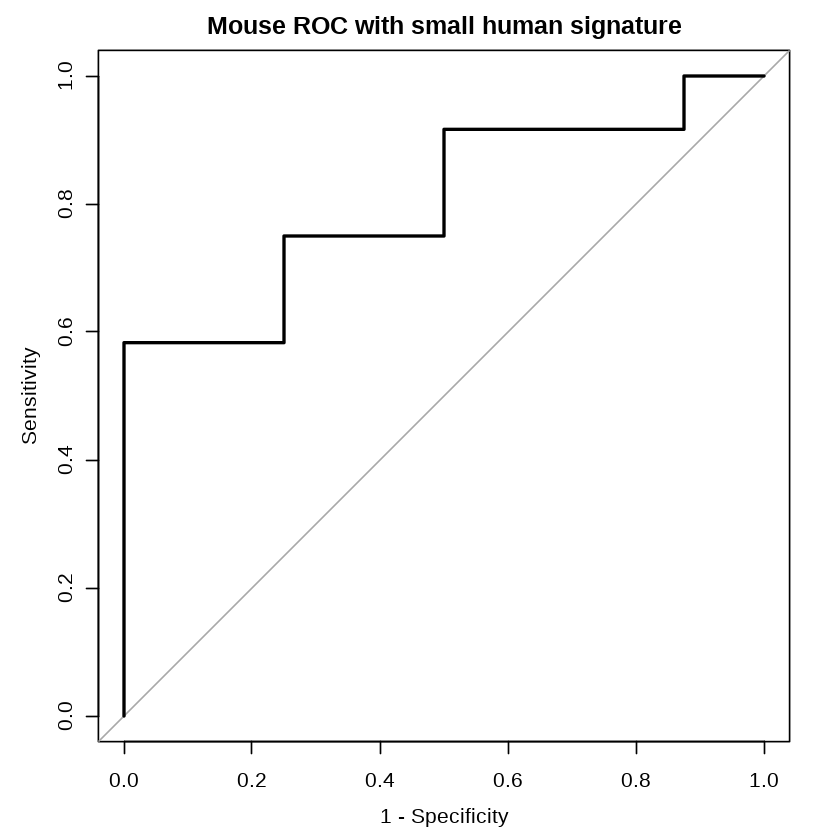

In [66]:
mouse.human.ROC <- my.roc(calculateScore(mouse.sign, posGenes, negGenes),
                        pheno.data$stage,
                     "late", title="Mouse ROC with small human signature")

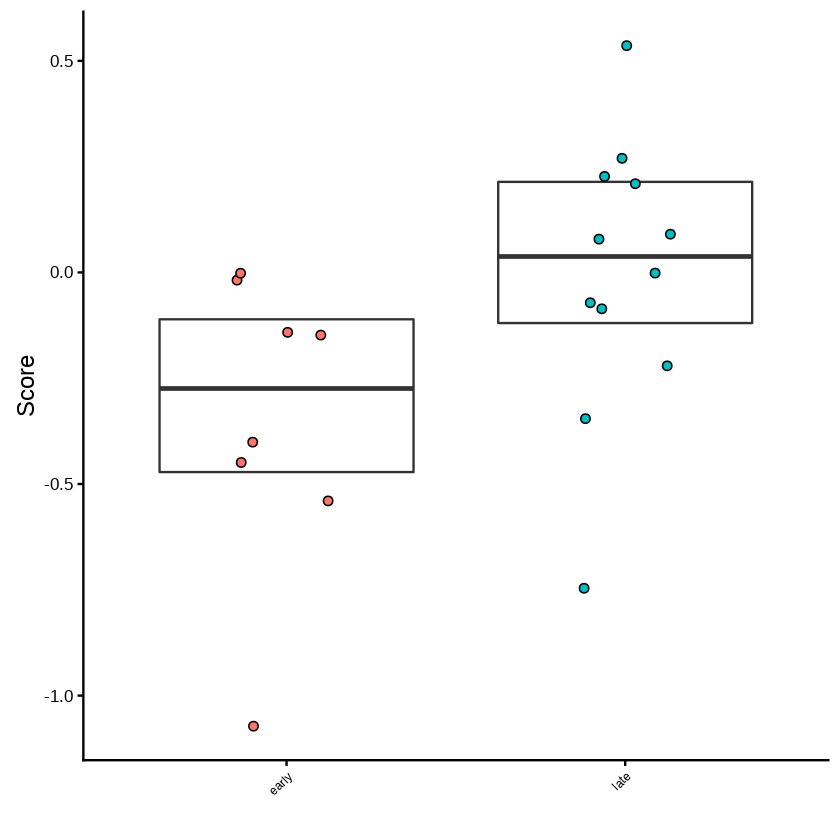

In [67]:
score.plot.test = data.frame(scores=calculateScore(mouse.sign, posGenes, negGenes), time= pheno.data$stage)
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=time), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(score.plot.test, aes(x=time, y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

In [60]:
calculateScore(mouse.sign, posGenes, negGenes)

GSM3541219   GSM3541220   GSM3541221   GSM3541222   GSM3541223   GSM3541224 
-0.148174752 -0.018287790 -0.449039665 -0.141610917 -0.539961411 -0.001852235 
  GSM3541225   GSM3541226   GSM3541227   GSM3541228   GSM3541229   GSM3541230 
-1.072192292 -0.400922629 -0.085943551  0.209699896 -0.746282529  0.226831669 
  GSM3541231   GSM3541232   GSM3541233   GSM3541234   GSM3541235   GSM3541236 
 0.269757788  0.090348969 -0.071610777 -0.001583413 -0.220717451  0.078631327 
  GSM3541237   GSM3541238 
 0.535932731 -0.345472055

#### Monkey

In [85]:
human.to.monkey = getBM(attributes = c("hgnc_symbol", "illumina_humanht_12_v4"),
                        filters="hgnc_symbol",
                        values = c(posGenes, negGenes), mart = human)

In [79]:
human.to.monkey = dplyr::filter(human.to.monkey, illumina_humanht_12_v4!='', illumina_humanht_12_v4 %in% colnames(expres))
human.to.monkey

hgnc_symbol,illumina_humanht_12_v4
PYURF,ILMN_1672366


In [90]:
sum(human.to.monkey$illumina_humanht_12_v4 %in% colnames(expres))
sum(human.to.monkey$illumina_humanht_12_v4 %in% featureNames(monkey.gset))

[1] 1

[1] 7

In [91]:
monkey.expres = data.frame(expres)

In [87]:
dim(colnames(expres))

NULL

In [84]:
head(colnames(expres))

[1] "ILMN_2055271" "ILMN_1755321" "ILMN_1814092" "ILMN_2061446" "ILMN_3237396"
[6] "ILMN_1688755"

[1] "This is the AUC:"
Area under the curve: 0.5175
[1] "This is the AUC p-value:"
[1] 0.6985346
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.451-0.584 (DeLong)


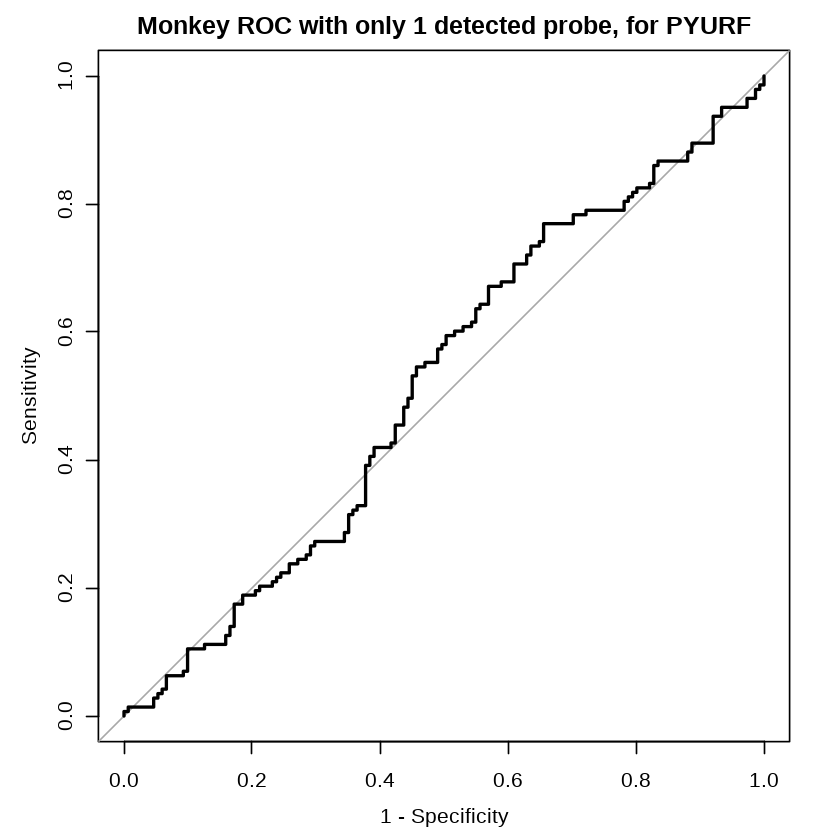

In [101]:
monkey.human.ROC <- my.roc(monkey.expres$ILMN_1672366,
                        pheno$time.period,
                     "late", title="Monkey ROC with only 1 detected probe, for PYURF")

In [82]:
table( pheno$time.period)


early  late 
  151   143 

In [76]:
dim(expres)

[1]   294 15083

In [73]:
monkey.exprs.human = data.frame(
                       BEAN1 = expres$ILMN_1733066,
                    PYURF=expres$ILMN_1672366,
    TRIM7 = log2(rowMeans(cbind(2^expres$ILMN_1692247, 2^expres$ILMN_1756657, 2^ILMN_1727364), na.rm=TRUE)),
                       ZNF608 = expres$ILMN_1712798,
                       TUBGCP4 = expres$ILMN_1792173)
rownames(monkey.exprs.human) = row.names(expres)

ERROR: Error in expres$ILMN_1733066: $ operator is invalid for atomic vectors


[1] "This is the AUC:"
Area under the curve: 0.8021
[1] "This is the AUC p-value:"
[1] 0.01262205
[1] "This is the AUC 95% Confidence Interval"
95% CI: 0.6043-0.9999 (DeLong)


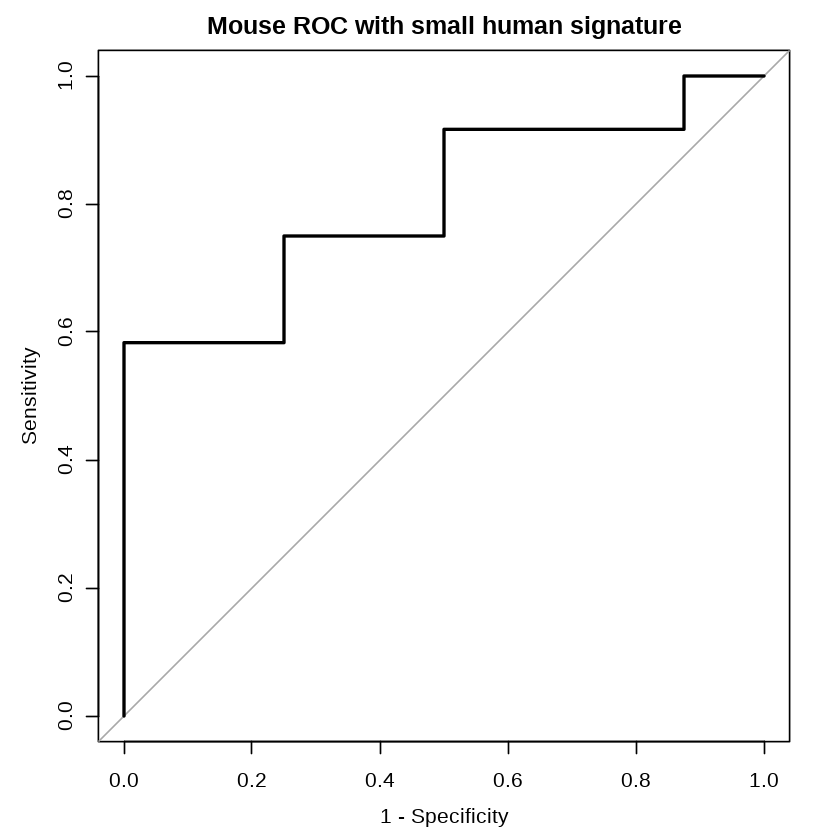

In [66]:
mouse.human.ROC <- my.roc(calculateScore(mouse.sign, posGenes, negGenes),
                        pheno.data$stage,
                     "late", title="Mouse ROC with small human signature")

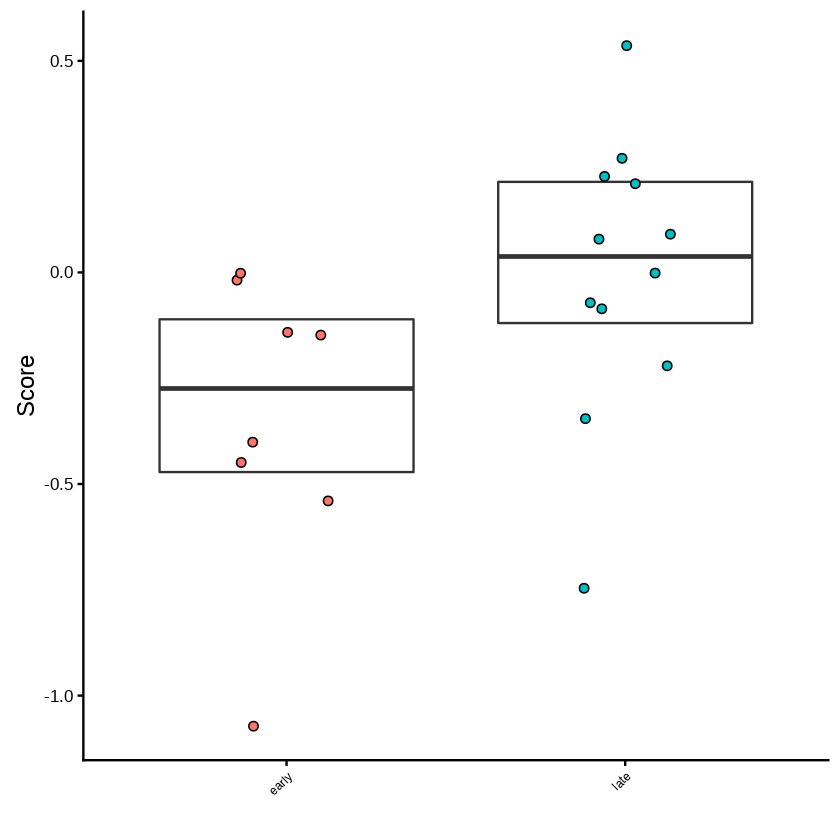

In [67]:
score.plot.test = data.frame(scores=calculateScore(mouse.sign, posGenes, negGenes), time= pheno.data$stage)
theme.bar = list(geom_boxplot(outlier.shape=NA, coef=0),
                 geom_jitter(aes(fill=time), position=position_jitter(0.15), shape=21, size=2),
                 #scale_fill_manual(values=c("white", "darkgrey")),
                 theme(legend.position="none"),
                 labs(y="Score", x=''),
                 theme(axis.text.x=element_text(size=12, color="black"),
                         axis.text.y=element_text(size=10, color="black")))

all.samples.bar = ggplot(score.plot.test, aes(x=time, y=scores)) + theme.bar  +
 theme(axis.text.x=element_text(angle=45, hjust=1, size = 7))
all.samples.bar

In [ ]:
monkey.to.mouse = getLDS(attributes = c(\"hgnc_symbol\", \"illumina_humanht_12_v4\"),\n",
    "      filters = c(\"illumina_humanht_12_v4\"),\n",
    "      values = as.character(monkey.impvar50), mart = human,\n",
    "      attributesL = c('mgi_symbol', \"illumina_mousewg_6_v2\"),\n",
    "      #filtersL = c(\"illumina_mousewg_6_v2\"),\n",
    "      martL=mouse)"

In [ ]:
getBM(attributes='hgnc_symbol', 
      filters = 'ensembl_gene_id', 
      values = ensemblsIDS, 
      mart = ensembl)

In [ ]:
human.to.monkey = getBM(attributes = c("hgnc_symbol"),
          filters = c("hgnc_symbol"),
          values = c(posGenes, negGenes), mart = human,
          attributesL = c('mgi_symbol', "illumina_mousewg_6_v2"),
          #filtersL = c("illumina_mousewg_6_v2"),
          martL=mouse)

In [43]:
mean(c(1,2,3))

[1] 2

In [46]:
mouse.sign$TRIM7 = mouse.tb.human$ILMN_1258293
mouse.sign$BEAN1 = mouse.tb.human$ILMN_2698221
mouse.sign$ZNF608 = log2(rowMeans(cbind(2^mouse.tb.human$ILMN_1243263, 2^mouse.tb.human$ILMN_2939367), na.rm=TRUE))


ERROR: Error in `$<-.data.frame`(`*tmp*`, TRIM7, value = c(5.00317926688344, : replacement has 20 rows, data has 1


In [27]:
posGenes

[1] "RP11-552F3.12" "PYURF"         "TRIM7"         "TUBGCP4"

In [ ]:
"source": [
    "monkey.to.mouse = getLDS(attributes = c(\"hgnc_symbol\", \"illumina_humanht_12_v4\"),\n",
    "      filters = c(\"illumina_humanht_12_v4\"),\n",
    "      values = as.character(monkey.impvar50), mart = human,\n",
    "      attributesL = c('mgi_symbol', \"illumina_mousewg_6_v2\"),\n",
    "      #filtersL = c(\"illumina_mousewg_6_v2\"),\n",
    "      martL=mouse)"
   ]
  },
  {
   "cell_type": "code",
   "execution_count": 237,
   "metadata": {
    "hidden": true
   },
   "outputs": [],
   "source": [
    "mouse.to.monkey = getLDS(attributes = c('mgi_symbol', \"illumina_mousewg_6_v2\"),\n",
    "                        filters = c(\"illumina_mousewg_6_v2\"),\n",
    "                        values = as.character(mouse.impvar50), mart = mouse,\n",
    "                        attributesL = c(\"hgnc_symbol\", \"illumina_humanht_12_v4\"),\n",
    "                        martL = human)"
   ]

In [ ]:
 "source": [
    "mouse.to.monkey = getLDS(attributes = c('mgi_symbol', \"illumina_mousewg_6_v2\"),\n",
    "                        filters = c(\"illumina_mousewg_6_v2\"),\n",
    "                        values = mouse.impvar50, mart = mouse,\n",
    "                        attributesL = c(\"hgnc_symbol\", \"illumina_humanht_12_v4\"),\n",
    "                        martL = human)\n",
    "\n",
    "monkey.only = getBM(attributes = c(\"hgnc_symbol\", \"illumina_humanht_12_v4\"),\n",
    "      filters    = \"illumina_humanht_12_v4\",\n",
    "      values     = genes.coefs.r, \n",
    "      mart       = human)"
   ]
  },

### Determine whether the key probes in monkey (45) and mice (take top 45) are differentially expressed in humans

- A corollary analysis here would just do overall differential expression in mice, monkeys and humans, just doing FDR on all the samples in these datasets. __I'll do the specific signatures first__

- I think I should probably do differential analysis completely, due to reduced power for the signatures. Just do Benjamini-Hochburg FDR 0.05 for the animal models.


0 genes pass FDR going from top 45 probes in mouse to humans, 2 genes pass FDR going from the monkey signature to humans
However, these genes weren't selected via single gene FDR, but rather come from machine learning models.
Looking at all the co-expressed genes and doing a fischer overlap may be more appropriate

#### Comparison with mouse

In [201]:
mouse.to.human = getLDS(attributes = c('mgi_symbol', "illumina_mousewg_6_v2"),
 filters = c("illumina_mousewg_6_v2"),
    values = as.character(impvar[1:45]), mart = mouse,
    #values = as.character(impvar[1:10]), mart = mouse,
    attributesL = c("hgnc_symbol", "ensembl_gene_id"),
      #filtersL = c("illumi,a_mousewg_6_v2"),
        martL=human)

In [169]:
dim(human.exprs.log.6mo)

[1]   183 14842

In [172]:
head(colnames(human.exprs.log.6mo))

[1] "ENSG00000000003" "ENSG00000000419" "ENSG00000000457" "ENSG00000000460"
[5] "ENSG00000000938" "ENSG00000000971"

In [202]:
sum(colnames(human.exprs.log.6mo) %in% mouse.to.human$Gene.stable.ID)

[1] 37

In [203]:
human.exprs.mouse = human.exprs.log.6mo[,colnames(human.exprs.log.6mo) %in% mouse.to.human$Gene.stable.ID]

In [194]:
dim(human.exprs.mouse)

[1] 183   8

In [178]:
library(HybridMTest)

Loading required package: fdrtool
Loading required package: survival

Attaching package: ‘survival’

The following object is masked from ‘package:caret’:

    cluster

The following object is masked from ‘package:boot’:

    aml



In [179]:
human.pheno.6mo$time.from.exposure.months

[1] 6 6 0 0 0 6 6 6 6 0 6 6 6 0 6 0 6 6 6 6 6 0 0 6 0 6 6 6 6 6 6 6 0 0 6 6 0
 [38] 0 0 0 0 0 6 0 0 6 0 6 0 6 0 6 0 6 0 6 0 0 0 0 0 0 0 0 0 0 0 0 0 0 6 0 6 0
 [75] 6 0 6 0 6 0 6 0 6 0 6 0 6 6 6 0 6 0 6 0 0 6 6 6 0 6 0 6 0 6 0 6 0 6 0 0 6
[112] 0 6 0 6 0 6 6 6 0 6 6 6 0 6 0 0 0 6 0 0 0 0 6 0 0 0 6 0 0 0 0 0 0 0 6 0 0
[149] 6 0 0 0 0 6 0 6 0 6 6 0 6 0 0 0 0 0 6 0 0 0 0 6 0 0 0 6 6 6 0 0 0 6 0

In [204]:
human.diff.mouse = row.kruskal.wallis(t(human.exprs.mouse), human.pheno.6mo$time.from.exposure.months)

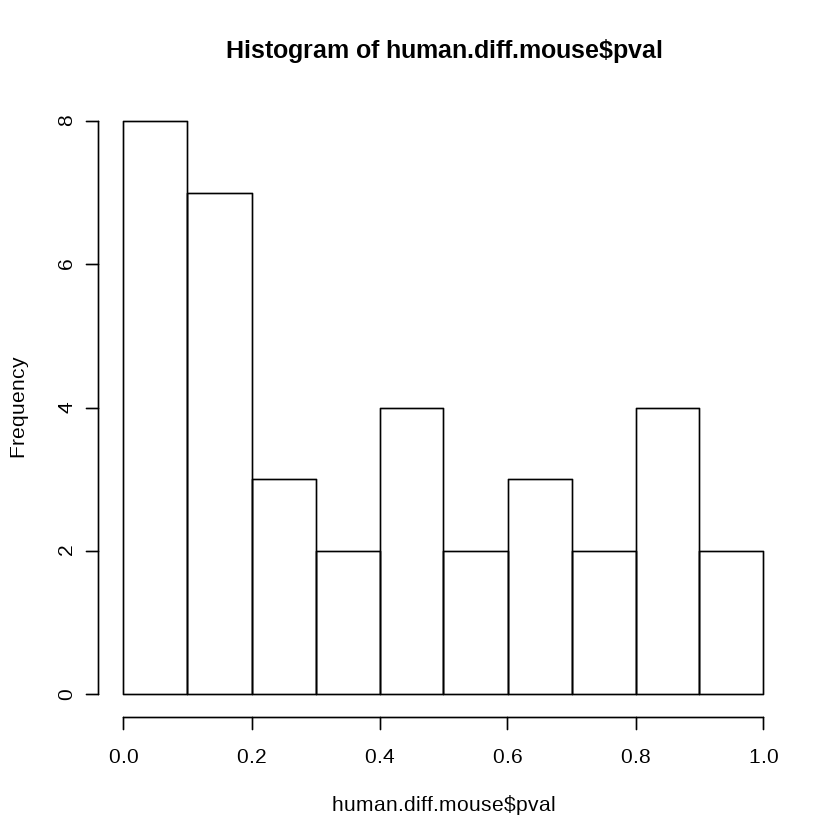

In [205]:
hist(human.diff.mouse$pval)

In [206]:
human.diff.mouse$adj.p = p.adjust(human.diff.mouse$pval, method="fdr")

In [207]:
human.diff.mouse$holm = p.adjust(human.diff.mouse$pval, method="holm")

In [208]:
sum(human.diff.mouse$adj.p < 0.10)

[1] 5

In [209]:
sum(human.diff.mouse$holm < 0.05)

[1] 0

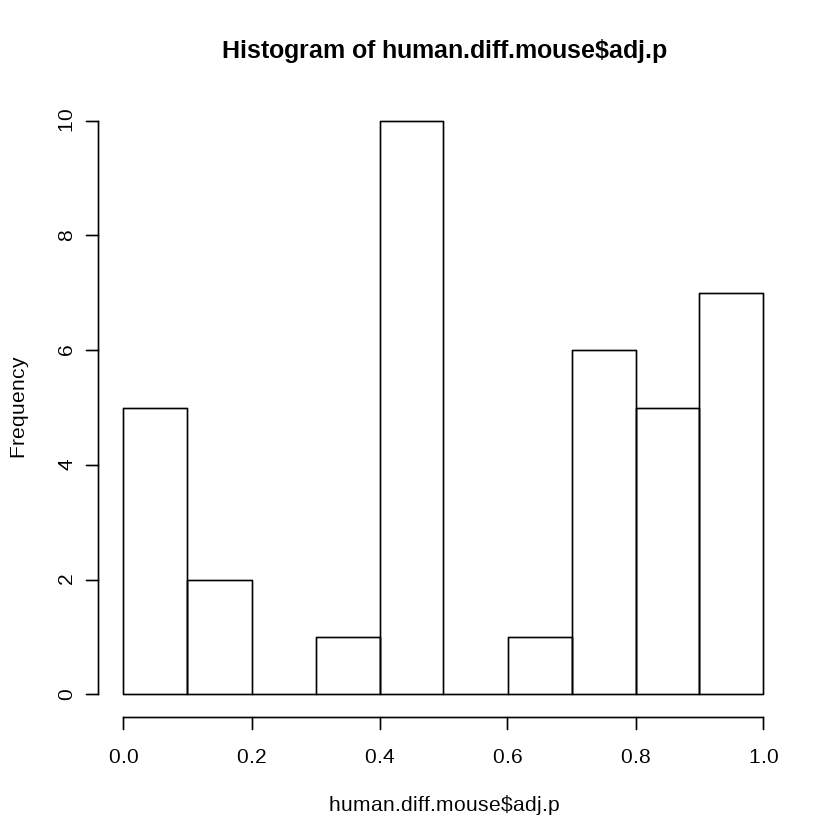

In [185]:
hist(human.diff.mouse$adj.p)

#### Comparison with monkey

In [210]:
monkey.to.human = getBM(attributes = c("ensembl_gene_id", "illumina_humanht_12_v4"),
                        filters="illumina_humanht_12_v4",
                        values = monkey.genes, mart = human)

In [211]:
monkey.to.human

ensembl_gene_id,illumina_humanht_12_v4
ENSG00000278426,ILMN_1679238
ENSG00000264357,ILMN_2360401
ENSG00000276628,ILMN_1679238
ENSG00000277457,ILMN_1679238
ENSG00000278257,ILMN_1679238
ENSG00000276774,ILMN_1679238
ENSG00000275935,ILMN_1679238
ENSG00000185875,ILMN_1782688
ENSG00000276959,ILMN_1679238
ENSG00000105617,ILMN_1679238


In [212]:
human.exprs.monkey = human.exprs.log.6mo[,colnames(human.exprs.log.6mo) %in% monkey.to.human$ensembl_gene_id]

In [214]:
human.diff.monkey = row.kruskal.wallis(t(human.exprs.monkey), human.pheno.6mo$time.from.exposure.months)

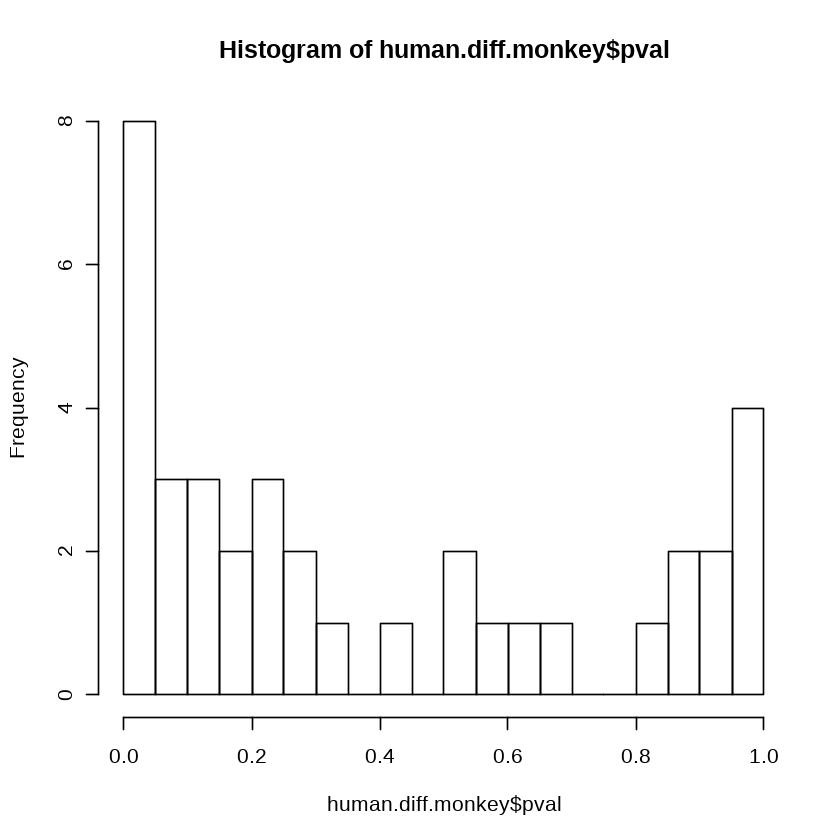

In [220]:
hist(human.diff.monkey$pval, breaks=20)

In [217]:
human.diff.monkey$adj.p = p.adjust(human.diff.monkey$pval, method="fdr")
human.diff.monkey$holm = p.adjust(human.diff.monkey$pval, method="holm")

sum(human.diff.monkey$adj.p < 0.05)

sum(human.diff.monkey$holm < 0.05)

[1] 2

[1] 2

In [218]:
sum(p.adjust(human.diff.monkey$pval, method="bonferroni") < 0.05)

[1] 2

In [ ]:
monkey.to.human = getBM(attributes = c("hgnc_symbol"),
          filters = c("hgnc_symbol"),
          values = c(posGenes, negGenes), mart = human,
          attributesL = c('mgi_symbol', "illumina_mousewg_6_v2"),
          #filtersL = c("illumina_mousewg_6_v2"),
          martL=mouse)

In [183]:
p.adjust

function (p, method = p.adjust.methods, n = length(p)) 
{
    method <- match.arg(method)
    if (method == "fdr") 
        method <- "BH"
    nm <- names(p)
    p <- as.numeric(p)
    p0 <- setNames(p, nm)
    if (all(nna <- !is.na(p))) 
        nna <- TRUE
    p <- p[nna]
    lp <- length(p)
    stopifnot(n >= lp)
    if (n <= 1) 
        return(p0)
    if (n == 2 && method == "hommel") 
        method <- "hochberg"
    p0[nna] <- switch(method, bonferroni = pmin(1, n * p), holm = {
        i <- seq_len(lp)
        o <- order(p)
        ro <- order(o)
        pmin(1, cummax((n - i + 1L) * p[o]))[ro]
    }, hommel = {
        if (n > lp) p <- c(p, rep.int(1, n - lp))
        i <- seq_len(n)
        o <- order(p)
        p <- p[o]
        ro <- order(o)
        q <- pa <- rep.int(min(n * p/i), n)
        for (j in (n - 1):2) {
            ij <- seq_len(n - j + 1)
            i2 <- (n - j + 2):n
            q1 <- min(j * p[i2]/(2:j))
            q[ij] <- pmin(j * p[ij], q1)
            q[i2] <- q[n - j + 1]
            pa <- pmax(pa, q)
        }
        pmax(pa, p)[if (lp < n) ro[1:lp] else ro]
    }, hochberg = {
        i <- lp:1L
        o <- order(p, decreasing = TRUE)
        ro <- order(o)
        pmin(1, cummin((n - i + 1L) * p[o]))[ro]
    }, BH = {
        i <- lp:1L
        o <- order(p, decreasing = TRUE)
        ro <- order(o)
        pmin(1, cummin(n/i * p[o]))[ro]
    }, BY = {
        i <- lp:1L
        o <- order(p, decreasing = TRUE)
        ro <- order(o)
        q <- sum(1L/(1L:n))
        pmin(1, cummin(q * n/i * p[o]))[ro]
    }, none = p)
    p0
}
<bytecode: 0x4bc379a8>
<environment: namespace:stats>

In [181]:
human.diff.mouse

stat,pval,ebp
1.7089877651,0.191116755,0.57778697
0.0883502762,0.766285008,0.72162147
0.2458829008,0.619989090,0.71854075
0.0089082543,0.924804484,1.00000000
0.0452477404,0.831549139,0.72261794
1.4002370772,0.236683880,0.70318967
0.2083209856,0.648086593,0.71969244
1.6217348969,0.202850051,0.60559600
9.3188178686,0.002268123,0.02215039
0.5304251249,0.466428183,0.71231098


### Determine the Set intersections of differentially expressed genes in all species

- Do Wilcoxon text with FDR 0.05 in each species (probes for mice and monkeys, genes for humans)
- Map the differentially expressed mice and monkey probes to human genes
- Find all the set overlaps, do Fischer exact test (from total genes used in wilcoxon test), make one of those set overlap diagrams

#### Determine the differentially expressed genes within each species, and convert all identifiers to human genes

In [283]:
# Mouse
dim(mouse.tb.fil)
summary(pheno.data)

[1]   20 1650

     strain   infection.status time.point.days         tissue      gender  
 C57BL/6:20   Mtb:20           Min.   : 30     Whole Blood:20   female:20  
                               1st Qu.: 60                                 
                               Median : 90                                 
                               Mean   : 90                                 
                               3rd Qu.:120                                 
                               Max.   :150                                 
    stage          
 Length:20         
 Class :character  
 Mode  :character  
                   
                   
                   

In [286]:
# Monkey
dim(expres)
dim(pheno)

[1]  294 9050

[1] 294  13

In [294]:
# Human
dim(human.pheno.6mo)
dim(human.exprs.log.6mo)
summary(human.pheno.6mo)

[1] 183  10

[1]   183 14842

      age             code     gender        group       site       subjectid  
 Min.   :15.00   1002   :  1   F:110   case (TB): 48   AHRI: 40   08/G143:  2  
 1st Qu.:19.50   1007   :  1   M: 73   Control  :135   MRC :143   08/G260:  2  
 Median :24.00   1009   :  1                                      08/G324:  2  
 Mean   :28.44   1010   :  1                                      08/G367:  2  
 3rd Qu.:35.00   1011   :  1                                      08/G433:  2  
 Max.   :60.00   1014   :  1                                      08/G434:  2  
                 (Other):177                                      (Other):171  
 time.from.exposure.months time.to.tb.months     dataset       status         
 Min.   :0.00              Min.   : 3.00     Test    : 68   Length:183        
 1st Qu.:0.00              1st Qu.: 7.00     Training:115   Class :character  
 Median :0.00              Median :11.00                    Mode  :character  
 Mean   :2.59              Mean   :12.58    

In [293]:
#human.pheno.6mo$time.point = as.factor(ifelse(human.pheno.6mo$time.from.exposure.months == 0, "early","late"))
# human.pheno.6mo$time.point = NULL

In [295]:
human.kruskal = row.kruskal.wallis(t(human.exprs.log.6mo), human.pheno.6mo$time.from.exposure.months)
human.kruskal$adj.p = p.adjust(human.kruskal$pval, method="fdr")

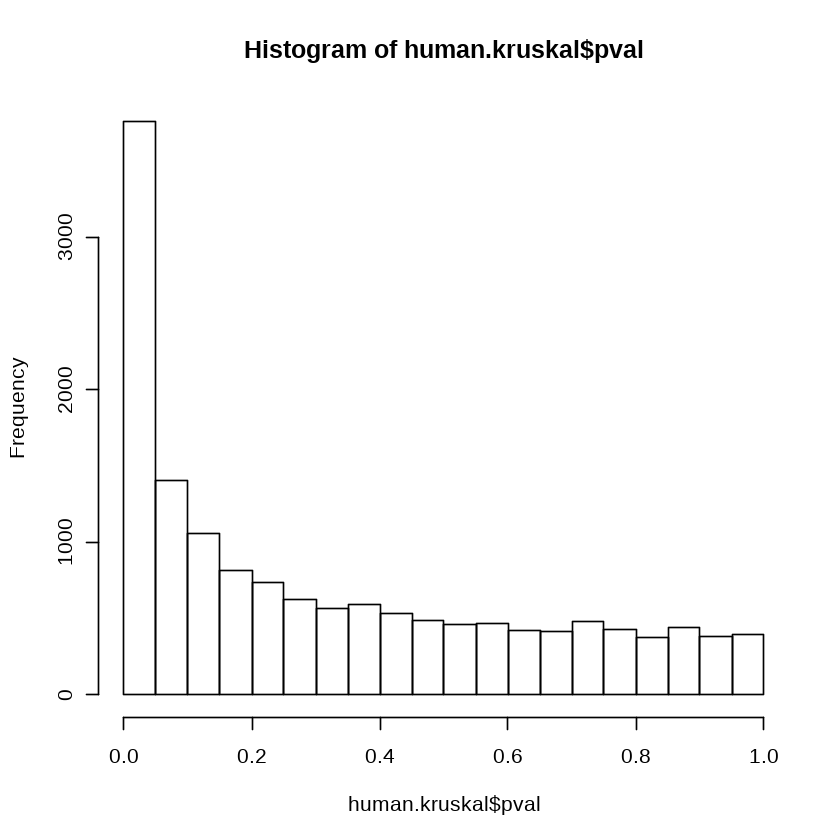

In [297]:
hist(human.kruskal$pval)

In [298]:
monkey.kruskal = row.kruskal.wallis(t(expres), pheno$time.period)
monkey.kruskal$adj.p = p.adjust(monkey.kruskal$pval, method="fdr")

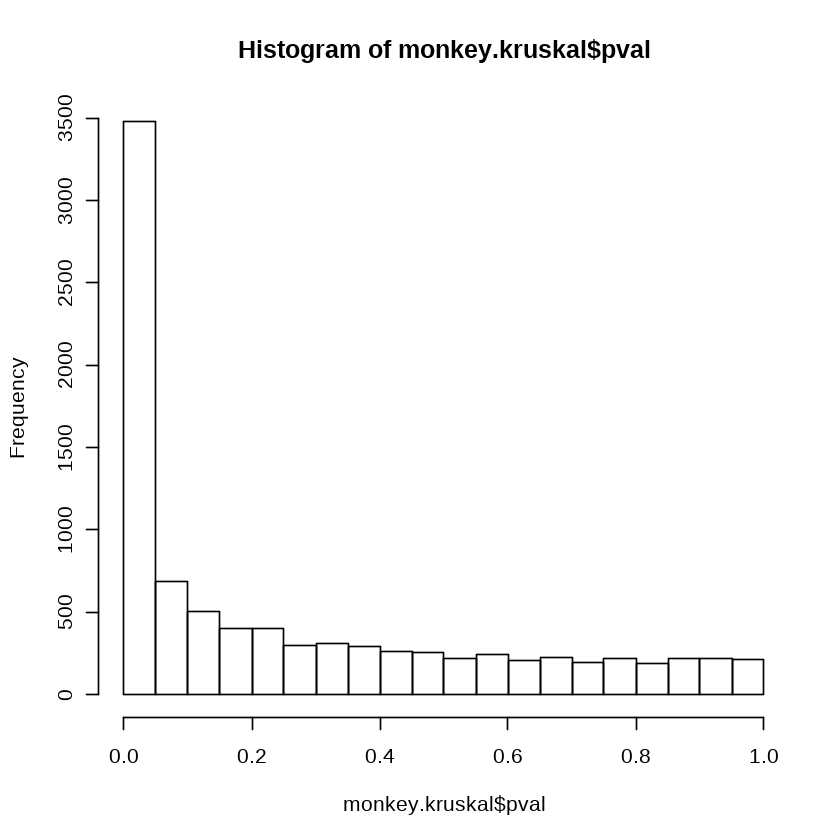

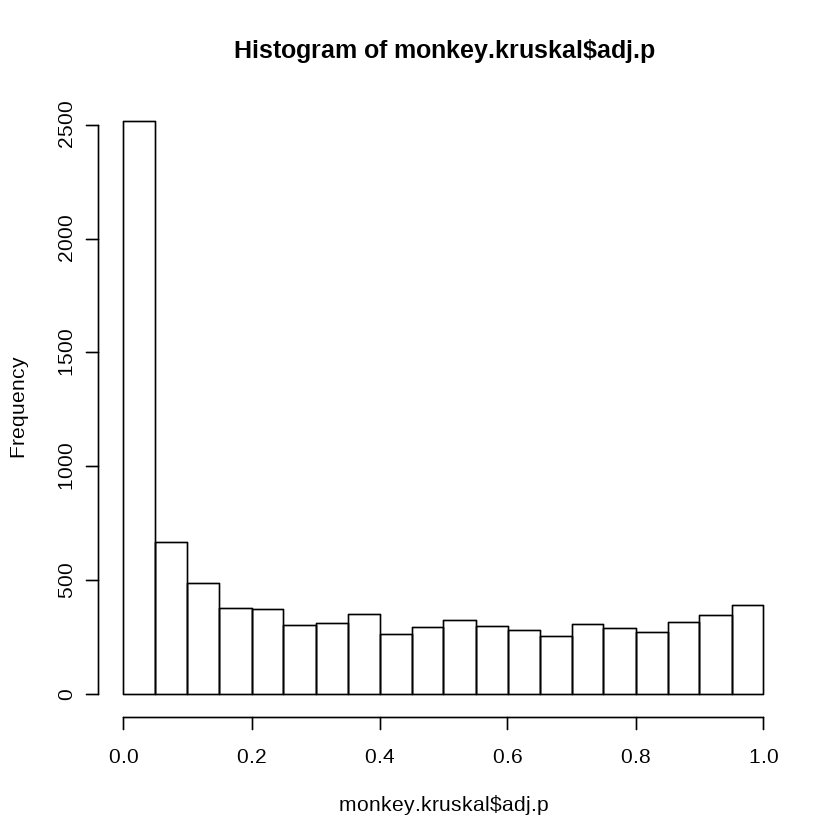

In [324]:
hist(monkey.kruskal$pval)

In [300]:
mouse.kruskal = row.kruskal.wallis(t(mouse.tb.fil), pheno.data$stage)
mouse.kruskal$adj.p = p.adjust(mouse.kruskal$pval, method="fdr")

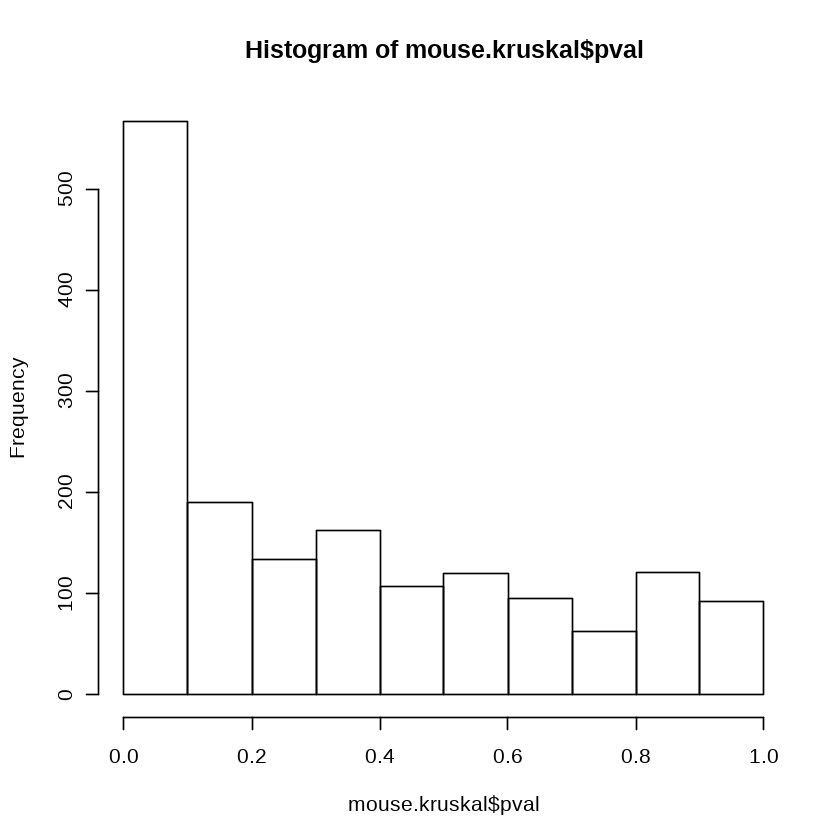

In [301]:
hist(mouse.kruskal$pval)

In [302]:
sum(human.kruskal$adj.p < 0.05)

sum(monkey.kruskal$adj.p < 0.05)

sum(mouse.kruskal$adj.p < 0.05)

[1] 801

[1] 2517

[1] 195

In [309]:
human.diff.genes = colnames(human.exprs.log.6mo)[human.kruskal$adj.p < 0.05]

monkey.diff.genes = colnames(expres)[monkey.kruskal$adj.p < 0.05]

mouse.diff.genes = colnames(mouse.tb.fil)[mouse.kruskal$adj.p < 0.05]

In [310]:
length(human.diff.genes)
length(monkey.diff.genes)
length(mouse.diff.genes)

[1] 801

[1] 2517

[1] 195

In [305]:
summary(mouse.kruskal)

      stat              pval                ebp              adj.p       
 Min.   : 0.0000   Min.   :0.0002128   Min.   :0.00418   Min.   :0.0145  
 1st Qu.: 0.2917   1st Qu.:0.0372425   1st Qu.:0.15603   1st Qu.:0.1439  
 Median : 1.3393   Median :0.2471600   Median :0.38567   Median :0.4908  
 Mean   : 2.8602   Mean   :0.3323866   Mean   :0.36866   Mean   :0.4707  
 3rd Qu.: 4.3393   3rd Qu.:0.5891545   3rd Qu.:0.57319   3rd Qu.:0.7595  
 Max.   :13.7143   Max.   :1.0000000   Max.   :1.00000   Max.   :1.0000  

In [311]:
monkey.diff.to.human = getBM(attributes = c("ensembl_gene_id", "illumina_humanht_12_v4"),
                        filters="illumina_humanht_12_v4",
                        values = monkey.diff.genes, mart = human)

mouse.diff.to.human = getLDS(attributes = c('mgi_symbol', "illumina_mousewg_6_v2"),
 filters = c("illumina_mousewg_6_v2"),
    values = mouse.diff.genes, mart = mouse,
    #values = as.character(impvar[1:10]), mart = mouse,
    attributesL = c("hgnc_symbol", "ensembl_gene_id"),
      #filtersL = c("illumi,a_mousewg_6_v2"),
        martL=human)

In [313]:
dim(monkey.diff.to.human)
dim(mouse.diff.to.human)

[1] 3126    2

[1] 182   4

In [316]:
monkey.mapped.genes = unique(monkey.diff.to.human$ensembl_gene_id)
mouse.mapped.genes = unique(mouse.diff.to.human$Gene.stable.ID)

In [317]:
length(monkey.mapped.genes)
length(mouse.mapped.genes)

[1] 2869

[1] 157

In [315]:
head(mouse.diff.to.human)

MGI.symbol,ILLUMINA.MouseWG.6.V2.probe,HGNC.symbol,Gene.stable.ID
Ckap2,ILMN_2687628,CKAP2,ENSG00000136108
Inpp5k,ILMN_1248392,INPP5K,ENSG00000132376
Rnd3,ILMN_1230157,RND3,ENSG00000115963
Parm1,ILMN_2756704,PARM1,ENSG00000169116
Trav6-3,ILMN_2514749,TRAV9-2,ENSG00000211793
Cdca8,ILMN_2588362,CDCA8,ENSG00000134690


#### Examine the overlap of genes between all 3 species, starting with pairwise overlaps

In [320]:
length(intersect(human.diff.genes, monkey.mapped.genes))
length(intersect(human.diff.genes, mouse.mapped.genes))
length(intersect(monkey.mapped.genes, mouse.mapped.genes))

[1] 120

[1] 4

[1] 16

In [321]:
if (!require("GeneOverlap")) {
  biocLite("GeneOverlap")
  library("GeneOverlap")
}


Loading required package: GeneOverlap
Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘GeneOverlap’”BioC_mirror: https://bioconductor.org
Using Bioconductor 3.6 (BiocInstaller 1.28.0), R 3.4.3 (2017-11-30).
Installing package(s) ‘GeneOverlap’
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Old packages: 'assertthat', 'backports', 'BH', 'bindr', 'bindrcpp', 'bit',
  'blob', 'boot', 'broom', 'Cairo', 'callr', 'caret', 'caTools', 'checkmate',
  'checkpoint', 'CircStats', 'class', 'cli', 'clipr', 'cluster', 'codetools',
  'colorspace', 'config', 'curl', 'CVST', 'data.table', 'DBI', 'dbplyr',
  'ddalpha', 'DiagrammeR', 'digest', 'dimRed', 'doParallel', 'dotCall64',
  'dplyr', 'DRR', 'DT', 'dtangle', 'dtw', 'e1071', 'epiR', 'evaluate',
  'exprso', 'fields', 'FNN', 'forcats', 'foreach', 'foreign', 'formatR',
  'Formula', 'gbm', 'GGally', 'ggplot2', 'ggplotify', 'ggpmisc', 'ggpubr',

In [328]:
go.human.monkey = newGeneOverlap(human.diff.genes, monkey.mapped.genes, genome.size=dim(human.exprs.log.6mo)[2])

testGeneOverlap(go.human.monkey)

GeneOverlap object:
listA size=801
listB size=2869
Intersection size=120
Overlapping p-value=1
Jaccard Index=0.0

In [338]:
go.human.monkey = newGeneOverlap(human.diff.genes, monkey.mapped.genes, genome.size=25000)

testGeneOverlap(go.human.monkey)

GeneOverlap object:
listA size=801
listB size=2869
Intersection size=120
Overlapping p-value=1.3e-03
Jaccard Index=0.0

In [339]:
go.mouse.monkey = newGeneOverlap(mouse.mapped.genes, monkey.mapped.genes, genome.size=23000)

testGeneOverlap(go.mouse.monkey)

GeneOverlap object:
listA size=157
listB size=2869
Intersection size=16
Overlapping p-value=0.84
Jaccard Index=0.0

In [325]:
dim(human.exprs.log.6mo)[2]

[1] 14842

In [326]:
newGeneOverlap

function (listA, listB, genome.size = NULL, spec = c("mm9.gene", 
    "hg19.gene", "rn4.gene")) 
{
    listA <- unique(as.character(listA))
    listB <- unique(as.character(listB))
    listA <- listA[!is.na(listA)]
    listB <- listB[!is.na(listB)]
    if (is.null(genome.size)) {
        spec <- match.arg(spec)
        genome.size <- switch(spec, mm9.gene = 23000, hg19.gene = 25000, 
            rn4.gene = 17000)
    }
    genome.size <- as.integer(genome.size)
    new("GeneOverlap", listA = listA, listB = listB, intersection = intersect(listA, 
        listB), union = union(listA, listB), genome.size = genome.size, 
        is.tested = F)
}
<environment: namespace:GeneOverlap>

In [332]:
dim(human.exprs)

[1] 15676   415

In [333]:
human.exprs.set

,symbol,X579,X567,X544,X582,X527,X521,X655,X663,X660,⋯,X1042,X1061,X1062,X1084,X1103,X1164,X1183,X1194,X1196,X1198
ENSG00000000003,TSPAN6,52,10,19,26,39,25,7,30,41,⋯,0,18,20,8,10,16,20,11,16,6
ENSG00000000419,DPM1,1370,272,616,615,768,558,393,451,711,⋯,360,781,502,493,355,864,646,1477,578,404
ENSG00000000457,SCYL3,1125,431,1007,728,786,728,887,821,1052,⋯,923,1129,664,831,949,817,847,1047,1203,707
ENSG00000000460,C1orf112,120,80,189,66,110,110,161,132,154,⋯,49,68,89,86,101,105,101,228,83,224
ENSG00000000938,FGR,43993,18043,35925,25459,31828,29350,48542,29309,48302,⋯,36065,36276,37804,50409,41462,46155,39353,47557,44136,31176
ENSG00000000971,CFH,212,167,61,60,148,97,96,43,162,⋯,81,8,82,99,77,59,51,110,62,0
ENSG00000001036,FUCA2,932,769,1071,473,913,884,1428,779,1172,⋯,899,1227,869,1001,1305,671,834,792,1470,880
ENSG00000001084,GCLC,666,1296,753,362,776,369,649,694,790,⋯,816,684,617,496,1033,595,672,764,855,564
ENSG00000001167,NFYA,1508,914,1463,1027,1420,1087,1541,1164,1624,⋯,1109,977,1294,1508,1435,1306,1444,2019,1931,832
ENSG00000001460,STPG1,86,91,206,139,200,179,141,210,153,⋯,120,141,139,112,150,138,138,202,184,282


In [334]:
dim(human.exprs.set)

[1] 15676   419